In [1]:
%pwd

'/home/acr/Documents/Projeto Sistemas Mecatrónicos/Demand Response'

In [2]:
import gym
import Antonio_FlexEnv as flex

import Antonio_auxfunctions as fun

import stable_baselines3

from stable_baselines3 import DQN, A2C
from stable_baselines3.a2c.policies import MlpPolicy

from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.env_checker import check_env

from stable_baselines3 import SAC
from stable_baselines3 import DDPG

from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env

from stable_baselines3.ddpg.policies import MlpPolicy


import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy.random as rnd
import time
import random as rnd

from time import perf_counter


# Data and Environment preparation

In [3]:
#Data
cwd=os.getcwd()
datafolder=cwd + '/Data'

#impor the data csv
env_data=pd.read_csv(datafolder + '/env_data.csv', header = None)

#make and check the environment
# Select the number of timesteps to consider
# timesteps=141
timesteps=47

#Create environment. Based on the aux functions code.
env=fun.make_env(env_data, load_num=4, timestep=timesteps, soc_max=2, eta=0.95, charge_lim=3)

In [4]:
env.observation_space

Box([   0.    0.    0.    0.    0.    0. -100.    0. -100.], [ 47.  10.  10.   2.   2.   1. 100.   1. 100.], (9,), float32)

In [5]:
env.observation_space.high[3]

2.0

In [6]:
env.action_space

Discrete(15)

In [7]:
# help(env.action_space)

In [8]:
# charge_steps

In [9]:
data=env_data
load_num=4
timestep=timesteps

env_data
env_data1=data.to_numpy()
load=env_data1[0:timestep,load_num]
gen=abs(env_data1[0:timestep,1])
data1=np.vstack((0.5*gen,6*load)).T

In [10]:
env_data

,0,1,2,3,4,5,6,7,8,9,10,11
0,2017-01-01 00:00:00,0.0,0.023,0.489,0.033,0.039,0.082,0.326,0.786,0.016,0.238,0.084
1,2017-01-01 00:30:00,-0.0,0.046,0.490,0.075,0.040,0.099,0.224,0.759,0.013,0.442,0.082
2,2017-01-01 01:00:00,-0.0,0.020,0.493,0.031,0.086,0.088,0.132,0.771,0.008,0.395,0.125
3,2017-01-01 01:30:00,-0.0,0.042,0.494,0.084,0.133,0.104,0.203,0.727,0.016,0.283,0.118
4,2017-01-01 02:00:00,-0.0,0.032,0.503,0.095,0.064,0.077,0.063,0.711,0.033,0.450,0.159
...,...,...,...,...,...,...,...,...,...,...,...,...
8683,2017-06-30 21:30:00,-0.0,0.085,0.123,0.092,0.131,0.072,0.227,0.344,0.007,0.190,0.171
8684,2017-06-30 22:00:00,-0.0,0.025,0.116,0.129,0.133,0.030,0.199,0.332,0.041,0.144,0.174
8685,2017-06-30 22:30:00,-0.0,0.059,0.111,0.089,0.096,0.059,0.192,0.276,0.035,0.407,0.211
8686,2017-06-30 23:00:00,-0.0,0.024,0.094,0.093,0.067,0.083,0.193,0.283,0.090,0.169,0.178


In [11]:
env_data[4]

0       0.033
1       0.075
2       0.031
3       0.084
4       0.095
        ...  
8683    0.092
8684    0.129
8685    0.089
8686    0.093
8687    0.078
Name: 4, Length: 8688, dtype: float64

In [12]:
env_data1.shape # 1a coluna é a data, 2a é a geração, 3a a 12a são colunas de gastos energéticos

(8688, 12)

In [13]:
env_data1

array([['2017-01-01 00:00:00', 0.0, 0.023, ..., 0.016, 0.238, 0.084],
       ['2017-01-01 00:30:00', -0.0, 0.046, ..., 0.013, 0.442, 0.082],
       ['2017-01-01 01:00:00', -0.0, 0.02, ..., 0.008, 0.395, 0.125],
       ...,
       ['2017-06-30 22:30:00', -0.0, 0.059, ..., 0.035, 0.407, 0.211],
       ['2017-06-30 23:00:00', -0.0, 0.024, ..., 0.09, 0.169, 0.178],
       ['2017-06-30 23:30:00', -0.0, 0.056, ..., 0.099, 0.18, 0.257]],
      dtype=object)

In [14]:
load.shape

(47,)

In [15]:
env_data1[0:timestep,4] # É só um dia de dados 

array([0.033, 0.075, 0.031, 0.084, 0.095, 0.106, 0.099, 0.042, 0.071,
       0.028, 0.076, 0.037, 0.064, 0.054, 0.097, 0.12, 0.074, 0.079,
       0.034, 0.068, 0.05, 0.053, 0.062, 0.037, 0.121, 0.073, 0.12, 0.048,
       0.057, 0.06, 0.042, 0.075, 0.025, 0.077, 0.088, 0.111, 0.098,
       0.053, 0.065, 0.036, 0.075, 0.026, 0.073, 0.042, 0.098, 0.107,
       0.09], dtype=object)

In [16]:
data1 # # Duas colunas, a primeira retrata a geração, a segunda representa os gastos energéticos da casa 

array([[0.0, 0.198],
       [0.0, 0.44999999999999996],
       [0.0, 0.186],
       [0.0, 0.504],
       [0.0, 0.5700000000000001],
       [0.0, 0.636],
       [0.0, 0.5940000000000001],
       [0.0, 0.252],
       [0.0, 0.42599999999999993],
       [0.0, 0.168],
       [0.0, 0.45599999999999996],
       [0.0, 0.22199999999999998],
       [0.0, 0.384],
       [0.0, 0.324],
       [0.0, 0.5820000000000001],
       [0.0, 0.72],
       [0.012, 0.44399999999999995],
       [0.05, 0.474],
       [0.115, 0.20400000000000001],
       [0.1975, 0.40800000000000003],
       [0.298, 0.30000000000000004],
       [0.3535, 0.318],
       [0.379, 0.372],
       [0.419, 0.22199999999999998],
       [0.551, 0.726],
       [0.4715, 0.43799999999999994],
       [0.3345, 0.72],
       [0.4165, 0.28800000000000003],
       [0.3045, 0.342],
       [0.1135, 0.36],
       [0.141, 0.252],
       [0.1525, 0.44999999999999996],
       [0.076, 0.15000000000000002],
       [0.029, 0.46199999999999997],
       [0.0

In [17]:
data1.shape

(47, 2)

In [18]:
np.vstack((1.5*gen,6*load))

array([[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
        0.0, 0.0, 0.0, 0.036000000000000004, 0.15000000000000002,
        0.34500000000000003, 0.5925, 0.8939999999999999, 1.0605, 1.137,
        1.257, 1.653, 1.4144999999999999, 1.0035, 1.2494999999999998,
        0.9135, 0.3405, 0.42299999999999993, 0.4575, 0.22799999999999998,
        0.08700000000000001, 0.013499999999999998, 0.0, 0.0, 0.0, 0.0,
        0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
       [0.198, 0.44999999999999996, 0.186, 0.504, 0.5700000000000001,
        0.636, 0.5940000000000001, 0.252, 0.42599999999999993, 0.168,
        0.45599999999999996, 0.22199999999999998, 0.384, 0.324,
        0.5820000000000001, 0.72, 0.44399999999999995, 0.474,
        0.20400000000000001, 0.40800000000000003, 0.30000000000000004,
        0.318, 0.372, 0.22199999999999998, 0.726, 0.43799999999999994,
        0.72, 0.28800000000000003, 0.342, 0.36, 0.252,
        0.44999999999999996, 0.15000000000000002, 0.4619999999

# Generation values
Data analysis to understand the data of the PV's

In [19]:
# Values of generation
env_data[1].value_counts()

0.000    4107
1.764     105
0.003      43
0.001      36
0.002      35
         ... 
0.866       1
1.330       1
1.730       1
1.740       1
0.804       1
Name: 1, Length: 1570, dtype: int64

In [20]:
env_data[env_data[1] ==1.764][0] # Dias e horas para as quais a geração de energia é maior

1849    2017-02-08 12:30:00
1850    2017-02-08 13:00:00
2426    2017-02-20 13:00:00
3002    2017-03-04 13:00:00
3145    2017-03-07 12:30:00
               ...         
6648    2017-05-19 12:00:00
6649    2017-05-19 12:30:00
6695    2017-05-20 11:30:00
6696    2017-05-20 12:00:00
6697    2017-05-20 12:30:00
Name: 0, Length: 105, dtype: object

In [21]:
df_generation = 0

In [22]:
# pd.options.mode.chained_assignment = None 

df_generation = env_data[[0,1]]
df_generation.columns = ['Date','Generation']

In [23]:
df_generation['Date'] = pd.to_datetime(df_generation['Date'])

/tmp/ipykernel_152014/3725409118.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_generation['Date'] = pd.to_datetime(df_generation['Date'])


In [24]:
df_generation['Year'] = df_generation['Date'].apply(lambda time: time.year)
df_generation['Month'] = df_generation['Date'].apply(lambda time: time.month)
dmap = {1:'January',2:'February',3:'March',4:'April',5:'May',6:'June',7:'July',8:'August',9:'September',10:'October',11:'November',12:'December'}
df_generation['Month'] = df_generation['Month'].map(dmap)
df_generation['Day'] = df_generation['Date'].apply(lambda time: time.day)
df_generation['Day of Week'] = df_generation['Date'].apply(lambda time: time.dayofweek)
dmap1 = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
df_generation['Day of Week'] = df_generation['Day of Week'].map(dmap1)
df_generation['Hour'] = df_generation['Date'].apply(lambda time: time.hour)
df_generation['Minutes'] = df_generation['Date'].apply(lambda time: time.minute)

/tmp/ipykernel_152014/406952806.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_generation['Year'] = df_generation['Date'].apply(lambda time: time.year)
/tmp/ipykernel_152014/406952806.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_generation['Month'] = df_generation['Date'].apply(lambda time: time.month)
/tmp/ipykernel_152014/406952806.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See

In [25]:
df_generation

,Date,Generation,Year,Month,Day,Day of Week,Hour,Minutes
0,2017-01-01 00:00:00,0.0,2017,January,1,Sun,0,0
1,2017-01-01 00:30:00,-0.0,2017,January,1,Sun,0,30
2,2017-01-01 01:00:00,-0.0,2017,January,1,Sun,1,0
3,2017-01-01 01:30:00,-0.0,2017,January,1,Sun,1,30
4,2017-01-01 02:00:00,-0.0,2017,January,1,Sun,2,0
...,...,...,...,...,...,...,...,...
8683,2017-06-30 21:30:00,-0.0,2017,June,30,Fri,21,30
8684,2017-06-30 22:00:00,-0.0,2017,June,30,Fri,22,0
8685,2017-06-30 22:30:00,-0.0,2017,June,30,Fri,22,30
8686,2017-06-30 23:00:00,-0.0,2017,June,30,Fri,23,0


In [26]:
df_generation[df_generation['Generation']==1.764]['Hour'].value_counts()
# Determining the hours at which the generation is the biggest

12    61
13    36
11     8
Name: Hour, dtype: int64

In [27]:
df_generation[df_generation['Generation']==1.764]['Month'].value_counts()
# Determining the months at which the generation is the biggest

April       48
March       42
May         12
February     3
Name: Month, dtype: int64

In [28]:
df_generation[df_generation['Generation']==0]['Hour'].value_counts()
# Determining the hours at which the generation is non existential

0     362
1     362
2     362
3     362
4     362
20    362
21    362
22    362
23    362
5     252
19    236
6     164
18    110
7      72
17     15
Name: Hour, dtype: int64

# Stable Baselines ALGORITHMS

Uncomment the algorithm

In [29]:
##DQN
## parameters
gamma=0.99
learning_rate=1e-3
buffer_size=1e6

exploration_fraction=0.01
exploration_final_eps=0.02 
exploration_initial_eps=1.0
train_freq=1
batch_size=32
double_q=True
learning_starts=1000
target_network_update_freq=500

prioritized_replay=False
prioritized_replay_alpha=0.6
prioritized_replay_beta0=0.4
prioritized_replay_beta_iters=None
prioritized_replay_eps=1e-06
param_noise=True
n_cpu_tf_sess=None
verbose=0 
tensorboard_log=None
_init_setup_model=True
policy_kwargs=None
full_tensorboard_log=False
seed=None
# Policy='LnMlpPolicy'

t1_start = perf_counter()

## Train model
model = DQN('MlpPolicy', env, learning_rate=learning_rate, verbose=1,batch_size=batch_size,exploration_fraction=exploration_fraction,)
model.learn(total_timesteps=int(2.7e6))

t1_stop = perf_counter()
print("\nElapsed time:", t1_stop, t1_start)
print("Elapsed time during the whole program in seconds:", t1_stop-t1_start)

##Proximal Policy Optimization
# model = PPO("MlpPolicy", env, verbose=1)
# model.learn(total_timesteps=4e5)


## Other algorithms
#SAC
# model = SAC('MlpPolicy', env, verbose=2).learn(total_timesteps=1e5)

#A2C
# model = A2C(MlpPolicy, env, verbose=1)
# model.learn(total_timesteps=25000)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-332132.6
-334157.89999999997
-320161.00000000006
-307727.30000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.24e+05 |
|    exploration_rate | 0.993     |
| time/               |           |
|    episodes         | 4         |
|    fps              | 6260      |
|    time_elapsed     | 0         |
|    total_timesteps  | 188       |
-----------------------------------
-298661.0999999999
-335694.5
-321807.89999999997
-371098.39999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.28e+05 |
|    exploration_rate | 0.987     |
| time/               |           |
|    episodes         | 8         |
|    fps              | 6041      |
|    time_elapsed     | 0         |
|    total_timesteps  | 376       |
-----------

/home/acr/anaconda3/lib/python3.9/site-packages/torch/cuda/__init__.py:80: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return torch._C._cuda_getDeviceCount() > 0


-353073.60000000015
-314108.7000000001
-323097.6
-290092.0000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+05 |
|    exploration_rate | 0.98      |
| time/               |           |
|    episodes         | 12        |
|    fps              | 5602      |
|    time_elapsed     | 0         |
|    total_timesteps  | 564       |
-----------------------------------
-356054.8
-323538.5
-335398.30000000005
-277363.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+05 |
|    exploration_rate | 0.974     |
| time/               |           |
|    episodes         | 16        |
|    fps              | 5571      |
|    time_elapsed     | 0         |
|    total_timesteps  | 752       |
-----------------------------------
-359707.4000000001
-348793.10000000003
-314781.9000000001
-330987.89999999997
------------

-347433.5999999999
-312664.4000000001
-339312.4
-297082.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.19e+05 |
|    exploration_rate | 0.861     |
| time/               |           |
|    episodes         | 84        |
|    fps              | 5561      |
|    time_elapsed     | 0         |
|    total_timesteps  | 3948      |
-----------------------------------
-271812.39999999997
-323397.8
-303518.69999999995
-354105.89999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.19e+05 |
|    exploration_rate | 0.854     |
| time/               |           |
|    episodes         | 88        |
|    fps              | 5569      |
|    time_elapsed     | 0         |
|    total_timesteps  | 4136      |
-----------------------------------
-312316.6000000001
-310288.3
-308124.80000000005
-333086.19999999995
-----------

-343355.70000000007
-344527.2000000001
-317159.9
-338992.5000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.17e+05 |
|    exploration_rate | 0.742     |
| time/               |           |
|    episodes         | 156       |
|    fps              | 5547      |
|    time_elapsed     | 1         |
|    total_timesteps  | 7332      |
-----------------------------------
-275270.70000000007
-297293.39999999997
-333171.4
-322286.20000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.15e+05 |
|    exploration_rate | 0.735     |
| time/               |           |
|    episodes         | 160       |
|    fps              | 5527      |
|    time_elapsed     | 1         |
|    total_timesteps  | 7520      |
-----------------------------------
-317329.29999999993
-325287.39999999997
-296091.3999999999
-289442.800

-350752.4
-340534.10000000003
-315089.0999999999
-353290.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.2e+05 |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 228      |
|    fps              | 5597     |
|    time_elapsed     | 1        |
|    total_timesteps  | 10716    |
----------------------------------
-341781.60000000003
-281653.6000000001
-339658.9
-325376.39999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.2e+05 |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 232      |
|    fps              | 5600     |
|    time_elapsed     | 1        |
|    total_timesteps  | 10904    |
----------------------------------
-353403.9000000001
-305245.60000000003
-293597.8
-281348.8
----------------------------------
| rollou

-299486.3
-309844.69999999995
-281142.69999999995
-303628.30000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.2e+05 |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 300      |
|    fps              | 5604     |
|    time_elapsed     | 2        |
|    total_timesteps  | 14100    |
----------------------------------
-334936.30000000005
-272216.1
-287448.8
-351206.29999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+05 |
|    exploration_rate | 0.497     |
| time/               |           |
|    episodes         | 304       |
|    fps              | 5588      |
|    time_elapsed     | 2         |
|    total_timesteps  | 14288     |
-----------------------------------
-292962.70000000007
-309348.69999999995
-317827.70000000007
-293650.3
-------------------

-343244.80000000005
-351547.99999999994
-332620.30000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+05 |
|    exploration_rate | 0.385     |
| time/               |           |
|    episodes         | 372       |
|    fps              | 5611      |
|    time_elapsed     | 3         |
|    total_timesteps  | 17484     |
-----------------------------------
-279452.39999999997
-352209.6000000001
-308606.7999999999
-349129.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.19e+05 |
|    exploration_rate | 0.378     |
| time/               |           |
|    episodes         | 376       |
|    fps              | 5611      |
|    time_elapsed     | 3         |
|    total_timesteps  | 17672     |
-----------------------------------
-292820.20000000007
-297578.7
-341605.8
-313613.20000000007
--------------------

-317583.30000000005
-336381.8000000001
-328538.3000000001
-297700.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+05 |
|    exploration_rate | 0.266     |
| time/               |           |
|    episodes         | 444       |
|    fps              | 5627      |
|    time_elapsed     | 3         |
|    total_timesteps  | 20868     |
-----------------------------------
-316746.0
-302179.4
-353704.70000000007
-302461.50000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+05 |
|    exploration_rate | 0.259     |
| time/               |           |
|    episodes         | 448       |
|    fps              | 5630      |
|    time_elapsed     | 3         |
|    total_timesteps  | 21056     |
-----------------------------------
-326458.1
-309403.89999999997
-335530.80000000005
-340707.10000000003
----------

-380314.2
-351650.10000000003
-346681.29999999993
-335568.89999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.27e+05 |
|    exploration_rate | 0.147     |
| time/               |           |
|    episodes         | 516       |
|    fps              | 5610      |
|    time_elapsed     | 4         |
|    total_timesteps  | 24252     |
-----------------------------------
-332976.3
-343071.69999999995
-338057.60000000003
-325129.4000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.28e+05 |
|    exploration_rate | 0.14      |
| time/               |           |
|    episodes         | 520       |
|    fps              | 5601      |
|    time_elapsed     | 4         |
|    total_timesteps  | 24440     |
-----------------------------------
-355818.30000000005
-335631.0
-304359.3000000001
-293731.7
----------

-252099.60000000003
-301148.80000000005
-327788.30000000005
-312117.9000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 588       |
|    fps              | 5574      |
|    time_elapsed     | 4         |
|    total_timesteps  | 27636     |
-----------------------------------
-345723.00000000006
-365800.99999999994
-325338.29999999993
-311489.60000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 592       |
|    fps              | 5576      |
|    time_elapsed     | 4         |
|    total_timesteps  | 27824     |
-----------------------------------
-359244.8
-380146.7
-297424.99999999994
-297523.3

-366946.6
-368340.3999999999
-332010.2
-315572.19999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 660       |
|    fps              | 5560      |
|    time_elapsed     | 5         |
|    total_timesteps  | 31020     |
-----------------------------------
-280880.4
-351215.89999999997
-338299.7
-348579.1000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.26e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 664       |
|    fps              | 5563      |
|    time_elapsed     | 5         |
|    total_timesteps  | 31208     |
-----------------------------------
-298238.5
-322436.1000000001
-363308.6000000001
-322771.80000000005
----------------------

-310454.89999999997
-348304.8999999999
-338483.60000000003
-284239.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.28e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 732       |
|    fps              | 5583      |
|    time_elapsed     | 6         |
|    total_timesteps  | 34404     |
-----------------------------------
-285574.9
-323992.99999999994
-312092.60000000003
-332083.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.27e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 736       |
|    fps              | 5583      |
|    time_elapsed     | 6         |
|    total_timesteps  | 34592     |
-----------------------------------
-362001.70000000007
-341507.39999999997
-339207.9
-324454.9
-------------------

-309262.0
-312325.50000000006
-333374.80000000005
-326470.4999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.24e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 804       |
|    fps              | 5591      |
|    time_elapsed     | 6         |
|    total_timesteps  | 37788     |
-----------------------------------
-326031.4
-353789.70000000007
-364350.60000000003
-319318.60000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 808       |
|    fps              | 5592      |
|    time_elapsed     | 6         |
|    total_timesteps  | 37976     |
-----------------------------------
-291196.80000000005
-313354.19999999995
-316494.50000000006
-297728.8

-340857.69999999995
-289654.20000000007
-326256.79999999993
-332666.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 876       |
|    fps              | 5569      |
|    time_elapsed     | 7         |
|    total_timesteps  | 41172     |
-----------------------------------
-263643.6000000001
-322031.0999999999
-294400.69999999995
-313455.0999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 880       |
|    fps              | 5563      |
|    time_elapsed     | 7         |
|    total_timesteps  | 41360     |
-----------------------------------
-338304.5
-266483.1999999999
-324802.10000000003
-340093.4999

-333887.19999999995
-320350.7
-317403.3999999999
-299957.49999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.23e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 948       |
|    fps              | 5518      |
|    time_elapsed     | 8         |
|    total_timesteps  | 44556     |
-----------------------------------
-297264.99999999994
-277423.2
-293892.69999999995
-314523.70000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.22e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 952       |
|    fps              | 5513      |
|    time_elapsed     | 8         |
|    total_timesteps  | 44744     |
-----------------------------------
-343219.3
-307642.1
-307120.0
-275393.89999999997
-------------------

-329775.00000000006
-298142.10000000003
-324008.7999999999
-314931.29999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.17e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1020      |
|    fps              | 5478      |
|    time_elapsed     | 8         |
|    total_timesteps  | 47940     |
-----------------------------------
-292679.19999999995
-292268.5
-312107.8000000001
-301970.00000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.15e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1024      |
|    fps              | 5479      |
|    time_elapsed     | 8         |
|    total_timesteps  | 48128     |
-----------------------------------
-347267.60000000003
-369406.0000000002
-350086.80000000005
-

263.90000000000055
-40244.200000000004
1417.000000000001
6534.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.51e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1088      |
|    fps              | 4819      |
|    time_elapsed     | 10        |
|    total_timesteps  | 51136     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 609       |
|    n_updates        | 283       |
-----------------------------------
2204.6
-27978.0
-19439.6
-32420.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+05 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1092      |
|    fps              | 4735      |
|    time_elapsed     | 10        |
|    total_timesteps  | 51324     |
| 

2121.8999999999996
6205.0
3836.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1144      |
|    fps              | 3853      |
|    time_elapsed     | 13        |
|    total_timesteps  | 53768     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 547       |
|    n_updates        | 941       |
-----------------------------------
-565.9999999999991
3055.7999999999997
730.6000000000004
8176.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1148      |
|    fps              | 3801      |
|    time_elapsed     | 14        |
|    total_timesteps  | 53956     |
| tr

-24860.6
-64.10000000000042
5452.2
5813.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 615      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1204     |
|    fps              | 3247     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56588    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 288      |
|    n_updates        | 1646     |
----------------------------------
-5891.500000000001
8482.0
5545.2
5659.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 526      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1208     |
|    fps              | 3217     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56776    |
| train/              |          |
|    lea

-5027.0
6205.0
6489.4
1059.8000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 74.7     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1264     |
|    fps              | 2835     |
|    time_elapsed     | 20       |
|    total_timesteps  | 59408    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 673      |
|    n_updates        | 2351     |
----------------------------------
-6764.3
-2844.8
7256.2
-4098.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -117     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1268     |
|    fps              | 2810     |
|    time_elapsed     | 21       |
|    total_timesteps  | 59596    |
| train/              |          |
|    learning_rate

3228.3999999999996
7914.0
6205.0
6295.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 466      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1324     |
|    fps              | 2538     |
|    time_elapsed     | 24       |
|    total_timesteps  | 62228    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 443      |
|    n_updates        | 3056     |
----------------------------------
4349.8
-1100.6000000000004
4580.200000000001
2532.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 540      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1328     |
|    fps              | 2523     |
|    time_elapsed     | 24       |
|    total_timesteps  | 62416    |
| train/  

-794.5
4386.6
2203.8
1158.0999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1384     |
|    fps              | 2325     |
|    time_elapsed     | 27       |
|    total_timesteps  | 65048    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 377      |
|    n_updates        | 3761     |
----------------------------------
7230.4
-28999.2
6205.0
5108.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1388     |
|    fps              | 2313     |
|    time_elapsed     | 28       |
|    total_timesteps  | 65236    |
| train/              |          |
|    learning_rate  

6205.0
369.7999999999993
4195.8
8464.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1444     |
|    fps              | 2157     |
|    time_elapsed     | 31       |
|    total_timesteps  | 67868    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 410      |
|    n_updates        | 4466     |
----------------------------------
1452.2000000000007
5421.0
-354.60000000000036
-3116.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1448     |
|    fps              | 2147     |
|    time_elapsed     | 31       |
|    total_timesteps  | 68056    |
| train/              |         

-1395.7000000000003
-16734.8
3943.199999999999
-31538.300000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 561      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1504     |
|    fps              | 2022     |
|    time_elapsed     | 34       |
|    total_timesteps  | 70688    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 278      |
|    n_updates        | 5171     |
----------------------------------
-4514.100000000001
7666.6
-6162.4
12280.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 583      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1508     |
|    fps              | 2014     |
|    time_elapsed     | 35       |
|    total_timesteps  | 70876    |
| train/        

2204.6
2395.4
6336.8
4009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -137     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1564     |
|    fps              | 1915     |
|    time_elapsed     | 38       |
|    total_timesteps  | 73508    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 231      |
|    n_updates        | 5876     |
----------------------------------
120.40000000000009
6413.6
6358.0
2468.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -172     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1568     |
|    fps              | 1909     |
|    time_elapsed     | 38       |
|    total_timesteps  | 73696    |
| train/              |          |
|    learn

2621.8
-12948.8
-4384.2
730.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 680      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1624     |
|    fps              | 1818     |
|    time_elapsed     | 41       |
|    total_timesteps  | 76328    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 642      |
|    n_updates        | 6581     |
----------------------------------
8329.6
-9986.4
6173.8
1450.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 624      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1628     |
|    fps              | 1811     |
|    time_elapsed     | 42       |
|    total_timesteps  | 76516    |
| train/              |          |
|    learning_rate 

7173.4
-10837.5
8141.8
3170.9999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1684     |
|    fps              | 1731     |
|    time_elapsed     | 45       |
|    total_timesteps  | 79148    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 186      |
|    n_updates        | 7286     |
----------------------------------
5183.4
8159.599999999999
4009.0
7969.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1688     |
|    fps              | 1727     |
|    time_elapsed     | 45       |
|    total_timesteps  | 79336    |
| train/              |          

8958.0
10534.6
-1073.8000000000002
-14925.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1744     |
|    fps              | 1666     |
|    time_elapsed     | 49       |
|    total_timesteps  | 81968    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 418      |
|    n_updates        | 7991     |
----------------------------------
-6740.400000000001
-9628.0
3604.6000000000004
7914.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1748     |
|    fps              | 1662     |
|    time_elapsed     | 49       |
|    total_timesteps  | 82156    |
| train/              |     

8065.2
196.80000000000018
-4236.3
-15274.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1804     |
|    fps              | 1609     |
|    time_elapsed     | 52       |
|    total_timesteps  | 84788    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 341      |
|    n_updates        | 8696     |
----------------------------------
-18326.0
-8778.0
3911.2
2565.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 806      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1808     |
|    fps              | 1606     |
|    time_elapsed     | 52       |
|    total_timesteps  | 84976    |
| train/              |          |
|    

1279.0
-88.79999999999973
-2299.8999999999996
6895.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.71e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1864     |
|    fps              | 1559     |
|    time_elapsed     | 56       |
|    total_timesteps  | 87608    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 258      |
|    n_updates        | 9401     |
----------------------------------
4730.6
3912.6
3912.4
11045.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1868     |
|    fps              | 1557     |
|    time_elapsed     | 56       |
|    total_timesteps  | 87796    |
| train/              |          |
|    lea

10306.6
-3540.5999999999995
-18943.4
-1434.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.2e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1924     |
|    fps              | 1500     |
|    time_elapsed     | 60       |
|    total_timesteps  | 90428    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 440      |
|    n_updates        | 10106    |
----------------------------------
-3885.2999999999997
-4395.2
-9133.900000000001
-12106.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.98e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1928     |
|    fps              | 1496     |
|    time_elapsed     | 60       |
|    total_timesteps  | 90616    |
| train/              | 

-21822.899999999998
11502.2
-4453.8
10799.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -594     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1984     |
|    fps              | 1447     |
|    time_elapsed     | 64       |
|    total_timesteps  | 93248    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.68e+03 |
|    n_updates        | 10811    |
----------------------------------
-1958.7999999999993
-3435.6000000000004
3977.8
-6660.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -771     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1988     |
|    fps              | 1444     |
|    time_elapsed     | 64       |
|    total_timesteps  | 93436    |
| train/              |   

11521.8
10648.0
6933.0
-21156.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2044     |
|    fps              | 1398     |
|    time_elapsed     | 68       |
|    total_timesteps  | 96068    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 421      |
|    n_updates        | 11516    |
----------------------------------
4369.8
5261.2
-1239.0000000000005
1089.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2048      |
|    fps              | 1394      |
|    time_elapsed     | 69        |
|    total_timesteps  | 96256     |
| train/              |       

5165.0
-7450.400000000001
10420.400000000001
-2006.6000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2100      |
|    fps              | 1330      |
|    time_elapsed     | 74        |
|    total_timesteps  | 98700     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 375       |
|    n_updates        | 12174     |
-----------------------------------
-8295.8
2172.4
6970.000000000001
559.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2104     |
|    fps              | 1326     |
|    time_elapsed     | 74       |
|    total_timesteps  | 98888

3559.6
7331.200000000001
6895.4
10306.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -253     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2160     |
|    fps              | 1268     |
|    time_elapsed     | 80       |
|    total_timesteps  | 101520   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 291      |
|    n_updates        | 12879    |
----------------------------------
2894.7999999999997
-15767.9
-5972.799999999999
-8679.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -874     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2164     |
|    fps              | 1266     |
|    time_elapsed     | 80       |
|    total_timesteps  | 101708   |
| train/           

10932.8
6020.0
-19824.699999999997
5404.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -990     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2220     |
|    fps              | 1218     |
|    time_elapsed     | 85       |
|    total_timesteps  | 104340   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 579      |
|    n_updates        | 13584    |
----------------------------------
-7854.9
-9363.4
4730.6
10762.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -721     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2224     |
|    fps              | 1215     |
|    time_elapsed     | 85       |
|    total_timesteps  | 104528   |
| train/              |          |
|    l

-1005.0000000000009
6647.799999999999
12223.8
10306.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2280      |
|    fps              | 1166      |
|    time_elapsed     | 91        |
|    total_timesteps  | 107160    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 527       |
|    n_updates        | 14289     |
-----------------------------------
1223.2000000000003
-745.1000000000004
-14291.1
-10483.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2284      |
|    fps              | 1164      |
|    time_elapsed     | 92        |
|    total_timesteps  | 10

10306.6
-10610.5
-22704.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2336      |
|    fps              | 1122      |
|    time_elapsed     | 97        |
|    total_timesteps  | 109792    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.09e+03  |
|    n_updates        | 14947     |
-----------------------------------
-4352.8
6173.799999999999
1279.3999999999996
-3271.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2340      |
|    fps              | 1120      |
|    time_elapsed     | 98        |
|    total_timesteps  | 109980    |
| train/ 

-6650.1
1449.7999999999997
6572.2
-9164.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -407     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2396     |
|    fps              | 1087     |
|    time_elapsed     | 103      |
|    total_timesteps  | 112612   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 386      |
|    n_updates        | 15652    |
----------------------------------
-17135.2
10306.6
-1803.8000000000002
-7525.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -696     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2400     |
|    fps              | 1084     |
|    time_elapsed     | 103      |
|    total_timesteps  | 112800   |
| train/              |    

-17686.199999999997
-15351.900000000001
-24165.5
-4667.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -98.4    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2456     |
|    fps              | 1058     |
|    time_elapsed     | 109      |
|    total_timesteps  | 115432   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 469      |
|    n_updates        | 16357    |
----------------------------------
-6243.0
-4564.199999999999
10534.6
2875.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -88.7    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2460     |
|    fps              | 1055     |
|    time_elapsed     | 109      |
|    total_timesteps  | 115620   |
| train/      

4730.6
-3977.7999999999993
-3616.4
10306.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2516      |
|    fps              | 1027      |
|    time_elapsed     | 115       |
|    total_timesteps  | 118252    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 343       |
|    n_updates        | 17062     |
-----------------------------------
4413.8
-3196.8
-8798.000000000002
7115.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2520      |
|    fps              | 1026      |
|    time_elapsed     | 115       |
|    total_timesteps  | 118440    |
| tra

5091.4
-6380.599999999999
-11400.0
4369.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2572      |
|    fps              | 1002      |
|    time_elapsed     | 120       |
|    total_timesteps  | 120884    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 377       |
|    n_updates        | 17720     |
-----------------------------------
6305.0
-2023.7999999999993
-9387.7
10836.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2576      |
|    fps              | 1001      |
|    time_elapsed     | 120       |
|    total_timesteps  | 121072    |
| train/       

7673.799999999999
3190.2
2895.2000000000003
11521.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -809     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2632     |
|    fps              | 979      |
|    time_elapsed     | 126      |
|    total_timesteps  | 123704   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 385      |
|    n_updates        | 18425    |
----------------------------------
-4509.4
-1888.6999999999998
-16397.0
-12175.699999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -809     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2636     |
|    fps              | 978      |
|    time_elapsed     | 126      |
|    total_timesteps  | 123892   |
| train/        

6306.200000000001
-8916.2
10306.6
-9805.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2692      |
|    fps              | 963       |
|    time_elapsed     | 131       |
|    total_timesteps  | 126524    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 543       |
|    n_updates        | 19130     |
-----------------------------------
4179.799999999999
-27875.5
4445.6
6762.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2696      |
|    fps              | 962       |
|    time_elapsed     | 131       |
|    total_timesteps  | 126712    |
| trai

-13822.6
-16065.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2748      |
|    fps              | 948       |
|    time_elapsed     | 136       |
|    total_timesteps  | 129156    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 304       |
|    n_updates        | 19788     |
-----------------------------------
10306.6
-7568.299999999999
-7868.400000000001
6191.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2752      |
|    fps              | 947       |
|    time_elapsed     | 136       |
|    total_timesteps  | 129344    |
| train/          

-22566.2
7256.2
-22912.200000000004
5716.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -953     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2808     |
|    fps              | 934      |
|    time_elapsed     | 141      |
|    total_timesteps  | 131976   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 305      |
|    n_updates        | 20493    |
----------------------------------
4786.2
-19117.800000000003
-37969.0
10306.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2812      |
|    fps              | 933       |
|    time_elapsed     | 141       |
|    total_timesteps  | 132164    |
| train/              |     

-24466.6
-27131.300000000003
1393.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2864      |
|    fps              | 922       |
|    time_elapsed     | 145       |
|    total_timesteps  | 134608    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+03  |
|    n_updates        | 21151     |
-----------------------------------
-25499.0
-61.60000000000038
-35184.8
-19478.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2868      |
|    fps              | 922       |
|    time_elapsed     | 146       |
|    total_timesteps  | 134796    |
| train/          

-1833.6000000000004
-19666.1
-10864.9
5813.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2924      |
|    fps              | 911       |
|    time_elapsed     | 150       |
|    total_timesteps  | 137428    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 221       |
|    n_updates        | 21856     |
-----------------------------------
8547.2
-28391.7
7523.1
6647.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2928      |
|    fps              | 910       |
|    time_elapsed     | 151       |
|    total_timesteps  | 137616    |
| train/              |  

9925.2
-22083.600000000002
10913.0
5135.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2980      |
|    fps              | 901       |
|    time_elapsed     | 155       |
|    total_timesteps  | 140060    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 886       |
|    n_updates        | 22514     |
-----------------------------------
2648.0
10648.4
-21503.0
10990.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2984     |
|    fps              | 901      |
|    time_elapsed     | 155      |
|    total_timesteps  | 140248   |
| train/              |          |
|

10325.4
-12802.8
-22447.8
5421.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3036      |
|    fps              | 893       |
|    time_elapsed     | 159       |
|    total_timesteps  | 142692    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 471       |
|    n_updates        | 23172     |
-----------------------------------
6059.6
10325.4
-14771.000000000002
10988.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3040      |
|    fps              | 892       |
|    time_elapsed     | 160       |
|    total_timesteps  | 142880    |
| train/     

-51951.0
6665.799999999999
-21739.0
-34214.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3092      |
|    fps              | 881       |
|    time_elapsed     | 164       |
|    total_timesteps  | 145324    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 376       |
|    n_updates        | 23830     |
-----------------------------------
1222.0
11083.400000000001
-20684.800000000003
5410.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3096      |
|    fps              | 881       |
|    time_elapsed     | 165       |
|    total_timesteps  | 145

3256.2
1451.1999999999998
11806.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3148     |
|    fps              | 872      |
|    time_elapsed     | 169      |
|    total_timesteps  | 147956   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 218      |
|    n_updates        | 24488    |
----------------------------------
-12760.8
9032.599999999999
9032.599999999999
8547.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3152      |
|    fps              | 872       |
|    time_elapsed     | 169       |
|    total_timesteps  | 148144    |
| train/              |      

9184.2
4575.799999999999
841.9999999999995
-14313.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3204      |
|    fps              | 857       |
|    time_elapsed     | 175       |
|    total_timesteps  | 150588    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 422       |
|    n_updates        | 25146     |
-----------------------------------
7572.0
3256.2000000000003
8482.8
2894.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3208      |
|    fps              | 856       |
|    time_elapsed     | 176       |
|    total_timesteps  | 150776  

5813.0
9641.8
12185.800000000001
-33479.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3260      |
|    fps              | 845       |
|    time_elapsed     | 181       |
|    total_timesteps  | 153220    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 147       |
|    n_updates        | 25804     |
-----------------------------------
1091.3999999999996
11767.400000000001
8908.2
-18006.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3264     |
|    fps              | 844      |
|    time_elapsed     | 181      |
|    total_timesteps  | 153408   |
| t

-38324.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3316      |
|    fps              | 833       |
|    time_elapsed     | 186       |
|    total_timesteps  | 155852    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.49e+03  |
|    n_updates        | 26462     |
-----------------------------------
-600.5999999999999
5813.0
9287.8
-26291.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3320      |
|    fps              | 833       |
|    time_elapsed     | 187       |
|    total_timesteps  | 156040    |
| train/              |           |
| 

-2187.6
-33164.8
7256.2
3722.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3372      |
|    fps              | 823       |
|    time_elapsed     | 192       |
|    total_timesteps  | 158484    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 644       |
|    n_updates        | 27120     |
-----------------------------------
4539.2
-30826.000000000004
300.00000000000045
-714.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3376      |
|    fps              | 822       |
|    time_elapsed     | 193       |
|    total_timesteps  | 1586

11444.4
4009.0
10494.8
10476.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3428      |
|    fps              | 813       |
|    time_elapsed     | 197       |
|    total_timesteps  | 161116    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 261       |
|    n_updates        | 27778     |
-----------------------------------
9060.2
-37676.2
9812.6
6153.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3432      |
|    fps              | 813       |
|    time_elapsed     | 198       |
|    total_timesteps  | 161304    |
| train/              |     

-29764.800000000003
11085.0
7691.2
10990.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3488      |
|    fps              | 805       |
|    time_elapsed     | 203       |
|    total_timesteps  | 163936    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 535       |
|    n_updates        | 28483     |
-----------------------------------
-36114.100000000006
-6208.5999999999985
-43790.80000000001
-27136.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3492      |
|    fps              | 804       |
|    time_elapsed     | 204       |
|    total_timesteps  | 1

6438.6
10990.2
-818.3999999999996
-43213.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3544      |
|    fps              | 796       |
|    time_elapsed     | 209       |
|    total_timesteps  | 166568    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 328       |
|    n_updates        | 29141     |
-----------------------------------
-25916.6
2191.4
-35825.7
12052.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3548      |
|    fps              | 795       |
|    time_elapsed     | 209       |
|    total_timesteps  | 166756    |
| train/     

10990.2
-23733.0
11445.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3600      |
|    fps              | 785       |
|    time_elapsed     | 215       |
|    total_timesteps  | 169200    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 202       |
|    n_updates        | 29799     |
-----------------------------------
-51398.2
-33343.2
-10406.6
-5253.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3604      |
|    fps              | 784       |
|    time_elapsed     | 215       |
|    total_timesteps  | 169388    |
| train/              |      

6304.8
4490.200000000001
-59904.8
1089.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3656      |
|    fps              | 775       |
|    time_elapsed     | 221       |
|    total_timesteps  | 171832    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 323       |
|    n_updates        | 30457     |
-----------------------------------
10990.2
-33278.2
-9442.5
-44957.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3660      |
|    fps              | 774       |
|    time_elapsed     | 222       |
|    total_timesteps  | 172020    |
| train/              |  

10990.2
5072.2
-52318.6
122.89999999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3712      |
|    fps              | 767       |
|    time_elapsed     | 227       |
|    total_timesteps  | 174464    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 658       |
|    n_updates        | 31115     |
-----------------------------------
4009.0
-37818.9
-38019.8
-29226.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3716      |
|    fps              | 766       |
|    time_elapsed     | 227       |
|    total_timesteps  | 174652    |
| train/    

10990.2
7350.8
-713.0
-58328.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3768      |
|    fps              | 759       |
|    time_elapsed     | 233       |
|    total_timesteps  | 177096    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 559       |
|    n_updates        | 31773     |
-----------------------------------
7406.999999999999
-104.19999999999965
-86768.2
1335.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3772      |
|    fps              | 758       |
|    time_elapsed     | 233       |
|    total_timesteps  | 1772

2685.2000000000003
2286.9999999999995
-308.400000000001
4255.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3824      |
|    fps              | 754       |
|    time_elapsed     | 238       |
|    total_timesteps  | 179728    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 270       |
|    n_updates        | 32431     |
-----------------------------------
-16207.8
5736.8
10990.2
8109.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3828      |
|    fps              | 753       |
|    time_elapsed     | 238       |
|    total_timesteps  | 179916    |
| trai

3386.8
9944.6
-1435.0
-3269.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3880      |
|    fps              | 749       |
|    time_elapsed     | 243       |
|    total_timesteps  | 182360    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 889       |
|    n_updates        | 33089     |
-----------------------------------
-908.3000000000001
-70600.9
10990.2
-18783.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3884      |
|    fps              | 749       |
|    time_elapsed     | 243       |
|    total_timesteps  | 182548    |
| train/     

-59244.6
2264.5999999999995
10990.2
-55855.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3936      |
|    fps              | 747       |
|    time_elapsed     | 247       |
|    total_timesteps  | 184992    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 739       |
|    n_updates        | 33747     |
-----------------------------------
12317.8
10990.2
3977.8
-5828.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3940      |
|    fps              | 746       |
|    time_elapsed     | 248       |
|    total_timesteps  | 185180    |
| train/              | 

-528.0000000000006
11084.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3992      |
|    fps              | 742       |
|    time_elapsed     | 252       |
|    total_timesteps  | 187624    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 486       |
|    n_updates        | 34405     |
-----------------------------------
10990.2
10990.2
5324.4
-13208.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3996      |
|    fps              | 742       |
|    time_elapsed     | 253       |
|    total_timesteps  | 187812    |
| train/              |       

-10972.1
-949.0000000000006
22.699999999999875
-4868.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4052      |
|    fps              | 739       |
|    time_elapsed     | 257       |
|    total_timesteps  | 190444    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 843       |
|    n_updates        | 35110     |
-----------------------------------
2565.8
11141.8
10990.2
4470.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -796     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4056     |
|    fps              | 739      |
|    time_elapsed     | 257      |
|    total_timesteps  | 190632   |
| train/              |  

-16673.800000000003
10990.2
1896.800000000001
12451.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4112     |
|    fps              | 736      |
|    time_elapsed     | 262      |
|    total_timesteps  | 193264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 769      |
|    n_updates        | 35815    |
----------------------------------
-13167.0
445.0999999999999
12243.0
-2569.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4116     |
|    fps              | 736      |
|    time_elapsed     | 262      |
|    total_timesteps  | 193452   |
| train/        

8699.400000000001
10990.2
-6846.699999999999
-60838.700000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4172     |
|    fps              | 735      |
|    time_elapsed     | 266      |
|    total_timesteps  | 196084   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.56e+03 |
|    n_updates        | 36520    |
----------------------------------
-1618.9000000000008
-1074.4
6534.6
4730.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4176     |
|    fps              | 735      |
|    time_elapsed     | 266      |
|    total_timesteps  | 196272   |
| train/          

-26962.7
1019.800000000001
4331.4
-16935.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -753     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4232     |
|    fps              | 733      |
|    time_elapsed     | 271      |
|    total_timesteps  | 198904   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 565      |
|    n_updates        | 37225    |
----------------------------------
4293.0
1792.8000000000002
-7953.8
-17873.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -994     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4236     |
|    fps              | 733      |
|    time_elapsed     | 271      |
|    total_timesteps  | 199092   |
| train/              |          |
|   

2565.8
-16784.7
-11982.3
-1117.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4292      |
|    fps              | 727       |
|    time_elapsed     | 277       |
|    total_timesteps  | 201724    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 974       |
|    n_updates        | 37930     |
-----------------------------------
10990.2
3139.8
3977.8
10990.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4296      |
|    fps              | 727       |
|    time_elapsed     | 277       |
|    total_timesteps  | 201912    |
| train/              |           |
|

542.9999999999986
11254.8
-13999.2
-4180.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 105      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4352     |
|    fps              | 722      |
|    time_elapsed     | 283      |
|    total_timesteps  | 204544   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.25e+03 |
|    n_updates        | 38635    |
----------------------------------
4514.799999999999
4994.6
4667.199999999999
2005.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4356     |
|    fps              | 722      |
|    time_elapsed     | 283      |
|    total_timesteps  | 204732   |
| train/ 

11407.8
320.0000000000014
-6755.400000000001
196.60000000000036
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4412     |
|    fps              | 718      |
|    time_elapsed     | 288      |
|    total_timesteps  | 207364   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 602      |
|    n_updates        | 39340    |
----------------------------------
-14657.4
-8943.0
-15911.9
-9921.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 243      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4416     |
|    fps              | 718      |
|    time_elapsed     | 288      |
|    total_timesteps  | 207552   |
| train/              |    

10990.2
7407.599999999999
-13462.6
5231.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 292      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4472     |
|    fps              | 713      |
|    time_elapsed     | 294      |
|    total_timesteps  | 210184   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.65e+03 |
|    n_updates        | 40045    |
----------------------------------
747.6000000000004
-6532.200000000001
7197.800000000001
2418.0999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 317      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4476     |
|    fps              | 713      |
|    time_elapsed     | 294      |
|    total_timesteps  | 210372   |
| train/ 

11254.8
-14986.6
746.9999999999991
5697.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 473      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4532     |
|    fps              | 711      |
|    time_elapsed     | 299      |
|    total_timesteps  | 213004   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 683      |
|    n_updates        | 40750    |
----------------------------------
-9982.599999999999
-3206.2000000000007
-11368.4
6534.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 478      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4536     |
|    fps              | 711      |
|    time_elapsed     | 299      |
|    total_timesteps  | 213192   |
| train/              |     

-21503.9
4654.200000000001
4193.999999999999
-19931.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -987     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4592     |
|    fps              | 708      |
|    time_elapsed     | 304      |
|    total_timesteps  | 215824   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 962      |
|    n_updates        | 41455    |
----------------------------------
-1435.0
388.4000000000002
1835.1999999999998
6666.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -868     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4596     |
|    fps              | 708      |
|    time_elapsed     | 304      |
|    total_timesteps  | 216012   |
| train/           

5096.8
-2960.099999999998
-4870.9
6779.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -554     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4652     |
|    fps              | 706      |
|    time_elapsed     | 309      |
|    total_timesteps  | 218644   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 654      |
|    n_updates        | 42160    |
----------------------------------
-1760.4
-1399.6
2172.8
-1075.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -775     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4656     |
|    fps              | 705      |
|    time_elapsed     | 309      |
|    total_timesteps  | 218832   |
| train/              |          |
|    l

-249.79999999999964
-3070.2
-3319.999999999999
3287.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4708      |
|    fps              | 703       |
|    time_elapsed     | 314       |
|    total_timesteps  | 221276    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.78e+03  |
|    n_updates        | 42818     |
-----------------------------------
2221.4000000000005
2604.4000000000005
-6755.4000000000015
-1155.299999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4712      |
|    fps              | 703       |
|    time_elapsed     | 314       |
|    

5186.2
-990.9999999999992
-9698.5
5091.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4764      |
|    fps              | 703       |
|    time_elapsed     | 318       |
|    total_timesteps  | 223908    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 442       |
|    n_updates        | 43476     |
-----------------------------------
2306.2
367.0
1735.4000000000005
-372.39999999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4768      |
|    fps              | 703       |
|    time_elapsed     | 318       |
|    total_timesteps  | 224096    |
| train

-1363.8999999999996
11009.0
3395.6
-879.9999999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 991      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4824     |
|    fps              | 702      |
|    time_elapsed     | 322      |
|    total_timesteps  | 226728   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 630      |
|    n_updates        | 44181    |
----------------------------------
-12164.2
10210.2
3256.2
-188.79999999999927
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 954      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4828     |
|    fps              | 702      |
|    time_elapsed     | 323      |
|    total_timesteps  | 226916   |
| train/              |    

4730.6
-7585.7
7329.4
4039.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4884     |
|    fps              | 701      |
|    time_elapsed     | 327      |
|    total_timesteps  | 229548   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 586      |
|    n_updates        | 44886    |
----------------------------------
-12330.0
-15651.8
2173.8
11009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4888     |
|    fps              | 701      |
|    time_elapsed     | 327      |
|    total_timesteps  | 229736   |
| train/              |          |
|    learning_ra

1811.1999999999998
-2593.4
11540.2
10401.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 612      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4944     |
|    fps              | 701      |
|    time_elapsed     | 331      |
|    total_timesteps  | 232368   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 771      |
|    n_updates        | 45591    |
----------------------------------
9490.0
1089.6
9490.0
5489.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 884      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4948     |
|    fps              | 700      |
|    time_elapsed     | 332      |
|    total_timesteps  | 232556   |
| train/              |          |
|    learning_rate 

3912.8
4369.8
3648.2
491.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 577      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5004     |
|    fps              | 694      |
|    time_elapsed     | 338      |
|    total_timesteps  | 235188   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.34e+03 |
|    n_updates        | 46296    |
----------------------------------
-1657.000000000001
2182.0
11426.2
-15380.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 601      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5008     |
|    fps              | 693      |
|    time_elapsed     | 339      |
|    total_timesteps  | 235376   |
| train/              |          |
|    lear

-347.3999999999989
-2044.6000000000004
9528.0
10096.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 816      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5064     |
|    fps              | 690      |
|    time_elapsed     | 344      |
|    total_timesteps  | 238008   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.2e+03  |
|    n_updates        | 47001    |
----------------------------------
3977.7999999999997
9528.0
6894.200000000001
9812.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5068     |
|    fps              | 690      |
|    time_elapsed     | 344      |
|    total_timesteps  | 238196   |
| train/            

3287.4
-376.0999999999999
1455.6000000000004
-641.9999999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5124     |
|    fps              | 686      |
|    time_elapsed     | 350      |
|    total_timesteps  | 240828   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.68e+03 |
|    n_updates        | 47706    |
----------------------------------
3856.2
-3682.999999999998
6836.799999999999
2418.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5128     |
|    fps              | 686      |
|    time_elapsed     | 351      |
|    total_timesteps  | 241016   |
| train/  

10342.2
5755.0
2283.000000000001
6572.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5184     |
|    fps              | 681      |
|    time_elapsed     | 357      |
|    total_timesteps  | 243648   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 179      |
|    n_updates        | 48411    |
----------------------------------
-9990.8
-12023.2
4009.0
-5436.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5188     |
|    fps              | 681      |
|    time_elapsed     | 357      |
|    total_timesteps  | 243836   |
| train/              |          |
|    le

1421.0
560.5999999999995
-2455.2
11442.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5244     |
|    fps              | 677      |
|    time_elapsed     | 363      |
|    total_timesteps  | 246468   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 568      |
|    n_updates        | 49116    |
----------------------------------
6020.0
13307.0
-4103.200000000001
9868.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5248     |
|    fps              | 676      |
|    time_elapsed     | 364      |
|    total_timesteps  | 246656   |
| train/              |          |
|    lea

7027.200000000001
-18772.1
10173.6
-7628.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 808      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5304     |
|    fps              | 671      |
|    time_elapsed     | 371      |
|    total_timesteps  | 249288   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.87e+03 |
|    n_updates        | 49821    |
----------------------------------
10534.400000000001
-5529.899999999999
-5963.599999999999
-16135.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 902      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5308     |
|    fps              | 670      |
|    time_elapsed     | 371      |
|    total_timesteps  | 249476   |
| train/        

6173.200000000001
10173.6
3722.199999999999
3673.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 313      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5364     |
|    fps              | 666      |
|    time_elapsed     | 378      |
|    total_timesteps  | 252108   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 796      |
|    n_updates        | 50526    |
----------------------------------
-6294.8
10628.400000000001
7274.0
4369.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 208      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5368     |
|    fps              | 665      |
|    time_elapsed     | 378      |
|    total_timesteps  | 252296   |
| train/              

367.0
-4119.9
-6315.799999999999
4871.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5424     |
|    fps              | 663      |
|    time_elapsed     | 383      |
|    total_timesteps  | 254928   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.97e+03 |
|    n_updates        | 51231    |
----------------------------------
5849.799999999999
-29869.1
10248.2
-4035.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 767      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5428     |
|    fps              | 663      |
|    time_elapsed     | 384      |
|    total_timesteps  | 255116   |
| train/              |          |
|    le

-8.79999999999933
1395.0000000000005
5452.2
5813.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 767      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5484     |
|    fps              | 661      |
|    time_elapsed     | 389      |
|    total_timesteps  | 257748   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 916      |
|    n_updates        | 51936    |
----------------------------------
-26842.1
-11661.899999999998
-15075.5
729.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 206      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5488     |
|    fps              | 661      |
|    time_elapsed     | 389      |
|    total_timesteps  | 257936   |
| train/              |       

5699.0
-1434.3999999999996
3730.5999999999995
7635.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 989      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5544     |
|    fps              | 661      |
|    time_elapsed     | 394      |
|    total_timesteps  | 260568   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 318      |
|    n_updates        | 52641    |
----------------------------------
461.3999999999996
3278.2000000000007
9014.400000000001
3648.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 882      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5548     |
|    fps              | 660      |
|    time_elapsed     | 394      |
|    total_timesteps  | 260756   |
| train/  

4264.2
-351.7999999999993
6108.199999999999
-2083.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5604     |
|    fps              | 658      |
|    time_elapsed     | 400      |
|    total_timesteps  | 263388   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+03 |
|    n_updates        | 53346    |
----------------------------------
5421.0
-2919.800000000001
10420.0
-9484.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5608     |
|    fps              | 658      |
|    time_elapsed     | 400      |
|    total_timesteps  | 263576   |
| train/            

-1030.2000000000007
-2091.800000000001
5621.0
6895.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 303      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5664     |
|    fps              | 656      |
|    time_elapsed     | 405      |
|    total_timesteps  | 266208   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+03 |
|    n_updates        | 54051    |
----------------------------------
-3976.3999999999996
-7545.1
5452.2
2565.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 252      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5668     |
|    fps              | 655      |
|    time_elapsed     | 406      |
|    total_timesteps  | 266396   |
| train/              |       

10515.400000000001
-6234.599999999999
2274.5
-5298.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -177     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5724     |
|    fps              | 653      |
|    time_elapsed     | 411      |
|    total_timesteps  | 269028   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 525      |
|    n_updates        | 54756    |
----------------------------------
9850.8
3575.800000000001
-744.1999999999998
9509.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 369      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5728     |
|    fps              | 653      |
|    time_elapsed     | 412      |
|    total_timesteps  | 269216   |
| train/  

5755.4
-4821.2
8984.0
10477.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5784      |
|    fps              | 651       |
|    time_elapsed     | 417       |
|    total_timesteps  | 271848    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.45e+03  |
|    n_updates        | 55461     |
-----------------------------------
2743.8
10192.6
-1879.599999999998
10381.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -565     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5788     |
|    fps              | 651      |
|    time_elapsed     | 417      |
|    total_timesteps  | 272036   |
| train/              |          |
|  

-8884.099999999999
-1860.5000000000002
9717.8
10059.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 205      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5844     |
|    fps              | 649      |
|    time_elapsed     | 423      |
|    total_timesteps  | 274668   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 828      |
|    n_updates        | 56166    |
----------------------------------
9394.0
4748.2
-8082.2
1331.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 335      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5848     |
|    fps              | 648      |
|    time_elapsed     | 423      |
|    total_timesteps  | 274856   |
| train/              |       

5941.600000000001
5828.799999999998
2895.3999999999996
-1465.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 841      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5904     |
|    fps              | 647      |
|    time_elapsed     | 428      |
|    total_timesteps  | 277488   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 706      |
|    n_updates        | 56871    |
----------------------------------
10078.400000000001
5318.8
2926.6
1178.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 806      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5908     |
|    fps              | 647      |
|    time_elapsed     | 428      |
|    total_timesteps  | 277676   |
| train/  

-7064.099999999999
1500.3000000000002
7256.2
10020.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5964     |
|    fps              | 646      |
|    time_elapsed     | 433      |
|    total_timesteps  | 280308   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.46e+03 |
|    n_updates        | 57576    |
----------------------------------
1811.6
9566.0
-12100.100000000002
6419.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5968     |
|    fps              | 645      |
|    time_elapsed     | 434      |
|    total_timesteps  | 280496   |
| train/ 

-6969.4000000000015
10567.400000000001
5601.199999999999
7256.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6024     |
|    fps              | 643      |
|    time_elapsed     | 439      |
|    total_timesteps  | 283128   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 582      |
|    n_updates        | 58281    |
----------------------------------
4369.8
-13562.8
9638.8
9527.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6028     |
|    fps              | 643      |
|    time_elapsed     | 440      |
|    total_timesteps  | 283316   |
| train/              |        

-1435.0
7256.2
3255.2
-813.1999999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6084     |
|    fps              | 642      |
|    time_elapsed     | 445      |
|    total_timesteps  | 285948   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 342      |
|    n_updates        | 58986    |
----------------------------------
5060.200000000001
5452.2
9393.0
3256.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6088     |
|    fps              | 642      |
|    time_elapsed     | 445      |
|    total_timesteps  | 286136   |
| train/              |          |
|    learn

-602.0
-25015.199999999997
-15219.300000000001
-11929.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6144     |
|    fps              | 641      |
|    time_elapsed     | 449      |
|    total_timesteps  | 288768   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.17e+03 |
|    n_updates        | 59691    |
----------------------------------
5287.8
9564.400000000001
-6471.8
9280.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6148     |
|    fps              | 641      |
|    time_elapsed     | 450      |
|    total_timesteps  | 288956   |
| train/          

-2454.0
9639.2
-3632.0
-10449.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -326     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6204     |
|    fps              | 640      |
|    time_elapsed     | 455      |
|    total_timesteps  | 291588   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.49e+04 |
|    n_updates        | 60396    |
----------------------------------
10910.400000000001
-1378.1999999999991
-8163.200000000001
-8884.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -260     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6208     |
|    fps              | 640      |
|    time_elapsed     | 455      |
|    total_timesteps  | 291776   |
| train/              |    

10477.4
11331.4
48.099999999998886
9697.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -339     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6264     |
|    fps              | 639      |
|    time_elapsed     | 460      |
|    total_timesteps  | 294408   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.36e+04 |
|    n_updates        | 61101    |
----------------------------------
-11389.0
9850.8
-13840.3
-5842.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -773     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6268     |
|    fps              | 638      |
|    time_elapsed     | 461      |
|    total_timesteps  | 294596   |
| train/              |          |
|    learning_r

-22527.9
-1042.0
-3374.6000000000004
-1827.9999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -155     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6324     |
|    fps              | 637      |
|    time_elapsed     | 466      |
|    total_timesteps  | 297228   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 205      |
|    n_updates        | 61806    |
----------------------------------
9110.199999999999
6342.199999999999
7256.2
9714.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 198      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6328     |
|    fps              | 637      |
|    time_elapsed     | 466      |
|    total_timesteps  | 297416   |
| train/          

-6183.400000000001
-712.7999999999997
369.8000000000002
-7583.9000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 331      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6384     |
|    fps              | 636      |
|    time_elapsed     | 471      |
|    total_timesteps  | 300048   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+03 |
|    n_updates        | 62511    |
----------------------------------
-1436.3999999999996
1602.4000000000005
1107.499999999999
-905.8000000000021
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 280      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6388     |
|    fps              | 636      |
|    time_elapsed     | 471      |
|    tot

6895.4
-1517.900000000002
8882.4
3255.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6444     |
|    fps              | 635      |
|    time_elapsed     | 476      |
|    total_timesteps  | 302868   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.01e+03 |
|    n_updates        | 63216    |
----------------------------------
12317.8
4369.8
-9410.599999999999
7256.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6448     |
|    fps              | 635      |
|    time_elapsed     | 477      |
|    total_timesteps  | 303056   |
| train/              |          |
|    lear

10325.0
1793.000000000001
2565.8
-12271.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6504     |
|    fps              | 633      |
|    time_elapsed     | 482      |
|    total_timesteps  | 305688   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 823      |
|    n_updates        | 63921    |
----------------------------------
-3563.8000000000015
4597.0
9205.2
9205.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.54e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6508     |
|    fps              | 633      |
|    time_elapsed     | 482      |
|    total_timesteps  | 305876   |
| train/              |        

-29145.2
-4454.4
-2218.2000000000007
3850.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6564     |
|    fps              | 632      |
|    time_elapsed     | 487      |
|    total_timesteps  | 308508   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 403      |
|    n_updates        | 64626    |
----------------------------------
-10937.099999999999
3102.0
-8158.1
-2159.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 608      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6568     |
|    fps              | 632      |
|    time_elapsed     | 487      |
|    total_timesteps  | 308696   |
| train/      

3255.2
4843.4
973.2000000000007
4483.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 303      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6624     |
|    fps              | 631      |
|    time_elapsed     | 492      |
|    total_timesteps  | 311328   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 848      |
|    n_updates        | 65331    |
----------------------------------
4242.599999999999
2565.8
-22993.800000000003
-4159.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 311      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6628     |
|    fps              | 631      |
|    time_elapsed     | 493      |
|    total_timesteps  | 311516   |
| train/              |          

12147.0
-9277.6
-2309.4
-3928.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6684     |
|    fps              | 630      |
|    time_elapsed     | 498      |
|    total_timesteps  | 314148   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 592      |
|    n_updates        | 66036    |
----------------------------------
-1779.5000000000002
-166.50000000000028
11064.400000000001
4844.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6688     |
|    fps              | 630      |
|    time_elapsed     | 498      |
|    total_timesteps  | 314336   |
| train/              |    

10173.6
10306.6
301.4000000000003
-7987.299999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 754      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6744     |
|    fps              | 628      |
|    time_elapsed     | 503      |
|    total_timesteps  | 316968   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 724      |
|    n_updates        | 66741    |
----------------------------------
9850.8
9850.8
-3017.6
-1241.0000000000027
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 709      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6748     |
|    fps              | 628      |
|    time_elapsed     | 504      |
|    total_timesteps  | 317156   |
| train/              |       

-5468.800000000001
729.5999999999999
11066.0
11540.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6804     |
|    fps              | 627      |
|    time_elapsed     | 509      |
|    total_timesteps  | 319788   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.25e+03 |
|    n_updates        | 67446    |
----------------------------------
7065.4
-6150.400000000001
-10801.0
2565.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6808     |
|    fps              | 627      |
|    time_elapsed     | 509      |
|    total_timesteps  | 319976   |
| train/              |       

2445.2000000000007
11407.8
4828.9
7407.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6864     |
|    fps              | 626      |
|    time_elapsed     | 514      |
|    total_timesteps  | 322608   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.04e+03 |
|    n_updates        | 68151    |
----------------------------------
-3991.8
3176.8
3677.7999999999993
369.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6868     |
|    fps              | 626      |
|    time_elapsed     | 515      |
|    total_timesteps  | 322796   |
| train/             

8642.2
11159.0
6038.000000000002
-5436.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 271      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6924     |
|    fps              | 625      |
|    time_elapsed     | 520      |
|    total_timesteps  | 325428   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 324      |
|    n_updates        | 68856    |
----------------------------------
6228.200000000001
4699.4
11859.800000000003
6114.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 868      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6928     |
|    fps              | 625      |
|    time_elapsed     | 520      |
|    total_timesteps  | 325616   |
| train/              

-3034.4000000000005
-1075.2000000000003
-11277.1
9715.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 267      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6984     |
|    fps              | 624      |
|    time_elapsed     | 525      |
|    total_timesteps  | 328248   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 665      |
|    n_updates        | 69561    |
----------------------------------
-14775.2
2591.3999999999996
9527.0
7786.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 231      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6988     |
|    fps              | 624      |
|    time_elapsed     | 526      |
|    total_timesteps  | 328436   |
| train/              |    

748.2000000000003
-4012.8000000000006
11407.8
-21909.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 64       |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7044     |
|    fps              | 623      |
|    time_elapsed     | 530      |
|    total_timesteps  | 331068   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 440      |
|    n_updates        | 70266    |
----------------------------------
-5075.0
1412.3999999999996
-5936.4
-2477.1999999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -29.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7048     |
|    fps              | 623      |
|    time_elapsed     | 531      |
|    total_timesteps  | 331256   |
| train/       

-3024.6000000000004
6.800000000000182
-74431.1
-5845.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7104      |
|    fps              | 623       |
|    time_elapsed     | 535       |
|    total_timesteps  | 333888    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 467       |
|    n_updates        | 70971     |
-----------------------------------
-4742.000000000001
-2749.6000000000004
-45109.7
-5133.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7108      |
|    fps              | 623       |
|    time_elapsed     | 535       |
|    total_tim

-35834.4
-714.5999999999999
-9242.099999999999
4009.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7160      |
|    fps              | 622       |
|    time_elapsed     | 540       |
|    total_timesteps  | 336520    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 71629     |
-----------------------------------
4828.9
4065.8999999999996
10552.400000000001
4597.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7164     |
|    fps              | 622      |
|    time_elapsed     | 540      |
|    total_timesteps  | 336708   |
| tr

4369.8
-8386.599999999999
-29513.9
5547.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7220      |
|    fps              | 622       |
|    time_elapsed     | 544       |
|    total_timesteps  | 339340    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 527       |
|    n_updates        | 72334     |
-----------------------------------
6989.800000000001
11445.8
6116.0
-3250.1000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7224      |
|    fps              | 622       |
|    time_elapsed     | 545       |
|    total_timesteps  | 339528    |
| tra

1680.3999999999996
10990.2
-20083.4
-37449.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7276      |
|    fps              | 621       |
|    time_elapsed     | 550       |
|    total_timesteps  | 341972    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 867       |
|    n_updates        | 72992     |
-----------------------------------
5192.2
-14698.7
-10384.4
-1075.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7280     |
|    fps              | 621      |
|    time_elapsed     | 550      |
|    total_timesteps  | 342160   |
| train/              |         

5869.8
7673.8
8699.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7332      |
|    fps              | 619       |
|    time_elapsed     | 555       |
|    total_timesteps  | 344604    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 372       |
|    n_updates        | 73650     |
-----------------------------------
11407.8
105.19999999999969
-5456.1
11046.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7336      |
|    fps              | 619       |
|    time_elapsed     | 556       |
|    total_timesteps  | 344792    |
| train/              |  

4509.0
5547.0
2266.0
10990.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 890      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7392     |
|    fps              | 619      |
|    time_elapsed     | 561      |
|    total_timesteps  | 347424   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 790      |
|    n_updates        | 74355    |
----------------------------------
-16250.6
729.5999999999999
10306.6
10496.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 583      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7396     |
|    fps              | 619      |
|    time_elapsed     | 561      |
|    total_timesteps  | 347612   |
| train/              |          |
|    learning_rate

-6359.199999999999
10990.2
-46100.6
5197.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -333     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7452     |
|    fps              | 619      |
|    time_elapsed     | 565      |
|    total_timesteps  | 350244   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 637      |
|    n_updates        | 75060    |
----------------------------------
-744.1999999999998
10648.4
-5084.000000000001
-28224.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -663     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7456     |
|    fps              | 619      |
|    time_elapsed     | 565      |
|    total_timesteps  | 350432   |
| train/        

-4046.2000000000003
-5542.900000000001
7749.400000000001
6127.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -319     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7512     |
|    fps              | 619      |
|    time_elapsed     | 570      |
|    total_timesteps  | 353064   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 564      |
|    n_updates        | 75765    |
----------------------------------
-7683.5
-14200.2
11749.6
369.60000000000036
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -407     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7516     |
|    fps              | 619      |
|    time_elapsed     | 570      |
|    total_timesteps  | 353252   |
| train/         

-25379.100000000002
1811.0
4332.6
7256.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -289     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7572     |
|    fps              | 618      |
|    time_elapsed     | 575      |
|    total_timesteps  | 355884   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.2e+03  |
|    n_updates        | 76470    |
----------------------------------
-43746.7
-1126.999999999999
-1987.1999999999998
4832.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -584     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7576     |
|    fps              | 618      |
|    time_elapsed     | 575      |
|    total_timesteps  | 356072   |
| train/              |      

-7028.2
-10335.2
-34166.899999999994
5475.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7632     |
|    fps              | 616      |
|    time_elapsed     | 581      |
|    total_timesteps  | 358704   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 271      |
|    n_updates        | 77175    |
----------------------------------
4730.6
-4353.0
4747.8
10990.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7636      |
|    fps              | 616       |
|    time_elapsed     | 582       |
|    total_timesteps  | 358892    |
| train/              |           |
|    

11825.4
-7045.5
5091.4
6697.299999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 188      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7692     |
|    fps              | 615      |
|    time_elapsed     | 586      |
|    total_timesteps  | 361524   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+04 |
|    n_updates        | 77880    |
----------------------------------
-8081.900000000001
6588.8
11274.599999999999
-8887.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 314      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7696     |
|    fps              | 615      |
|    time_elapsed     | 587      |
|    total_timesteps  | 361712   |
| train/              |        

-10460.2
-12360.2
7349.8
-5984.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7752     |
|    fps              | 615      |
|    time_elapsed     | 592      |
|    total_timesteps  | 364344   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 461      |
|    n_updates        | 78585    |
----------------------------------
2323.2
-3078.0000000000005
-2303.1
-678.1999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7756      |
|    fps              | 615       |
|    time_elapsed     | 592       |
|    total_timesteps  | 364532    |
| train/              |     

2063.0
3485.2
-9946.2
-4110.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7812      |
|    fps              | 614       |
|    time_elapsed     | 597       |
|    total_timesteps  | 367164    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 972       |
|    n_updates        | 79290     |
-----------------------------------
5813.0
7256.2
-9663.4
11825.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7816      |
|    fps              | 614       |
|    time_elapsed     | 597       |
|    total_timesteps  | 367352    |
| train/              |           |
|   

1452.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7868      |
|    fps              | 613       |
|    time_elapsed     | 602       |
|    total_timesteps  | 369796    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.47e+03  |
|    n_updates        | 79948     |
-----------------------------------
10990.2
-6402.7
-9280.8
-7174.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 7872      |
|    fps              | 613       |
|    time_elapsed     | 603       |
|    total_timesteps  | 369984    |
| train/              |           |
| 

-2912.8
6989.0
-1735.7999999999995
10990.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -435     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7928     |
|    fps              | 613      |
|    time_elapsed     | 607      |
|    total_timesteps  | 372616   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.13e+03 |
|    n_updates        | 80653    |
----------------------------------
2824.0
11331.8
-8667.699999999999
6989.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 295      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7932     |
|    fps              | 613      |
|    time_elapsed     | 608      |
|    total_timesteps  | 372804   |
| train/              |          |
|    l

3666.0
-24754.4
4290.800000000001
3648.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 312      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7988     |
|    fps              | 612      |
|    time_elapsed     | 612      |
|    total_timesteps  | 375436   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 305      |
|    n_updates        | 81358    |
----------------------------------
3007.2
4730.6
10438.2
-943.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 474      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7992     |
|    fps              | 612      |
|    time_elapsed     | 613      |
|    total_timesteps  | 375624   |
| train/              |          |
|    lea

11084.400000000001
3952.5
-4252.2
5813.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8048     |
|    fps              | 612      |
|    time_elapsed     | 617      |
|    total_timesteps  | 378256   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 538      |
|    n_updates        | 82063    |
----------------------------------
-7649.9000000000015
4369.8
2926.6
-177.6000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8052     |
|    fps              | 611      |
|    time_elapsed     | 618      |
|    total_timesteps  | 378444   |
| train/              |        

861.2000000000003
6173.8
4717.6
519.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 937      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8108     |
|    fps              | 611      |
|    time_elapsed     | 622      |
|    total_timesteps  | 381076   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.06e+04 |
|    n_updates        | 82768    |
----------------------------------
-2434.399999999999
4338.6
10230.0
4369.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 732      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8112     |
|    fps              | 611      |
|    time_elapsed     | 623      |
|    total_timesteps  | 381264   |
| train/              |          |

-8615.1
4699.4
-13956.3
2236.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 798      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8168     |
|    fps              | 611      |
|    time_elapsed     | 628      |
|    total_timesteps  | 383896   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 934      |
|    n_updates        | 83473    |
----------------------------------
1564.0
-7581.5999999999985
-6569.9
-12638.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 379      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8172     |
|    fps              | 611      |
|    time_elapsed     | 628      |
|    total_timesteps  | 384084   |
| train/              |    

1021.1999999999998
5279.6
1411.5
-5316.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -522     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8228     |
|    fps              | 609      |
|    time_elapsed     | 634      |
|    total_timesteps  | 386716   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 711      |
|    n_updates        | 84178    |
----------------------------------
-6970.0
7482.6
5166.0
-4837.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -155     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8232     |
|    fps              | 609      |
|    time_elapsed     | 634      |
|    total_timesteps  | 386904   |
| train/              |          |
|    learning_rate 

2926.6
6534.6
-27641.600000000002
-3270.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 63.6     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8288     |
|    fps              | 608      |
|    time_elapsed     | 640      |
|    total_timesteps  | 389536   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+03 |
|    n_updates        | 84883    |
----------------------------------
7995.2
5584.0
9262.0
2534.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 274      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8292     |
|    fps              | 608      |
|    time_elapsed     | 640      |
|    total_timesteps  | 389724   |
| train/              |        

-7186.7
6172.400000000001
-8839.699999999999
3411.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 98.2     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8348     |
|    fps              | 607      |
|    time_elapsed     | 645      |
|    total_timesteps  | 392356   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 592      |
|    n_updates        | 85588    |
----------------------------------
4369.8
3648.2
12110.4
-2909.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 210      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8352     |
|    fps              | 607      |
|    time_elapsed     | 645      |
|    total_timesteps  | 392544   |
| train/           

9697.8
2724.6000000000004
83.80000000000018
-11092.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 50.6     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8408     |
|    fps              | 607      |
|    time_elapsed     | 650      |
|    total_timesteps  | 395176   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 470      |
|    n_updates        | 86293    |
----------------------------------
4730.6
4576.799999999999
-3399.899999999999
4452.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 291      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8412     |
|    fps              | 607      |
|    time_elapsed     | 651      |
|    total_timesteps  | 395364   |
| train/             

11161.0
10857.2
4730.6
-8988.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 315      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8468     |
|    fps              | 606      |
|    time_elapsed     | 655      |
|    total_timesteps  | 397996   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 406      |
|    n_updates        | 86998    |
----------------------------------
1653.6
2894.0
10857.2
-3271.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 305      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8472     |
|    fps              | 606      |
|    time_elapsed     | 656      |
|    total_timesteps  | 398184   |
| train/              |          |
|    learning_rate    | 0.001

8109.8
-18288.899999999998
-4389.6
-11906.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -101     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8528     |
|    fps              | 606      |
|    time_elapsed     | 660      |
|    total_timesteps  | 400816   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 326      |
|    n_updates        | 87703    |
----------------------------------
-3728.7999999999997
11483.400000000001
4054.999999999999
-6211.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -300     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8532     |
|    fps              | 606      |
|    time_elapsed     | 660      |
|    total_timesteps  | 401004   |
| tra

6989.400000000001
5091.4
-14911.7
2924.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -223     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8588     |
|    fps              | 606      |
|    time_elapsed     | 665      |
|    total_timesteps  | 403636   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+03    |
|    n_updates        | 88408    |
----------------------------------
-6611.700000000001
443.0
-12355.2
3503.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -294     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8592     |
|    fps              | 606      |
|    time_elapsed     | 665      |
|    total_timesteps  | 403824   |
| train/              |        

4767.200000000001
-6910.0
1747.8000000000002
-4713.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 234      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8648     |
|    fps              | 606      |
|    time_elapsed     | 670      |
|    total_timesteps  | 406456   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.48e+03 |
|    n_updates        | 89113    |
----------------------------------
11445.599999999999
10990.2
-3330.7999999999993
27.200000000000273
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 207      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8652     |
|    fps              | 606      |
|    time_elapsed     | 670      |
|    total_timesteps  | 406644

1450.0
4730.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8704      |
|    fps              | 605       |
|    time_elapsed     | 675       |
|    total_timesteps  | 409088    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.89e+03  |
|    n_updates        | 89771     |
-----------------------------------
-14165.499999999998
-6226.4
4681.0
11236.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8708      |
|    fps              | 605       |
|    time_elapsed     | 676       |
|    total_timesteps  | 409276    |
| train/              |           |
|    le

-14087.5
2565.8
-25067.5
1452.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8760      |
|    fps              | 604       |
|    time_elapsed     | 681       |
|    total_timesteps  | 411720    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 563       |
|    n_updates        | 90429     |
-----------------------------------
10173.6
-2376.5999999999995
277.90000000000146
4273.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8764     |
|    fps              | 604      |
|    time_elapsed     | 681      |
|    total_timesteps  | 411908   |
|

-3181.800000000001
-5077.0
-9885.4
-712.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8816      |
|    fps              | 603       |
|    time_elapsed     | 686       |
|    total_timesteps  | 414352    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 886       |
|    n_updates        | 91087     |
-----------------------------------
-565.9000000000017
-34279.8
-1826.2000000000007
-11866.900000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8820      |
|    fps              | 603       |
|    time_elapsed     | 687       |
|    total_tim

3794.9000000000015
-3992.8
-20909.199999999997
5906.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8872      |
|    fps              | 601       |
|    time_elapsed     | 692       |
|    total_timesteps  | 416984    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.63e+03  |
|    n_updates        | 91745     |
-----------------------------------
5774.6
4175.700000000001
-4719.799999999999
11046.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8876      |
|    fps              | 601       |
|    time_elapsed     | 693       |
|    total_timestep

12148.0
-9912.2
10173.6
-4921.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 413      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8932     |
|    fps              | 600      |
|    time_elapsed     | 698      |
|    total_timesteps  | 419804   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 658      |
|    n_updates        | 92450    |
----------------------------------
6799.0
1447.0
-4617.5
-13527.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 510      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8936     |
|    fps              | 600      |
|    time_elapsed     | 699      |
|    total_timesteps  | 419992   |
| train/              |          |
|    learning_rate    | 0.0

-6490.2
10571.2
6895.4
-10090.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -436     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8992     |
|    fps              | 600      |
|    time_elapsed     | 704      |
|    total_timesteps  | 422624   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.61e+03 |
|    n_updates        | 93155    |
----------------------------------
7350.2
-23531.199999999997
-19827.300000000003
6323.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -603     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8996     |
|    fps              | 600      |
|    time_elapsed     | 704      |
|    total_timesteps  | 422812   |
| train/              |          |
|   

-10656.099999999999
11009.0
2381.2000000000007
4429.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9052      |
|    fps              | 599       |
|    time_elapsed     | 709       |
|    total_timesteps  | 425444    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 889       |
|    n_updates        | 93860     |
-----------------------------------
2893.8
10628.400000000001
11009.0
-712.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9056      |
|    fps              | 599       |
|    time_elapsed     | 709       |
|    total_timesteps  | 42563

10686.2
-31896.100000000002
-15965.7
6798.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9108     |
|    fps              | 599      |
|    time_elapsed     | 714      |
|    total_timesteps  | 428076   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 436      |
|    n_updates        | 94518    |
----------------------------------
11920.2
-13899.799999999997
-39127.5
-7878.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9112      |
|    fps              | 599       |
|    time_elapsed     | 714       |
|    total_timesteps  | 428264    |
| train/              |   

2199.4000000000005
-12209.7
-5420.000000000001
1452.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9164      |
|    fps              | 598       |
|    time_elapsed     | 719       |
|    total_timesteps  | 430708    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 449       |
|    n_updates        | 95176     |
-----------------------------------
1660.2000000000007
5413.6
11426.6
10306.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9168      |
|    fps              | 598       |
|    time_elapsed     | 720       |
|    total_timesteps  | 4308

-18496.4
11179.4
186.50000000000023
-11255.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9220      |
|    fps              | 597       |
|    time_elapsed     | 724       |
|    total_timesteps  | 433340    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.86e+03  |
|    n_updates        | 95834     |
-----------------------------------
-24915.6
10286.8
-7666.400000000001
11843.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -780     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9224     |
|    fps              | 597      |
|    time_elapsed     | 725      |
|    total_timesteps  | 433528   |
| train/  

11065.4
-24439.399999999998
3256.2
4823.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -769     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9276     |
|    fps              | 597      |
|    time_elapsed     | 729      |
|    total_timesteps  | 435972   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 432      |
|    n_updates        | 96492    |
----------------------------------
1880.2000000000003
3648.2
-825.3999999999991
4084.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -578     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9280     |
|    fps              | 597      |
|    time_elapsed     | 730      |
|    total_timesteps  | 436160   |
| train/ 

6989.6
8108.8
-7179.100000000001
-5971.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 842      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9336     |
|    fps              | 597      |
|    time_elapsed     | 734      |
|    total_timesteps  | 438792   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 426      |
|    n_updates        | 97197    |
----------------------------------
7256.2
-5436.8
4239.9
-11793.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 726      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9340     |
|    fps              | 596      |
|    time_elapsed     | 735      |
|    total_timesteps  | 438980   |
| train/              |          |
|    learning_rate

-10825.3
-20434.0
-24332.4
-666.3999999999988
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 911      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9396     |
|    fps              | 596      |
|    time_elapsed     | 740      |
|    total_timesteps  | 441612   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.82e+03 |
|    n_updates        | 97902    |
----------------------------------
-4038.7000000000007
-1074.2000000000003
11919.0
5549.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9400     |
|    fps              | 596      |
|    time_elapsed     | 740      |
|    total_timesteps  | 441800   |
| train/     

10724.0
-14527.299999999997
2362.2000000000007
7255.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -88      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9456     |
|    fps              | 595      |
|    time_elapsed     | 746      |
|    total_timesteps  | 444432   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 909      |
|    n_updates        | 98607    |
----------------------------------
6229.4
11331.8
-5544.1
11331.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -68.1    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9460     |
|    fps              | 595      |
|    time_elapsed     | 746      |
|    total_timesteps  | 444620   |
| train/              |      

-20596.699999999997
7691.8
824.8000000000002
-30852.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9516      |
|    fps              | 594       |
|    time_elapsed     | 752       |
|    total_timesteps  | 447252    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 603       |
|    n_updates        | 99312     |
-----------------------------------
-4604.6
11009.0
-14558.3
4009.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9520      |
|    fps              | 594       |
|    time_elapsed     | 752       |
|    total_timesteps  | 447440    |
| train/      

4578.0
4699.4
2515.1999999999994
6534.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 607      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9576     |
|    fps              | 594      |
|    time_elapsed     | 757      |
|    total_timesteps  | 450072   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.46e+03 |
|    n_updates        | 100017   |
----------------------------------
4526.200000000001
-13361.0
6266.200000000001
-9588.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 751      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9580     |
|    fps              | 594      |
|    time_elapsed     | 757      |
|    total_timesteps  | 450260   |
| train/              |         

-25388.300000000003
-5330.7
-26229.3
5366.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -628     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9636     |
|    fps              | 592      |
|    time_elapsed     | 763      |
|    total_timesteps  | 452892   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 360      |
|    n_updates        | 100722   |
----------------------------------
10914.0
-29522.8
3009.0
-9563.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -925     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9640     |
|    fps              | 592      |
|    time_elapsed     | 764      |
|    total_timesteps  | 453080   |
| train/              |          |
|  

-3827.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9692     |
|    fps              | 592      |
|    time_elapsed     | 768      |
|    total_timesteps  | 455524   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+04 |
|    n_updates        | 101380   |
----------------------------------
-12279.8
-22286.9
-44035.899999999994
11368.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9696      |
|    fps              | 592       |
|    time_elapsed     | 768       |
|    total_timesteps  | 455712    |
| train/              |           |
|    learning

6534.6
6305.000000000002
11483.400000000001
4586.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9752      |
|    fps              | 593       |
|    time_elapsed     | 772       |
|    total_timesteps  | 458344    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.9e+03   |
|    n_updates        | 102085    |
-----------------------------------
-27623.199999999997
3643.2000000000007
6875.000000000001
-3532.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9756      |
|    fps              | 593       |
|    time_elapsed     | 773       |
|    tot

6097.799999999999
10192.6
10874.4
5813.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9808      |
|    fps              | 593       |
|    time_elapsed     | 776       |
|    total_timesteps  | 460976    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.49e+03  |
|    n_updates        | 102743    |
-----------------------------------
-29563.9
6248.4
10305.400000000001
5547.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9812      |
|    fps              | 593       |
|    time_elapsed     | 777       |
|    total_timesteps  | 461164    |
| train/         

5850.200000000001
-11454.1
5356.0
7256.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9864      |
|    fps              | 593       |
|    time_elapsed     | 781       |
|    total_timesteps  | 463608    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+04  |
|    n_updates        | 103401    |
-----------------------------------
-6384.799999999999
11350.8
12775.0
3349.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 9868      |
|    fps              | 593       |
|    time_elapsed     | 781       |
|    total_timesteps  | 463796    |
| tra

2355.0
-6326.0
-7695.400000000001
9471.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 19.8     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9924     |
|    fps              | 593      |
|    time_elapsed     | 785      |
|    total_timesteps  | 466428   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.15e+03 |
|    n_updates        | 104106   |
----------------------------------
9964.8
10990.0
3648.2
-13101.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 432      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9928     |
|    fps              | 593      |
|    time_elapsed     | 786      |
|    total_timesteps  | 466616   |
| train/              |          |
|    learning_rate

-10498.9
-1447.5999999999995
-5034.5
3007.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 337      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9984     |
|    fps              | 593      |
|    time_elapsed     | 790      |
|    total_timesteps  | 469248   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 738      |
|    n_updates        | 104811   |
----------------------------------
11009.0
-4472.700000000001
7274.6
11615.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 451      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9988     |
|    fps              | 593      |
|    time_elapsed     | 790      |
|    total_timesteps  | 469436   |
| train/              |    

3648.2
5837.399999999999
5421.0
2924.8999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10044     |
|    fps              | 593       |
|    time_elapsed     | 795       |
|    total_timesteps  | 472068    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 620       |
|    n_updates        | 105516    |
-----------------------------------
-5121.4
-255.8000000000003
6002.799999999999
-41178.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10048     |
|    fps              | 593       |
|    time_elapsed     | 795       |
|    total_timesteps

10211.2
9793.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10100    |
|    fps              | 593      |
|    time_elapsed     | 799      |
|    total_timesteps  | 474700   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.31e+04 |
|    n_updates        | 106174   |
----------------------------------
4690.6
5792.999999999999
-11339.6
1811.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10104    |
|    fps              | 593      |
|    time_elapsed     | 800      |
|    total_timesteps  | 474888   |
| train/              |          |
|    learning_rate    

4730.6
-33667.9
4673.0
11615.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10160    |
|    fps              | 593      |
|    time_elapsed     | 804      |
|    total_timesteps  | 477520   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+03 |
|    n_updates        | 106879   |
----------------------------------
1297.8000000000002
-9075.0
9790.000000000002
6416.800000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10164    |
|    fps              | 593      |
|    time_elapsed     | 805      |
|    total_timesteps  | 477708   |
| train/              |        

-4383.3
-5437.599999999999
11102.8
3685.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10220    |
|    fps              | 593      |
|    time_elapsed     | 809      |
|    total_timesteps  | 480340   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.01e+03 |
|    n_updates        | 107584   |
----------------------------------
11540.0
12185.0
11311.199999999999
878.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10224    |
|    fps              | 593      |
|    time_elapsed     | 809      |
|    total_timesteps  | 480528   |
| train/          

7008.8
-6795.8
1412.6000000000004
5335.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -352     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10280    |
|    fps              | 592      |
|    time_elapsed     | 815      |
|    total_timesteps  | 483160   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 246      |
|    n_updates        | 108289   |
----------------------------------
6532.999999999999
-19824.600000000002
6534.6
10135.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -468     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10284    |
|    fps              | 592      |
|    time_elapsed     | 815      |
|    total_timesteps  | 483348   |
| train/            

-2408.000000000001
-2380.4
5129.2
-3270.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -158     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10340    |
|    fps              | 591      |
|    time_elapsed     | 821      |
|    total_timesteps  | 485980   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.22e+03 |
|    n_updates        | 108994   |
----------------------------------
9850.8
11976.199999999999
11066.0
-10868.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 85.8     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10344    |
|    fps              | 591      |
|    time_elapsed     | 821      |
|    total_timesteps  | 486168   |
| train/              |     

1091.3999999999996
-20414.800000000003
337.8000000000002
723.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10400    |
|    fps              | 591      |
|    time_elapsed     | 826      |
|    total_timesteps  | 488800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 900      |
|    n_updates        | 109699   |
----------------------------------
1792.1999999999994
2376.2999999999993
4825.4
4189.899999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10404    |
|    fps              | 591      |
|    time_elapsed     | 827      |
|    total_timesteps  

4880.799999999999
-3423.5999999999995
4369.8
-1391.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 238      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10460    |
|    fps              | 591      |
|    time_elapsed     | 831      |
|    total_timesteps  | 491620   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.06e+03 |
|    n_updates        | 110404   |
----------------------------------
5091.4
11463.0
2742.8999999999996
-3041.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 507      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10464    |
|    fps              | 590      |
|    time_elapsed     | 832      |
|    total_timesteps  | 491808   |
| train/          

5448.6
2290.9
4576.0
-3518.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -282     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10520    |
|    fps              | 590      |
|    time_elapsed     | 837      |
|    total_timesteps  | 494440   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 749      |
|    n_updates        | 111109   |
----------------------------------
-15314.2
-3357.8999999999996
5279.0
-3556.9999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -367     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10524    |
|    fps              | 590      |
|    time_elapsed     | 838      |
|    total_timesteps  | 494628   |
| train/              |          |
|    

11729.2
6.199999999999818
-6815.600000000001
6895.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 616      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10580    |
|    fps              | 589      |
|    time_elapsed     | 842      |
|    total_timesteps  | 497260   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.26e+04 |
|    n_updates        | 111814   |
----------------------------------
-8526.4
-1435.7999999999997
11009.0
3236.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 554      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10584    |
|    fps              | 590      |
|    time_elapsed     | 843      |
|    total_timesteps  | 497448   |
| train/          

-8718.7
10761.0
-2930.8
5374.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10640    |
|    fps              | 589      |
|    time_elapsed     | 848      |
|    total_timesteps  | 500080   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 518      |
|    n_updates        | 112519   |
----------------------------------
9716.8
1353.1999999999998
11292.8
728.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10644    |
|    fps              | 589      |
|    time_elapsed     | 848      |
|    total_timesteps  | 500268   |
| train/              |          |
|    le

3661.499999999999
-11236.4
11502.0
5468.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10700    |
|    fps              | 589      |
|    time_elapsed     | 853      |
|    total_timesteps  | 502900   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.72e+03 |
|    n_updates        | 113224   |
----------------------------------
11350.8
759.0999999999995
-6589.2
2152.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10704    |
|    fps              | 589      |
|    time_elapsed     | 853      |
|    total_timesteps  | 503088   |
| train/              |          |
|    le

5337.2
-4701.199999999999
6971.2
3617.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 340      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10760    |
|    fps              | 588      |
|    time_elapsed     | 858      |
|    total_timesteps  | 505720   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.08e+03 |
|    n_updates        | 113929   |
----------------------------------
-14904.6
10077.600000000002
11634.400000000001
4595.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 359      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10764    |
|    fps              | 588      |
|    time_elapsed     | 859      |
|    total_timesteps  | 505908   |
| train/            

-14140.3
-8670.9
-1645.6000000000001
9831.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -314     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10820    |
|    fps              | 588      |
|    time_elapsed     | 864      |
|    total_timesteps  | 508540   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.52e+03 |
|    n_updates        | 114634   |
----------------------------------
10248.0
293.89999999999964
-26253.799999999996
-6194.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -462     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10824    |
|    fps              | 588      |
|    time_elapsed     | 864      |
|    total_timesteps  | 508728   |
| train/      

-9247.599999999999
3287.4
-9525.400000000001
5716.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10880     |
|    fps              | 587       |
|    time_elapsed     | 870       |
|    total_timesteps  | 511360    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 538       |
|    n_updates        | 115339    |
-----------------------------------
-7685.4
-6699.599999999999
3617.0
5186.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10884     |
|    fps              | 587       |
|    time_elapsed     | 870       |
|    total_timesteps  | 511548  

2201.2
1053.0999999999995
9528.0
-6759.300000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -780     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10936    |
|    fps              | 587      |
|    time_elapsed     | 875      |
|    total_timesteps  | 513992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 439      |
|    n_updates        | 115997   |
----------------------------------
-12269.3
-24416.5
5508.4
-412.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 10940     |
|    fps              | 587       |
|    time_elapsed     | 875       |
|    total_timesteps  | 514180    |
| train/              |        

-6634.5
3591.6000000000004
4756.200000000001
9945.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.32     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10996    |
|    fps              | 586      |
|    time_elapsed     | 881      |
|    total_timesteps  | 516812   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 411      |
|    n_updates        | 116702   |
----------------------------------
10058.6
6287.0
-2105.1000000000004
-3205.300000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 69.2     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11000    |
|    fps              | 586      |
|    time_elapsed     | 881      |
|    total_timesteps  | 517000   |
| train/

5451.4
9452.0
-13622.1
-5355.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11056    |
|    fps              | 585      |
|    time_elapsed     | 886      |
|    total_timesteps  | 519632   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 547      |
|    n_updates        | 117407   |
----------------------------------
9774.8
5452.2
-2549.0
-6583.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11060    |
|    fps              | 585      |
|    time_elapsed     | 887      |
|    total_timesteps  | 519820   |
| train/              |          |
|    le

-12915.1
-21135.7
10894.4
3314.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.86e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11116    |
|    fps              | 585      |
|    time_elapsed     | 892      |
|    total_timesteps  | 522452   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 606      |
|    n_updates        | 118112   |
----------------------------------
7.599999999999909
-3627.800000000001
9812.8
-34453.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11120    |
|    fps              | 585      |
|    time_elapsed     | 892      |
|    total_timesteps  | 522640   |
| train/              |          |
|   

-14012.400000000001
5452.2
8471.400000000001
4463.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11176    |
|    fps              | 585      |
|    time_elapsed     | 896      |
|    total_timesteps  | 525272   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.05e+03 |
|    n_updates        | 118817   |
----------------------------------
-353.60000000000036
3391.5999999999995
-2951.4000000000005
10135.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11180    |
|    fps              | 585      |
|    time_elapsed     | 897      |
|    total_timesteps  | 525460

-1278.0
11426.6
11350.8
2565.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 347      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11236    |
|    fps              | 585      |
|    time_elapsed     | 901      |
|    total_timesteps  | 528092   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+03 |
|    n_updates        | 119522   |
----------------------------------
2295.999999999999
-2084.8000000000006
-6609.1
3880.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 163      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11240    |
|    fps              | 585      |
|    time_elapsed     | 901      |
|    total_timesteps  | 528280   |
| train/              |      

5829.8
4236.200000000001
4338.6
6990.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -693     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11296    |
|    fps              | 585      |
|    time_elapsed     | 906      |
|    total_timesteps  | 530912   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.04e+03 |
|    n_updates        | 120227   |
----------------------------------
-9939.900000000001
10495.2
10153.2
10077.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -442     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11300    |
|    fps              | 585      |
|    time_elapsed     | 906      |
|    total_timesteps  | 531100   |
| train/              |         

-5156.000000000001
-452.4
6762.0
10515.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -236     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11356    |
|    fps              | 586      |
|    time_elapsed     | 910      |
|    total_timesteps  | 533732   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 120932   |
----------------------------------
-3187.3999999999996
-35454.799999999996
10154.2
-10258.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -427     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11360    |
|    fps              | 586      |
|    time_elapsed     | 910      |
|    total_timesteps  | 533920   |
| train/        

10874.6
2926.6
-4354.8
-7278.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11416     |
|    fps              | 586       |
|    time_elapsed     | 915       |
|    total_timesteps  | 536552    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.46e+03  |
|    n_updates        | 121637    |
-----------------------------------
372.7000000000004
-20278.5
10704.2
-1215.1000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11420     |
|    fps              | 586       |
|    time_elapsed     | 915       |
|    total_timesteps  | 536740    |
| t

5336.200000000001
-17381.5
2533.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11472     |
|    fps              | 586       |
|    time_elapsed     | 919       |
|    total_timesteps  | 539184    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.27e+03  |
|    n_updates        | 122295    |
-----------------------------------
-1424.6
4009.0
-8793.8
4009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11476    |
|    fps              | 586      |
|    time_elapsed     | 919      |
|    total_timesteps  | 539372   |
| train/              |          |
|    learni

2134.399999999999
3977.7999999999997
-6852.999999999999
-3661.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11528     |
|    fps              | 586       |
|    time_elapsed     | 923       |
|    total_timesteps  | 541816    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 691       |
|    n_updates        | 122953    |
-----------------------------------
10381.4
1089.0
9906.599999999999
7292.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11532     |
|    fps              | 586       |
|    time_elapsed     | 924       |
|    total_timesteps

-10898.0
7256.2
-8851.6
12033.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -920     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11584    |
|    fps              | 586      |
|    time_elapsed     | 928      |
|    total_timesteps  | 544448   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.54e+04 |
|    n_updates        | 123611   |
----------------------------------
6534.6
2173.8
-750.5999999999996
-25797.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11588     |
|    fps              | 586       |
|    time_elapsed     | 928       |
|    total_timesteps  | 544636    |
| train/              |       

7351.0
3386.9999999999986
-16296.300000000001
10933.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11640     |
|    fps              | 586       |
|    time_elapsed     | 932       |
|    total_timesteps  | 547080    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 788       |
|    n_updates        | 124269    |
-----------------------------------
6895.4
-27178.500000000004
-24134.6
10628.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11644    |
|    fps              | 586      |
|    time_elapsed     | 933      |
|    total_timesteps  | 547268   |
|

6323.0
7996.2
7881.8
6153.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 11696     |
|    fps              | 586       |
|    time_elapsed     | 937       |
|    total_timesteps  | 549712    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 881       |
|    n_updates        | 124927    |
-----------------------------------
5774.799999999999
-8370.500000000002
-17862.9
10912.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11700    |
|    fps              | 586      |
|    time_elapsed     | 937      |
|    total_timesteps  | 549900   |
| train/         

-12353.000000000002
6173.8
-9120.9
9528.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 650      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11756    |
|    fps              | 586      |
|    time_elapsed     | 942      |
|    total_timesteps  | 552532   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.16e+03 |
|    n_updates        | 125632   |
----------------------------------
5280.2
-5235.300000000001
-351.7999999999993
-123.40000000000055
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 635      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11760    |
|    fps              | 586      |
|    time_elapsed     | 942      |
|    total_timesteps  | 552720   |
| train/          

-11114.2
4963.999999999998
-24739.5
9699.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11816    |
|    fps              | 587      |
|    time_elapsed     | 946      |
|    total_timesteps  | 555352   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 716      |
|    n_updates        | 126337   |
----------------------------------
-4140.200000000002
2565.3
9792.6
1981.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11820    |
|    fps              | 587      |
|    time_elapsed     | 946      |
|    total_timesteps  | 555540   |
| train/              |       

1681.8000000000006
3934.3999999999996
-7642.1
-12022.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11876    |
|    fps              | 587      |
|    time_elapsed     | 949      |
|    total_timesteps  | 558172   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 127042   |
----------------------------------
10230.6
2095.2000000000003
-47554.0
904.9999999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 496      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11880    |
|    fps              | 587      |
|    time_elapsed     | 950      |
|    total_timesteps  | 558360   |
| train/        

5091.4
4881.0
4763.9
2949.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 199      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11936    |
|    fps              | 587      |
|    time_elapsed     | 954      |
|    total_timesteps  | 560992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 127747   |
----------------------------------
338.60000000000036
3064.7999999999997
442.4000000000001
-2910.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -116     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11940    |
|    fps              | 587      |
|    time_elapsed     | 954      |
|    total_timesteps  | 561180   |
| train/             

6173.0
-3620.2000000000003
10875.400000000001
10058.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11996    |
|    fps              | 588      |
|    time_elapsed     | 958      |
|    total_timesteps  | 563812   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.09e+03 |
|    n_updates        | 128452   |
----------------------------------
3617.0
-15656.2
4338.6
5893.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12000    |
|    fps              | 588      |
|    time_elapsed     | 958      |
|    total_timesteps  | 564000   |
| train/              |          |
|    l

7369.2
1348.7999999999993
-12481.1
10135.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12056    |
|    fps              | 588      |
|    time_elapsed     | 962      |
|    total_timesteps  | 566632   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 804      |
|    n_updates        | 129157   |
----------------------------------
-32836.3
-4304.8
-1646.5999999999997
4369.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12060    |
|    fps              | 588      |
|    time_elapsed     | 962      |
|    total_timesteps  | 566820   |
| train/              |    

-7996.7
10097.599999999999
-12628.7
882.4999999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 867      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12116    |
|    fps              | 589      |
|    time_elapsed     | 966      |
|    total_timesteps  | 569452   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 662      |
|    n_updates        | 129862   |
----------------------------------
6096.199999999999
3287.4
10420.4
-16.40000000000049
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12120    |
|    fps              | 589      |
|    time_elapsed     | 966      |
|    total_timesteps  | 569640   |
| train/           

10722.4
-365.39999999999884
-2595.6000000000004
6419.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12176    |
|    fps              | 589      |
|    time_elapsed     | 970      |
|    total_timesteps  | 572272   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.56e+03 |
|    n_updates        | 130567   |
----------------------------------
12393.8
-35170.5
-1435.6000000000004
-416.00000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 844      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12180    |
|    fps              | 589      |
|    time_elapsed     | 970      |
|    total_timesteps  | 572460   |
| train/     

-14806.0
5546.8
-9174.199999999999
2202.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 470      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12236    |
|    fps              | 590      |
|    time_elapsed     | 974      |
|    total_timesteps  | 575092   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.1e+03  |
|    n_updates        | 131272   |
----------------------------------
-3789.2
-2122.8000000000006
9868.6
3255.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 450      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12240    |
|    fps              | 590      |
|    time_elapsed     | 974      |
|    total_timesteps  | 575280   |
| train/              |          |
|    l

-3702.0
-785.2
-10482.0
2565.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 562      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12296    |
|    fps              | 590      |
|    time_elapsed     | 978      |
|    total_timesteps  | 577912   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.37e+03 |
|    n_updates        | 131977   |
----------------------------------
5223.6
-2705.2
6.199999999999818
4009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 345      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12300    |
|    fps              | 590      |
|    time_elapsed     | 978      |
|    total_timesteps  | 578100   |
| train/              |          |
|    learning_rate 

3127.800000000001
5421.0
10229.400000000001
1609.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12356    |
|    fps              | 591      |
|    time_elapsed     | 982      |
|    total_timesteps  | 580732   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 702      |
|    n_updates        | 132682   |
----------------------------------
-22930.9
-10842.4
6798.800000000001
-5024.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 685      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12360    |
|    fps              | 591      |
|    time_elapsed     | 982      |
|    total_timesteps  | 580920   |
| train/          

9793.8
10761.8
-4422.900000000001
-25028.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -470     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12416    |
|    fps              | 591      |
|    time_elapsed     | 986      |
|    total_timesteps  | 583552   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 255      |
|    n_updates        | 133387   |
----------------------------------
11141.2
-383.5999999999999
3483.000000000001
7520.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -425     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12420    |
|    fps              | 591      |
|    time_elapsed     | 986      |
|    total_timesteps  | 583740   |
| train/              |       

-19826.1
3843.999999999999
7844.799999999999
-16132.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12476     |
|    fps              | 592       |
|    time_elapsed     | 990       |
|    total_timesteps  | 586372    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+04  |
|    n_updates        | 134092    |
-----------------------------------
-20811.4
9268.8
-34845.3
10855.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12480    |
|    fps              | 592      |
|    time_elapsed     | 990      |
|    total_timesteps  | 586560   |
| train/              |

-23140.5
-2844.7999999999993
-25515.300000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12532     |
|    fps              | 592       |
|    time_elapsed     | 993       |
|    total_timesteps  | 589004    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 566       |
|    n_updates        | 134750    |
-----------------------------------
10762.2
-3038.8
-11820.0
7634.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12536     |
|    fps              | 592       |
|    time_elapsed     | 993       |
|    total_timesteps  | 589192    |
| train/           

-13317.699999999999
-7017.9
-1695.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12588     |
|    fps              | 593       |
|    time_elapsed     | 997       |
|    total_timesteps  | 591636    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 661       |
|    n_updates        | 135408    |
-----------------------------------
7901.799999999999
-11793.600000000002
11160.6
3934.7000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12592     |
|    fps              | 593       |
|    time_elapsed     | 997       |
|    total_timesteps  |

11844.0
-352.2000000000003
-7522.4
-9891.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12644     |
|    fps              | 593       |
|    time_elapsed     | 1000      |
|    total_timesteps  | 594268    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.45e+03  |
|    n_updates        | 136066    |
-----------------------------------
-2548.0
4526.6
9982.6
5907.300000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -812     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12648    |
|    fps              | 594      |
|    time_elapsed     | 1000     |
|    total_timesteps  | 594456   |
| train/              |    

-23899.9
6172.6
10249.400000000001
728.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 131      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12704    |
|    fps              | 594      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 597088   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.42e+03 |
|    n_updates        | 136771   |
----------------------------------
662.4000000000005
-11725.6
3350.2
10628.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 410      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12708    |
|    fps              | 594      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 597276   |
| train/           

-16319.9
3387.8
-6449.6
-8394.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -88.5    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12764    |
|    fps              | 595      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 599908   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 422      |
|    n_updates        | 137476   |
----------------------------------
10021.6
11634.6
2096.5999999999995
-1286.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -29.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12768    |
|    fps              | 595      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 600096   |
| train/              |          |
|  

3077.0
-3266.3999999999996
10135.6
-11485.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 444      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12824    |
|    fps              | 596      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 602728   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 634      |
|    n_updates        | 138181   |
----------------------------------
-551.1999999999992
348.40000000000055
9831.8
1657.3000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 498      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12828    |
|    fps              | 596      |
|    time_elapsed     | 1011     |
|    total_timesteps  | 602916   |
| train/         

-5297.799999999999
-11674.3
-2937.9000000000005
2475.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12884    |
|    fps              | 596      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 605548   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.59e+03 |
|    n_updates        | 138886   |
----------------------------------
-8591.1
10324.4
10324.4
11483.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12888    |
|    fps              | 596      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 605736   |
| train/              |          |
|  

6209.400000000001
7844.799999999999
10229.2
3311.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12944    |
|    fps              | 597      |
|    time_elapsed     | 1018     |
|    total_timesteps  | 608368   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.94e+03 |
|    n_updates        | 139591   |
----------------------------------
6952.0
-22.799999999999727
-24602.200000000004
-104.10000000000116
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 589      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12948    |
|    fps              | 597      |
|    time_elapsed     | 1018     |
|    total_timesteps  | 608556   |
| train

9811.8
9528.0
-13787.5
5356.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -486     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13004    |
|    fps              | 598      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 611188   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 411      |
|    n_updates        | 140296   |
----------------------------------
-19644.8
-384.0
3626.5999999999995
2534.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -763     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13008    |
|    fps              | 598      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 611376   |
| train/              |          |
|    l

-16754.5
-2376.7999999999997
-9412.600000000002
2930.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 377      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13064    |
|    fps              | 599      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 614008   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 891      |
|    n_updates        | 141001   |
----------------------------------
-9482.599999999999
-4394.000000000001
1781.7999999999993
11331.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 181      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13068    |
|    fps              | 599      |
|    time_elapsed     | 1025     |
|    total_timesteps  | 614196   |
| tra

11806.6
7881.800000000001
9773.8
9641.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13124    |
|    fps              | 599      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 616828   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.6e+03  |
|    n_updates        | 141706   |
----------------------------------
-7144.6
3877.3999999999996
2895.4
3395.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13128    |
|    fps              | 599      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 617016   |
| train/              |          |
|    lear

-1916.1999999999998
-5278.900000000001
6895.4
-5078.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 99.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13184    |
|    fps              | 600      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 619648   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.99e+03 |
|    n_updates        | 142411   |
----------------------------------
4338.6
2009.3999999999996
-15469.0
-2820.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -284     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13188    |
|    fps              | 600      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 619836   |
| trai

-109.19999999999956
11255.2
11539.6
1372.7000000000016
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13244    |
|    fps              | 601      |
|    time_elapsed     | 1035     |
|    total_timesteps  | 622468   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 143116   |
----------------------------------
4141.800000000001
6952.0
-12670.9
-14170.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13248     |
|    fps              | 601       |
|    time_elapsed     | 1035      |
|    total_timesteps  | 622656    |
| train/         

-3156.9999999999995
-2138.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13300     |
|    fps              | 601       |
|    time_elapsed     | 1038      |
|    total_timesteps  | 625100    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.33e+03  |
|    n_updates        | 143774    |
-----------------------------------
-2153.8
-41417.100000000006
-5594.900000000001
3600.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13304     |
|    fps              | 601       |
|    time_elapsed     | 1038      |
|    total_timesteps  | 625288    |
| trai

10173.4
10627.400000000001
6002.4
-963.8000000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13356     |
|    fps              | 602       |
|    time_elapsed     | 1041      |
|    total_timesteps  | 627732    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.03e+03  |
|    n_updates        | 144432    |
-----------------------------------
-3361.7999999999997
2079.8
3892.2000000000007
-6592.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13360    |
|    fps              | 602      |
|    time_elapsed     | 1041     |
|    total_timesteps  | 627920   |
| t

-4153.999999999999
4691.5
6115.8
5754.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13412     |
|    fps              | 603       |
|    time_elapsed     | 1044      |
|    total_timesteps  | 630364    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+03  |
|    n_updates        | 145090    |
-----------------------------------
9849.6
-6068.299999999999
6895.4
12585.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13416    |
|    fps              | 603      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 630552   |
| train/          

-18924.2
-7728.3
11673.6
-24668.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13468     |
|    fps              | 603       |
|    time_elapsed     | 1048      |
|    total_timesteps  | 632996    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 738       |
|    n_updates        | 145748    |
-----------------------------------
7369.8
8167.6
-3680.2000000000007
-10890.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13472     |
|    fps              | 604       |
|    time_elapsed     | 1048      |
|    total_timesteps  | 633184    |
| train/    

2856.7999999999997
-7600.099999999999
-6563.9
4338.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13524    |
|    fps              | 604      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 635628   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 547      |
|    n_updates        | 146406   |
----------------------------------
6104.600000000001
7007.8
11331.8
11273.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13528     |
|    fps              | 604       |
|    time_elapsed     | 1051      |
|    total_timesteps  | 635816    |
| train/             

-29121.0
11009.0
-38315.0
11350.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13580     |
|    fps              | 605       |
|    time_elapsed     | 1054      |
|    total_timesteps  | 638260    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 969       |
|    n_updates        | 147064    |
-----------------------------------
11083.8
11350.8
-5770.200000000001
-5117.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13584     |
|    fps              | 605       |
|    time_elapsed     | 1054      |
|    total_timesteps  | 638448    |
| train/    

-12513.6
11331.0
6648.0
9.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13636     |
|    fps              | 605       |
|    time_elapsed     | 1058      |
|    total_timesteps  | 640892    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+03  |
|    n_updates        | 147722    |
-----------------------------------
5868.6
10248.4
3024.7999999999993
-10044.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13640     |
|    fps              | 605       |
|    time_elapsed     | 1058      |
|    total_timesteps  | 641080    |
| train/              |      

-896.1999999999983
1048.1000000000004
3648.2
-4174.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 493      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13696    |
|    fps              | 605      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 643712   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.55e+03 |
|    n_updates        | 148427   |
----------------------------------
-4240.399999999999
3179.7999999999993
-15316.5
-3753.4999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 536      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13700    |
|    fps              | 605      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 643900   |
| tra

-4203.5
-6177.699999999999
6895.4
10722.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 287      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13756    |
|    fps              | 606      |
|    time_elapsed     | 1066     |
|    total_timesteps  | 646532   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.73e+03 |
|    n_updates        | 149132   |
----------------------------------
6761.000000000001
4315.900000000001
11235.4
-733.3999999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 365      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13760    |
|    fps              | 606      |
|    time_elapsed     | 1066     |
|    total_timesteps  | 646720   |
| train/            

6400.799999999999
10058.4
2059.5999999999995
7008.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 333      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13816    |
|    fps              | 606      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 649352   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.98e+03 |
|    n_updates        | 149837   |
----------------------------------
10362.199999999999
-5483.4
11121.8
6836.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 373      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13820    |
|    fps              | 606      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 649540   |
| train/              |        

3315.6
-13360.800000000001
8205.6
4817.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13876    |
|    fps              | 606      |
|    time_elapsed     | 1075     |
|    total_timesteps  | 652172   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 996      |
|    n_updates        | 150542   |
----------------------------------
2895.0
2426.7999999999993
4535.599999999999
9261.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13880    |
|    fps              | 606      |
|    time_elapsed     | 1075     |
|    total_timesteps  | 652360   |
| train/              |          

-3865.8
1325.1999999999998
11331.8
730.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 361      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13936    |
|    fps              | 605      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 654992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.18e+03 |
|    n_updates        | 151247   |
----------------------------------
5192.999999999999
12205.2
-4029.0000000000014
2270.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 685      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13940    |
|    fps              | 605      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 655180   |
| train

3648.2
4519.8
4908.599999999999
6990.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 952      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13996    |
|    fps              | 605      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 657812   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.8e+03  |
|    n_updates        | 151952   |
----------------------------------
-16816.9
-12100.199999999999
-22925.199999999997
9946.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 221      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14000    |
|    fps              | 605      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 658000   |
| train/              |       

6285.0
11350.400000000001
-3683.1999999999994
5848.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14056    |
|    fps              | 605      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 660632   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 587      |
|    n_updates        | 152657   |
----------------------------------
-2208.2
5887.8
-4460.400000000001
12109.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14060    |
|    fps              | 605      |
|    time_elapsed     | 1092     |
|    total_timesteps  | 660820   |
| train/              |       

8034.4
-3853.8
9648.8
7539.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -941     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14116    |
|    fps              | 604      |
|    time_elapsed     | 1097     |
|    total_timesteps  | 663452   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.71e+03 |
|    n_updates        | 153362   |
----------------------------------
-16833.4
-2759.3
11387.6
-13876.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14120     |
|    fps              | 604       |
|    time_elapsed     | 1097      |
|    total_timesteps  | 663640    |
| train/              |           |
|    

8.80000000000092
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14172     |
|    fps              | 604       |
|    time_elapsed     | 1102      |
|    total_timesteps  | 666084    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 918       |
|    n_updates        | 154020    |
-----------------------------------
-13843.8
-18363.8
-11114.8
-23908.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14176     |
|    fps              | 604       |
|    time_elapsed     | 1102      |
|    total_timesteps  | 666272    |
| train/              |           |
|    learni

1727.8000000000002
-195.1999999999989
7673.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14228     |
|    fps              | 603       |
|    time_elapsed     | 1107      |
|    total_timesteps  | 668716    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+03  |
|    n_updates        | 154678    |
-----------------------------------
7844.799999999999
7312.8
8205.6
11369.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14232     |
|    fps              | 603       |
|    time_elapsed     | 1107      |
|    total_timesteps  | 668904    |
| train/       

-1722.1000000000013
2565.8
5185.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -550     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14284    |
|    fps              | 603      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 671348   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 914      |
|    n_updates        | 155336   |
----------------------------------
5811.0
-7066.600000000001
-1869.0
-5992.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -555     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14288    |
|    fps              | 602      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 671536   |
| train/              |          |
|    learning_

3971.0
1356.5999999999995
9716.8
-3652.8000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14344    |
|    fps              | 602      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 674168   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.81e+03 |
|    n_updates        | 156041   |
----------------------------------
-2342.0
2830.2000000000007
-3410.6000000000004
9926.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14348    |
|    fps              | 602      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 674356   |
| train/          

4699.4
9926.8
5925.8
10420.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14404    |
|    fps              | 601      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 676988   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 721      |
|    n_updates        | 156746   |
----------------------------------
-17685.9
-715.1999999999998
9203.0
-2170.9999999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14408    |
|    fps              | 601      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 677176   |
| train/              |          |
|    l

10249.4
4730.6
-19360.399999999998
-10689.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14464    |
|    fps              | 601      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 679808   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 651      |
|    n_updates        | 157451   |
----------------------------------
1963.0
-2908.7999999999997
2459.2
-7210.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 943      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14468    |
|    fps              | 601      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 679996   |
| train/              |          |
|   

9205.2
2534.6000000000004
3324.2
5735.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -645     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14524    |
|    fps              | 601      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 682628   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 453      |
|    n_updates        | 158156   |
----------------------------------
-8307.3
7199.200000000001
-4512.299999999999
-5075.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -629     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14528    |
|    fps              | 601      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 682816   |
| train/              |         

-7877.900000000001
3040.2
-4075.2
1452.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -648     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14584    |
|    fps              | 601      |
|    time_elapsed     | 1138     |
|    total_timesteps  | 685448   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 158861   |
----------------------------------
-23720.8
-9778.6
3463.4000000000005
3434.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14588    |
|    fps              | 601      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 685636   |
| train/          

-28792.5
2502.8999999999996
4522.799999999999
-11938.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14644     |
|    fps              | 601       |
|    time_elapsed     | 1143      |
|    total_timesteps  | 688268    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.94e+03  |
|    n_updates        | 159566    |
-----------------------------------
-2027.6999999999998
-15583.0
-2142.5
10115.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14648     |
|    fps              | 601       |
|    time_elapsed     | 1143      |
|    total_timesteps  | 6

-17373.2
10610.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14700     |
|    fps              | 601       |
|    time_elapsed     | 1148      |
|    total_timesteps  | 690900    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 575       |
|    n_updates        | 160224    |
-----------------------------------
-20687.199999999997
11331.2
-12164.599999999999
11216.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14704     |
|    fps              | 601       |
|    time_elapsed     | 1148      |
|    total_timesteps  | 691088    |
| train/        

-18996.700000000004
11444.599999999999
-124.19999999999911
-695.5999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14756     |
|    fps              | 601       |
|    time_elapsed     | 1152      |
|    total_timesteps  | 693532    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 492       |
|    n_updates        | 160882    |
-----------------------------------
3160.0
9735.8
-12719.6
-18594.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14760     |
|    fps              | 601       |
|    time_elapsed     | 1152      |
|    total_time

7406.799999999999
2173.4
1470.3999999999996
-8154.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 609      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14816    |
|    fps              | 601      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 696352   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 991      |
|    n_updates        | 161587   |
----------------------------------
5813.0
4328.8
6534.6
-14091.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 305      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14820    |
|    fps              | 601      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 696540   |
| train/              |         

11009.0
1734.8000000000002
3287.4
11597.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 639      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14876    |
|    fps              | 602      |
|    time_elapsed     | 1161     |
|    total_timesteps  | 699172   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.64e+03 |
|    n_updates        | 162292   |
----------------------------------
9621.8
-5730.200000000001
4369.8
-5354.500000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 642      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14880    |
|    fps              | 602      |
|    time_elapsed     | 1161     |
|    total_timesteps  | 699360   |
| train/            

10344.0
4730.6
7161.2
10590.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 769      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14936    |
|    fps              | 602      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 701992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 162997   |
----------------------------------
-2533.4
-241.0
1777.999999999999
6855.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 943      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14940    |
|    fps              | 602      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 702180   |
| train/              |          |
|    lear

-4081.2000000000007
2431.199999999999
-5243.4
-39768.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -708     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14996    |
|    fps              | 602      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 704812   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 163702   |
----------------------------------
-32964.799999999996
12357.2
11444.599999999999
-5372.700000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -951     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15000    |
|    fps              | 602      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 705000   |
| tr

4193.8
10988.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15052     |
|    fps              | 601       |
|    time_elapsed     | 1176      |
|    total_timesteps  | 707444    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.15e+03  |
|    n_updates        | 164360    |
-----------------------------------
8338.2
-2613.8
9060.2
8261.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15056     |
|    fps              | 601       |
|    time_elapsed     | 1176      |
|    total_timesteps  | 707632    |
| train/              |           |
|    lear

6173.8
5421.0
9488.8
-993.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15112    |
|    fps              | 600      |
|    time_elapsed     | 1182     |
|    total_timesteps  | 710264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.8e+04  |
|    n_updates        | 165065   |
----------------------------------
2858.3999999999996
2173.4
3823.5999999999995
-713.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15116    |
|    fps              | 600      |
|    time_elapsed     | 1182     |
|    total_timesteps  | 710452   |
| train/              |          

6855.0
10836.4
-1073.2000000000007
-2835.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15172    |
|    fps              | 600      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 713084   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.82e+03 |
|    n_updates        | 165770   |
----------------------------------
-4065.2999999999997
7008.8
-4549.000000000001
3110.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15176    |
|    fps              | 600      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 713272   |
| train/         

-3581.1999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15228     |
|    fps              | 600       |
|    time_elapsed     | 1192      |
|    total_timesteps  | 715716    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+03  |
|    n_updates        | 166428    |
-----------------------------------
-6187.0
5634.2
3833.6000000000004
6990.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15232     |
|    fps              | 600       |
|    time_elapsed     | 1192      |
|    total_timesteps  | 715904    |
| train/              |           |
|  

4226.199999999999
-19076.9
4638.200000000001
-3991.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15284     |
|    fps              | 599       |
|    time_elapsed     | 1198      |
|    total_timesteps  | 718348    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+03  |
|    n_updates        | 167086    |
-----------------------------------
-10600.0
2401.0
-4865.4
1437.9999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15288     |
|    fps              | 599       |
|    time_elapsed     | 1198      |
|    total_timesteps  | 718536    |
| tr

3287.4
10381.8
730.6000000000004
-3489.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 555      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15340    |
|    fps              | 598      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 720980   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 944      |
|    n_updates        | 167744   |
----------------------------------
-5447.700000000001
4899.4
-4093.1999999999994
-6969.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 225      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15344    |
|    fps              | 598      |
|    time_elapsed     | 1204     |
|    total_timesteps  | 721168   |
| train

-35917.1
11350.400000000001
3989.3999999999996
-22007.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 989      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15400    |
|    fps              | 598      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 723800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 168449   |
----------------------------------
3780.6
-1062.3999999999994
10078.599999999999
3000.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15404    |
|    fps              | 598      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 723988   |
| tr

4130.8
10511.8
8566.4
730.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15460    |
|    fps              | 597      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 726620   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.64e+03 |
|    n_updates        | 169154   |
----------------------------------
2895.2
9678.8
4009.0
3287.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15464    |
|    fps              | 597      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 726808   |
| train/              |          |
|    learning_rate    

5421.0
11311.8
2481.0
10705.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15520    |
|    fps              | 596      |
|    time_elapsed     | 1221     |
|    total_timesteps  | 729440   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.41e+03 |
|    n_updates        | 169859   |
----------------------------------
-1466.6000000000004
3661.999999999999
7256.2
5583.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15524    |
|    fps              | 596      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 729628   |
| train/              |          |
|    lea

-9651.7
6306.6
-8033.599999999999
-2087.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 464      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15580    |
|    fps              | 596      |
|    time_elapsed     | 1228     |
|    total_timesteps  | 732260   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 908      |
|    n_updates        | 170564   |
----------------------------------
-9429.300000000001
11500.6
11254.8
7254.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 326      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15584    |
|    fps              | 596      |
|    time_elapsed     | 1228     |
|    total_timesteps  | 732448   |
| train/              |      

-5997.799999999999
-18527.4
10628.2
-26968.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15640     |
|    fps              | 595       |
|    time_elapsed     | 1233      |
|    total_timesteps  | 735080    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.62e+03  |
|    n_updates        | 171269    |
-----------------------------------
1030.300000000001
8927.2
-11767.8
7350.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15644     |
|    fps              | 595       |
|    time_elapsed     | 1234      |
|    total_timesteps  | 735268    |
| t

-8899.900000000001
2337.2000000000007
10211.6
11653.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15696     |
|    fps              | 595       |
|    time_elapsed     | 1239      |
|    total_timesteps  | 737712    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 171927    |
-----------------------------------
2710.499999999999
-12543.300000000001
-8859.400000000001
-906.8000000000009
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15700    |
|    fps              | 595      |
|    time_elapsed     | 1239     |
|    total_time

-7105.2
10761.0
-4268.000000000001
-2895.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15752     |
|    fps              | 595       |
|    time_elapsed     | 1243      |
|    total_timesteps  | 740344    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 963       |
|    n_updates        | 172585    |
-----------------------------------
-2018.9999999999995
10856.0
-8842.6
6229.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15756     |
|    fps              | 595       |
|    time_elapsed     | 1244      |
|    total_timesteps  | 740532    |
| 

-8889.3
-9054.4
5489.799999999999
-5792.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -45.9    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15812    |
|    fps              | 595      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 743164   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.77e+03 |
|    n_updates        | 173290   |
----------------------------------
6970.2
-3680.3
4369.8
1501.0999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 151      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15816    |
|    fps              | 594      |
|    time_elapsed     | 1249     |
|    total_timesteps  | 743352   |
| train/              |          |
|    le

9982.599999999999
3617.0
9982.599999999999
4699.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15872    |
|    fps              | 594      |
|    time_elapsed     | 1254     |
|    total_timesteps  | 745984   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 808      |
|    n_updates        | 173995   |
----------------------------------
4939.2
-1189.3000000000013
-30570.0
3710.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15876    |
|    fps              | 594      |
|    time_elapsed     | 1254     |
|    total_timesteps  | 746172   |
| train/             

-8596.599999999999
3199.0
-3820.600000000001
8566.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15932    |
|    fps              | 594      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 748804   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.89e+03 |
|    n_updates        | 174700   |
----------------------------------
-4353.599999999999
-714.0
-14347.4
-222.20000000000056
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15936    |
|    fps              | 594      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 748992   |
| train/          

9906.8
-23909.6
9944.8
-18270.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15992    |
|    fps              | 594      |
|    time_elapsed     | 1263     |
|    total_timesteps  | 751624   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.43e+03 |
|    n_updates        | 175405   |
----------------------------------
9941.600000000002
9926.8
-3454.000000000001
7349.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15996    |
|    fps              | 594      |
|    time_elapsed     | 1264     |
|    total_timesteps  | 751812   |
| train/              |          |
|    le

-13408.2
5287.8
-14440.400000000001
-793.7999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16052    |
|    fps              | 594      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 754444   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.03e+03 |
|    n_updates        | 176110   |
----------------------------------
7256.2
9224.2
1442.6000000000004
-4910.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16056    |
|    fps              | 594      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 754632   |
| train/          

-24548.8
-5170.000000000001
10265.2
3256.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 20.1     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16112    |
|    fps              | 594      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 757264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.01e+03 |
|    n_updates        | 176815   |
----------------------------------
2926.6
12032.8
5713.8
4577.499999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 329      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16116    |
|    fps              | 594      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 757452   |
| train/              |          |
|    le

-15349.2
10020.6
9696.600000000002
-3630.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -66.5    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16172    |
|    fps              | 594      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 760084   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.1e+03  |
|    n_updates        | 177520   |
----------------------------------
-506.5999999999998
9813.8
9776.0
5754.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 470      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16176    |
|    fps              | 594      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 760272   |
| train/           

1630.5999999999995
-22814.9
9.0
-19644.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 84.9     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16232    |
|    fps              | 594      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 762904   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.82e+03 |
|    n_updates        | 178225   |
----------------------------------
9.0
5488.0
1944.6
-25968.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 328      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16236    |
|    fps              | 594      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 763092   |
| train/              |          |
|    learning_rate    

1426.1999999999998
11140.8
-2549.3999999999996
2926.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -353     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16292    |
|    fps              | 594      |
|    time_elapsed     | 1287     |
|    total_timesteps  | 765724   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.2e+03  |
|    n_updates        | 178930   |
----------------------------------
-4219.5
6987.8
2722.4000000000005
-5842.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -390     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16296    |
|    fps              | 594      |
|    time_elapsed     | 1287     |
|    total_timesteps  | 765912   |
| train/              |      

7541.0
4494.6
2252.2000000000007
9773.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -168     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16352    |
|    fps              | 594      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 768544   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 409      |
|    n_updates        | 179635   |
----------------------------------
3174.0
1804.0
9116.8
2982.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -320     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16356    |
|    fps              | 594      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 768732   |
| train/              |          |
|    learn

7256.2
10324.400000000001
3281.8999999999996
-18226.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -250     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16412    |
|    fps              | 594      |
|    time_elapsed     | 1298     |
|    total_timesteps  | 771364   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.81e+03 |
|    n_updates        | 180340   |
----------------------------------
-4784.8
-7390.8
2926.6
-5770.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -410     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16416    |
|    fps              | 594      |
|    time_elapsed     | 1298     |
|    total_timesteps  | 771552   |
| train/              |          |
|    

6020.400000000001
9212.0
-25409.0
7255.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16468     |
|    fps              | 593       |
|    time_elapsed     | 1304      |
|    total_timesteps  | 773996    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+03  |
|    n_updates        | 180998    |
-----------------------------------
-9984.8
-15717.8
10724.2
2943.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16472     |
|    fps              | 593       |
|    time_elapsed     | 1304      |
|    total_timesteps  | 774184    |
| tra

-1076.0
-13838.3
10020.6
5829.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16524    |
|    fps              | 593      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 776628   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.5e+03  |
|    n_updates        | 181656   |
----------------------------------
-448.3999999999993
6990.2
212.5
6135.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16528     |
|    fps              | 593       |
|    time_elapsed     | 1309      |
|    total_timesteps  | 776816    |
| train/              |          

-8288.500000000002
10096.400000000001
10154.6
10018.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -553     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16580    |
|    fps              | 592      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 779260   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 792      |
|    n_updates        | 182314   |
----------------------------------
1316.0
-6510.999999999999
2037.400000000001
3141.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -629     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16584    |
|    fps              | 592      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 779448  

-1113.4000000000005
-359.10000000000053
-14051.5
7216.200000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16640     |
|    fps              | 592       |
|    time_elapsed     | 1319      |
|    total_timesteps  | 782080    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 995       |
|    n_updates        | 183019    |
-----------------------------------
8927.2
-3871.8999999999996
8566.4
-18772.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -694     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16644    |
|    fps              | 592      |
|    time_elapsed     | 1320     |
|    total_timesteps  | 782268   |


1624.9
-21566.699999999997
-8242.6
3503.7000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16696     |
|    fps              | 592       |
|    time_elapsed     | 1324      |
|    total_timesteps  | 784712    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.24e+03  |
|    n_updates        | 183677    |
-----------------------------------
10153.400000000001
3528.3999999999996
-3625.9999999999995
-9800.300000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16700     |
|    fps              | 592       |
|    time_elapsed     | 1325      |
|    

1080.8999999999999
-7657.700000000001
8927.2
2649.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 903      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16756    |
|    fps              | 591      |
|    time_elapsed     | 1330     |
|    total_timesteps  | 787532   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 684      |
|    n_updates        | 184382   |
----------------------------------
8927.2
-7621.8
11558.6
-14535.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16760    |
|    fps              | 591      |
|    time_elapsed     | 1330     |
|    total_timesteps  | 787720   |
| train/              |       

-16294.7
-15372.699999999999
9781.8
1058.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16816    |
|    fps              | 591      |
|    time_elapsed     | 1336     |
|    total_timesteps  | 790352   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+03  |
|    n_updates        | 185087   |
----------------------------------
10876.0
-5491.799999999999
10857.2
10857.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16820    |
|    fps              | 591      |
|    time_elapsed     | 1336     |
|    total_timesteps  | 790540   |
| train/              |    

-4363.6
-12779.4
-15157.8
1813.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16876    |
|    fps              | 591      |
|    time_elapsed     | 1341     |
|    total_timesteps  | 793172   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.95e+03 |
|    n_updates        | 185792   |
----------------------------------
-12329.2
8602.8
3230.6000000000004
8224.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16880    |
|    fps              | 591      |
|    time_elapsed     | 1341     |
|    total_timesteps  | 793360   |
| train/              |          |
|    learning_r

-17036.3
-363.7999999999991
-19967.0
2565.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 266      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16936    |
|    fps              | 590      |
|    time_elapsed     | 1347     |
|    total_timesteps  | 795992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.15e+03 |
|    n_updates        | 186497   |
----------------------------------
6149.8
10990.2
-11644.2
10990.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 434      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16940    |
|    fps              | 590      |
|    time_elapsed     | 1347     |
|    total_timesteps  | 796180   |
| train/              |          |
|    learning_

7256.2
-63.39999999999965
-2747.5999999999995
-351.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -297     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16996    |
|    fps              | 590      |
|    time_elapsed     | 1353     |
|    total_timesteps  | 798812   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+03 |
|    n_updates        | 187202   |
----------------------------------
8148.4
-2988.199999999999
5962.000000000002
-8441.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 34.3     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17000    |
|    fps              | 590      |
|    time_elapsed     | 1353     |
|    total_timesteps  | 799000   |
| train/

2830.6000000000004
-27278.9
11009.0
-6282.099999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17056     |
|    fps              | 589       |
|    time_elapsed     | 1358      |
|    total_timesteps  | 801632    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+03  |
|    n_updates        | 187907    |
-----------------------------------
-726.1999999999998
4479.199999999999
-4788.299999999999
11331.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17060     |
|    fps              | 589       |
|    time_elapsed     | 1359      |
|    total_timest

-4238.800000000001
-48932.6
1822.800000000001
-15249.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17112     |
|    fps              | 589       |
|    time_elapsed     | 1364      |
|    total_timesteps  | 804264    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.03e+03  |
|    n_updates        | 188565    |
-----------------------------------
10247.8
3990.3999999999996
-17457.100000000002
-33994.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17116     |
|    fps              | 589       |
|    time_elapsed     | 1364      |
|    total_tim

-21273.9
-29809.1
-1695.1999999999994
2571.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17168     |
|    fps              | 589       |
|    time_elapsed     | 1369      |
|    total_timesteps  | 806896    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 783       |
|    n_updates        | 189223    |
-----------------------------------
8052.200000000001
2519.500000000002
564.8000000000011
10799.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17172     |
|    fps              | 589       |
|    time_elapsed     | 1369      |
|    t

-44482.3
11672.400000000001
1853.5999999999995
7540.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17224     |
|    fps              | 589       |
|    time_elapsed     | 1373      |
|    total_timesteps  | 809528    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.36e+03  |
|    n_updates        | 189881    |
-----------------------------------
-7995.699999999999
11558.6
-713.6999999999998
-18037.699999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17228     |
|    fps              | 589       |
|    time_elapsed     | 1373      |
|    total_times

-1435.0
10874.800000000001
9908.8
10021.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17280     |
|    fps              | 589       |
|    time_elapsed     | 1377      |
|    total_timesteps  | 812160    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+03  |
|    n_updates        | 190539    |
-----------------------------------
-15843.4
-5643.400000000001
-1105.6
877.6999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 17284     |
|    fps              | 589       |
|    time_elapsed     | 1377      |
|    total_timesteps  | 812348    |
| tr

5716.2
10990.2
2419.7000000000007
10723.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 801      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17340    |
|    fps              | 589      |
|    time_elapsed     | 1381     |
|    total_timesteps  | 814980   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 923      |
|    n_updates        | 191244   |
----------------------------------
2849.9000000000005
2534.6
5452.2
5452.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 668      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17344    |
|    fps              | 589      |
|    time_elapsed     | 1381     |
|    total_timesteps  | 815168   |
| train/              |          |
|    lea

10724.2
4539.6
3648.2
567.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -87.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17400    |
|    fps              | 589      |
|    time_elapsed     | 1386     |
|    total_timesteps  | 817800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.47e+03 |
|    n_updates        | 191949   |
----------------------------------
-12841.2
-10031.1
329.8000000000002
5229.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 58.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17404    |
|    fps              | 590      |
|    time_elapsed     | 1386     |
|    total_timesteps  | 817988   |
| train/              |        

-9521.799999999997
-4449.2
2926.6
4009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17460    |
|    fps              | 589      |
|    time_elapsed     | 1391     |
|    total_timesteps  | 820620   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.46e+03 |
|    n_updates        | 192654   |
----------------------------------
4338.6
3198.3999999999996
-20462.5
10705.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17464    |
|    fps              | 589      |
|    time_elapsed     | 1391     |
|    total_timesteps  | 820808   |
| train/              |          |
|    l

6960.6
-11740.5
-8158.1
11009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 914      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17520    |
|    fps              | 589      |
|    time_elapsed     | 1395     |
|    total_timesteps  | 823440   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.31e+03 |
|    n_updates        | 193359   |
----------------------------------
9869.4
1091.3999999999996
-4611.400000000001
-4980.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 939      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17524    |
|    fps              | 589      |
|    time_elapsed     | 1396     |
|    total_timesteps  | 823628   |
| train/              |      

1791.6000000000004
-8260.499999999998
6989.6
7256.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17580    |
|    fps              | 590      |
|    time_elapsed     | 1400     |
|    total_timesteps  | 826260   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.5e+03  |
|    n_updates        | 194064   |
----------------------------------
4937.0
-8444.699999999999
10990.2
-18019.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17584    |
|    fps              | 590      |
|    time_elapsed     | 1400     |
|    total_timesteps  | 826448   |
| train/              |       

6133.799999999999
-11561.1
7.599999999999909
-3140.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17640    |
|    fps              | 590      |
|    time_elapsed     | 1404     |
|    total_timesteps  | 829080   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 458      |
|    n_updates        | 194769   |
----------------------------------
6895.4
-36920.8
3617.0
842.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17644    |
|    fps              | 590      |
|    time_elapsed     | 1405     |
|    total_timesteps  | 829268   |
| train/           

8927.2
7445.2
11065.6
-8027.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 855      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17700    |
|    fps              | 590      |
|    time_elapsed     | 1409     |
|    total_timesteps  | 831900   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 925      |
|    n_updates        | 195474   |
----------------------------------
7065.0
11350.400000000001
8566.4
209.8000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17704    |
|    fps              | 590      |
|    time_elapsed     | 1409     |
|    total_timesteps  | 832088   |
| train/              |          |
|    lear

7256.2
-18989.600000000002
790.6000000000001
6989.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17760    |
|    fps              | 589      |
|    time_elapsed     | 1414     |
|    total_timesteps  | 834720   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 805      |
|    n_updates        | 196179   |
----------------------------------
3364.6
-6008.200000000001
10990.2
5620.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17764    |
|    fps              | 589      |
|    time_elapsed     | 1415     |
|    total_timesteps  | 834908   |
| train/              |         

6780.2
11558.6
-1074.8000000000002
10724.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -114     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17820    |
|    fps              | 589      |
|    time_elapsed     | 1421     |
|    total_timesteps  | 837540   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 535      |
|    n_updates        | 196884   |
----------------------------------
612.6999999999998
-353.2000000000003
-2714.4000000000005
10990.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 222      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17824    |
|    fps              | 589      |
|    time_elapsed     | 1421     |
|    total_timesteps  | 837728   |
| train/         

11065.4
10724.2
3749.6000000000004
-4995.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17880    |
|    fps              | 588      |
|    time_elapsed     | 1426     |
|    total_timesteps  | 840360   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.45e+03 |
|    n_updates        | 197589   |
----------------------------------
-3316.8999999999996
-714.5999999999999
-3126.8999999999996
-3994.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17884    |
|    fps              | 588      |
|    time_elapsed     | 1427     |
|    total_timesteps  | 840548   |
| tr

1422.6000000000004
10932.6
4009.0
-278.60000000000036
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -868     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17940    |
|    fps              | 588      |
|    time_elapsed     | 1432     |
|    total_timesteps  | 843180   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 278      |
|    n_updates        | 198294   |
----------------------------------
5091.4
3287.4
8204.800000000001
1052.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -852     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17944    |
|    fps              | 588      |
|    time_elapsed     | 1433     |
|    total_timesteps  | 843368   |
| train/              |         

1503.0
-12806.2
4205.200000000001
-3280.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -80.9    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18000    |
|    fps              | 588      |
|    time_elapsed     | 1437     |
|    total_timesteps  | 846000   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.15e+04 |
|    n_updates        | 198999   |
----------------------------------
-11855.899999999998
-2815.6000000000004
11369.800000000001
-18917.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 201      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18004    |
|    fps              | 588      |
|    time_elapsed     | 1438     |
|    total_timesteps  | 846188   |
| t

11066.0
11066.0
7236.4
7065.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18060    |
|    fps              | 588      |
|    time_elapsed     | 1443     |
|    total_timesteps  | 848820   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 981      |
|    n_updates        | 199704   |
----------------------------------
4426.1
-7876.0
10950.6
7082.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18064    |
|    fps              | 588      |
|    time_elapsed     | 1443     |
|    total_timesteps  | 849008   |
| train/              |          |
|    learning_rate    | 0.001 

6895.4
9288.0
10724.2
13116.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18120    |
|    fps              | 588      |
|    time_elapsed     | 1448     |
|    total_timesteps  | 851640   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.17e+03 |
|    n_updates        | 200409   |
----------------------------------
-13034.699999999999
-1447.6000000000001
10857.2
6723.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18124    |
|    fps              | 588      |
|    time_elapsed     | 1448     |
|    total_timesteps  | 851828   |
| train/              |      

1090.8000000000002
7027.200000000001
-14034.100000000002
3560.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18180    |
|    fps              | 587      |
|    time_elapsed     | 1453     |
|    total_timesteps  | 854460   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.56e+03 |
|    n_updates        | 201114   |
----------------------------------
4699.400000000001
10246.2
4053.500000000001
4938.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18184    |
|    fps              | 587      |
|    time_elapsed     | 1453     |
|    total_timesteps  | 854648   |

6855.800000000001
4338.6
10857.2
-743.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 531      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18240    |
|    fps              | 587      |
|    time_elapsed     | 1458     |
|    total_timesteps  | 857280   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.23e+03 |
|    n_updates        | 201819   |
----------------------------------
11085.0
6.800000000000182
10724.2
3873.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 704      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18244    |
|    fps              | 587      |
|    time_elapsed     | 1459     |
|    total_timesteps  | 857468   |
| train/            

4064.2000000000007
-18776.4
-1188.7999999999993
3287.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18300    |
|    fps              | 587      |
|    time_elapsed     | 1464     |
|    total_timesteps  | 860100   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.65e+03 |
|    n_updates        | 202524   |
----------------------------------
-2672.899999999999
10857.2
10857.2
10990.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18304    |
|    fps              | 587      |
|    time_elapsed     | 1464     |
|    total_timesteps  | 860288   |
| train/              |    

4950.1
8566.4
-9617.4
2926.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 975      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18360    |
|    fps              | 587      |
|    time_elapsed     | 1469     |
|    total_timesteps  | 862920   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.96e+03 |
|    n_updates        | 203229   |
----------------------------------
-17857.699999999997
-35951.7
11219.2
-27996.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -62.1    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18364    |
|    fps              | 587      |
|    time_elapsed     | 1469     |
|    total_timesteps  | 863108   |
| train/              |          |
|    learning_r

-12649.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18416    |
|    fps              | 587      |
|    time_elapsed     | 1474     |
|    total_timesteps  | 865552   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 686      |
|    n_updates        | 203887   |
----------------------------------
-14149.8
9648.8
-45559.2
3078.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18420    |
|    fps              | 587      |
|    time_elapsed     | 1474     |
|    total_timesteps  | 865740   |
| train/              |          |
|    learning_rate    | 0.001    |
| 

-9005.8
-27034.2
6988.800000000001
-12967.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18476     |
|    fps              | 586       |
|    time_elapsed     | 1480      |
|    total_timesteps  | 868372    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.65e+03  |
|    n_updates        | 204592    |
-----------------------------------
7653.400000000001
-850.3999999999991
-44824.1
4814.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18480    |
|    fps              | 586      |
|    time_elapsed     | 1480     |
|    total_timesteps  | 868560   |
| train/     

-37170.799999999996
11369.2
4369.8
-4703.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18532     |
|    fps              | 586       |
|    time_elapsed     | 1485      |
|    total_timesteps  | 871004    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.96e+03  |
|    n_updates        | 205250    |
-----------------------------------
3187.0
11748.2
-7611.5
-4660.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18536     |
|    fps              | 586       |
|    time_elapsed     | 1485      |
|    total_timesteps  | 871192    |
| train/       

-12478.800000000003
10210.2
3463.2000000000003
8566.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18588     |
|    fps              | 586       |
|    time_elapsed     | 1490      |
|    total_timesteps  | 873636    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.2e+03   |
|    n_updates        | 205908    |
-----------------------------------
9623.0
-10361.4
1642.6000000000004
-14269.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18592     |
|    fps              | 586       |
|    time_elapsed     | 1490      |
|    total_timesteps  | 873824    |
| 

-2314.999999999999
338.59999999999854
8927.2
235.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 881      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18648    |
|    fps              | 585      |
|    time_elapsed     | 1495     |
|    total_timesteps  | 876456   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.47e+03 |
|    n_updates        | 206613   |
----------------------------------
3617.0
2621.199999999999
6476.0
8566.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18652    |
|    fps              | 585      |
|    time_elapsed     | 1496     |
|    total_timesteps  | 876644   |
| train/              |          |


-16247.2
6779.2
10153.6
7977.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18708    |
|    fps              | 585      |
|    time_elapsed     | 1501     |
|    total_timesteps  | 879276   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.08e+03 |
|    n_updates        | 207318   |
----------------------------------
5186.5
-71.79999999999922
10382.6
-7252.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18712    |
|    fps              | 585      |
|    time_elapsed     | 1502     |
|    total_timesteps  | 879464   |
| train/              |          |
|    l

-13285.3
4672.4
-2172.1000000000004
-21581.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18768    |
|    fps              | 585      |
|    time_elapsed     | 1507     |
|    total_timesteps  | 882096   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.13e+03 |
|    n_updates        | 208023   |
----------------------------------
10780.8
-352.60000000000036
8927.2
6514.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18772    |
|    fps              | 585      |
|    time_elapsed     | 1507     |
|    total_timesteps  | 882284   |
| train/              |          |
|  

-8661.0
-19574.3
-2188.2
-2344.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 863      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18828    |
|    fps              | 584      |
|    time_elapsed     | 1512     |
|    total_timesteps  | 884916   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 340      |
|    n_updates        | 208728   |
----------------------------------
-4547.799999999999
6421.4
-2351.3999999999987
5771.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 624      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18832    |
|    fps              | 584      |
|    time_elapsed     | 1513     |
|    total_timesteps  | 885104   |
| train/              |     

-11343.5
-337.1999999999998
-1462.2999999999993
-9733.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -296     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18888    |
|    fps              | 584      |
|    time_elapsed     | 1518     |
|    total_timesteps  | 887736   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.47e+03 |
|    n_updates        | 209433   |
----------------------------------
-10886.0
-2411.0000000000005
850.0
10686.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -419     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18892    |
|    fps              | 584      |
|    time_elapsed     | 1519     |
|    total_timesteps  | 887924   |
| train/              |   

5907.0
8927.2
5534.6
3256.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 460      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18948    |
|    fps              | 584      |
|    time_elapsed     | 1523     |
|    total_timesteps  | 890556   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.08e+03 |
|    n_updates        | 210138   |
----------------------------------
10990.2
10990.2
6988.799999999999
-12053.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 629      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18952    |
|    fps              | 584      |
|    time_elapsed     | 1523     |
|    total_timesteps  | 890744   |
| train/              |          |
|    le

12451.8
-15470.6
2204.1000000000004
2989.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19008    |
|    fps              | 584      |
|    time_elapsed     | 1527     |
|    total_timesteps  | 893376   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 291      |
|    n_updates        | 210843   |
----------------------------------
3572.6000000000004
2873.6000000000013
-3003.4
-5414.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19012    |
|    fps              | 584      |
|    time_elapsed     | 1528     |
|    total_timesteps  | 893564   |
| train/              |     

-5450.400000000001
10857.2
-5437.2
11444.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 665      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19068    |
|    fps              | 584      |
|    time_elapsed     | 1532     |
|    total_timesteps  | 896196   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.17e+03 |
|    n_updates        | 211548   |
----------------------------------
8205.6
10724.2
-10655.7
10724.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 773      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19072    |
|    fps              | 584      |
|    time_elapsed     | 1532     |
|    total_timesteps  | 896384   |
| train/              |          |
|    learning_r

7615.400000000001
10685.2
379.29999999999984
6723.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19128    |
|    fps              | 584      |
|    time_elapsed     | 1538     |
|    total_timesteps  | 899016   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.66e+03 |
|    n_updates        | 212253   |
----------------------------------
-17763.300000000003
6989.000000000001
6855.800000000001
-2797.0999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19132    |
|    fps              | 584      |
|    time_elapsed     | 1538     |
|    total_timesteps 

-10068.0
11085.0
1808.0999999999995
5476.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 752      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19188    |
|    fps              | 584      |
|    time_elapsed     | 1544     |
|    total_timesteps  | 901836   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.4e+03  |
|    n_updates        | 212958   |
----------------------------------
12279.8
5526.4
-4528.4
7273.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 755      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19192    |
|    fps              | 583      |
|    time_elapsed     | 1544     |
|    total_timesteps  | 902024   |
| train/              |       

906.5999999999999
7008.4
11009.0
-7272.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19248    |
|    fps              | 583      |
|    time_elapsed     | 1549     |
|    total_timesteps  | 904656   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 548      |
|    n_updates        | 213663   |
----------------------------------
4740.299999999999
11919.2
-14532.4
11216.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19252    |
|    fps              | 583      |
|    time_elapsed     | 1549     |
|    total_timesteps  | 904844   |
| train/              |       

-2549.2000000000007
2534.6000000000004
6210.4
11313.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19308    |
|    fps              | 583      |
|    time_elapsed     | 1555     |
|    total_timesteps  | 907476   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.87e+04 |
|    n_updates        | 214368   |
----------------------------------
-7217.799999999999
-11226.1
12604.2
309.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 924      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19312    |
|    fps              | 583      |
|    time_elapsed     | 1555     |
|    total_timesteps  | 907664   |
| train/         

3350.2000000000003
6191.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19364     |
|    fps              | 583       |
|    time_elapsed     | 1559      |
|    total_timesteps  | 910108    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 596       |
|    n_updates        | 215026    |
-----------------------------------
373.00000000000085
3648.2
3610.2
4670.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19368     |
|    fps              | 583       |
|    time_elapsed     | 1560      |
|    total_timesteps  | 910296    |
| train/              |

4091.4
-27726.399999999998
7406.6
-2927.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -732     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19424    |
|    fps              | 582      |
|    time_elapsed     | 1565     |
|    total_timesteps  | 912928   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+03  |
|    n_updates        | 215731   |
----------------------------------
-11012.6
-11518.0
11066.0
3256.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -904     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19428    |
|    fps              | 583      |
|    time_elapsed     | 1566     |
|    total_timesteps  | 913116   |
| train/              |          |
|  

-40942.200000000004
6646.799999999999
8566.4
5519.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19484     |
|    fps              | 582       |
|    time_elapsed     | 1571      |
|    total_timesteps  | 915748    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+03  |
|    n_updates        | 216436    |
-----------------------------------
738.9999999999995
4730.6
6532.8
9288.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19488     |
|    fps              | 582       |
|    time_elapsed     | 1571      |
|    total_timesteps  | 915936    

-483.9
2969.8
2944.8
8.800000000000182
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19544    |
|    fps              | 582      |
|    time_elapsed     | 1576     |
|    total_timesteps  | 918568   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.54e+03 |
|    n_updates        | 217141   |
----------------------------------
-3610.5
4730.6
-1182.6
-7298.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19548     |
|    fps              | 582       |
|    time_elapsed     | 1577      |
|    total_timesteps  | 918756    |
| train/              |           |
|    lear

6431.200000000001
9288.0
-6366.4000000000015
-15444.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -397     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19604    |
|    fps              | 582      |
|    time_elapsed     | 1582     |
|    total_timesteps  | 921388   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.63e+03 |
|    n_updates        | 217846   |
----------------------------------
-9643.5
-2469.3999999999996
-12364.0
11426.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -539     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19608    |
|    fps              | 582      |
|    time_elapsed     | 1582     |
|    total_timesteps  | 921576   |
| train/              |   

2063.5
11009.0
7.199999999999818
12831.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19664    |
|    fps              | 582      |
|    time_elapsed     | 1587     |
|    total_timesteps  | 924208   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+03  |
|    n_updates        | 218551   |
----------------------------------
2948.2
7767.4
-3484.8
-4087.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19668    |
|    fps              | 582      |
|    time_elapsed     | 1587     |
|    total_timesteps  | 924396   |
| train/              |          |
|    learning_rate 

-3334.5000000000014
-2307.000000000001
-2156.8999999999996
4272.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 192      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19724    |
|    fps              | 582      |
|    time_elapsed     | 1592     |
|    total_timesteps  | 927028   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.56e+03 |
|    n_updates        | 219256   |
----------------------------------
11844.599999999999
-4724.8
-1827.8000000000006
6664.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 228      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19728    |
|    fps              | 582      |
|    time_elapsed     | 1593     |
|    total_timesteps  | 927216   |
| tra

5153.2
4615.6
3661.9000000000005
-7031.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 59       |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19784    |
|    fps              | 581      |
|    time_elapsed     | 1598     |
|    total_timesteps  | 929848   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 471      |
|    n_updates        | 219961   |
----------------------------------
5849.200000000001
10724.2
294.0999999999999
-383.7000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 242      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19788    |
|    fps              | 581      |
|    time_elapsed     | 1598     |
|    total_timesteps  | 930036   |
| train/  

-13.000000000000227
5792.000000000002
-17671.9
4414.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19844    |
|    fps              | 581      |
|    time_elapsed     | 1603     |
|    total_timesteps  | 932668   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.01e+03 |
|    n_updates        | 220666   |
----------------------------------
3932.0
1920.300000000001
3744.6000000000013
-1466.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19848    |
|    fps              | 581      |
|    time_elapsed     | 1603     |
|    total_timesteps  | 932856 

1392.1999999999998
-2240.4
-19364.2
5622.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 988      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19904    |
|    fps              | 581      |
|    time_elapsed     | 1608     |
|    total_timesteps  | 935488   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.81e+03 |
|    n_updates        | 221371   |
----------------------------------
11120.2
10590.6
9773.0
-6383.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19908    |
|    fps              | 581      |
|    time_elapsed     | 1608     |
|    total_timesteps  | 935676   |
| train/              |          |
|    

2779.1999999999994
4100.2
-8453.800000000003
-5070.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -81.1    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19964    |
|    fps              | 581      |
|    time_elapsed     | 1613     |
|    total_timesteps  | 938308   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.08e+03 |
|    n_updates        | 222076   |
----------------------------------
-8566.8
5983.8
9849.599999999999
2323.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 219      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19968    |
|    fps              | 581      |
|    time_elapsed     | 1614     |
|    total_timesteps  | 938496   |
| train/ 

5165.6
9356.8
7558.400000000001
-1074.8000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 776      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20024    |
|    fps              | 581      |
|    time_elapsed     | 1619     |
|    total_timesteps  | 941128   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 455      |
|    n_updates        | 222781   |
----------------------------------
2565.8
-829.4000000000001
9224.0
-1151.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 710      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20028    |
|    fps              | 581      |
|    time_elapsed     | 1620     |
|    total_timesteps  | 941316   |
| train/            

-25475.5
10720.6
3372.5999999999995
9545.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20084    |
|    fps              | 580      |
|    time_elapsed     | 1626     |
|    total_timesteps  | 943948   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.16e+03 |
|    n_updates        | 223486   |
----------------------------------
1447.8000000000002
-4236.2
5184.799999999999
-5150.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 996      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20088    |
|    fps              | 580      |
|    time_elapsed     | 1626     |
|    total_timesteps  | 944136   |
| train/          

-4700.199999999999
9412.6
10096.8
9754.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -67.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20144    |
|    fps              | 580      |
|    time_elapsed     | 1632     |
|    total_timesteps  | 946768   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.11e+03 |
|    n_updates        | 224191   |
----------------------------------
2305.6000000000004
-10897.599999999999
9185.6
7274.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -171     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20148    |
|    fps              | 580      |
|    time_elapsed     | 1632     |
|    total_timesteps  | 946956   |
| train/            

9509.8
-3992.6000000000004
26.300000000000182
9983.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20204    |
|    fps              | 579      |
|    time_elapsed     | 1638     |
|    total_timesteps  | 949588   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.94e+04 |
|    n_updates        | 224896   |
----------------------------------
9413.6
11464.2
2895.3999999999996
-13716.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20208    |
|    fps              | 579      |
|    time_elapsed     | 1638     |
|    total_timesteps  | 949776   |
| train/              |      

584.8000000000002
-17134.9
6895.4
9432.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 176      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20264    |
|    fps              | 579      |
|    time_elapsed     | 1643     |
|    total_timesteps  | 952408   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.45e+03 |
|    n_updates        | 225601   |
----------------------------------
-3935.8
559.0
914.4000000000005
10818.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 203      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20268    |
|    fps              | 579      |
|    time_elapsed     | 1644     |
|    total_timesteps  | 952596   |
| train/              |          

-7810.800000000001
9781.8
9147.2
10057.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20320     |
|    fps              | 579       |
|    time_elapsed     | 1649      |
|    total_timesteps  | 955040    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.03e+03  |
|    n_updates        | 226259    |
-----------------------------------
4302.399999999999
-4420.0
9148.2
7140.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20324     |
|    fps              | 579       |
|    time_elapsed     | 1649      |
|    total_timesteps  | 955228    |
| train/

158.60000000000048
-1073.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20376     |
|    fps              | 578       |
|    time_elapsed     | 1654      |
|    total_timesteps  | 957672    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+03  |
|    n_updates        | 226917    |
-----------------------------------
1431.400000000001
5590.799999999999
-1051.4000000000008
5830.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20380     |
|    fps              | 578       |
|    time_elapsed     | 1654      |
|    total_timesteps  |

-22892.0
8717.0
-7208.099999999999
6190.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 702      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20436    |
|    fps              | 578      |
|    time_elapsed     | 1659     |
|    total_timesteps  | 960492   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 683      |
|    n_updates        | 227622   |
----------------------------------
-395.5999999999998
3350.2
-22422.9
4166.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20440    |
|    fps              | 578      |
|    time_elapsed     | 1659     |
|    total_timesteps  | 960680   |
| train/              |       

9572.8
3419.6
-5538.399999999999
-5828.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20496    |
|    fps              | 578      |
|    time_elapsed     | 1665     |
|    total_timesteps  | 963312   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.26e+03 |
|    n_updates        | 228327   |
----------------------------------
-14032.2
-10225.1
4350.8
-20596.899999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 616      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20500    |
|    fps              | 578      |
|    time_elapsed     | 1665     |
|    total_timesteps  | 963500   |
| train/              |          |
|   

10190.4
10211.2
9773.6
-5104.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -870     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20556    |
|    fps              | 578      |
|    time_elapsed     | 1670     |
|    total_timesteps  | 966132   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.82e+03 |
|    n_updates        | 229032   |
----------------------------------
-1837.400000000001
-22133.1
5166.4000000000015
3617.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -826     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20560    |
|    fps              | 578      |
|    time_elapsed     | 1670     |
|    total_timesteps  | 966320   |
| train/              |          |
|    

-14538.5
-1145.3999999999999
2736.6000000000004
-466.09999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20616     |
|    fps              | 578       |
|    time_elapsed     | 1675      |
|    total_timesteps  | 968952    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 935       |
|    n_updates        | 229737    |
-----------------------------------
11256.2
9412.6
11122.4
9222.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -639     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20620    |
|    fps              | 578      |
|    time_elapsed     | 1676     |
|    total_timesteps  | 969140   |
| train/    

-4452.4
-49755.20000000001
8205.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -931     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20672    |
|    fps              | 577      |
|    time_elapsed     | 1681     |
|    total_timesteps  | 971584   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.24e+03 |
|    n_updates        | 230395   |
----------------------------------
5565.200000000001
9167.0
-4300.999999999998
2730.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -705     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20676    |
|    fps              | 577      |
|    time_elapsed     | 1681     |
|    total_timesteps  | 971772   |
| train/              |     

-20893.2
3617.0
-10502.4
-10250.900000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20732     |
|    fps              | 577       |
|    time_elapsed     | 1686      |
|    total_timesteps  | 974404    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+03  |
|    n_updates        | 231100    |
-----------------------------------
9603.6
10779.2
-15254.599999999999
9640.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20736     |
|    fps              | 577       |
|    time_elapsed     | 1686      |
|    total_timesteps  | 974592    |
| train/     

-4278.699999999999
-98.30000000000058
8566.4
3946.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 357      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20792    |
|    fps              | 577      |
|    time_elapsed     | 1691     |
|    total_timesteps  | 977224   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 557      |
|    n_updates        | 231805   |
----------------------------------
10286.400000000001
-1049.0999999999995
2058.0000000000005
8566.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 581      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20796    |
|    fps              | 577      |
|    time_elapsed     | 1692     |
|    total_timesteps  | 977412 

4127.6
9774.8
-11068.2
6647.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -59.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20852    |
|    fps              | 577      |
|    time_elapsed     | 1697     |
|    total_timesteps  | 980044   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.07e+03 |
|    n_updates        | 232510   |
----------------------------------
-13051.7
9317.6
-10646.699999999999
9621.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -279     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20856    |
|    fps              | 577      |
|    time_elapsed     | 1697     |
|    total_timesteps  | 980232   |
| train/              |          |
|    learning_rat

1184.8000000000002
-4735.299999999999
-17920.6
-664.0999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20912     |
|    fps              | 577       |
|    time_elapsed     | 1702      |
|    total_timesteps  | 982864    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.82e+03  |
|    n_updates        | 233215    |
-----------------------------------
6781.2
8927.2
-30546.9
931.4000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20916    |
|    fps              | 577      |
|    time_elapsed     | 1703     |
|    total_timesteps  | 983052   |
| t

11482.6
8566.4
-914.8000000000001
5887.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 920      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20972    |
|    fps              | 576      |
|    time_elapsed     | 1708     |
|    total_timesteps  | 985684   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+03 |
|    n_updates        | 233920   |
----------------------------------
-44046.7
10018.400000000001
-46497.3
10114.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 553      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20976    |
|    fps              | 576      |
|    time_elapsed     | 1708     |
|    total_timesteps  | 985872   |
| train/              |     

5486.2
-17507.6
-9725.500000000002
-4354.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21032    |
|    fps              | 576      |
|    time_elapsed     | 1714     |
|    total_timesteps  | 988504   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.83e+03 |
|    n_updates        | 234625   |
----------------------------------
9925.599999999999
2855.3999999999996
-1188.2000000000007
8927.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21036    |
|    fps              | 576      |
|    time_elapsed     | 1714     |
|    total_timesteps  | 988692   |
| train/          

-3672.0
10477.400000000001
-1591.999999999999
-6390.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 171      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21092    |
|    fps              | 576      |
|    time_elapsed     | 1719     |
|    total_timesteps  | 991324   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.38e+03 |
|    n_updates        | 235330   |
----------------------------------
734.0
-159.40000000000055
2932.9999999999995
-1566.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -35.7    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21096    |
|    fps              | 576      |
|    time_elapsed     | 1720     |
|    total_timesteps  | 991512

10078.4
5431.4
-6772.799999999999
5581.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 355      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21152    |
|    fps              | 576      |
|    time_elapsed     | 1725     |
|    total_timesteps  | 994144   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.84e+03 |
|    n_updates        | 236035   |
----------------------------------
9830.0
-14116.5
1452.1999999999998
-5033.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 86.8     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21156    |
|    fps              | 576      |
|    time_elapsed     | 1726     |
|    total_timesteps  | 994332   |
| train/              |       

9546.800000000001
8566.4
9434.0
341.40000000000055
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 176      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21212    |
|    fps              | 575      |
|    time_elapsed     | 1731     |
|    total_timesteps  | 996964   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.53e+03 |
|    n_updates        | 236740   |
----------------------------------
4094.4000000000005
-2946.5
3256.2
-1372.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 88.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21216    |
|    fps              | 575      |
|    time_elapsed     | 1731     |
|    total_timesteps  | 997152   |
| train/            

-3154.7000000000007
11369.2
1783.3999999999996
-11091.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -994     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21272    |
|    fps              | 575      |
|    time_elapsed     | 1735     |
|    total_timesteps  | 999784   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 204      |
|    n_updates        | 237445   |
----------------------------------
-2549.8
-2707.800000000001
-6504.200000000002
1982.9999999999982
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21276     |
|    fps              | 575       |
|    time_elapsed     | 1736      |
|    total_timesteps  | 999972

1975.1000000000004
-2025.8000000000009
-7383.9
2266.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21328     |
|    fps              | 575       |
|    time_elapsed     | 1740      |
|    total_timesteps  | 1002416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 689       |
|    n_updates        | 238103    |
-----------------------------------
10230.2
9781.8
-6062.6
9602.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21332     |
|    fps              | 575       |
|    time_elapsed     | 1740      |
|    total_timesteps  | 1002604   |
| train/        

9773.6
-19321.3
368.60000000000036
-6594.300000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 494      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21388    |
|    fps              | 576      |
|    time_elapsed     | 1745     |
|    total_timesteps  | 1005236  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.68e+03 |
|    n_updates        | 238808   |
----------------------------------
6400.2
-24639.9
-34121.2
10399.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -79.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21392    |
|    fps              | 575      |
|    time_elapsed     | 1745     |
|    total_timesteps  | 1005424  |
| train/              |          |
|  

5334.8
-6905.599999999999
-12975.900000000001
-15620.100000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 728      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21448    |
|    fps              | 575      |
|    time_elapsed     | 1750     |
|    total_timesteps  | 1008056  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.09e+03 |
|    n_updates        | 239513   |
----------------------------------
48.600000000000946
-23371.5
-10540.400000000001
4806.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 375      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21452    |
|    fps              | 575      |
|    time_elapsed     | 1750     |
|    total_timesteps  | 1008244  |
| tr

10457.2
3133.8
10667.2
-13672.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21508    |
|    fps              | 575      |
|    time_elapsed     | 1755     |
|    total_timesteps  | 1010876  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.47e+03 |
|    n_updates        | 240218   |
----------------------------------
-6248.799999999999
-3216.199999999999
8674.6
11404.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21512    |
|    fps              | 575      |
|    time_elapsed     | 1755     |
|    total_timesteps  | 1011064  |
| train/              |      

8317.8
11388.8
-1535.8000000000002
-27944.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21568    |
|    fps              | 575      |
|    time_elapsed     | 1760     |
|    total_timesteps  | 1013696  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 482      |
|    n_updates        | 240923   |
----------------------------------
-4986.6
1887.6
-9940.8
10361.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21572    |
|    fps              | 575      |
|    time_elapsed     | 1760     |
|    total_timesteps  | 1013884  |
| train/              |          |
|    learning_r

4730.6
4741.6
4576.6
5594.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21628    |
|    fps              | 576      |
|    time_elapsed     | 1764     |
|    total_timesteps  | 1016516  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 636      |
|    n_updates        | 241628   |
----------------------------------
10932.0
8205.6
1060.199999999999
425.19999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21632    |
|    fps              | 576      |
|    time_elapsed     | 1764     |
|    total_timesteps  | 1016704  |
| train/              |          |
|    learn

-12400.0
1787.2000000000007
3297.6000000000004
7633.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21688    |
|    fps              | 576      |
|    time_elapsed     | 1769     |
|    total_timesteps  | 1019336  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 743      |
|    n_updates        | 242333   |
----------------------------------
-4367.699999999999
-9791.900000000001
-6157.900000000001
-1391.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -353     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21692    |
|    fps              | 576      |
|    time_elapsed     | 1769     |
|    total_timesteps  | 10195

-9909.400000000001
11120.0
1069.6000000000004
-2285.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21748     |
|    fps              | 576       |
|    time_elapsed     | 1774      |
|    total_timesteps  | 1022156   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 695       |
|    n_updates        | 243038    |
-----------------------------------
-3360.2
9792.6
1899.0
4083.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21752     |
|    fps              | 575       |
|    time_elapsed     | 1774      |
|    total_timesteps  | 1022344   |
| train/         

3617.0
1865.800000000001
-8539.9
10894.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 203      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21808    |
|    fps              | 575      |
|    time_elapsed     | 1779     |
|    total_timesteps  | 1024976  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 944      |
|    n_updates        | 243743   |
----------------------------------
-10151.7
509.4000000000001
8205.6
5115.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 235      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21812    |
|    fps              | 575      |
|    time_elapsed     | 1780     |
|    total_timesteps  | 1025164  |
| train/              |          |
|    lea

9603.0
8977.2
-95.39999999999942
11558.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 183      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21868    |
|    fps              | 575      |
|    time_elapsed     | 1785     |
|    total_timesteps  | 1027796  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.79e+03 |
|    n_updates        | 244448   |
----------------------------------
3583.4000000000015
2819.0
2977.2000000000007
-7994.299999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 33.3     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21872    |
|    fps              | 575      |
|    time_elapsed     | 1785     |
|    total_timesteps  | 1027984  |
| train/ 

-9456.4
3274.0000000000005
-9631.8
-712.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21928    |
|    fps              | 575      |
|    time_elapsed     | 1790     |
|    total_timesteps  | 1030616  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.55e+03 |
|    n_updates        | 245153   |
----------------------------------
-630.1999999999998
10666.800000000001
-1955.4
-17320.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21932    |
|    fps              | 575      |
|    time_elapsed     | 1791     |
|    total_timesteps  | 1030804  |
| tra

5784.7
-2242.0000000000005
-3058.2
2221.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -232     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21988    |
|    fps              | 575      |
|    time_elapsed     | 1796     |
|    total_timesteps  | 1033436  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+03 |
|    n_updates        | 245858   |
----------------------------------
-9952.6
-5024.799999999999
12394.0
11919.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -322     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21992    |
|    fps              | 575      |
|    time_elapsed     | 1796     |
|    total_timesteps  | 1033624  |
| train/              |          |
|    

-6730.599999999999
-10911.7
-10409.0
5493.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 723      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22048    |
|    fps              | 574      |
|    time_elapsed     | 1802     |
|    total_timesteps  | 1036256  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.64e+03 |
|    n_updates        | 246563   |
----------------------------------
-8548.0
-13471.599999999999
-9024.8
-73458.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -404     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22052    |
|    fps              | 574      |
|    time_elapsed     | 1802     |
|    total_timesteps  | 1036444  |
| train/              |          |
|

10569.8
234.19999999999982
327.90000000000146
6401.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22108    |
|    fps              | 574      |
|    time_elapsed     | 1808     |
|    total_timesteps  | 1039076  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.64e+03 |
|    n_updates        | 247268   |
----------------------------------
10590.2
-6537.800000000001
5166.6
-4605.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22112    |
|    fps              | 574      |
|    time_elapsed     | 1808     |
|    total_timesteps  | 1039264  |
| train/              |       

-4995.599999999999
11387.000000000002
-3348.5
6.800000000000182
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22168    |
|    fps              | 574      |
|    time_elapsed     | 1814     |
|    total_timesteps  | 1041896  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 371      |
|    n_updates        | 247973   |
----------------------------------
10724.2
-11240.4
4646.6
-2752.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 917      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22172    |
|    fps              | 574      |
|    time_elapsed     | 1814     |
|    total_timesteps  | 1042084  |
| train/         

-14257.6
987.2000000000006
9172.8
-870.4999999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 499      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22228    |
|    fps              | 574      |
|    time_elapsed     | 1819     |
|    total_timesteps  | 1044716  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.39e+03 |
|    n_updates        | 248678   |
----------------------------------
-21561.3
-1523.8000000000006
4190.499999999998
10645.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 235      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22232    |
|    fps              | 574      |
|    time_elapsed     | 1819     |
|    total_timesteps  | 1044904  |
| trai

6723.800000000001
2496.2
10894.0
9419.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -575     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22288    |
|    fps              | 574      |
|    time_elapsed     | 1824     |
|    total_timesteps  | 1047536  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 620      |
|    n_updates        | 249383   |
----------------------------------
1635.2000000000007
11956.800000000001
11176.600000000002
8927.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 131      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22292    |
|    fps              | 574      |
|    time_elapsed     | 1825     |
|    total_timesteps  | 1047724  |
| train/             

7121.799999999998
11066.0
-5375.2
4388.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 110      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22348    |
|    fps              | 573      |
|    time_elapsed     | 1830     |
|    total_timesteps  | 1050356  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.59e+03 |
|    n_updates        | 250088   |
----------------------------------
11028.0
-2344.0999999999995
5051.2
710.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 429      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22352    |
|    fps              | 573      |
|    time_elapsed     | 1830     |
|    total_timesteps  | 1050544  |
| train/              |        

-19221.600000000002
-1518.7999999999993
316.80000000000086
-1237.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 11.7     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22408    |
|    fps              | 573      |
|    time_elapsed     | 1836     |
|    total_timesteps  | 1053176  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.56e+03 |
|    n_updates        | 250793   |
----------------------------------
265.0000000000008
-295.7999999999997
-27786.1
3617.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -101     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22412    |
|    fps              | 573      |
|    time_elapsed     | 1836     |
|    total_timesteps  | 1053

-5575.799999999999
-6255.999999999999
-3444.3999999999996
11369.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22464     |
|    fps              | 573       |
|    time_elapsed     | 1841      |
|    total_timesteps  | 1055808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.31e+03  |
|    n_updates        | 251451    |
-----------------------------------
-23106.8
7037.4
4616.6
4369.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22468     |
|    fps              | 573       |
|    time_elapsed     | 1841      |
|    total_timesteps  | 1055996   |
| tr

-10737.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -791     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22520    |
|    fps              | 573      |
|    time_elapsed     | 1846     |
|    total_timesteps  | 1058440  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.68e+03 |
|    n_updates        | 252109   |
----------------------------------
3224.5999999999995
8205.6
3122.2
-3969.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -512     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22524    |
|    fps              | 573      |
|    time_elapsed     | 1846     |
|    total_timesteps  | 1058628  |
| train/              |          |
|    learning_rate    | 0.001    |
|    

10990.2
-9434.7
8566.4
4730.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 545      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22580    |
|    fps              | 573      |
|    time_elapsed     | 1851     |
|    total_timesteps  | 1061260  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 639      |
|    n_updates        | 252814   |
----------------------------------
-4767.399999999999
12471.2
4730.6
-4255.499999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 608      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22584    |
|    fps              | 573      |
|    time_elapsed     | 1851     |
|    total_timesteps  | 1061448  |
| train/              |          |
|    le

9288.0
3000.4000000000024
-32547.199999999997
-7177.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 552      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22640    |
|    fps              | 573      |
|    time_elapsed     | 1855     |
|    total_timesteps  | 1064080  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 695      |
|    n_updates        | 253519   |
----------------------------------
-2802.999999999999
10230.599999999999
12888.8
2993.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 805      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22644    |
|    fps              | 573      |
|    time_elapsed     | 1855     |
|    total_timesteps  | 1064268  |
| trai

11369.800000000001
-5019.0999999999985
-6445.899999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 774      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22696    |
|    fps              | 573      |
|    time_elapsed     | 1859     |
|    total_timesteps  | 1066712  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 254177   |
----------------------------------
10724.2
-10324.699999999999
10724.2
9185.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 779      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22700    |
|    fps              | 573      |
|    time_elapsed     | 1859     |
|    total_timesteps  | 1066900  |
| train/              | 

-4539.1
1925.1999999999998
-10714.4
9477.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -215     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22756    |
|    fps              | 573      |
|    time_elapsed     | 1863     |
|    total_timesteps  | 1069532  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 293      |
|    n_updates        | 254882   |
----------------------------------
2590.3999999999996
11066.0
5356.2
2644.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -141     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22760    |
|    fps              | 573      |
|    time_elapsed     | 1864     |
|    total_timesteps  | 1069720  |
| train/              |      

-6697.800000000001
-6218.8
10380.0
9887.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22816    |
|    fps              | 573      |
|    time_elapsed     | 1868     |
|    total_timesteps  | 1072352  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 941      |
|    n_updates        | 255587   |
----------------------------------
1848.2000000000003
-3782.8
10799.8
3381.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22820    |
|    fps              | 574      |
|    time_elapsed     | 1868     |
|    total_timesteps  | 1072540  |
| train/          

10970.4
3559.3999999999996
10647.2
2020.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22876    |
|    fps              | 574      |
|    time_elapsed     | 1872     |
|    total_timesteps  | 1075172  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 476      |
|    n_updates        | 256292   |
----------------------------------
1461.1999999999998
10762.2
11046.599999999999
10420.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22880    |
|    fps              | 574      |
|    time_elapsed     | 1872     |
|    total_timesteps  | 1075360  |
| train/          

-11417.8
5501.6
-5576.699999999999
10724.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 135      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22936    |
|    fps              | 574      |
|    time_elapsed     | 1877     |
|    total_timesteps  | 1077992  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.17e+03 |
|    n_updates        | 256997   |
----------------------------------
-4297.700000000001
-1076.6000000000006
-10506.400000000001
2812.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 334      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22940    |
|    fps              | 574      |
|    time_elapsed     | 1877     |
|    total_timesteps  | 1078180  |
| tr

-13001.0
10095.0
4369.200000000002
-5233.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22996     |
|    fps              | 574       |
|    time_elapsed     | 1881      |
|    total_timesteps  | 1080812   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 363       |
|    n_updates        | 257702    |
-----------------------------------
10894.0
1452.1999999999998
1240.0000000000005
-34451.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23000     |
|    fps              | 574       |
|    time_elapsed     | 1882      |
|    total_timesteps  | 1081000   |
| 

11197.800000000001
-2315.0
367.0
-6677.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23052     |
|    fps              | 574       |
|    time_elapsed     | 1886      |
|    total_timesteps  | 1083444   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.43e+03  |
|    n_updates        | 258360    |
-----------------------------------
-9227.4
-5606.099999999999
-10660.5
11140.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23056     |
|    fps              | 574       |
|    time_elapsed     | 1886      |
|    total_timesteps  | 1083632   |
| train/       

7025.799999999999
-439.80000000000064
-3605.2000000000007
11578.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 288      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23112    |
|    fps              | 574      |
|    time_elapsed     | 1890     |
|    total_timesteps  | 1086264  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 259065   |
----------------------------------
-9845.8
-12544.2
2019.1999999999998
4260.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 443      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23116    |
|    fps              | 574      |
|    time_elapsed     | 1890     |
|    total_timesteps  | 1086452  |
| train/        

10724.2
11197.800000000001
13116.8
-14074.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23172    |
|    fps              | 574      |
|    time_elapsed     | 1896     |
|    total_timesteps  | 1089084  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.54e+03 |
|    n_updates        | 259770   |
----------------------------------
-12866.400000000001
-2994.0999999999995
-38056.7
-1991.9999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23176    |
|    fps              | 574      |
|    time_elapsed     | 1896     |
|    total_timesteps  | 1089272  |
| train/    

345.89999999999986
10893.6
8927.2
4369.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 683      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23232    |
|    fps              | 574      |
|    time_elapsed     | 1902     |
|    total_timesteps  | 1091904  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.29e+03 |
|    n_updates        | 260475   |
----------------------------------
6056.200000000001
-1024.3000000000002
-1082.8000000000013
-1639.1000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 267      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23236    |
|    fps              | 574      |
|    time_elapsed     | 1902     |
|    total_timesteps  | 1092092  |
| trai

1393.3999999999996
5829.6
-408.8000000000012
8072.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -22.9    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23292    |
|    fps              | 573      |
|    time_elapsed     | 1907     |
|    total_timesteps  | 1094724  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.46e+03 |
|    n_updates        | 261180   |
----------------------------------
-1639.1000000000001
966.1999999999998
1562.3999999999996
-385.7999999999988
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 50.1     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23296    |
|    fps              | 573      |
|    time_elapsed     | 1907     |
|    total_timesteps  | 1094912 

-9881.2
-11322.8
-4680.699999999998
3282.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23352     |
|    fps              | 573       |
|    time_elapsed     | 1912      |
|    total_timesteps  | 1097544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.27e+03  |
|    n_updates        | 261885    |
-----------------------------------
9488.6
-26113.4
4254.2
3588.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23356    |
|    fps              | 573      |
|    time_elapsed     | 1913     |
|    total_timesteps  | 1097732  |
| train/              |  

11369.800000000001
6381.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 456      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23408    |
|    fps              | 573      |
|    time_elapsed     | 1916     |
|    total_timesteps  | 1100176  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 397      |
|    n_updates        | 262543   |
----------------------------------
8128.0
3477.8999999999996
8927.2
2173.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 520      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23412    |
|    fps              | 573      |
|    time_elapsed     | 1917     |
|    total_timesteps  | 1100364  |
| train/              |          |
|    learnin

10609.2
9648.8
-5908.799999999999
-4110.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.81e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23468    |
|    fps              | 574      |
|    time_elapsed     | 1920     |
|    total_timesteps  | 1102996  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 749      |
|    n_updates        | 263248   |
----------------------------------
3074.199999999999
11331.8
3534.5
-10306.700000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23472    |
|    fps              | 574      |
|    time_elapsed     | 1921     |
|    total_timesteps  | 1103184  |
| train/           

-11077.0
-7321.5
6171.4
-1136.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 24.2     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23528    |
|    fps              | 574      |
|    time_elapsed     | 1924     |
|    total_timesteps  | 1105816  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.05e+03 |
|    n_updates        | 263953   |
----------------------------------
1060.2000000000007
-2530.7999999999993
-5944.6
-10.199999999999932
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 29.8     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23532    |
|    fps              | 574      |
|    time_elapsed     | 1925     |
|    total_timesteps  | 1106004  |
| train/       

-10595.6
-9882.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -932     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23584    |
|    fps              | 574      |
|    time_elapsed     | 1928     |
|    total_timesteps  | 1108448  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 985      |
|    n_updates        | 264611   |
----------------------------------
-7041.5
4369.8
10514.2
11540.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -862     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23588    |
|    fps              | 574      |
|    time_elapsed     | 1929     |
|    total_timesteps  | 1108636  |
| train/              |          |
|    learning_rate    | 0.001  

6169.800000000002
-448.5999999999996
-5071.299999999998
10551.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 62.3     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23644    |
|    fps              | 574      |
|    time_elapsed     | 1933     |
|    total_timesteps  | 1111268  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.57e+03 |
|    n_updates        | 265316   |
----------------------------------
-20530.4
-27733.6
9648.8
5868.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -492     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23648    |
|    fps              | 574      |
|    time_elapsed     | 1933     |
|    total_timesteps  | 1111456  |
| trai

-16896.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 517      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23700    |
|    fps              | 575      |
|    time_elapsed     | 1936     |
|    total_timesteps  | 1113900  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.55e+03 |
|    n_updates        | 265974   |
----------------------------------
11995.2
-1349.1
-5593.900000000001
-227.00000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 360      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23704    |
|    fps              | 575      |
|    time_elapsed     | 1937     |
|    total_timesteps  | 1114088  |
| train/              |          |
|    learning_rate    | 0.

-9613.5
-15909.099999999999
-18347.500000000004
1276.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -490     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23760    |
|    fps              | 575      |
|    time_elapsed     | 1941     |
|    total_timesteps  | 1116720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 587      |
|    n_updates        | 266679   |
----------------------------------
-5659.799999999999
-8810.1
-5834.2
10724.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -725     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23764    |
|    fps              | 575      |
|    time_elapsed     | 1941     |
|    total_timesteps  | 1116908  |
| train/       

-14583.499999999998
10534.0
846.5
-2040.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -827     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23820    |
|    fps              | 575      |
|    time_elapsed     | 1944     |
|    total_timesteps  | 1119540  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.42e+03 |
|    n_updates        | 267384   |
----------------------------------
556.4000000000001
10724.2
756.0000000000002
9362.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -758     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23824    |
|    fps              | 575      |
|    time_elapsed     | 1945     |
|    total_timesteps  | 1119728  |
| train/              |         

-6754.200000000001
9648.8
-10911.0
-45316.10000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23876     |
|    fps              | 575       |
|    time_elapsed     | 1948      |
|    total_timesteps  | 1122172   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 916       |
|    n_updates        | 268042    |
-----------------------------------
-3219.5999999999995
6532.800000000001
-5509.0
-289.2000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23880     |
|    fps              | 575       |
|    time_elapsed     | 1949      |
|    total_timest

3387.8
7331.599999999999
1021.8000000000002
5481.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23932     |
|    fps              | 576       |
|    time_elapsed     | 1952      |
|    total_timesteps  | 1124804   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 391       |
|    n_updates        | 268700    |
-----------------------------------
-952.8000000000001
3211.8999999999996
9648.8
5166.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23936     |
|    fps              | 576       |
|    time_elapsed     | 1952      |
|    total_timesteps  | 1124992  

11009.0
-26057.100000000002
9622.800000000001
-3558.299999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23988     |
|    fps              | 576       |
|    time_elapsed     | 1956      |
|    total_timesteps  | 1127436   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.23e+03  |
|    n_updates        | 269358    |
-----------------------------------
-16380.300000000001
2476.600000000002
-2022.0000000000002
-7606.700000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23992     |
|    fps              | 576       |
|    time_elapsed     | 1956  

9183.600000000002
6903.6
-5356.799999999999
-595.1999999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24044     |
|    fps              | 576       |
|    time_elapsed     | 1959      |
|    total_timesteps  | 1130068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+03  |
|    n_updates        | 270016    |
-----------------------------------
-1607.1000000000001
10002.6
2534.6
-70.99999999999852
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24048     |
|    fps              | 576       |
|    time_elapsed     | 1959      |
|    total_timestep

11025.800000000001
-61760.40000000001
7861.2
728.5999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24100     |
|    fps              | 576       |
|    time_elapsed     | 1963      |
|    total_timesteps  | 1132700   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.96e+03  |
|    n_updates        | 270674    |
-----------------------------------
-8293.9
-1349.1000000000008
-39259.6
-26857.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24104     |
|    fps              | 576       |
|    time_elapsed     | 1963      |
|    total_timesteps  | 113

-6801.4
-3436.8
-953.2000000000013
-14538.100000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24156     |
|    fps              | 577       |
|    time_elapsed     | 1966      |
|    total_timesteps  | 1135332   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 271332    |
-----------------------------------
-3722.2000000000007
11350.8
4369.8
10171.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24160     |
|    fps              | 577       |
|    time_elapsed     | 1966      |
|    total_timesteps  | 113

-4995.6
11046.800000000001
5813.5
2474.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24212     |
|    fps              | 577       |
|    time_elapsed     | 1969      |
|    total_timesteps  | 1137964   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+03  |
|    n_updates        | 271990    |
-----------------------------------
-10517.2
2118.2000000000007
-20870.4
-2092.499999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24216     |
|    fps              | 577       |
|    time_elapsed     | 1970      |
|    total_timesteps  | 1138152   |
| t

9982.0
-239111.59999999995
-5166.2
11044.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24268     |
|    fps              | 578       |
|    time_elapsed     | 1973      |
|    total_timesteps  | 1140596   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 272648    |
-----------------------------------
-9426.000000000002
-4472.4
10172.400000000001
9034.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24272     |
|    fps              | 578       |
|    time_elapsed     | 1973      |
|    total_timesteps  | 11407

11369.800000000001
11881.800000000001
-4792.6
562.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24324     |
|    fps              | 578       |
|    time_elapsed     | 1976      |
|    total_timesteps  | 1143228   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 636       |
|    n_updates        | 273306    |
-----------------------------------
908.5999999999996
10438.800000000001
-4093.2
-3576.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24328     |
|    fps              | 578       |
|    time_elapsed     | 1976      |
|    to

-6054.799999999999
-3.1999999999989654
4426.200000000001
-9915.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 25.6     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24380    |
|    fps              | 578      |
|    time_elapsed     | 1979     |
|    total_timesteps  | 1145860  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.76e+03 |
|    n_updates        | 273964   |
----------------------------------
-13503.1
10229.0
-14277.0
1206.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -152     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24384    |
|    fps              | 578      |
|    time_elapsed     | 1979     |
|    total_timesteps  | 1146048  |
| train/        

-177.59999999999968
11044.800000000001
1861.8000000000002
-19268.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24440     |
|    fps              | 579       |
|    time_elapsed     | 1983      |
|    total_timesteps  | 1148680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.25e+03  |
|    n_updates        | 274669    |
-----------------------------------
5825.600000000001
4824.9
10894.0
-7586.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24444     |
|    fps              | 579       |
|    time_elapsed     | 1983      |
|    total_timest

6437.2
1399.8000000000002
-13770.400000000001
9648.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -470     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24496    |
|    fps              | 579      |
|    time_elapsed     | 1986     |
|    total_timesteps  | 1151312  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.25e+03 |
|    n_updates        | 275327   |
----------------------------------
-2755.3999999999996
11007.8
-23021.6
10265.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -381     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24500    |
|    fps              | 579      |
|    time_elapsed     | 1987     |
|    total_timesteps  | 1151500  |
| train/        

10894.0
-822.3999999999996
6512.8
-1639.1000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24556     |
|    fps              | 579       |
|    time_elapsed     | 1990      |
|    total_timesteps  | 1154132   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+03  |
|    n_updates        | 276032    |
-----------------------------------
-11590.900000000001
-5078.400000000001
2924.6000000000004
10496.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24560     |
|    fps              | 579       |
|    time_elapsed     | 1990      |
|    total_times

9320.2
4369.8
2287.000000000001
8939.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -468     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24612    |
|    fps              | 580      |
|    time_elapsed     | 1994     |
|    total_timesteps  | 1156764  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 451      |
|    n_updates        | 276690   |
----------------------------------
-27005.9
9109.2
-3233.3999999999987
4994.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -742     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24616    |
|    fps              | 580      |
|    time_elapsed     | 1994     |
|    total_timesteps  | 1156952  |
| train/              |         

3363.800000000001
7406.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 574      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24668    |
|    fps              | 580      |
|    time_elapsed     | 1997     |
|    total_timesteps  | 1159396  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 277348   |
----------------------------------
-13384.9
4978.5
-599.7000000000005
-1848.1000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 435      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24672    |
|    fps              | 580      |
|    time_elapsed     | 1997     |
|    total_timesteps  | 1159584  |
| train/              |          |
|    learn

10780.4
6022.099999999999
744.5999999999984
129.70000000000076
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -303     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24728    |
|    fps              | 580      |
|    time_elapsed     | 2000     |
|    total_timesteps  | 1162216  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.27e+03 |
|    n_updates        | 278053   |
----------------------------------
3589.9000000000005
-27644.7
11369.800000000001
10419.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -206     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24732    |
|    fps              | 580      |
|    time_elapsed     | 2001     |
|    total_timesteps  | 1162404  |
| train

5444.1
-12519.2
3145.3999999999987
11273.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -842     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24788    |
|    fps              | 581      |
|    time_elapsed     | 2004     |
|    total_timesteps  | 1165036  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+03    |
|    n_updates        | 278758   |
----------------------------------
3059.8999999999996
1134.1999999999998
10990.2
-2369.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -763     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24792    |
|    fps              | 581      |
|    time_elapsed     | 2004     |
|    total_timesteps  | 1165224  |
| train/         

-4416.999999999999
-6974.9
11369.800000000001
10512.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -766     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24844    |
|    fps              | 581      |
|    time_elapsed     | 2007     |
|    total_timesteps  | 1167668  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.74e+03 |
|    n_updates        | 279416   |
----------------------------------
-7098.4
10893.6
-9021.0
-5834.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -796     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24848    |
|    fps              | 581      |
|    time_elapsed     | 2008     |
|    total_timesteps  | 1167856  |
| train/         

11273.8
-1561.5
11692.6
-9324.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -349     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24904    |
|    fps              | 581      |
|    time_elapsed     | 2011     |
|    total_timesteps  | 1170488  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.74e+03 |
|    n_updates        | 280121   |
----------------------------------
4101.600000000001
3934.7000000000007
10703.400000000001
-7519.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -145     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24908    |
|    fps              | 581      |
|    time_elapsed     | 2011     |
|    total_timesteps  | 1170676  |
| train/          

-20401.9
10210.6
-20957.2
-18375.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24960     |
|    fps              | 582       |
|    time_elapsed     | 2015      |
|    total_timesteps  | 1173120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.46e+03  |
|    n_updates        | 280779    |
-----------------------------------
4737.200000000001
920.2000000000003
-682.0
8566.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24964     |
|    fps              | 582       |
|    time_elapsed     | 2015      |
|    total_timesteps  | 1173308   |
| train/       

9679.6
10247.400000000001
2806.4
2948.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25016     |
|    fps              | 582       |
|    time_elapsed     | 2019      |
|    total_timesteps  | 1175752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.21e+03  |
|    n_updates        | 281437    |
-----------------------------------
-6421.4000000000015
-4167.0
10247.400000000001
6002.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25020     |
|    fps              | 582       |
|    time_elapsed     | 2019      |
|    total_timesteps  | 1175940

8927.2
10040.4
-23741.300000000003
6077.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25072     |
|    fps              | 582       |
|    time_elapsed     | 2023      |
|    total_timesteps  | 1178384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 843       |
|    n_updates        | 282095    |
-----------------------------------
9582.600000000002
9907.4
4072.0000000000005
4007.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25076    |
|    fps              | 582      |
|    time_elapsed     | 2023     |
|    total_timesteps  | 1178572  |
| train/         

9812.8
-2857.999999999999
-4026.5999999999995
-4926.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25128     |
|    fps              | 582       |
|    time_elapsed     | 2027      |
|    total_timesteps  | 1181016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.75e+03  |
|    n_updates        | 282753    |
-----------------------------------
-6643.0999999999985
-3514.0
-1639.1000000000001
3846.7000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25132     |
|    fps              | 582       |
|    time_elapsed     | 2027      |
|    total_time

-2088.800000000001
9241.800000000001
9288.0
-14841.100000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25184     |
|    fps              | 582       |
|    time_elapsed     | 2031      |
|    total_timesteps  | 1183648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 642       |
|    n_updates        | 283411    |
-----------------------------------
8566.4
5449.800000000001
5410.4
9395.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25188     |
|    fps              | 582       |
|    time_elapsed     | 2031      |
|    total_timesteps  | 1183836  

-905.8999999999987
3077.7000000000007
2440.000000000001
-62370.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25240     |
|    fps              | 582       |
|    time_elapsed     | 2034      |
|    total_timesteps  | 1186280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 975       |
|    n_updates        | 284069    |
-----------------------------------
-23818.8
-8738.9
5185.4
5908.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25244     |
|    fps              | 582       |
|    time_elapsed     | 2035      |
|    total_timestep

-2162.6000000000004
10722.8
-6021.400000000001
-3358.0999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -382     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25296    |
|    fps              | 583      |
|    time_elapsed     | 2038     |
|    total_timesteps  | 1188912  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.66e+03 |
|    n_updates        | 284727   |
----------------------------------
-8795.1
10724.2
5699.0
9488.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -427     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25300    |
|    fps              | 583      |
|    time_elapsed     | 2038     |
|    total_timesteps  | 1189100  |
| train/              |     

-10139.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -135     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25352    |
|    fps              | 583      |
|    time_elapsed     | 2042     |
|    total_timesteps  | 1191544  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 706      |
|    n_updates        | 285385   |
----------------------------------
5906.600000000001
3261.7
-13297.400000000001
9127.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -67.5    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25356    |
|    fps              | 583      |
|    time_elapsed     | 2042     |
|    total_timesteps  | 1191732  |
| train/              |          |
|    learning_rate

8318.0
-40881.600000000006
10913.0
-3272.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25412     |
|    fps              | 583       |
|    time_elapsed     | 2046      |
|    total_timesteps  | 1194364   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+03  |
|    n_updates        | 286090    |
-----------------------------------
1963.0000000000018
1054.1999999999998
-1807.6000000000004
8566.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -621     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25416    |
|    fps              | 583      |
|    time_elapsed     | 2046     |
|    total_timesteps  | 1194552  |
| 

10741.600000000002
3860.6000000000004
-8698.8
-9691.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -171     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25472    |
|    fps              | 583      |
|    time_elapsed     | 2050     |
|    total_timesteps  | 1197184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 484      |
|    n_updates        | 286795   |
----------------------------------
8357.2
-7100.699999999998
-8583.699999999999
9109.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 123      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25476    |
|    fps              | 583      |
|    time_elapsed     | 2050     |
|    total_timesteps  | 1197372  |
| train/           

-23874.2
8845.2
1536.4
4730.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 501      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25532    |
|    fps              | 584      |
|    time_elapsed     | 2054     |
|    total_timesteps  | 1200004  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.2e+03  |
|    n_updates        | 287500   |
----------------------------------
9260.400000000001
3845.6000000000004
-1988.6999999999998
9812.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 562      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25536    |
|    fps              | 584      |
|    time_elapsed     | 2054     |
|    total_timesteps  | 1200192  |
| train/            

-10689.800000000001
10114.2
-638.5999999999999
11843.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 388      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25592    |
|    fps              | 584      |
|    time_elapsed     | 2058     |
|    total_timesteps  | 1202824  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.76e+03 |
|    n_updates        | 288205   |
----------------------------------
9375.800000000001
-15899.7
-3006.5999999999995
-1962.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 69.7     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25596    |
|    fps              | 584      |
|    time_elapsed     | 2058     |
|    total_timesteps  | 1203012  |
| train/       

7708.800000000001
9468.600000000002
-5734.6
10155.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 359      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25652    |
|    fps              | 584      |
|    time_elapsed     | 2062     |
|    total_timesteps  | 1205644  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.48e+03 |
|    n_updates        | 288910   |
----------------------------------
2369.1000000000004
-1639.4000000000003
-638.1999999999998
2829.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 369      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25656    |
|    fps              | 584      |
|    time_elapsed     | 2062     |
|    total_timesteps  | 1205832  |
| train/

-3710.3999999999996
10494.800000000001
10837.0
9167.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25712    |
|    fps              | 584      |
|    time_elapsed     | 2066     |
|    total_timesteps  | 1208464  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 289615   |
----------------------------------
-7190.800000000001
25.199999999998766
-4995.599999999999
2025.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25716    |
|    fps              | 584      |
|    time_elapsed     | 2066     |
|    total_timesteps  | 1208652

4597.2
10990.2
-10233.599999999999
8984.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25772    |
|    fps              | 584      |
|    time_elapsed     | 2070     |
|    total_timesteps  | 1211284  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.84e+03 |
|    n_updates        | 290320   |
----------------------------------
9431.8
-5703.599999999999
5469.6
7008.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25776    |
|    fps              | 585      |
|    time_elapsed     | 2070     |
|    total_timesteps  | 1211472  |
| train/              |          |
|    lea

465.00000000000034
-11667.8
-112.19999999999945
-1773.3000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 479      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25832    |
|    fps              | 585      |
|    time_elapsed     | 2074     |
|    total_timesteps  | 1214104  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.89e+03 |
|    n_updates        | 291025   |
----------------------------------
9813.400000000001
5421.000000000002
-5070.799999999999
-5398.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 342      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25836    |
|    fps              | 585      |
|    time_elapsed     | 2074     |
|    total_timesteps  | 12142

3628.4
9372.6
2895.3999999999996
-4060.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -575     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25892    |
|    fps              | 585      |
|    time_elapsed     | 2078     |
|    total_timesteps  | 1216924  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.64e+03 |
|    n_updates        | 291730   |
----------------------------------
-2876.399999999999
-1639.1000000000001
9781.8
-12558.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -646     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25896    |
|    fps              | 585      |
|    time_elapsed     | 2078     |
|    total_timesteps  | 1217112  |
| train/         

-696.5999999999995
3122.2000000000003
9128.2
-7160.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25952     |
|    fps              | 585       |
|    time_elapsed     | 2081      |
|    total_timesteps  | 1219744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 741       |
|    n_updates        | 292435    |
-----------------------------------
-124.09999999999998
5148.2
-9956.6
-317.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25956     |
|    fps              | 585       |
|    time_elapsed     | 2082      |
|    total_timesteps  | 121993

4369.8
11673.6
7065.000000000001
3193.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26008     |
|    fps              | 586       |
|    time_elapsed     | 2085      |
|    total_timesteps  | 1222376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.92e+03  |
|    n_updates        | 293093    |
-----------------------------------
-18826.399999999998
1032.5999999999997
-63074.09999999999
-115957.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26012     |
|    fps              | 586       |
|    time_elapsed     | 2085      |
|    t

3996.5999999999995
-22581.0
-145763.5
-1814.0999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26064     |
|    fps              | 586       |
|    time_elapsed     | 2088      |
|    total_timesteps  | 1225008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.44e+03  |
|    n_updates        | 293751    |
-----------------------------------
2630.1000000000004
-28200.8
9640.400000000001
-2427.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26068     |
|    fps              | 586       |
|    time_elapsed     | 2088      |
|    total_ti

3530.2000000000016
4333.800000000002
-5093.699999999999
4730.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26120     |
|    fps              | 586       |
|    time_elapsed     | 2092      |
|    total_timesteps  | 1227640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 663       |
|    n_updates        | 294409    |
-----------------------------------
-178921.3
-4504.4
-4506.4
-25028.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26124    |
|    fps              | 586      |
|    time_elapsed     | 2092     |
|    total_timesteps  | 1227828  |
| train/    

-43343.799999999996
7084.200000000001
6171.000000000001
11635.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26176     |
|    fps              | 587       |
|    time_elapsed     | 2095      |
|    total_timesteps  | 1230272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.57e+03  |
|    n_updates        | 295067    |
-----------------------------------
-28167.3
-29706.200000000004
688.0
4730.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26180     |
|    fps              | 587       |
|    time_elapsed     | 2095      |
|    total_timesteps  | 123046

-19181.8
5452.2
-1558.4000000000005
10001.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26232     |
|    fps              | 587       |
|    time_elapsed     | 2098      |
|    total_timesteps  | 1232904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 703       |
|    n_updates        | 295725    |
-----------------------------------
9430.8
9013.2
9529.0
-6957.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26236    |
|    fps              | 587      |
|    time_elapsed     | 2098     |
|    total_timesteps  | 1233092  |
| train/              |          |
| 

-31909.500000000004
2445.4000000000005
9492.0
9317.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -210     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26292    |
|    fps              | 587      |
|    time_elapsed     | 2102     |
|    total_timesteps  | 1235724  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.66e+03 |
|    n_updates        | 296430   |
----------------------------------
11842.8
9393.600000000002
5716.0
9489.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -128     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26296    |
|    fps              | 587      |
|    time_elapsed     | 2102     |
|    total_timesteps  | 1235912  |
| train/  

1279.0
-6476.799999999999
9943.600000000002
9527.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 89.5     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26352    |
|    fps              | 588      |
|    time_elapsed     | 2105     |
|    total_timesteps  | 1238544  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.14e+03 |
|    n_updates        | 297135   |
----------------------------------
2261.0
-7400.4
3309.6000000000004
7958.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.29    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26356    |
|    fps              | 588      |
|    time_elapsed     | 2106     |
|    total_timesteps  | 1238732  |
| train/              |          

8566.4
10854.800000000001
-3272.2
-3270.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 27.7     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26412    |
|    fps              | 588      |
|    time_elapsed     | 2109     |
|    total_timesteps  | 1241364  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.65e+03 |
|    n_updates        | 297840   |
----------------------------------
-121.29999999999922
417.6000000000013
9222.800000000001
-18154.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -297     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26416    |
|    fps              | 588      |
|    time_elapsed     | 2109     |
|    total_timesteps  | 1241552  |
| trai

-5324.5
-1196.3999999999987
-7247.799999999998
10530.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 319      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26472    |
|    fps              | 588      |
|    time_elapsed     | 2113     |
|    total_timesteps  | 1244184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2e+03    |
|    n_updates        | 298545   |
----------------------------------
6629.2
9079.0
9288.0
10001.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26476    |
|    fps              | 588      |
|    time_elapsed     | 2113     |
|    total_timesteps  | 1244372  |
| train/              |       

3210.4000000000005
-8698.0
8.199999999999818
8927.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26528     |
|    fps              | 589       |
|    time_elapsed     | 2116      |
|    total_timesteps  | 1246816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+03  |
|    n_updates        | 299203    |
-----------------------------------
4578.0
9091.4
-11268.6
1601.1999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26532     |
|    fps              | 589       |
|    time_elapsed     | 2116      |
|    total_timesteps  | 1247004   |
| trai

10512.400000000001
-17243.9
5867.000000000002
-20460.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26584     |
|    fps              | 589       |
|    time_elapsed     | 2119      |
|    total_timesteps  | 1249448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 929       |
|    n_updates        | 299861    |
-----------------------------------
-10916.8
4566.0
7102.4
8.400000000000091
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26588     |
|    fps              | 589       |
|    time_elapsed     | 2120      |
|    total_timesteps  | 1249636   |
| tr

4917.400000000001
-5052.0
7026.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 716      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26640    |
|    fps              | 589      |
|    time_elapsed     | 2123     |
|    total_timesteps  | 1252080  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.36e+03 |
|    n_updates        | 300519   |
----------------------------------
6437.200000000001
-11697.5
-13970.099999999999
4338.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 540      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26644    |
|    fps              | 589      |
|    time_elapsed     | 2123     |
|    total_timesteps  | 1252268  |
| train/              |          |
|  

9981.8
4514.199999999999
-5194.900000000001
4242.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -870     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26700    |
|    fps              | 590      |
|    time_elapsed     | 2126     |
|    total_timesteps  | 1254900  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.03e+03 |
|    n_updates        | 301224   |
----------------------------------
-36.00000000000091
-4855.900000000001
-1639.1000000000001
11066.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -715     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26704    |
|    fps              | 590      |
|    time_elapsed     | 2126     |
|    total_timesteps  | 1255088 

4338.6
-67.50000000000011
-8027.800000000001
-6939.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26760     |
|    fps              | 590       |
|    time_elapsed     | 2130      |
|    total_timesteps  | 1257720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 993       |
|    n_updates        | 301929    |
-----------------------------------
-6331.900000000001
-17645.4
4451.8
4312.500000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26764    |
|    fps              | 590      |
|    time_elapsed     | 2130     |
|    total_timesteps  | 1257908  |
| tr

-5689.6
-6455.999999999999
177.4000000000001
-34621.100000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26816     |
|    fps              | 590       |
|    time_elapsed     | 2133      |
|    total_timesteps  | 1260352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.68e+03  |
|    n_updates        | 302587    |
-----------------------------------
-609.6000000000004
5659.0
9697.6
9942.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26820     |
|    fps              | 590       |
|    time_elapsed     | 2134      |
|    total_timesteps  | 1260540

5927.9000000000015
5678.0
-7974.799999999999
1289.5999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26872     |
|    fps              | 590       |
|    time_elapsed     | 2137      |
|    total_timesteps  | 1262984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.65e+03  |
|    n_updates        | 303245    |
-----------------------------------
7235.599999999999
-14002.1
-4283.4
-18543.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26876     |
|    fps              | 590       |
|    time_elapsed     | 2138      |
|    total_timesteps  | 1263

367.2000000000003
-6352.0999999999985
2271.8999999999996
10759.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26928     |
|    fps              | 590       |
|    time_elapsed     | 2141      |
|    total_timesteps  | 1265616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+03  |
|    n_updates        | 303903    |
-----------------------------------
-18053.9
-1775.7999999999984
3648.2
4480.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26932     |
|    fps              | 590       |
|    time_elapsed     | 2142      |
|    total_timesteps  | 1265

11198.4
-26445.1
-156868.3
-22875.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26984     |
|    fps              | 591       |
|    time_elapsed     | 2145      |
|    total_timesteps  | 1268248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.96e+03  |
|    n_updates        | 304561    |
-----------------------------------
-25852.800000000003
-6571.0
9648.8
6589.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26988     |
|    fps              | 591       |
|    time_elapsed     | 2145      |
|    total_timesteps  | 1268436   |
| train/              

9421.0
-1828.2000000000007
-15707.8
5091.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27040     |
|    fps              | 591       |
|    time_elapsed     | 2149      |
|    total_timesteps  | 1270880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 798       |
|    n_updates        | 305219    |
-----------------------------------
2741.2000000000003
8566.4
-8282.0
-3644.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27044     |
|    fps              | 591       |
|    time_elapsed     | 2149      |
|    total_timesteps  | 1271068   |
| train/       

5091.4
-10955.400000000001
6399.799999999999
8927.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27096     |
|    fps              | 591       |
|    time_elapsed     | 2153      |
|    total_timesteps  | 1273512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.75e+03  |
|    n_updates        | 305877    |
-----------------------------------
816.0000000000008
-16441.1
2411.4
3073.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27100     |
|    fps              | 591       |
|    time_elapsed     | 2153      |
|    total_timesteps  | 1273700

-5051.999999999999
1214.1000000000004
10570.6
-1378.9999999999982
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27152     |
|    fps              | 591       |
|    time_elapsed     | 2157      |
|    total_timesteps  | 1276144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+03  |
|    n_updates        | 306535    |
-----------------------------------
2173.0
-26550.5
338.59999999999945
4634.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27156     |
|    fps              | 591       |
|    time_elapsed     | 2157      |
|    total_timesteps  | 1276

1818.800000000001
3362.4
10286.800000000001
3648.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -713     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27208    |
|    fps              | 591      |
|    time_elapsed     | 2160     |
|    total_timesteps  | 1278776  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.01e+03 |
|    n_updates        | 307193   |
----------------------------------
9964.8
4298.9000000000015
-9686.400000000001
-1910.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -602     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27212    |
|    fps              | 591      |
|    time_elapsed     | 2161     |
|    total_timesteps  | 1278964  |
| train/ 

11369.800000000001
-442.999999999999
11179.0
10800.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -189     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27264    |
|    fps              | 592      |
|    time_elapsed     | 2164     |
|    total_timesteps  | 1281408  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.64e+03 |
|    n_updates        | 307851   |
----------------------------------
-10802.699999999999
-19310.0
838.2000000000004
11064.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -466     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27268    |
|    fps              | 592      |
|    time_elapsed     | 2164     |
|    total_timesteps  | 1281596  |
| trai

2122.4000000000005
2021.4000000000015
3570.8
-3240.2999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 527      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27324    |
|    fps              | 592      |
|    time_elapsed     | 2168     |
|    total_timesteps  | 1284228  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 650      |
|    n_updates        | 308556   |
----------------------------------
11197.800000000001
1322.2000000000007
-10751.8
4464.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 411      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27328    |
|    fps              | 592      |
|    time_elapsed     | 2168     |
|    total_timesteps  | 1284416  |
| trai

-7537.199999999999
4.40000000000191
10607.6
668.8000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27384    |
|    fps              | 592      |
|    time_elapsed     | 2172     |
|    total_timesteps  | 1287048  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.08e+03 |
|    n_updates        | 309261   |
----------------------------------
11235.8
11009.0
2895.4
11501.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27388    |
|    fps              | 592      |
|    time_elapsed     | 2172     |
|    total_timesteps  | 1287236  |
| train/             

-12111.0
367.0
-14276.7
11084.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 944      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27444    |
|    fps              | 592      |
|    time_elapsed     | 2176     |
|    total_timesteps  | 1289868  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.64e+03 |
|    n_updates        | 309966   |
----------------------------------
4730.999999999999
-12081.7
2926.6
3636.9000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27448    |
|    fps              | 592      |
|    time_elapsed     | 2176     |
|    total_timesteps  | 1290056  |
| train/              |          |
|    

10838.2
1221.4000000000024
10741.600000000002
4282.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 784      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27504    |
|    fps              | 592      |
|    time_elapsed     | 2180     |
|    total_timesteps  | 1292688  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 665      |
|    n_updates        | 310671   |
----------------------------------
1060.2000000000007
386.39999999999964
-2216.0
11407.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27508    |
|    fps              | 592      |
|    time_elapsed     | 2181     |
|    total_timesteps  | 1292876  |
| train/          

-12256.7
5804.200000000001
9772.600000000002
4254.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 465      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27564    |
|    fps              | 592      |
|    time_elapsed     | 2184     |
|    total_timesteps  | 1295508  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.92e+03 |
|    n_updates        | 311376   |
----------------------------------
-15741.2
4502.6
9375.800000000001
-20502.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 236      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27568    |
|    fps              | 592      |
|    time_elapsed     | 2185     |
|    total_timesteps  | 1295696  |
| train/           

-1465.5999999999995
4519.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 341      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27620    |
|    fps              | 593      |
|    time_elapsed     | 2188     |
|    total_timesteps  | 1298140  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.99e+03 |
|    n_updates        | 312034   |
----------------------------------
3648.2
3893.0
-145.10000000000042
-352.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 424      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27624    |
|    fps              | 593      |
|    time_elapsed     | 2188     |
|    total_timesteps  | 1298328  |
| train/              |          |

-451.20000000000107
2177.300000000001
-2656.9999999999977
-4653.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 996      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27680    |
|    fps              | 593      |
|    time_elapsed     | 2192     |
|    total_timesteps  | 1300960  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.04e+03 |
|    n_updates        | 312739   |
----------------------------------
9231.0
12203.800000000001
-1010.3999999999993
14.400000000000546
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27684    |
|    fps              | 593      |
|    time_elapsed     | 2192     |
|    total_timeste

3494.4
-383.0
5564.4
6285.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27736     |
|    fps              | 593       |
|    time_elapsed     | 2196      |
|    total_timesteps  | 1303592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 313397    |
-----------------------------------
-435.79999999999984
9317.600000000002
3287.4
9288.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27740     |
|    fps              | 593       |
|    time_elapsed     | 2196      |
|    total_timesteps  | 1303780   |
| train/            

-4531.199999999999
10302.2
4338.6
-24273.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27792    |
|    fps              | 593      |
|    time_elapsed     | 2199     |
|    total_timesteps  | 1306224  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 612      |
|    n_updates        | 314055   |
----------------------------------
1146.0
11064.6
-8898.9
3002.9000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27796    |
|    fps              | 593      |
|    time_elapsed     | 2199     |
|    total_timesteps  | 1306412  |
| train/              |          |
|    

-5440.500000000001
11331.8
11501.600000000002
1374.8000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27852    |
|    fps              | 594      |
|    time_elapsed     | 2202     |
|    total_timesteps  | 1309044  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.8e+03  |
|    n_updates        | 314760   |
----------------------------------
-1639.1000000000001
-14807.5
-9918.9
5091.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27856    |
|    fps              | 594      |
|    time_elapsed     | 2203     |
|    total_timesteps  | 1309232  |
| train/        

10399.2
-5902.499999999998
-9552.8
367.4000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -497     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27912    |
|    fps              | 594      |
|    time_elapsed     | 2206     |
|    total_timesteps  | 1311864  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.3e+03  |
|    n_updates        | 315465   |
----------------------------------
9829.600000000002
-2229.4000000000005
-10978.899999999998
1562.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -597     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27916    |
|    fps              | 594      |
|    time_elapsed     | 2206     |
|    total_timesteps  | 131205

2464.9000000000015
1813.0
4566.0
-17521.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -221     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27972    |
|    fps              | 594      |
|    time_elapsed     | 2209     |
|    total_timesteps  | 1314684  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+04    |
|    n_updates        | 316170   |
----------------------------------
5091.4
-2409.0999999999995
3959.3999999999996
11369.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 197      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27976    |
|    fps              | 594      |
|    time_elapsed     | 2210     |
|    total_timesteps  | 1314872  |
| train/          

4009.0
-1269.7999999999988
-15273.200000000003
3881.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -356     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28032    |
|    fps              | 595      |
|    time_elapsed     | 2213     |
|    total_timesteps  | 1317504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+03 |
|    n_updates        | 316875   |
----------------------------------
11271.400000000001
-3227.099999999998
-11458.2
4565.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -422     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28036    |
|    fps              | 595      |
|    time_elapsed     | 2213     |
|    total_timesteps  | 13176

11501.600000000002
11028.0
-1796.8999999999996
-6604.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -225     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28092    |
|    fps              | 595      |
|    time_elapsed     | 2216     |
|    total_timesteps  | 1320324  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.2e+03  |
|    n_updates        | 317580   |
----------------------------------
11501.600000000002
-6255.4
2168.4000000000015
1091.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -72.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28096    |
|    fps              | 595      |
|    time_elapsed     | 2217     |
|    total_timesteps  | 1320512  |
| trai

1965.000000000001
-8039.8
-8920.3
10228.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 948      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28152    |
|    fps              | 595      |
|    time_elapsed     | 2220     |
|    total_timesteps  | 1323144  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8e+03    |
|    n_updates        | 318285   |
----------------------------------
7977.8
-8226.7
3376.2000000000016
11442.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28156    |
|    fps              | 595      |
|    time_elapsed     | 2220     |
|    total_timesteps  | 1323332  |
| train/           

-7462.400000000001
9922.400000000001
3595.999999999999
-31439.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -181     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28212    |
|    fps              | 596      |
|    time_elapsed     | 2223     |
|    total_timesteps  | 1325964  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.68e+03 |
|    n_updates        | 318990   |
----------------------------------
-2549.4
-9575.8
5945.0
-1639.1000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -386     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28216    |
|    fps              | 596      |
|    time_elapsed     | 2223     |
|    total_timesteps  | 1326152  |
| train/          

8566.4
4717.800000000002
3495.3999999999996
-4203.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 270      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28272    |
|    fps              | 596      |
|    time_elapsed     | 2227     |
|    total_timesteps  | 1328784  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.1e+03  |
|    n_updates        | 319695   |
----------------------------------
7368.6
8973.800000000001
-10614.900000000001
9288.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 241      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28276    |
|    fps              | 596      |
|    time_elapsed     | 2227     |
|    total_timesteps  | 1328972  |
| train/  

5070.500000000001
6761.2
9648.8
2895.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -154     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28332    |
|    fps              | 596      |
|    time_elapsed     | 2230     |
|    total_timesteps  | 1331604  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.08e+03 |
|    n_updates        | 320400   |
----------------------------------
10036.400000000001
10438.0
-1326.3999999999987
4834.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 101      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28336    |
|    fps              | 596      |
|    time_elapsed     | 2230     |
|    total_timesteps  | 1331792  |
| train/ 

-8368.8
-4533.299999999999
-6316.700000000001
-6305.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -181     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28392    |
|    fps              | 597      |
|    time_elapsed     | 2234     |
|    total_timesteps  | 1334424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 951      |
|    n_updates        | 321105   |
----------------------------------
187.0
3275.0
308.8000000000005
11176.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -157     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28396    |
|    fps              | 597      |
|    time_elapsed     | 2234     |
|    total_timesteps  | 1334612  |
| train/  

-6059.4
-4020.6000000000004
-8275.800000000001
-16122.099999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28452     |
|    fps              | 597       |
|    time_elapsed     | 2237      |
|    total_timesteps  | 1337244   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+03  |
|    n_updates        | 321810    |
-----------------------------------
-7244.0
332.60000000000036
3836.0
-3269.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28456     |
|    fps              | 597       |
|    time_elapsed     | 2237      |
|    total_timesteps  | 133

8996.2
4208.5
5395.800000000001
-313.9999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -321     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28512    |
|    fps              | 597      |
|    time_elapsed     | 2241     |
|    total_timesteps  | 1340064  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.05e+03 |
|    n_updates        | 322515   |
----------------------------------
-8707.699999999999
-8588.7
-7576.200000000001
-15158.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -692     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28516    |
|    fps              | 597      |
|    time_elapsed     | 2241     |
|    total_timesteps  | 1340252  |
| train/

-11368.599999999999
7084.2
-5042.2
-10838.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -718     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28572    |
|    fps              | 598      |
|    time_elapsed     | 2244     |
|    total_timesteps  | 1342884  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.6e+03  |
|    n_updates        | 323220   |
----------------------------------
11748.400000000001
-7212.399999999999
1224.6000000000013
-37040.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28576     |
|    fps              | 598       |
|    time_elapsed     | 2244      |
|    total_timesteps  | 1343072   |
| tra

6834.4000000000015
3648.2
11329.400000000001
10895.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -968     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28628    |
|    fps              | 598      |
|    time_elapsed     | 2247     |
|    total_timesteps  | 1345516  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.26e+03 |
|    n_updates        | 323878   |
----------------------------------
11025.800000000001
4651.4
-1132.4000000000012
-10432.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -662     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28632    |
|    fps              | 598      |
|    time_elapsed     | 2248     |
|    total_timesteps  | 1345704  |
| train/         

-4028.8
6.800000000000182
-16417.4
-7036.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 698      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28688    |
|    fps              | 598      |
|    time_elapsed     | 2251     |
|    total_timesteps  | 1348336  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.37e+03 |
|    n_updates        | 324583   |
----------------------------------
-16202.1
3178.9000000000005
-6241.1
10951.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 440      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28692    |
|    fps              | 598      |
|    time_elapsed     | 2251     |
|    total_timesteps  | 1348524  |
| train/              |    

11025.800000000001
8566.4
4899.8
9715.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28748    |
|    fps              | 599      |
|    time_elapsed     | 2255     |
|    total_timesteps  | 1351156  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.21e+03 |
|    n_updates        | 325288   |
----------------------------------
-9367.3
1704.000000000001
9136.0
-10379.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28752     |
|    fps              | 599       |
|    time_elapsed     | 2255      |
|    total_timesteps  | 1351344   |
| train/              

-7277.699999999999
1336.6000000000004
4222.5
6189.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28808    |
|    fps              | 599      |
|    time_elapsed     | 2259     |
|    total_timesteps  | 1353976  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.89e+03 |
|    n_updates        | 325993   |
----------------------------------
5810.200000000001
5287.8
167.40000000000043
3047.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28812    |
|    fps              | 599      |
|    time_elapsed     | 2260     |
|    total_timesteps  | 1354164  |

11615.6
1495.7999999999993
-9160.099999999999
11749.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 626      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28868    |
|    fps              | 599      |
|    time_elapsed     | 2264     |
|    total_timesteps  | 1356796  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 565      |
|    n_updates        | 326698   |
----------------------------------
-1279.9999999999993
5009.200000000001
11919.400000000001
8964.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 714      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28872    |
|    fps              | 599      |
|    time_elapsed     | 2264     |
|    total_timesteps  | 1356984  |
| train

10990.2
385.8000000000002
-9593.8
3367.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28928    |
|    fps              | 599      |
|    time_elapsed     | 2268     |
|    total_timesteps  | 1359616  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.76e+03 |
|    n_updates        | 327403   |
----------------------------------
-7091.000000000001
11977.400000000001
-7028.8
3648.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28932     |
|    fps              | 599       |
|    time_elapsed     | 2268      |
|    total_timesteps  | 1359804   |
| train/ 

11369.8
-17436.800000000003
-6572.3
9811.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 463      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28988    |
|    fps              | 599      |
|    time_elapsed     | 2272     |
|    total_timesteps  | 1362436  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.78e+03 |
|    n_updates        | 328108   |
----------------------------------
-7576.500000000001
-13821.9
-13520.7
-3083.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 210      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28992    |
|    fps              | 599      |
|    time_elapsed     | 2273     |
|    total_timesteps  | 1362624  |
| train/              |          |
| 

445.59999999999945
-4745.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29044     |
|    fps              | 599       |
|    time_elapsed     | 2276      |
|    total_timesteps  | 1365068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 677       |
|    n_updates        | 328766    |
-----------------------------------
5091.4
-6873.5999999999985
-8802.4
-2605.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29048     |
|    fps              | 599       |
|    time_elapsed     | 2276      |
|    total_timesteps  | 1365256   |
| train/           

-6799.0999999999985
4207.700000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 759      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29100    |
|    fps              | 599      |
|    time_elapsed     | 2280     |
|    total_timesteps  | 1367700  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.71e+03 |
|    n_updates        | 329424   |
----------------------------------
6.599999999999909
4789.2
4027.4
-9543.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29104    |
|    fps              | 599      |
|    time_elapsed     | 2280     |
|    total_timesteps  | 1367888  |
| train/              |          |
|    learnin

-15752.7
10534.199999999999
11350.8
-11873.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29160    |
|    fps              | 599      |
|    time_elapsed     | 2284     |
|    total_timesteps  | 1370520  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.69e+03 |
|    n_updates        | 330129   |
----------------------------------
-23520.699999999997
-17384.9
4135.200000000001
11692.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 949      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29164    |
|    fps              | 599      |
|    time_elapsed     | 2284     |
|    total_timesteps  | 1370708  |
| train/      

2926.6
4730.6
2665.400000000001
11369.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -140     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29220    |
|    fps              | 600      |
|    time_elapsed     | 2288     |
|    total_timesteps  | 1373340  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.3e+03  |
|    n_updates        | 330834   |
----------------------------------
3385.4000000000015
2002.4000000000015
2926.6
728.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -55.2    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29224    |
|    fps              | 600      |
|    time_elapsed     | 2289     |
|    total_timesteps  | 1373528  |
| train/   

11066.0
-5053.0
1565.8000000000002
3022.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29280    |
|    fps              | 600      |
|    time_elapsed     | 2292     |
|    total_timesteps  | 1376160  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.32e+03 |
|    n_updates        | 331539   |
----------------------------------
11558.6
-3631.999999999999
6438.199999999999
5472.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29284    |
|    fps              | 600      |
|    time_elapsed     | 2293     |
|    total_timesteps  | 1376348  |
| train/

622.6000000000013
9905.600000000002
6057.200000000002
9867.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29340    |
|    fps              | 600      |
|    time_elapsed     | 2296     |
|    total_timesteps  | 1378980  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.48e+03 |
|    n_updates        | 332244   |
----------------------------------
-2218.2000000000007
9755.6
-2549.8
11236.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29344    |
|    fps              | 600      |
|    time_elapsed     | 2297     |
|    total_timesteps  | 1379168  |
| train/  

11369.800000000001
-11940.0
-23872.4
-772.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 26.1     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29400    |
|    fps              | 600      |
|    time_elapsed     | 2301     |
|    total_timesteps  | 1381800  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.46e+03 |
|    n_updates        | 332949   |
----------------------------------
5489.799999999999
3514.3999999999996
-411.6000000000002
5392.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -69.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29404    |
|    fps              | 600      |
|    time_elapsed     | 2301     |
|    total_timesteps  | 1381988  |
| train

2783.6000000000004
3287.4
9648.8
-60434.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29456     |
|    fps              | 600       |
|    time_elapsed     | 2305      |
|    total_timesteps  | 1384432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.44e+03  |
|    n_updates        | 333607    |
-----------------------------------
-751.8000000000002
-25632.0
3819.2000000000007
-3676.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29460     |
|    fps              | 600       |
|    time_elapsed     | 2305      |
|    total_timest

3617.0
-2958.699999999999
11235.4
11312.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29512     |
|    fps              | 600       |
|    time_elapsed     | 2308      |
|    total_timesteps  | 1387064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+03  |
|    n_updates        | 334265    |
-----------------------------------
5962.8
-999.3999999999996
-7881.399999999999
2553.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29516     |
|    fps              | 600       |
|    time_elapsed     | 2309      |
|    total_timesteps  | 138725

-25440.5
-37240.7
-22064.6
1648.8999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29568     |
|    fps              | 600       |
|    time_elapsed     | 2312      |
|    total_timesteps  | 1389696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.76e+03  |
|    n_updates        | 334923    |
-----------------------------------
-10269.099999999999
-109.19999999999982
11692.6
11692.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29572     |
|    fps              | 600       |
|    time_elapsed     | 2313      |
|    total_timesteps  | 1389884   

-63513.30000000001
-713.7999999999997
-10145.1
129.29999999999973
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29624    |
|    fps              | 601      |
|    time_elapsed     | 2316     |
|    total_timesteps  | 1392328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.36e+03 |
|    n_updates        | 335581   |
----------------------------------
-31910.399999999998
7.199999999999818
8205.6
-44718.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29628     |
|    fps              | 601       |
|    time_elapsed     | 2316      |
|    total_timesteps  | 1392516

4594.0
9830.600000000002
-19245.7
2400.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29680     |
|    fps              | 601       |
|    time_elapsed     | 2320      |
|    total_timesteps  | 1394960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 563       |
|    n_updates        | 336239    |
-----------------------------------
10246.400000000001
3320.0
-1992.2000000000007
8205.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29684     |
|    fps              | 601       |
|    time_elapsed     | 2320      |
|    total_timesteps  | 139514

3897.4000000000015
4350.6
10153.2
10096.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29736     |
|    fps              | 601       |
|    time_elapsed     | 2323      |
|    total_timesteps  | 1397592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.84e+03  |
|    n_updates        | 336897    |
-----------------------------------
1032.8000000000002
10306.2
-374.1999999999998
10667.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29740    |
|    fps              | 601      |
|    time_elapsed     | 2324     |
|    total_timesteps  | 1397780  |
| t

10930.8
5639.0
-5062.999999999998
-3167.4000000000024
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29792     |
|    fps              | 601       |
|    time_elapsed     | 2327      |
|    total_timesteps  | 1400224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 908       |
|    n_updates        | 337555    |
-----------------------------------
4388.6
-27762.2
-126799.1
-10147.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29796     |
|    fps              | 601       |
|    time_elapsed     | 2327      |
|    total_timesteps  | 1400412   |
| train/   

5091.4
4054.7999999999993
-13403.800000000001
-24531.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29848     |
|    fps              | 601       |
|    time_elapsed     | 2330      |
|    total_timesteps  | 1402856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.02e+03  |
|    n_updates        | 338213    |
-----------------------------------
1302.2000000000007
6714.600000000001
10078.2
2648.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29852     |
|    fps              | 601       |
|    time_elapsed     | 2330      |
|    total_timesteps  | 14030

10229.400000000001
-15044.0
6228.200000000002
2508.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -404     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29904    |
|    fps              | 602      |
|    time_elapsed     | 2334     |
|    total_timesteps  | 1405488  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.55e+03 |
|    n_updates        | 338871   |
----------------------------------
-6065.400000000001
-4913.299999999999
-20846.7
-1459.1000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -859     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29908    |
|    fps              | 602      |
|    time_elapsed     | 2334     |
|    total_timesteps  | 1405

-22307.8
2126.3999999999996
10496.0
1090.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 629      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29960    |
|    fps              | 602      |
|    time_elapsed     | 2337     |
|    total_timesteps  | 1408120  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.22e+03 |
|    n_updates        | 339529   |
----------------------------------
10837.0
7195.8
-14924.899999999998
-10947.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 579      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29964    |
|    fps              | 602      |
|    time_elapsed     | 2337     |
|    total_timesteps  | 1408308  |
| train/              |          |
|  

905.4000000000005
2082.1000000000013
4730.6
728.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 338      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30020    |
|    fps              | 602      |
|    time_elapsed     | 2341     |
|    total_timesteps  | 1410940  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.61e+03 |
|    n_updates        | 340234   |
----------------------------------
-13490.0
1810.2000000000007
-22312.0
9622.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 95.5     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30024    |
|    fps              | 602      |
|    time_elapsed     | 2341     |
|    total_timesteps  | 1411128  |
| train/           

40.300000000001205
827.5000000000008
-30263.200000000004
4319.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -815     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30080    |
|    fps              | 602      |
|    time_elapsed     | 2344     |
|    total_timesteps  | 1413760  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.4e+03  |
|    n_updates        | 340939   |
----------------------------------
8756.0
11939.4
5298.2
11976.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -382     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30084    |
|    fps              | 603      |
|    time_elapsed     | 2344     |
|    total_timesteps  | 1413948  |
| train/              |        

-2359.8
10742.6
8927.2
3060.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 167      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30140    |
|    fps              | 603      |
|    time_elapsed     | 2348     |
|    total_timesteps  | 1416580  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.84e+03 |
|    n_updates        | 341644   |
----------------------------------
3001.2000000000025
11710.2
280.59999999999945
3761.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 466      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30144    |
|    fps              | 603      |
|    time_elapsed     | 2348     |
|    total_timesteps  | 1416768  |
| train/              |        

-8859.1
-692.7999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 368      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30196    |
|    fps              | 603      |
|    time_elapsed     | 2351     |
|    total_timesteps  | 1419212  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.27e+03 |
|    n_updates        | 342302   |
----------------------------------
-2745.9
-2840.8999999999996
10609.600000000002
4160.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 315      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30200    |
|    fps              | 603      |
|    time_elapsed     | 2351     |
|    total_timesteps  | 1419400  |
| train/              |          |
|    lear

-3920.499999999999
-1447.000000000001
2706.2
-5827.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 313      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30256    |
|    fps              | 603      |
|    time_elapsed     | 2354     |
|    total_timesteps  | 1422032  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.18e+03 |
|    n_updates        | 343007   |
----------------------------------
-2508.500000000001
4616.6
10000.600000000002
3996.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 572      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30260    |
|    fps              | 603      |
|    time_elapsed     | 2355     |
|    total_timesteps  | 1422220  |
| train/

9185.0
4009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30312    |
|    fps              | 604      |
|    time_elapsed     | 2358     |
|    total_timesteps  | 1424664  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.87e+03 |
|    n_updates        | 343665   |
----------------------------------
9421.0
-16649.4
5430.200000000001
9231.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30316    |
|    fps              | 604      |
|    time_elapsed     | 2358     |
|    total_timesteps  | 1424852  |
| train/              |          |
|    learning_rate    | 0.001    |


1099.6000000000013
1090.8000000000002
-4687.2
4651.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -342     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30372    |
|    fps              | 604      |
|    time_elapsed     | 2361     |
|    total_timesteps  | 1427484  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.64e+03 |
|    n_updates        | 344370   |
----------------------------------
10020.6
10476.2
-28537.299999999996
-4660.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -239     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30376    |
|    fps              | 604      |
|    time_elapsed     | 2361     |
|    total_timesteps  | 1427672  |
| train/         

10607.400000000001
10550.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -32.1    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30428    |
|    fps              | 604      |
|    time_elapsed     | 2364     |
|    total_timesteps  | 1430116  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.45e+03 |
|    n_updates        | 345028   |
----------------------------------
8832.2
-1181.3999999999983
466.00000000000136
10646.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.52     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30432    |
|    fps              | 604      |
|    time_elapsed     | 2364     |
|    total_timesteps  | 1430304  |
| train/              

-7533.0
-3003.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 805      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30484    |
|    fps              | 605      |
|    time_elapsed     | 2367     |
|    total_timesteps  | 1432748  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 548      |
|    n_updates        | 345686   |
----------------------------------
4841.4
10817.6
10777.600000000002
-12338.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 749      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30488    |
|    fps              | 605      |
|    time_elapsed     | 2368     |
|    total_timesteps  | 1432936  |
| train/              |          |
|    learning_rate    | 0.001  

10078.4
-4705.4
-24872.9
4415.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -580     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30544    |
|    fps              | 605      |
|    time_elapsed     | 2371     |
|    total_timesteps  | 1435568  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.04e+03 |
|    n_updates        | 346391   |
----------------------------------
4034.4000000000005
10569.6
-10877.2
6.400000000000091
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -502     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30548    |
|    fps              | 605      |
|    time_elapsed     | 2371     |
|    total_timesteps  | 1435756  |
| train/              |          |
|   

4730.6
-25437.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30600    |
|    fps              | 605      |
|    time_elapsed     | 2375     |
|    total_timesteps  | 1438200  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.16e+03 |
|    n_updates        | 347049   |
----------------------------------
8.199999999999818
-2718.699999999999
-1744.4000000000005
11692.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30604     |
|    fps              | 605       |
|    time_elapsed     | 2375      |
|    total_timesteps  | 1438388   |
| train/              |

10648.4
-3655.7999999999993
-1563.1
4172.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30656     |
|    fps              | 605       |
|    time_elapsed     | 2379      |
|    total_timesteps  | 1440832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+03  |
|    n_updates        | 347707    |
-----------------------------------
3940.000000000001
-32469.799999999996
5091.4
-2140.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30660     |
|    fps              | 605       |
|    time_elapsed     | 2379      |
|    total_timest

-12561.2
-5880.799999999999
1090.1999999999998
-660.3999999999988
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30712    |
|    fps              | 605      |
|    time_elapsed     | 2383     |
|    total_timesteps  | 1443464  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.19e+03 |
|    n_updates        | 348365   |
----------------------------------
4327.8
1580.8000000000002
-3270.3999999999996
8851.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30716     |
|    fps              | 605       |
|    time_elapsed     | 2383      |
|    total_timesteps  | 1443652 

-25524.8
8394.4
-3113.9999999999986
3520.0000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30768     |
|    fps              | 605       |
|    time_elapsed     | 2387      |
|    total_timesteps  | 1446096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.7e+03   |
|    n_updates        | 349023    |
-----------------------------------
-24753.5
-17491.2
4369.8
1970.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30772     |
|    fps              | 605       |
|    time_elapsed     | 2387      |
|    total_timesteps  | 1446284   |
|

4072.6000000000004
4251.200000000001
10894.0
3114.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30824     |
|    fps              | 605       |
|    time_elapsed     | 2391      |
|    total_timesteps  | 1448728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.87e+03  |
|    n_updates        | 349681    |
-----------------------------------
-67.09999999999985
-1446.7999999999993
-6720.900000000001
11309.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30828     |
|    fps              | 605       |
|    time_elapsed     | 2391      |
|    to

-992.0000000000006
-5378.2
8433.0
-9347.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 138      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30880    |
|    fps              | 605      |
|    time_elapsed     | 2395     |
|    total_timesteps  | 1451360  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 350339   |
----------------------------------
4009.0
674.0
7369.600000000001
3550.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 287      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30884    |
|    fps              | 605      |
|    time_elapsed     | 2395     |
|    total_timesteps  | 1451548  |
| train/              |          

4205.6
10267.0
4369.8
11350.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30940    |
|    fps              | 606      |
|    time_elapsed     | 2399     |
|    total_timesteps  | 1454180  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.65e+03 |
|    n_updates        | 351044   |
----------------------------------
10875.0
11025.800000000001
-14852.6
-8205.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30944    |
|    fps              | 606      |
|    time_elapsed     | 2399     |
|    total_timesteps  | 1454368  |
| train/              |          |
|    learning_ra

-6076.4
11350.8
-19622.699999999997
-1870.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -74.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31000    |
|    fps              | 606      |
|    time_elapsed     | 2403     |
|    total_timesteps  | 1457000  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.19e+03 |
|    n_updates        | 351749   |
----------------------------------
1059.0
11026.6
6239.6
-6903.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 0.182    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31004    |
|    fps              | 606      |
|    time_elapsed     | 2403     |
|    total_timesteps  | 1457188  |
| train/              |          |
|    learning_ra

-10719.6
4479.200000000003
11273.8
-3525.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 31.6     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31060    |
|    fps              | 606      |
|    time_elapsed     | 2407     |
|    total_timesteps  | 1459820  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.69e+03 |
|    n_updates        | 352454   |
----------------------------------
4369.8
7026.9
1504.2999999999984
-5669.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.53    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31064    |
|    fps              | 606      |
|    time_elapsed     | 2407     |
|    total_timesteps  | 1460008  |
| train/          

12659.8
1259.3999999999996
6988.8
-4219.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 327      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31120    |
|    fps              | 606      |
|    time_elapsed     | 2411     |
|    total_timesteps  | 1462640  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.32e+03 |
|    n_updates        | 353159   |
----------------------------------
-6662.0
8566.4
6.199999999999818
-3226.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 153      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31124    |
|    fps              | 606      |
|    time_elapsed     | 2411     |
|    total_timesteps  | 1462828  |
| train/           

-714.0
11673.6
4009.0
1626.9000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 177      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31180    |
|    fps              | 606      |
|    time_elapsed     | 2415     |
|    total_timesteps  | 1465460  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.68e+03 |
|    n_updates        | 353864   |
----------------------------------
9793.0
-1902.4000000000005
1808.0999999999995
1060.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 493      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31184    |
|    fps              | 606      |
|    time_elapsed     | 2416     |
|    total_timesteps  | 1465648  |
| train/           

3185.7000000000007
11350.8
-6356.000000000001
11938.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31240     |
|    fps              | 606       |
|    time_elapsed     | 2419      |
|    total_timesteps  | 1468280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.81e+03  |
|    n_updates        | 354569    |
-----------------------------------
1626.9000000000005
5091.4
11673.6
-13685.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31244     |
|    fps              | 606       |
|    time_elapsed     | 2420      |
|    total_timesteps  | 1468

3711.4000000000024
10420.400000000001
1630.5999999999995
-1962.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31296     |
|    fps              | 606       |
|    time_elapsed     | 2423      |
|    total_timesteps  | 1470912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+04  |
|    n_updates        | 355227    |
-----------------------------------
4926.800000000001
10686.2
-5085.600000000001
-8927.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -989     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31300    |
|    fps              | 606      |
|    time_elapsed     | 2423     |
|    total_timesteps  | 147

1906.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -953     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31352    |
|    fps              | 607      |
|    time_elapsed     | 2427     |
|    total_timesteps  | 1473544  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.54e+03 |
|    n_updates        | 355885   |
----------------------------------
10552.0
-1797.7999999999993
-3341.2000000000003
-26777.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -891     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31356    |
|    fps              | 607      |
|    time_elapsed     | 2427     |
|    total_timesteps  | 1473732  |
| train/              |          |
|  

-2188.8
-65.6000000000003
-6470.500000000001
-4158.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31408     |
|    fps              | 607       |
|    time_elapsed     | 2431      |
|    total_timesteps  | 1476176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.03e+03  |
|    n_updates        | 356543    |
-----------------------------------
-8437.199999999999
4730.6
10799.0
-902.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31412     |
|    fps              | 607       |
|    time_elapsed     | 2431      |
|    total_timesteps  | 1476364   |
| trai

11217.6
-12736.4
-3849.2000000000007
11254.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31468     |
|    fps              | 607       |
|    time_elapsed     | 2435      |
|    total_timesteps  | 1478996   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.83e+03  |
|    n_updates        | 357248    |
-----------------------------------
7349.0
12034.0
-15052.5
730.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31472     |
|    fps              | 607       |
|    time_elapsed     | 2435      |
|    total_timesteps  | 1479184   |
| 

-5163.599999999999
730.4000000000001
-5304.2
6743.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31524     |
|    fps              | 607       |
|    time_elapsed     | 2438      |
|    total_timesteps  | 1481628   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+03  |
|    n_updates        | 357906    |
-----------------------------------
-24288.899999999998
3893.4
-3510.9999999999995
-23147.699999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31528     |
|    fps              | 607       |
|    time_elapsed     | 2438      |
|    total_timest

10285.800000000001
-3747.3999999999996
3181.6000000000004
-2499.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 178      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31580    |
|    fps              | 607      |
|    time_elapsed     | 2442     |
|    total_timesteps  | 1484260  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.05e+03 |
|    n_updates        | 358564   |
----------------------------------
1813.0
3287.4
-20948.600000000002
11806.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 592      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31584    |
|    fps              | 607      |
|    time_elapsed     | 2442     |
|    total_timesteps  | 1484448  |
| train/         

11028.0
3196.2000000000007
-4529.2
-5834.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 366      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31640    |
|    fps              | 607      |
|    time_elapsed     | 2446     |
|    total_timesteps  | 1487080  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.06e+03 |
|    n_updates        | 359269   |
----------------------------------
-17558.5
-14618.8
3610.2
1413.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 241      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31644    |
|    fps              | 607      |
|    time_elapsed     | 2446     |
|    total_timesteps  | 1487268  |
| train/              |          |
|  

10285.800000000001
-5419.9
784.3999999999996
-18031.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31700    |
|    fps              | 608      |
|    time_elapsed     | 2449     |
|    total_timesteps  | 1489900  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.79e+03 |
|    n_updates        | 359974   |
----------------------------------
-2062.8
3287.4
-4677.799999999999
-1139.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31704    |
|    fps              | 608      |
|    time_elapsed     | 2450     |
|    total_timesteps  | 1490088  |
| trai

7046.2
11047.0
4366.6
4166.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31760    |
|    fps              | 608      |
|    time_elapsed     | 2453     |
|    total_timesteps  | 1492720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.82e+03 |
|    n_updates        | 360679   |
----------------------------------
-2576.4000000000015
4632.200000000001
10724.2
-714.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31764    |
|    fps              | 608      |
|    time_elapsed     | 2453     |
|    total_timesteps  | 1492908  |
| train/            

8338.599999999999
-7712.1
-7094.599999999999
5091.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31820    |
|    fps              | 608      |
|    time_elapsed     | 2457     |
|    total_timesteps  | 1495540  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.8e+03  |
|    n_updates        | 361384   |
----------------------------------
7350.4
4369.8
6114.0
2495.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31824    |
|    fps              | 608      |
|    time_elapsed     | 2457     |
|    total_timesteps  | 1495728  |
| train/              |          |
|    learn

-2825.3999999999996
-4758.4
-1236.4
-4308.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 533      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31880    |
|    fps              | 608      |
|    time_elapsed     | 2460     |
|    total_timesteps  | 1498360  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.97e+03 |
|    n_updates        | 362089   |
----------------------------------
3617.0
5781.799999999999
4369.8
-6282.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 374      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31884    |
|    fps              | 608      |
|    time_elapsed     | 2461     |
|    total_timesteps  | 1498548  |
| train/           

11653.0
11367.6
4292.799999999999
7955.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31936     |
|    fps              | 609       |
|    time_elapsed     | 2464      |
|    total_timesteps  | 1500992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.23e+03  |
|    n_updates        | 362747    |
-----------------------------------
499.4000000000005
1608.0
-10629.800000000001
3122.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31940     |
|    fps              | 609       |
|    time_elapsed     | 2464      |
|    total_timesteps  | 1501180   |
| train

918.5999999999999
779.5999999999999
-13882.3
6969.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31992    |
|    fps              | 609      |
|    time_elapsed     | 2467     |
|    total_timesteps  | 1503624  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.61e+03 |
|    n_updates        | 363405   |
----------------------------------
1711.0
-13468.4
11652.2
4662.700000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31996     |
|    fps              | 609       |
|    time_elapsed     | 2467      |
|    total_timesteps  | 1503812   |
| train/             

-5326.400000000001
-21268.6
-3270.3999999999996
349.3999999999966
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32048     |
|    fps              | 609       |
|    time_elapsed     | 2470      |
|    total_timesteps  | 1506256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 942       |
|    n_updates        | 364063    |
-----------------------------------
-9362.2
367.2000000000003
-22980.4
-1672.1000000000026
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32052     |
|    fps              | 609       |
|    time_elapsed     | 2470      |
|    total_time

2606.8999999999996
1189.5
-1320.3999999999999
3157.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32104     |
|    fps              | 609       |
|    time_elapsed     | 2474      |
|    total_timesteps  | 1508888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.41e+03  |
|    n_updates        | 364721    |
-----------------------------------
10741.0
-5241.2
-2028.0000000000023
-8025.700000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32108     |
|    fps              | 609       |
|    time_elapsed     | 2474      |
|    total_times

-85090.7
7311.8
10553.4
1032.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32160     |
|    fps              | 610       |
|    time_elapsed     | 2477      |
|    total_timesteps  | 1511520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.59e+03  |
|    n_updates        | 365379    |
-----------------------------------
6.800000000000182
11786.0
-725.9999999999991
-29644.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32164     |
|    fps              | 610       |
|    time_elapsed     | 2477      |
|    total_timesteps  | 1511708   |
| train/       

3711.399999999999
-4724.299999999998
6874.800000000001
11028.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32216     |
|    fps              | 610       |
|    time_elapsed     | 2480      |
|    total_timesteps  | 1514152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.58e+03  |
|    n_updates        | 366037    |
-----------------------------------
-2945.0000000000005
3648.2
10894.0
11824.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32220     |
|    fps              | 610       |
|    time_elapsed     | 2480      |
|    total_timestep

4338.6
4009.0
-3269.7999999999997
11066.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -591     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32272    |
|    fps              | 610      |
|    time_elapsed     | 2483     |
|    total_timesteps  | 1516784  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.05e+03 |
|    n_updates        | 366695   |
----------------------------------
7121.8
11463.4
11066.0
11066.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -190     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32276    |
|    fps              | 610      |
|    time_elapsed     | 2483     |
|    total_timesteps  | 1516972  |
| train/              |          |
|    learning_rat

3648.2
5222.6
11066.0
3084.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32332     |
|    fps              | 610       |
|    time_elapsed     | 2487      |
|    total_timesteps  | 1519604   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.54e+03  |
|    n_updates        | 367400    |
-----------------------------------
7065.0
-57850.50000000001
-37768.00000000001
-3360.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32336     |
|    fps              | 610       |
|    time_elapsed     | 2487      |
|    total_timesteps  | 1519792 

-23113.800000000003
3287.4
11273.6
1626.9000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32388     |
|    fps              | 611       |
|    time_elapsed     | 2490      |
|    total_timesteps  | 1522236   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.38e+03  |
|    n_updates        | 368058    |
-----------------------------------
11159.6
-7991.2
12775.0
-7557.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32392     |
|    fps              | 611       |
|    time_elapsed     | 2490      |
|    total_timesteps  | 1522424   |
| train/      

11672.4
4566.0
-5458.999999999998
6039.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32444     |
|    fps              | 611       |
|    time_elapsed     | 2494      |
|    total_timesteps  | 1524868   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.81e+03  |
|    n_updates        | 368716    |
-----------------------------------
-3475.899999999999
-6845.3
857.8000000000013
-37609.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32448     |
|    fps              | 611       |
|    time_elapsed     | 2494      |
|    total_timesteps  | 1525056   |
| tra

-5396.8
5050.6
-2835.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32500     |
|    fps              | 611       |
|    time_elapsed     | 2498      |
|    total_timesteps  | 1527500   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.5e+03   |
|    n_updates        | 369374    |
-----------------------------------
-4587.6
-27229.1
-9056.6
-28980.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32504     |
|    fps              | 611       |
|    time_elapsed     | 2498      |
|    total_timesteps  | 1527688   |
| train/              |        

10609.6
-7632.799999999999
5208.600000000001
2033.9999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32556     |
|    fps              | 611       |
|    time_elapsed     | 2502      |
|    total_timesteps  | 1530132   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+03  |
|    n_updates        | 370032    |
-----------------------------------
10229.0
-3815.3999999999996
11216.400000000001
1297.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32560     |
|    fps              | 611       |
|    time_elapsed     | 2502      |
|    total_timeste

6400.4
11066.0
4885.099999999999
11350.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32616    |
|    fps              | 611      |
|    time_elapsed     | 2506     |
|    total_timesteps  | 1532952  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.21e+03 |
|    n_updates        | 370737   |
----------------------------------
-14566.4
-2232.2999999999993
-10247.000000000002
8699.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32620    |
|    fps              | 611      |
|    time_elapsed     | 2506     |
|    total_timesteps  | 1533140  |
| train/         

-48713.9
11028.0
-192.89999999999986
-7783.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 530      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32676    |
|    fps              | 611      |
|    time_elapsed     | 2510     |
|    total_timesteps  | 1535772  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.09e+03 |
|    n_updates        | 371442   |
----------------------------------
11501.600000000002
4369.8
8699.2
12129.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32680    |
|    fps              | 611      |
|    time_elapsed     | 2511     |
|    total_timesteps  | 1535960  |
| train/              |     

11615.2
-12326.2
8337.8
11028.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 719      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32736    |
|    fps              | 611      |
|    time_elapsed     | 2515     |
|    total_timesteps  | 1538592  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 372147   |
----------------------------------
4148.499999999999
11273.400000000001
1296.6000000000004
-249.60000000000036
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 636      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32740    |
|    fps              | 611      |
|    time_elapsed     | 2515     |
|    total_timesteps  | 1538780  |
| train/         

1557.5
4096.0
10286.2
-2407.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32796    |
|    fps              | 611      |
|    time_elapsed     | 2519     |
|    total_timesteps  | 1541412  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.13e+03 |
|    n_updates        | 372852   |
----------------------------------
11331.8
-3849.0
-8835.600000000002
2952.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32800    |
|    fps              | 611      |
|    time_elapsed     | 2519     |
|    total_timesteps  | 1541600  |
| train/              |          |
|    learning_rate

-4888.4000000000015
3287.4
-6656.200000000001
11178.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32856    |
|    fps              | 611      |
|    time_elapsed     | 2523     |
|    total_timesteps  | 1544232  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.63e+03 |
|    n_updates        | 373557   |
----------------------------------
-156.19999999999936
-4713.4
-10849.4
1071.1000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32860    |
|    fps              | 611      |
|    time_elapsed     | 2523     |
|    total_timesteps  | 1544420  |
| tr

10496.0
-12819.6
-8810.6
3362.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 86.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32916    |
|    fps              | 612      |
|    time_elapsed     | 2527     |
|    total_timesteps  | 1547052  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.4e+03  |
|    n_updates        | 374262   |
----------------------------------
11140.400000000001
3178.6000000000004
3350.800000000001
-3202.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 163      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32920    |
|    fps              | 612      |
|    time_elapsed     | 2527     |
|    total_timesteps  | 1547240  |
| tra

-2372.0
10912.8
-40765.40000000001
10116.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32976     |
|    fps              | 612       |
|    time_elapsed     | 2531      |
|    total_timesteps  | 1549872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 665       |
|    n_updates        | 374967    |
-----------------------------------
7711.799999999999
6476.0
6059.200000000001
369.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32980     |
|    fps              | 612       |
|    time_elapsed     | 2531      |
|    total_timesteps 

-6314.200000000002
5147.8
4098.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33032    |
|    fps              | 612      |
|    time_elapsed     | 2535     |
|    total_timesteps  | 1552504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.28e+03 |
|    n_updates        | 375625   |
----------------------------------
9156.2
-14322.400000000001
-21120.1
-16328.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33036     |
|    fps              | 612       |
|    time_elapsed     | 2536      |
|    total_timesteps  | 1552692   |
| train/              |   

-18564.9
7197.600000000001
4369.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33088     |
|    fps              | 612       |
|    time_elapsed     | 2539      |
|    total_timesteps  | 1555136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+03  |
|    n_updates        | 376283    |
-----------------------------------
-30156.5
4730.6
-4579.8
11673.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33092     |
|    fps              | 612       |
|    time_elapsed     | 2540      |
|    total_timesteps  | 1555324   |
| train/              |           

-4438.4
-3246.5999999999995
-9890.3
-22.200000000000728
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33144     |
|    fps              | 612       |
|    time_elapsed     | 2544      |
|    total_timesteps  | 1557768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.41e+03  |
|    n_updates        | 376941    |
-----------------------------------
-21986.799999999996
11673.6
5072.0
-34730.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33148     |
|    fps              | 612       |
|    time_elapsed     | 2544      |
|    total_timesteps  | 1557956   |


10512.8
10551.8
-2207.400000000004
5507.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33200     |
|    fps              | 612       |
|    time_elapsed     | 2549      |
|    total_timesteps  | 1560400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.47e+03  |
|    n_updates        | 377599    |
-----------------------------------
3914.7000000000007
1812.3999999999996
-18862.2
7102.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33204     |
|    fps              | 612       |
|    time_elapsed     | 2549      |
|    total_timesteps  | 15605

-10776.7
5460.999999999999
-5917.299999999999
3451.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33256     |
|    fps              | 611       |
|    time_elapsed     | 2555      |
|    total_timesteps  | 1563032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+04  |
|    n_updates        | 378257    |
-----------------------------------
-6958.4
11028.0
-3309.4
3015.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33260     |
|    fps              | 611       |
|    time_elapsed     | 2555      |
|    total_timesteps  | 15632

-22579.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -463     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33312    |
|    fps              | 611      |
|    time_elapsed     | 2561     |
|    total_timesteps  | 1565664  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.89e+03 |
|    n_updates        | 378915   |
----------------------------------
8566.4
10267.0
-5498.000000000001
10457.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -504     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33316    |
|    fps              | 611      |
|    time_elapsed     | 2562     |
|    total_timesteps  | 1565852  |
| train/              |          |
|    learning_rate    | 0.001    |
|   

4369.8
-7499.6
10324.2
451.7000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -173     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33372    |
|    fps              | 610      |
|    time_elapsed     | 2568     |
|    total_timesteps  | 1568484  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.67e+03 |
|    n_updates        | 379620   |
----------------------------------
9648.8
-28711.9
5202.6
11369.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -127     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33376    |
|    fps              | 610      |
|    time_elapsed     | 2568     |
|    total_timesteps  | 1568672  |
| train/              |          |
|    le

-31907.800000000003
3746.3999999999996
8.400000000000091
5091.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 809      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33432    |
|    fps              | 610      |
|    time_elapsed     | 2573     |
|    total_timesteps  | 1571304  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.99e+03 |
|    n_updates        | 380325   |
----------------------------------
-53548.0
-21087.4
-1639.1000000000001
9648.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 93.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33436    |
|    fps              | 610      |
|    time_elapsed     | 2574     |
|    total_timesteps  | 1571492  |
| train/        

-21276.300000000003
367.60000000000036
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33488     |
|    fps              | 610       |
|    time_elapsed     | 2579      |
|    total_timesteps  | 1573936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.54e+03  |
|    n_updates        | 380983    |
-----------------------------------
-10428.7
-25680.5
-15149.000000000002
11673.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33492     |
|    fps              | 610       |
|    time_elapsed     | 2579      |
|    total_timesteps  | 1574124   |
| train/       

6837.800000000001
3989.7999999999997
-46864.299999999996
2435.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33548     |
|    fps              | 610       |
|    time_elapsed     | 2584      |
|    total_timesteps  | 1576756   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.46e+03  |
|    n_updates        | 381688    |
-----------------------------------
1677.7000000000007
-25932.399999999998
-2232.2999999999993
-8938.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33552     |
|    fps              | 610       |
|    time_elapsed     | 2585      |
|    

-16251.199999999999
11615.6
11217.6
-1349.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33604     |
|    fps              | 609       |
|    time_elapsed     | 2589      |
|    total_timesteps  | 1579388   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.35e+03  |
|    n_updates        | 382346    |
-----------------------------------
10950.6
-20436.199999999997
-23104.399999999998
10932.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33608     |
|    fps              | 609       |
|    time_elapsed     | 2589      |
|    total_timesteps  | 1579576   |


-4955.900000000001
10894.0
-17108.8
7958.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33660    |
|    fps              | 609      |
|    time_elapsed     | 2595     |
|    total_timesteps  | 1582020  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+04  |
|    n_updates        | 383004   |
----------------------------------
-28814.100000000002
-21657.0
-9799.100000000002
-22650.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33664     |
|    fps              | 609       |
|    time_elapsed     | 2595      |
|    total_timesteps  | 1582208   |
| train/       

251.10000000000025
3153.6000000000013
6779.600000000001
-4335.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33716     |
|    fps              | 609       |
|    time_elapsed     | 2600      |
|    total_timesteps  | 1584652   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+03  |
|    n_updates        | 383662    |
-----------------------------------
-3316.3
-38444.700000000004
11883.6
367.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33720     |
|    fps              | 609       |
|    time_elapsed     | 2600      |
|    total_timeste

-33495.8
-39192.600000000006
-9037.099999999999
8375.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33772     |
|    fps              | 609       |
|    time_elapsed     | 2605      |
|    total_timesteps  | 1587284   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.08e+03  |
|    n_updates        | 384320    |
-----------------------------------
-2549.8
4083.7999999999993
-39634.200000000004
-39558.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33776     |
|    fps              | 609       |
|    time_elapsed     | 2606      |
|    total_timesteps  | 1

6229.2
-46436.100000000006
-20912.3
3877.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33828     |
|    fps              | 608       |
|    time_elapsed     | 2611      |
|    total_timesteps  | 1589916   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 746       |
|    n_updates        | 384978    |
-----------------------------------
-48407.50000000001
-36265.9
4433.400000000001
11369.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33832     |
|    fps              | 608       |
|    time_elapsed     | 2611      |
|    total_timesteps  | 1590

-9774.5
1140.1999999999998
-7024.900000000001
11066.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33884    |
|    fps              | 608      |
|    time_elapsed     | 2617     |
|    total_timesteps  | 1592548  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.76e+03 |
|    n_updates        | 385636   |
----------------------------------
4349.6
-4248.2
185.70000000000076
-17519.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33888     |
|    fps              | 608       |
|    time_elapsed     | 2617      |
|    total_timesteps  | 1592736   |
| train

-7370.9
3375.2000000000016
11047.0
11047.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 791      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33940    |
|    fps              | 607      |
|    time_elapsed     | 2623     |
|    total_timesteps  | 1595180  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.25e+03 |
|    n_updates        | 386294   |
----------------------------------
1264.4000000000005
11066.0
-10468.400000000001
1267.1000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 904      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33944    |
|    fps              | 607      |
|    time_elapsed     | 2624     |
|    total_timesteps  | 1595368  |
| train/        

3948.6000000000013
5859.000000000001
-7280.9
6894.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 770      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34000    |
|    fps              | 607      |
|    time_elapsed     | 2630     |
|    total_timesteps  | 1598000  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.64e+03 |
|    n_updates        | 386999   |
----------------------------------
-3080.299999999999
4338.6
4204.8
10724.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 744      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34004    |
|    fps              | 607      |
|    time_elapsed     | 2631     |
|    total_timesteps  | 1598188  |
| train/              |         

1831.8
-4712.0
6009.6
-24872.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -199     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34060    |
|    fps              | 606      |
|    time_elapsed     | 2637     |
|    total_timesteps  | 1600820  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.54e+03 |
|    n_updates        | 387704   |
----------------------------------
11692.6
-19435.100000000002
-21627.2
-32585.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -666     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34064    |
|    fps              | 606      |
|    time_elapsed     | 2638     |
|    total_timesteps  | 1601008  |
| train/              |          |
| 

-71601.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34116     |
|    fps              | 606       |
|    time_elapsed     | 2643      |
|    total_timesteps  | 1603452   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+03  |
|    n_updates        | 388362    |
-----------------------------------
10932.0
-429.7999999999997
10779.8
10534.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34120    |
|    fps              | 606      |
|    time_elapsed     | 2644     |
|    total_timesteps  | 1603640  |
| train/              |          |
|    learning

-2538.3999999999996
10875.8
11273.8
24.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34176     |
|    fps              | 606       |
|    time_elapsed     | 2650      |
|    total_timesteps  | 1606272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.36e+03  |
|    n_updates        | 389067    |
-----------------------------------
5773.4
5973.4
-11178.999999999998
-14709.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34180     |
|    fps              | 606       |
|    time_elapsed     | 2650      |
|    total_timesteps  | 1606460   |
| train/        

4369.8
-27796.6
-13326.2
1878.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34232     |
|    fps              | 605       |
|    time_elapsed     | 2656      |
|    total_timesteps  | 1608904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.2e+03   |
|    n_updates        | 389725    |
-----------------------------------
-16591.5
-28717.0
-13962.399999999998
-31150.899999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34236     |
|    fps              | 605       |
|    time_elapsed     | 2656      |
|    total_timesteps  | 1609092   |

-35866.59999999999
-491.60000000000036
-61790.00000000001
31.600000000000392
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34288     |
|    fps              | 605       |
|    time_elapsed     | 2661      |
|    total_timesteps  | 1611536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.53e+03  |
|    n_updates        | 390383    |
-----------------------------------
-21769.699999999997
10666.0
-18383.2
-54257.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34292     |
|    fps              | 605       |
|    time_elapsed     | 2661      |
|    total_ti

4186.4000000000015
-2942.7
1239.9000000000015
7311.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34344     |
|    fps              | 605       |
|    time_elapsed     | 2666      |
|    total_timesteps  | 1614168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+03  |
|    n_updates        | 391041    |
-----------------------------------
10362.2
10857.400000000001
4464.4000000000015
-1320.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34348     |
|    fps              | 605       |
|    time_elapsed     | 2667      |
|    total_timeste

10534.0
-13442.5
-9605.3
-92197.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34400     |
|    fps              | 604       |
|    time_elapsed     | 2673      |
|    total_timesteps  | 1616800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.54e+03  |
|    n_updates        | 391699    |
-----------------------------------
3971.4000000000005
4009.0
11673.6
-7397.900000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34404     |
|    fps              | 604       |
|    time_elapsed     | 2674      |
|    total_timesteps  | 1616988   |
| t

11843.2
-8188.900000000001
9648.8
-25581.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34456    |
|    fps              | 604      |
|    time_elapsed     | 2680     |
|    total_timesteps  | 1619432  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.18e+03 |
|    n_updates        | 392357   |
----------------------------------
-53375.2
10799.0
909.0
4563.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34460    |
|    fps              | 604      |
|    time_elapsed     | 2680     |
|    total_timesteps  | 1619620  |
| train/              |          |
|    learning_rat

4369.8
10078.400000000001
4326.900000000001
-6378.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34512     |
|    fps              | 603       |
|    time_elapsed     | 2686      |
|    total_timesteps  | 1622064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+03  |
|    n_updates        | 393015    |
-----------------------------------
10134.0
11673.6
4009.0
-44727.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34516    |
|    fps              | 603      |
|    time_elapsed     | 2686     |
|    total_timesteps  | 1622252  |
| train/       

-45772.1
4568.200000000001
-100013.1
2202.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34568     |
|    fps              | 603       |
|    time_elapsed     | 2692      |
|    total_timesteps  | 1624696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+03  |
|    n_updates        | 393673    |
-----------------------------------
-6757.6
-95049.80000000002
-88103.20000000001
-23833.100000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34572     |
|    fps              | 603       |
|    time_elapsed     | 2692      |
|    total_timesteps  | 16

-67483.4
4440.400000000001
11673.6
10210.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34624     |
|    fps              | 603       |
|    time_elapsed     | 2697      |
|    total_timesteps  | 1627328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.84e+03  |
|    n_updates        | 394331    |
-----------------------------------
-46839.5
10798.8
728.0
3045.9999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34628     |
|    fps              | 603       |
|    time_elapsed     | 2697      |
|    total_timesteps  | 1627516   |
| train/       

3742.2
-25295.6
-49557.3
-45819.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34680    |
|    fps              | 603      |
|    time_elapsed     | 2702     |
|    total_timesteps  | 1629960  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.22e+03 |
|    n_updates        | 394989   |
----------------------------------
6457.6
-19280.0
-24283.9
-34671.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34684     |
|    fps              | 603       |
|    time_elapsed     | 2702      |
|    total_timesteps  | 1630148   |
| train/              |           |
|    learni

1451.6
9526.6
2926.6
-9619.100000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34736     |
|    fps              | 602       |
|    time_elapsed     | 2707      |
|    total_timesteps  | 1632592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.66e+03  |
|    n_updates        | 395647    |
-----------------------------------
-6825.499999999999
4528.4
-4183.799999999999
11084.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34740     |
|    fps              | 602       |
|    time_elapsed     | 2708      |
|    total_timesteps  | 1632780   |
| train

7.199999999999818
9925.2
10324.2
2926.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34792     |
|    fps              | 602       |
|    time_elapsed     | 2713      |
|    total_timesteps  | 1635224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+03  |
|    n_updates        | 396305    |
-----------------------------------
8927.2
-13666.099999999999
-26445.199999999997
10551.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34796     |
|    fps              | 602       |
|    time_elapsed     | 2713      |
|    total_timesteps  | 1635412   |
| tra

1011.1999999999988
-5470.5
3933.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34848     |
|    fps              | 602       |
|    time_elapsed     | 2719      |
|    total_timesteps  | 1637856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.66e+03  |
|    n_updates        | 396963    |
-----------------------------------
-7742.3
9906.2
-19157.3
10666.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34852     |
|    fps              | 602       |
|    time_elapsed     | 2719      |
|    total_timesteps  | 1638044   |
| train/              

-4614.2
-5838.2
421.79999999999967
10324.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34904     |
|    fps              | 602       |
|    time_elapsed     | 2724      |
|    total_timesteps  | 1640488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+03   |
|    n_updates        | 397621    |
-----------------------------------
-5273.099999999999
-3099.0
9648.8
5792.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34908     |
|    fps              | 602       |
|    time_elapsed     | 2724      |
|    total_timesteps  | 1640676   |
| train/        

-16601.6
-6724.5
10515.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34960     |
|    fps              | 601       |
|    time_elapsed     | 2729      |
|    total_timesteps  | 1643120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+04  |
|    n_updates        | 398279    |
-----------------------------------
-2768.7999999999997
-8348.8
7216.2
298.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34964     |
|    fps              | 601       |
|    time_elapsed     | 2730      |
|    total_timesteps  | 1643308   |
| train/              

10152.0
2926.6
11501.400000000001
-2681.9000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -361     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35020    |
|    fps              | 601      |
|    time_elapsed     | 2736     |
|    total_timesteps  | 1645940  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 398984   |
----------------------------------
-7411.999999999999
11654.6
-19143.1
-14263.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -339     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35024    |
|    fps              | 601      |
|    time_elapsed     | 2737     |
|    total_timesteps  | 1646128  |
| train/              |   

10457.2
1603.2000000000007
9678.0
-10124.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35080    |
|    fps              | 600      |
|    time_elapsed     | 2743     |
|    total_timesteps  | 1648760  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.56e+03 |
|    n_updates        | 399689   |
----------------------------------
9850.400000000001
2285.4000000000005
1545.2000000000003
9792.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35084    |
|    fps              | 600      |
|    time_elapsed     | 2744     |
|    total_timesteps  | 1648948  |
| train/           

5148.2
8034.0
-21659.8
3153.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35140    |
|    fps              | 600      |
|    time_elapsed     | 2750     |
|    total_timesteps  | 1651580  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.46e+03 |
|    n_updates        | 400394   |
----------------------------------
4621.0
10381.2
10951.0
10779.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.54e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35144    |
|    fps              | 600      |
|    time_elapsed     | 2750     |
|    total_timesteps  | 1651768  |
| train/              |          |
|    learning_rate    | 0.001

6305.8
730.0
-22.0
2629.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 739      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35200    |
|    fps              | 599      |
|    time_elapsed     | 2757     |
|    total_timesteps  | 1654400  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.6e+03  |
|    n_updates        | 401099   |
----------------------------------
9166.6
-15359.7
-6033.299999999999
10515.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 563      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35204    |
|    fps              | 599      |
|    time_elapsed     | 2757     |
|    total_timesteps  | 1654588  |
| train/              |          |
|    lear

-5415.700000000001
1594.199999999999
4813.6
9925.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -996     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35256    |
|    fps              | 599      |
|    time_elapsed     | 2764     |
|    total_timesteps  | 1657032  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.7e+03  |
|    n_updates        | 401757   |
----------------------------------
727.7999999999997
10532.8
-4715.799999999999
-3792.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35260     |
|    fps              | 599       |
|    time_elapsed     | 2764      |
|    total_timesteps  | 1657220   |

9945.0
-422.4
-7630.800000000001
3047.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 127      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35316    |
|    fps              | 599      |
|    time_elapsed     | 2770     |
|    total_timesteps  | 1659852  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.02e+03 |
|    n_updates        | 402462   |
----------------------------------
10211.0
9926.2
1089.2000000000003
-744.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 304      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35320    |
|    fps              | 599      |
|    time_elapsed     | 2770     |
|    total_timesteps  | 1660040  |
| train/            

-281.9
-2241.6
-63.19999999999811
9791.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 302      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35376    |
|    fps              | 598      |
|    time_elapsed     | 2777     |
|    total_timesteps  | 1662672  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.55e+03 |
|    n_updates        | 403167   |
----------------------------------
-1436.6
10931.6
4708.400000000001
-23543.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 406      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35380    |
|    fps              | 598      |
|    time_elapsed     | 2777     |
|    total_timesteps  | 1662860  |
| train/              |       

-1041.4000000000005
730.6000000000004
10704.2
-20218.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35436     |
|    fps              | 598       |
|    time_elapsed     | 2783      |
|    total_timesteps  | 1665492   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+03   |
|    n_updates        | 403872    |
-----------------------------------
7842.800000000001
-2694.3999999999996
-10863.8
-35454.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35440     |
|    fps              | 598       |
|    time_elapsed     | 2784      |
|  

10171.800000000001
-17404.0
10647.6
2817.500000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35492     |
|    fps              | 597       |
|    time_elapsed     | 2790      |
|    total_timesteps  | 1668124   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.87e+03  |
|    n_updates        | 404530    |
-----------------------------------
-6692.4
-39045.4
11160.400000000001
-69.79999999999973
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35496     |
|    fps              | 597       |
|    time_elapsed     | 2791      |
|    total_timesteps  | 166

3520.8
-177.19999999999973
2926.6
-8676.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35548     |
|    fps              | 597       |
|    time_elapsed     | 2797      |
|    total_timesteps  | 1670756   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 405188    |
-----------------------------------
-25411.199999999997
3376.5
832.1999999999998
-111630.40000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35552     |
|    fps              | 597       |
|    time_elapsed     | 2798      |
|    total_timeste

-35572.40000000001
5781.8
10002.0
-32669.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35604     |
|    fps              | 596       |
|    time_elapsed     | 2804      |
|    total_timesteps  | 1673388   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+03  |
|    n_updates        | 405846    |
-----------------------------------
3093.3999999999996
3198.2
481.6000000000008
2926.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35608     |
|    fps              | 596       |
|    time_elapsed     | 2805      |
|    total_timesteps  | 1673576   |
| trai

11443.2
-28631.3
8927.0
11880.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35660     |
|    fps              | 596       |
|    time_elapsed     | 2811      |
|    total_timesteps  | 1676020   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.09e+03  |
|    n_updates        | 406504    |
-----------------------------------
-27343.8
-27291.0
10171.800000000001
10494.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35664     |
|    fps              | 596       |
|    time_elapsed     | 2811      |
|    total_timesteps  | 1676208   |
| train/    

-21544.0
6514.0
3901.0000000000005
1905.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35716     |
|    fps              | 596       |
|    time_elapsed     | 2816      |
|    total_timesteps  | 1678652   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+04   |
|    n_updates        | 407162    |
-----------------------------------
-20969.2
-14902.699999999999
7304.4
-27232.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35720     |
|    fps              | 596       |
|    time_elapsed     | 2816      |
|    total_timesteps  | 1678840   |
|

2247.2000000000003
-34327.7
-37064.7
10248.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35772     |
|    fps              | 595       |
|    time_elapsed     | 2821      |
|    total_timesteps  | 1681284   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.04e+03  |
|    n_updates        | 407820    |
-----------------------------------
3099.500000000001
-2020.0
-36104.50000000001
6723.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35776     |
|    fps              | 595       |
|    time_elapsed     | 2822      |
|    total_timesteps  | 1681

4637.9000000000015
11654.0
-2247.8
-34577.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35828     |
|    fps              | 595       |
|    time_elapsed     | 2827      |
|    total_timesteps  | 1683916   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+03  |
|    n_updates        | 408478    |
-----------------------------------
4674.600000000001
8280.0
3648.2
9015.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35832    |
|    fps              | 595      |
|    time_elapsed     | 2827     |
|    total_timesteps  | 1684104  |
| train/              |    

-41928.5
-76309.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35884     |
|    fps              | 595       |
|    time_elapsed     | 2832      |
|    total_timesteps  | 1686548   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.03e+03  |
|    n_updates        | 409136    |
-----------------------------------
9288.0
-13669.3
-64302.09999999999
-17559.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35888     |
|    fps              | 595       |
|    time_elapsed     | 2833      |
|    total_timesteps  | 1686736   |
| train/              |     

-27072.3
12034.4
-30057.0
-35435.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35940     |
|    fps              | 594       |
|    time_elapsed     | 2839      |
|    total_timesteps  | 1689180   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.48e+03  |
|    n_updates        | 409794    |
-----------------------------------
4428.9
-43839.4
-43625.0
-82924.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35944     |
|    fps              | 594       |
|    time_elapsed     | 2839      |
|    total_timesteps  | 1689368   |
| train/              |        

6457.200000000001
7027.6
-39182.2
-44928.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35996     |
|    fps              | 594       |
|    time_elapsed     | 2845      |
|    total_timesteps  | 1691812   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.49e+03  |
|    n_updates        | 410452    |
-----------------------------------
7216.000000000001
8205.6
4711.6
-1933.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36000     |
|    fps              | 594       |
|    time_elapsed     | 2846      |
|    total_timesteps  | 1692000

-29375.0
3287.4
2133.3999999999996
10648.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36052     |
|    fps              | 594       |
|    time_elapsed     | 2852      |
|    total_timesteps  | 1694444   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.32e+03  |
|    n_updates        | 411110    |
-----------------------------------
2926.6
-3994.2000000000007
-33659.5
2565.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36056     |
|    fps              | 594       |
|    time_elapsed     | 2852      |
|    total_timesteps  | 1694632   |
| train/      

10589.8
-8403.6
10950.400000000001
10628.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36108     |
|    fps              | 593       |
|    time_elapsed     | 2859      |
|    total_timesteps  | 1697076   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.74e+03  |
|    n_updates        | 411768    |
-----------------------------------
-34268.8
-11676.8
2071.999999999999
-1231.4000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36112     |
|    fps              | 593       |
|    time_elapsed     | 2859      |
|    total_timesteps  | 1697264   |
|

10685.6
-4354.0
-6445.599999999999
1872.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36164     |
|    fps              | 593       |
|    time_elapsed     | 2865      |
|    total_timesteps  | 1699708   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.98e+03  |
|    n_updates        | 412426    |
-----------------------------------
1995.6
10002.0
-24250.5
-4427.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36168     |
|    fps              | 593       |
|    time_elapsed     | 2866      |
|    total_timesteps  | 1699896   |
| t

-24965.799999999996
4501.6
11028.0
10589.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36220     |
|    fps              | 592       |
|    time_elapsed     | 2872      |
|    total_timesteps  | 1702340   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+03  |
|    n_updates        | 413084    |
-----------------------------------
7369.000000000001
-7372.7
-1349.1
-19336.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36224     |
|    fps              | 592       |
|    time_elapsed     | 2872      |
|    total_timesteps  | 1702528   |
| t

-6230.4
1250.6000000000004
9288.0
8927.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -112     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36276    |
|    fps              | 592      |
|    time_elapsed     | 2878     |
|    total_timesteps  | 1704972  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.95e+03 |
|    n_updates        | 413742   |
----------------------------------
11047.0
-1551.6999999999994
10248.0
-13457.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -202     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36280    |
|    fps              | 592      |
|    time_elapsed     | 2879     |
|    total_timesteps  | 1705160  |
| train/              |          |
|   

-8767.4
-5309.9
-937.7999999999992
-1942.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -764     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36336    |
|    fps              | 591      |
|    time_elapsed     | 2886     |
|    total_timesteps  | 1707792  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.53e+03 |
|    n_updates        | 414447   |
----------------------------------
-354.2000000000003
-3231.5999999999995
10704.2
6023.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -700     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36340    |
|    fps              | 591      |
|    time_elapsed     | 2886     |
|    total_timesteps  | 1707980  |
| tra

2838.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -83.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36392    |
|    fps              | 591      |
|    time_elapsed     | 2891     |
|    total_timesteps  | 1710424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.59e+03 |
|    n_updates        | 415105   |
----------------------------------
-4056.5999999999995
-1547.599999999998
12015.400000000001
730.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -96.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36396    |
|    fps              | 591      |
|    time_elapsed     | 2892     |
|    total_timesteps  | 1710612  |
| train/              |       

3287.4
4369.8
11369.800000000001
-39488.299999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36452    |
|    fps              | 591      |
|    time_elapsed     | 2898     |
|    total_timesteps  | 1713244  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.83e+03 |
|    n_updates        | 415810   |
----------------------------------
-5123.2
-713.4000000000001
-26454.0
-3631.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36456     |
|    fps              | 591       |
|    time_elapsed     | 2898      |
|    total_timesteps  | 1713432   |
| trai

2267.0
4009.0
-4602.200000000001
2994.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36508     |
|    fps              | 590       |
|    time_elapsed     | 2903      |
|    total_timesteps  | 1715876   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.47e+03  |
|    n_updates        | 416468    |
-----------------------------------
11066.0
-8176.1
-12681.8
-29941.099999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36512     |
|    fps              | 590       |
|    time_elapsed     | 2903      |
|    total_timesteps  | 1716064   |
| t

12015.400000000001
10705.400000000001
-21652.9
-8721.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 39.5     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36564    |
|    fps              | 590      |
|    time_elapsed     | 2909     |
|    total_timesteps  | 1718508  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.29e+03 |
|    n_updates        | 417126   |
----------------------------------
12205.0
-5070.299999999999
-10230.5
-18987.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -408     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36568    |
|    fps              | 590      |
|    time_elapsed     | 2910     |
|    total_timesteps  | 1718696  |
| train/      

8604.2
367.2000000000003
-16758.2
-1320.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 420      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36624    |
|    fps              | 590      |
|    time_elapsed     | 2915     |
|    total_timesteps  | 1721328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.83e+03 |
|    n_updates        | 417831   |
----------------------------------
-15822.400000000001
-9310.0
2058.000000000001
6342.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 777      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36628    |
|    fps              | 590      |
|    time_elapsed     | 2916     |
|    total_timesteps  | 1721516  |
| train/              |       

-14029.400000000001
6152.0
6362.599999999999
369.4000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -714     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36680    |
|    fps              | 590      |
|    time_elapsed     | 2921     |
|    total_timesteps  | 1723960  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.18e+03 |
|    n_updates        | 418489   |
----------------------------------
-15068.199999999999
-22909.4
8205.6
-5277.499999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36684     |
|    fps              | 590       |
|    time_elapsed     | 2921      |
|    total_timesteps  | 1724148  

-7667.699999999999
-6100.0
-18126.3
-344.4000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36736     |
|    fps              | 589       |
|    time_elapsed     | 2927      |
|    total_timesteps  | 1726592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 846       |
|    n_updates        | 419147    |
-----------------------------------
-1639.1000000000001
4313.700000000001
-5991.000000000001
-5794.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36740     |
|    fps              | 589       |
|    time_elapsed     | 2927      |
|    total_times

10095.400000000001
6192.8
6266.8
6020.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36792     |
|    fps              | 589       |
|    time_elapsed     | 2933      |
|    total_timesteps  | 1729224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.44e+03  |
|    n_updates        | 419805    |
-----------------------------------
-10786.1
5317.0
-5360.499999999998
-3297.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36796     |
|    fps              | 589       |
|    time_elapsed     | 2933      |
|    total_timesteps  | 1729412   |
| train/         

5091.4
9983.2
-3693.2999999999993
1994.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 609      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36852    |
|    fps              | 589      |
|    time_elapsed     | 2938     |
|    total_timesteps  | 1732044  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.48e+03 |
|    n_updates        | 420510   |
----------------------------------
9907.6
4009.0
2434.7
-108.60000000000036
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 775      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36856    |
|    fps              | 589      |
|    time_elapsed     | 2938     |
|    total_timesteps  | 1732232  |
| train/              |         

-9782.7
10095.400000000001
-4425.6
9509.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36912    |
|    fps              | 589      |
|    time_elapsed     | 2944     |
|    total_timesteps  | 1734864  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.46e+03 |
|    n_updates        | 421215   |
----------------------------------
8927.2
10895.4
3495.0
-921.9000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36916    |
|    fps              | 589      |
|    time_elapsed     | 2944     |
|    total_timesteps  | 1735052  |
| train/              |          |
|    le

-4500.6
1447.1000000000004
-19943.7
-2512.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 329      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36972    |
|    fps              | 588      |
|    time_elapsed     | 2950     |
|    total_timesteps  | 1737684  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.81e+03 |
|    n_updates        | 421920   |
----------------------------------
10095.2
-3837.4000000000005
-5832.200000000001
10173.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 452      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36976    |
|    fps              | 588      |
|    time_elapsed     | 2950     |
|    total_timesteps  | 1737872  |
| train/       

-9500.999999999998
4261.000000000001
9715.6
9734.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -229     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37032    |
|    fps              | 588      |
|    time_elapsed     | 2956     |
|    total_timesteps  | 1740504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.41e+03 |
|    n_updates        | 422625   |
----------------------------------
9715.6
-5458.2
-826.0
4654.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -159     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37036    |
|    fps              | 588      |
|    time_elapsed     | 2956     |
|    total_timesteps  | 1740692  |
| train/              |          |
|    learn

-15855.7
-506.0
-16916.7
3287.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 682      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37092    |
|    fps              | 588      |
|    time_elapsed     | 2961     |
|    total_timesteps  | 1743324  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.74e+03 |
|    n_updates        | 423330   |
----------------------------------
-7487.499999999999
10569.0
6135.0
-1298.6000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 553      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37096    |
|    fps              | 588      |
|    time_elapsed     | 2962     |
|    total_timesteps  | 1743512  |
| train/              |          |
|   

3706.5
9451.0
-3832.2000000000007
9734.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -18.2    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37152    |
|    fps              | 588      |
|    time_elapsed     | 2967     |
|    total_timesteps  | 1746144  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.34e+03 |
|    n_updates        | 424035   |
----------------------------------
8977.2
-12339.400000000001
6816.8
9241.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -27.1    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37156    |
|    fps              | 588      |
|    time_elapsed     | 2967     |
|    total_timesteps  | 1746332  |
| train/              |         

4521.2
-1264.799999999999
-11784.2
-10887.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 467      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37212    |
|    fps              | 588      |
|    time_elapsed     | 2973     |
|    total_timesteps  | 1748964  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 813      |
|    n_updates        | 424740   |
----------------------------------
3642.1000000000004
-11037.5
1455.6000000000004
4730.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 654      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37216    |
|    fps              | 588      |
|    time_elapsed     | 2973     |
|    total_timesteps  | 1749152  |
| train/              |    

4369.8
11863.4
9813.400000000001
10456.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -184     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37272    |
|    fps              | 587      |
|    time_elapsed     | 2979     |
|    total_timesteps  | 1751784  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.51e+03 |
|    n_updates        | 425445   |
----------------------------------
-16201.500000000002
-3237.3
1214.6000000000013
9696.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -29.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37276    |
|    fps              | 587      |
|    time_elapsed     | 2980     |
|    total_timesteps  | 1751972  |
| train/           

-3605.9000000000005
2969.6
10287.2
1242.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37332    |
|    fps              | 587      |
|    time_elapsed     | 2986     |
|    total_timesteps  | 1754604  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.55e+03 |
|    n_updates        | 426150   |
----------------------------------
3096.2999999999993
-13855.0
9526.600000000002
-3187.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37336    |
|    fps              | 587      |
|    time_elapsed     | 2987     |
|    total_timesteps  | 1754792  |
| train/         

10532.2
4500.2
9261.600000000002
10838.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 326      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37392    |
|    fps              | 587      |
|    time_elapsed     | 2993     |
|    total_timesteps  | 1757424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.82e+03 |
|    n_updates        | 426855   |
----------------------------------
5620.0
-11830.2
5677.400000000002
862.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 180      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37396    |
|    fps              | 587      |
|    time_elapsed     | 2993     |
|    total_timesteps  | 1757612  |
| train/              |         

4607.100000000001
2349.9000000000015
10079.400000000001
-11736.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 259      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37452    |
|    fps              | 586      |
|    time_elapsed     | 2999     |
|    total_timesteps  | 1760244  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.54e+03 |
|    n_updates        | 427560   |
----------------------------------
10913.6
4103.0
3282.800000000001
9849.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 727      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37456    |
|    fps              | 586      |
|    time_elapsed     | 3000     |
|    total_timesteps  | 1760432  

-5863.8
5545.400000000001
5507.6
-18601.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 767      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37512    |
|    fps              | 586      |
|    time_elapsed     | 3006     |
|    total_timesteps  | 1763064  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.18e+03 |
|    n_updates        | 428265   |
----------------------------------
-8291.3
-43390.600000000006
-253.59999999999965
-8719.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 97       |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37516    |
|    fps              | 586      |
|    time_elapsed     | 3006     |
|    total_timesteps  | 1763252  |
| train/              |    

9564.600000000002
-4635.699999999998
-15465.400000000001
6325.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -499     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37572    |
|    fps              | 586      |
|    time_elapsed     | 3012     |
|    total_timesteps  | 1765884  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 956      |
|    n_updates        | 428970   |
----------------------------------
-28193.6
9526.6
-3709.2999999999997
10495.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -841     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37576    |
|    fps              | 586      |
|    time_elapsed     | 3013     |
|    total_timesteps  | 1766072  |
| train/         

10019.400000000001
10019.400000000001
-16807.5
5812.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 998      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37632    |
|    fps              | 585      |
|    time_elapsed     | 3019     |
|    total_timesteps  | 1768704  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.35e+03 |
|    n_updates        | 429675   |
----------------------------------
839.4000000000005
-3408.5
-2120.8000000000015
4369.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37636    |
|    fps              | 585      |
|    time_elapsed     | 3019     |
|    total_timesteps  | 1768892  |
| train

2399.2000000000003
-4082.900000000001
-1224.2999999999993
1917.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37692    |
|    fps              | 585      |
|    time_elapsed     | 3025     |
|    total_timesteps  | 1771524  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.36e+03 |
|    n_updates        | 430380   |
----------------------------------
-8165.6
4292.4
3977.7999999999997
-581.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37696    |
|    fps              | 585      |
|    time_elapsed     | 3025     |
|    total_timesteps  | 1771712  |
| train

2782.2000000000003
-3322.600000000001
3419.0
9469.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37752    |
|    fps              | 585      |
|    time_elapsed     | 3031     |
|    total_timesteps  | 1774344  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+04 |
|    n_updates        | 431085   |
----------------------------------
-4310.799999999999
-8696.800000000001
10363.8
-2694.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37756    |
|    fps              | 585      |
|    time_elapsed     | 3032     |
|    total_timesteps  | 1774532  |
| train/

9288.0
-2662.7999999999993
5185.200000000001
5924.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 390      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37812    |
|    fps              | 585      |
|    time_elapsed     | 3037     |
|    total_timesteps  | 1777164  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.66e+03 |
|    n_updates        | 431790   |
----------------------------------
8927.2
5885.2
-50971.70000000001
9983.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 288      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37816    |
|    fps              | 584      |
|    time_elapsed     | 3038     |
|    total_timesteps  | 1777352  |
| train/              

-5222.400000000001
5641.400000000001
6002.0
-11072.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 810      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37872    |
|    fps              | 584      |
|    time_elapsed     | 3044     |
|    total_timesteps  | 1779984  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.54e+03 |
|    n_updates        | 432495   |
----------------------------------
-3328.000000000001
4160.4
9775.600000000002
3634.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 656      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37876    |
|    fps              | 584      |
|    time_elapsed     | 3044     |
|    total_timesteps  | 1780172  |
| train/             

4086.5999999999995
-315.19999999999925
9775.6
5640.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.16e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37932    |
|    fps              | 584      |
|    time_elapsed     | 3050     |
|    total_timesteps  | 1782804  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.16e+03 |
|    n_updates        | 433200   |
----------------------------------
-12231.8
-2010.4000000000005
5982.8
2760.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37936    |
|    fps              | 584      |
|    time_elapsed     | 3051     |
|    total_timesteps  | 1782992  |
| trai

-1402.3999999999994
2126.3999999999996
4338.6
2601.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37992    |
|    fps              | 584      |
|    time_elapsed     | 3056     |
|    total_timesteps  | 1785624  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.53e+03 |
|    n_updates        | 433905   |
----------------------------------
5643.1
-2897.5999999999985
10682.8
4202.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37996    |
|    fps              | 584      |
|    time_elapsed     | 3056     |
|    total_timesteps  | 1785812  |
| train/              |       

10114.2
3588.9000000000015
3570.2
-339.99999999999716
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -660     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38052    |
|    fps              | 584      |
|    time_elapsed     | 3061     |
|    total_timesteps  | 1788444  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 434610   |
----------------------------------
591.4000000000005
5091.4
8205.6
-9848.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -175     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38056    |
|    fps              | 584      |
|    time_elapsed     | 3062     |
|    total_timesteps  | 1788632  |
| train/              |        

5316.8
-15817.199999999999
3749.000000000001
-8480.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -348     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38112    |
|    fps              | 584      |
|    time_elapsed     | 3067     |
|    total_timesteps  | 1791264  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.23e+03 |
|    n_updates        | 435315   |
----------------------------------
1810.2000000000003
-1162.3
3981.800000000001
3886.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -425     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38116    |
|    fps              | 583      |
|    time_elapsed     | 3067     |
|    total_timesteps  | 1791452  

7046.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 322      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38168    |
|    fps              | 583      |
|    time_elapsed     | 3072     |
|    total_timesteps  | 1793896  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.74e+03 |
|    n_updates        | 435973   |
----------------------------------
9679.800000000001
-6193.4
-1952.7000000000007
-9754.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -84.9    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38172    |
|    fps              | 583      |
|    time_elapsed     | 3072     |
|    total_timesteps  | 1794084  |
| train/              |          |
|    learning_rate

-4730.799999999999
211.40000000000134
11179.0
3731.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.71e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38228    |
|    fps              | 583      |
|    time_elapsed     | 3077     |
|    total_timesteps  | 1796716  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 998      |
|    n_updates        | 436678   |
----------------------------------
-3894.8999999999996
-2485.4
8927.2
-15081.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38232    |
|    fps              | 583      |
|    time_elapsed     | 3077     |
|    total_timesteps  | 1796904  |
| trai

1060.2000000000007
7844.799999999999
3376.6000000000004
-6146.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -193     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38288    |
|    fps              | 583      |
|    time_elapsed     | 3083     |
|    total_timesteps  | 1799536  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.03e+03 |
|    n_updates        | 437383   |
----------------------------------
6534.200000000001
-3993.6000000000004
6990.2
4009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -219     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38292    |
|    fps              | 583      |
|    time_elapsed     | 3083     |
|    total_timesteps  | 1799724  

350.50000000000045
10322.800000000001
3754.6000000000004
4009.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38348    |
|    fps              | 583      |
|    time_elapsed     | 3089     |
|    total_timesteps  | 1802356  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.36e+03 |
|    n_updates        | 438088   |
----------------------------------
7256.2
-1469.3999999999978
4369.8
-6183.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38352    |
|    fps              | 583      |
|    time_elapsed     | 3089     |
|    total_timesteps  | 1802544  |
| train/           

3180.2
4437.499999999999
5469.600000000001
-12201.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38408    |
|    fps              | 583      |
|    time_elapsed     | 3095     |
|    total_timesteps  | 1805176  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.52e+03 |
|    n_updates        | 438793   |
----------------------------------
-4320.6
-383.8000000000002
-5875.0
-6097.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38412    |
|    fps              | 583      |
|    time_elapsed     | 3096     |
|    total_timesteps  | 1805364  |
| train/              |       

2914.2
4445.0
5781.8
10018.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38468    |
|    fps              | 582      |
|    time_elapsed     | 3102     |
|    total_timesteps  | 1807996  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.81e+03 |
|    n_updates        | 439498   |
----------------------------------
-744.8000000000002
1345.7999999999993
9564.6
-5134.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.98e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38472    |
|    fps              | 582      |
|    time_elapsed     | 3102     |
|    total_timesteps  | 1808184  |
| train/              |         

6210.6
5564.6
8566.4
3742.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38528    |
|    fps              | 582      |
|    time_elapsed     | 3108     |
|    total_timesteps  | 1810816  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.02e+03 |
|    n_updates        | 440203   |
----------------------------------
9363.8
-23208.600000000002
-16013.8
9812.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38532    |
|    fps              | 582      |
|    time_elapsed     | 3109     |
|    total_timesteps  | 1811004  |
| train/              |          |
|    learning_rate 

-11817.5
-9521.400000000001
6343.200000000001
291.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 179      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38588    |
|    fps              | 582      |
|    time_elapsed     | 3114     |
|    total_timesteps  | 1813636  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.05e+03 |
|    n_updates        | 440908   |
----------------------------------
-3522.3999999999996
6191.800000000001
291.8000000000002
11140.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 223      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38592    |
|    fps              | 582      |
|    time_elapsed     | 3115     |
|    total_timesteps  | 1813824 

-47621.00000000001
-15420.7
11141.8
-18448.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38648     |
|    fps              | 582       |
|    time_elapsed     | 3121      |
|    total_timesteps  | 1816456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+03  |
|    n_updates        | 441613    |
-----------------------------------
-26772.0
10514.400000000001
8566.4
9869.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38652    |
|    fps              | 581      |
|    time_elapsed     | 3121     |
|    total_timesteps  | 1816644  |
| train/              |

10344.0
-4746.8
-2542.500000000001
-2727.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38704     |
|    fps              | 581       |
|    time_elapsed     | 3127      |
|    total_timesteps  | 1819088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.06e+03  |
|    n_updates        | 442271    |
-----------------------------------
10210.599999999999
9648.8
-4880.200000000002
-2597.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38708     |
|    fps              | 581       |
|    time_elapsed     | 3127      |
|    total_timesteps  | 1819

8927.2
-18381.800000000003
246.80000000000084
9288.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -992     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38760    |
|    fps              | 581      |
|    time_elapsed     | 3133     |
|    total_timesteps  | 1821720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.69e+03 |
|    n_updates        | 442929   |
----------------------------------
-429.6999999999996
9377.2
5811.200000000003
-53511.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38764     |
|    fps              | 581       |
|    time_elapsed     | 3133      |
|    total_timesteps  | 1821908   |
| train/ 

-1844.3999999999992
-892.1000000000003
-8539.4
-5954.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38816     |
|    fps              | 581       |
|    time_elapsed     | 3139      |
|    total_timesteps  | 1824352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+04  |
|    n_updates        | 443587    |
-----------------------------------
558.7999999999997
-10373.4
-3393.2000000000003
4023.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38820     |
|    fps              | 581       |
|    time_elapsed     | 3139      |
|   

-8103.6
10418.2
8566.4
10040.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -272     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38872    |
|    fps              | 580      |
|    time_elapsed     | 3145     |
|    total_timesteps  | 1826984  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.58e+03 |
|    n_updates        | 444245   |
----------------------------------
-5745.900000000001
10705.2
5640.4
3533.1000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -119     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38876    |
|    fps              | 580      |
|    time_elapsed     | 3145     |
|    total_timesteps  | 1827172  |
| train/              |       

9926.6
6437.4
-1682.7999999999997
3786.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38932    |
|    fps              | 580      |
|    time_elapsed     | 3150     |
|    total_timesteps  | 1829804  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.89e+03 |
|    n_updates        | 444950   |
----------------------------------
2871.6000000000004
6246.2
-45441.9
6512.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38936     |
|    fps              | 580       |
|    time_elapsed     | 3151      |
|    total_timesteps  | 1829992   |
| train/            

-23032.800000000003
-3913.0
-7699.5
4369.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38988     |
|    fps              | 580       |
|    time_elapsed     | 3156      |
|    total_timesteps  | 1832436   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.64e+03  |
|    n_updates        | 445608    |
-----------------------------------
4103.0
-53894.7
8338.6
-55311.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38992     |
|    fps              | 580       |
|    time_elapsed     | 3157      |
|    total_timesteps  | 1832624   |
| train/              |  

-387.00000000000057
7844.799999999999
-1065.199999999999
-1349.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39044     |
|    fps              | 580       |
|    time_elapsed     | 3162      |
|    total_timesteps  | 1835068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.23e+03  |
|    n_updates        | 446266    |
-----------------------------------
-2770.2999999999993
10079.6
5601.2
-3453.8999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39048     |
|    fps              | 580       |
|    time_elapsed     | 3163      |
|    total_times

-4053.5999999999995
-4704.6
6078.200000000001
-1349.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39100     |
|    fps              | 580       |
|    time_elapsed     | 3168      |
|    total_timesteps  | 1837700   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 446924    |
-----------------------------------
-824.0
9925.6
4120.700000000001
2990.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39104     |
|    fps              | 580       |
|    time_elapsed     | 3168      |
|    total_timesteps  | 1837888

-33636.00000000001
9288.0
-366.59999999999974
5893.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39156     |
|    fps              | 579       |
|    time_elapsed     | 3173      |
|    total_timesteps  | 1840332   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+03  |
|    n_updates        | 447582    |
-----------------------------------
-1070.7999999999993
-36488.00000000001
10115.2
6095.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39160     |
|    fps              | 579       |
|    time_elapsed     | 3173      |
|    total_timeste

4753.800000000001
10154.6
6608.200000000002
10153.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39212     |
|    fps              | 579       |
|    time_elapsed     | 3178      |
|    total_timesteps  | 1842964   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.18e+03  |
|    n_updates        | 448240    |
-----------------------------------
-7318.799999999999
4338.6
6666.200000000001
11235.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39216    |
|    fps              | 579      |
|    time_elapsed     | 3179     |
|    total_timesteps  | 1843152  |
| trai

6114.4
6512.8
-20133.0
-1758.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -792     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39268    |
|    fps              | 579      |
|    time_elapsed     | 3183     |
|    total_timesteps  | 1845596  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.88e+03 |
|    n_updates        | 448898   |
----------------------------------
-3331.499999999999
-18094.0
10211.400000000001
-21031.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -993     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39272    |
|    fps              | 579      |
|    time_elapsed     | 3184     |
|    total_timesteps  | 1845784  |
| train/              |   

6660.8
-22011.9
6171.2
-26973.300000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39328     |
|    fps              | 579       |
|    time_elapsed     | 3189      |
|    total_timesteps  | 1848416   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.94e+03  |
|    n_updates        | 449603    |
-----------------------------------
-956.1000000000001
10363.2
-16560.300000000003
-19381.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39332     |
|    fps              | 579       |
|    time_elapsed     | 3189      |
|    total_timesteps  | 1848604   |
|

-20386.2
-25752.8
-42085.0
3257.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39384     |
|    fps              | 579       |
|    time_elapsed     | 3193      |
|    total_timesteps  | 1851048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.95e+03  |
|    n_updates        | 450261    |
-----------------------------------
2496.8
-28013.100000000002
10761.8
-20255.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39388     |
|    fps              | 579       |
|    time_elapsed     | 3194      |
|    total_timesteps  | 1851236   |
| train/  

-33918.9
9288.0
197.19999999999982
-4026.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39440     |
|    fps              | 579       |
|    time_elapsed     | 3198      |
|    total_timesteps  | 1853680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+03  |
|    n_updates        | 450919    |
-----------------------------------
974.0
-14018.6
2703.0000000000005
10420.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39444     |
|    fps              | 579       |
|    time_elapsed     | 3199      |
|    total_timesteps  | 1853868   |
| train/       

-5308.0
8205.6
4369.8
1644.1999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39496     |
|    fps              | 579       |
|    time_elapsed     | 3204      |
|    total_timesteps  | 1856312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.53e+03  |
|    n_updates        | 451577    |
-----------------------------------
4369.8
10969.8
4990.999999999999
-6577.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39500     |
|    fps              | 579       |
|    time_elapsed     | 3204      |
|    total_timesteps  | 1856500   |
| train/          

-60054.80000000001
-2671.1000000000013
2817.4
-4353.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39552     |
|    fps              | 579       |
|    time_elapsed     | 3209      |
|    total_timesteps  | 1858944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.96e+03  |
|    n_updates        | 452235    |
-----------------------------------
-25299.399999999998
-440.0000000000001
-3205.0
6450.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39556     |
|    fps              | 579       |
|    time_elapsed     | 3209      |
|    total_timest

-13049.6
1059.8000000000006
10211.400000000001
2226.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39608     |
|    fps              | 578       |
|    time_elapsed     | 3215      |
|    total_timesteps  | 1861576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+03  |
|    n_updates        | 452893    |
-----------------------------------
2772.4
-13978.8
-1146.3
1184.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39612     |
|    fps              | 578       |
|    time_elapsed     | 3215      |
|    total_timesteps  | 1861764   |
| t

10948.400000000001
-14683.2
8205.6
7958.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -533     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39664    |
|    fps              | 578      |
|    time_elapsed     | 3221     |
|    total_timesteps  | 1864208  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.56e+04 |
|    n_updates        | 453551   |
----------------------------------
2203.4
9288.0
-13752.400000000001
-7899.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -929     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39668    |
|    fps              | 578      |
|    time_elapsed     | 3221     |
|    total_timesteps  | 1864396  |
| train/              |          |
|    l

4103.0
3010.0
6205.0
9288.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 393      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39724    |
|    fps              | 578      |
|    time_elapsed     | 3227     |
|    total_timesteps  | 1867028  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.96e+03 |
|    n_updates        | 454256   |
----------------------------------
10228.800000000001
-6897.299999999999
-1760.8999999999994
8005.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 552      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39728    |
|    fps              | 578      |
|    time_elapsed     | 3227     |
|    total_timesteps  | 1867216  |
| train/              |         

2496.5999999999995
1421.0
10607.0
10286.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -571     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39784    |
|    fps              | 578      |
|    time_elapsed     | 3233     |
|    total_timesteps  | 1869848  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.7e+03  |
|    n_updates        | 454961   |
----------------------------------
-5257.8
-9257.099999999999
-7077.000000000001
649.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -584     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39788    |
|    fps              | 578      |
|    time_elapsed     | 3234     |
|    total_timesteps  | 1870036  |
| train/              |        

-258.0
2055.999999999999
9983.400000000001
-7135.699999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39844     |
|    fps              | 577       |
|    time_elapsed     | 3240      |
|    total_timesteps  | 1872668   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.05e+03  |
|    n_updates        | 455666    |
-----------------------------------
2684.0
-1781.7999999999997
-55433.5
5904.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39848     |
|    fps              | 577       |
|    time_elapsed     | 3240      |
|    total_timesteps

-821.8999999999987
-41867.5
-7695.5
-39794.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39900     |
|    fps              | 577       |
|    time_elapsed     | 3246      |
|    total_timesteps  | 1875300   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.75e+03  |
|    n_updates        | 456324    |
-----------------------------------
11692.6
-4683.1
7501.400000000001
-21617.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39904     |
|    fps              | 577       |
|    time_elapsed     | 3246      |
|    total_timesteps  | 1875488   |
|

10439.2
-25278.3
-7495.0
6205.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39956     |
|    fps              | 577       |
|    time_elapsed     | 3252      |
|    total_timesteps  | 1877932   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 456982    |
-----------------------------------
-25806.000000000004
-2666.1
-5744.400000000001
-9891.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39960    |
|    fps              | 577      |
|    time_elapsed     | 3252     |
|    total_timesteps  | 1878120  |
| train/              |

5185.4
3923.3999999999996
368.8000000000002
11559.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -539     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40012    |
|    fps              | 577      |
|    time_elapsed     | 3258     |
|    total_timesteps  | 1880564  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.78e+03 |
|    n_updates        | 457640   |
----------------------------------
3020.6
-4097.799999999999
-50824.90000000001
-57758.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40016     |
|    fps              | 577       |
|    time_elapsed     | 3258      |
|    total_timesteps  | 1880752   

9620.600000000002
1555.800000000002
-4459.7
-4090.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40068     |
|    fps              | 576       |
|    time_elapsed     | 3263      |
|    total_timesteps  | 1883196   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.44e+03  |
|    n_updates        | 458298    |
-----------------------------------
-57517.2
2203.8
528.9000000000001
11673.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40072     |
|    fps              | 576       |
|    time_elapsed     | 3264      |
|    total_timesteps  | 188338

1264.8000000000002
-56031.99999999999
8566.4
-25418.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40124     |
|    fps              | 576       |
|    time_elapsed     | 3269      |
|    total_timesteps  | 1885828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.59e+03  |
|    n_updates        | 458956    |
-----------------------------------
6205.0
-1268.9999999999995
-22.399999999999636
4708.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40128     |
|    fps              | 576       |
|    time_elapsed     | 3270      |
|    total_timesteps  | 1886

-36045.6
3490.800000000001
-85343.20000000001
10628.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40180     |
|    fps              | 576       |
|    time_elapsed     | 3275      |
|    total_timesteps  | 1888460   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.98e+03  |
|    n_updates        | 459614    |
-----------------------------------
-31315.7
2204.2
-8563.8
-2999.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40184     |
|    fps              | 576       |
|    time_elapsed     | 3276      |
|    total_timesteps  | 1888648   |
| 

7683.6
-8312.2
6205.0
1327.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40236     |
|    fps              | 576       |
|    time_elapsed     | 3282      |
|    total_timesteps  | 1891092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.56e+03  |
|    n_updates        | 460272    |
-----------------------------------
1783.5
2203.8
367.8000000000002
-4665.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40240     |
|    fps              | 576       |
|    time_elapsed     | 3282      |
|    total_timesteps  | 1891280   |
| train/           

6944.4
-6463.6
6888.4
-21791.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40296     |
|    fps              | 575       |
|    time_elapsed     | 3288      |
|    total_timesteps  | 1893912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.57e+03  |
|    n_updates        | 460977    |
-----------------------------------
8956.0
-14771.1
-15279.3
2362.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40300     |
|    fps              | 575       |
|    time_elapsed     | 3288      |
|    total_timesteps  | 1894100   |
| train/              |  

-9395.1
3083.5999999999995
-26446.300000000003
-2420.099999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40356     |
|    fps              | 575       |
|    time_elapsed     | 3294      |
|    total_timesteps  | 1896732   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.88e+03  |
|    n_updates        | 461682    |
-----------------------------------
7045.8
-171.09999999999968
-9048.800000000001
-1639.1000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40360     |
|    fps              | 575       |
|    time_elapsed     | 3294      |
|   

2996.8
2837.0
-8765.8
-576.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40412    |
|    fps              | 575      |
|    time_elapsed     | 3299     |
|    total_timesteps  | 1899364  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.53e+03 |
|    n_updates        | 462340   |
----------------------------------
10344.6
-3063.8
-9928.3
-5169.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40416     |
|    fps              | 575       |
|    time_elapsed     | 3299      |
|    total_timesteps  | 1899552   |
| train/              |        

5830.599999999999
5051.2
-26331.0
-5167.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -543     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40472    |
|    fps              | 575      |
|    time_elapsed     | 3305     |
|    total_timesteps  | 1902184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.71e+03 |
|    n_updates        | 463045   |
----------------------------------
2946.2
-18637.1
-1104.8000000000002
3857.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -862     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40476    |
|    fps              | 575      |
|    time_elapsed     | 3305     |
|    total_timesteps  | 1902372  |
| train/              |      

3475.4
9528.0
6949.4
-5608.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40528     |
|    fps              | 575       |
|    time_elapsed     | 3310      |
|    total_timesteps  | 1904816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.59e+03  |
|    n_updates        | 463703    |
-----------------------------------
-24280.4
9831.8
5336.2
6022.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40532     |
|    fps              | 575       |
|    time_elapsed     | 3311      |
|    total_timesteps  | 1905004   |
| train/              |      

-6892.200000000001
8433.4
9355.2
5508.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 420      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40588    |
|    fps              | 575      |
|    time_elapsed     | 3316     |
|    total_timesteps  | 1907636  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.89e+03 |
|    n_updates        | 464408   |
----------------------------------
-6377.3
9755.8
-13278.4
7914.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40592    |
|    fps              | 575      |
|    time_elapsed     | 3316     |
|    total_timesteps  | 1907824  |
| train/              |          |
|    learning_rate 

-2579.2
-2798.2
10342.6
9773.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40648    |
|    fps              | 575      |
|    time_elapsed     | 3321     |
|    total_timesteps  | 1910456  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.17e+03 |
|    n_updates        | 465113   |
----------------------------------
4711.6
3475.4
5317.6
1963.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40652    |
|    fps              | 575      |
|    time_elapsed     | 3321     |
|    total_timesteps  | 1910644  |
| train/              |          |
|    learning_rate 

10248.400000000001
2856.6
-6264.799999999998
5981.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -314     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40708    |
|    fps              | 575      |
|    time_elapsed     | 3327     |
|    total_timesteps  | 1913276  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.58e+03 |
|    n_updates        | 465818   |
----------------------------------
6476.6
-4268.7
-785.5999999999999
-16969.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -625     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40712    |
|    fps              | 574      |
|    time_elapsed     | 3327     |
|    total_timesteps  | 1913464  |
| train/           

-10224.9
1982.6000000000004
9508.6
4272.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -861     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40764    |
|    fps              | 574      |
|    time_elapsed     | 3332     |
|    total_timesteps  | 1915908  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.72e+03 |
|    n_updates        | 466476   |
----------------------------------
12775.0
-8101.1
4730.6
9583.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -73.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40768    |
|    fps              | 574      |
|    time_elapsed     | 3333     |
|    total_timesteps  | 1916096  |
| train/              |          |
|    le

6247.200000000002
-27772.800000000003
-572.0000000000001
-3773.100000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -559     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40824    |
|    fps              | 574      |
|    time_elapsed     | 3338     |
|    total_timesteps  | 1918728  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.71e+03 |
|    n_updates        | 467181   |
----------------------------------
1625.800000000001
6476.0
-579.1999999999999
-181.59999999999954
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -407     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40828    |
|    fps              | 574      |
|    time_elapsed     | 3339     |
|    total_timesteps

9525.400000000001
2202.6
6205.0
-6762.599999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40884     |
|    fps              | 574       |
|    time_elapsed     | 3346      |
|    total_timesteps  | 1921548   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 467886    |
-----------------------------------
7673.799999999999
7235.400000000001
6299.0
-35398.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40888    |
|    fps              | 574      |
|    time_elapsed     | 3346     |
|    total_timesteps  | 1921736  |
| train

10819.2
-898.8000000000001
6647.000000000001
11900.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40944    |
|    fps              | 574      |
|    time_elapsed     | 3352     |
|    total_timesteps  | 1924368  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.31e+03 |
|    n_updates        | 468591   |
----------------------------------
7914.0
-20603.800000000003
-2365.500000000001
-8125.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 864      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40948    |
|    fps              | 574      |
|    time_elapsed     | 3352     |
|    total_timesteps  | 1924556  |
| train/          

-7546.4
-8265.8
-8174.799999999999
10553.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 133      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41004    |
|    fps              | 573      |
|    time_elapsed     | 3358     |
|    total_timesteps  | 1927188  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.95e+03 |
|    n_updates        | 469296   |
----------------------------------
-5220.400000000001
10932.2
2464.500000000001
-6409.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -14.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41008    |
|    fps              | 573      |
|    time_elapsed     | 3359     |
|    total_timesteps  | 1927376  |
| train/          

-8275.9
6205.0
-8501.4
6609.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -600     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41064    |
|    fps              | 573      |
|    time_elapsed     | 3365     |
|    total_timesteps  | 1930008  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.09e+03 |
|    n_updates        | 470001   |
----------------------------------
3571.3999999999996
9222.2
10496.2
6205.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -482     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41068    |
|    fps              | 573      |
|    time_elapsed     | 3365     |
|    total_timesteps  | 1930196  |
| train/              |          |
|    lea

10401.2
6513.800000000001
-594.3999999999994
1222.1000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41124     |
|    fps              | 573       |
|    time_elapsed     | 3372      |
|    total_timesteps  | 1932828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+04  |
|    n_updates        | 470706    |
-----------------------------------
10590.800000000001
460.50000000000045
10533.0
5678.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41128     |
|    fps              | 573       |
|    time_elapsed     | 3372      |
|    total_timestep

10401.2
-2898.7999999999997
1333.4000000000005
11007.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41180     |
|    fps              | 572       |
|    time_elapsed     | 3378      |
|    total_timesteps  | 1935460   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.37e+03  |
|    n_updates        | 471364    |
-----------------------------------
11558.0
-26174.5
738.9999999999995
6646.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41184     |
|    fps              | 572       |
|    time_elapsed     | 3379      |
|    total_timesteps  | 1935648   |
| t

-6158.4
9411.8
10514.0
-37.19999999999854
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41236     |
|    fps              | 572       |
|    time_elapsed     | 3385      |
|    total_timesteps  | 1938092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.84e+03  |
|    n_updates        | 472022    |
-----------------------------------
10401.2
-15218.7
9648.8
4730.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41240     |
|    fps              | 572       |
|    time_elapsed     | 3385      |
|    total_timesteps  | 1938280   |
| train/              |    

-10779.2
4699.4
1.0
-27952.900000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41292     |
|    fps              | 572       |
|    time_elapsed     | 3391      |
|    total_timesteps  | 1940724   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.41e+03  |
|    n_updates        | 472680    |
-----------------------------------
1621.0000000000011
6058.0
-28554.9
-29791.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41296     |
|    fps              | 572       |
|    time_elapsed     | 3392      |
|    total_timesteps  | 1940912   |
| train/        

-281.0000000000016
-27891.3
-19276.4
-20031.699999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41348     |
|    fps              | 571       |
|    time_elapsed     | 3398      |
|    total_timesteps  | 1943356   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.64e+03  |
|    n_updates        | 473338    |
-----------------------------------
8927.2
6400.800000000001
-24604.399999999998
7160.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41352     |
|    fps              | 571       |
|    time_elapsed     | 3398      |
|    total_timesteps  | 194

6989.000000000001
-310.4000000000018
591.1999999999994
7572.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41404    |
|    fps              | 571      |
|    time_elapsed     | 3405     |
|    total_timesteps  | 1945988  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.42e+03 |
|    n_updates        | 473996   |
----------------------------------
-26259.799999999996
-18909.3
10477.4
4586.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41408     |
|    fps              | 571       |
|    time_elapsed     | 3405      |
|    total_timesteps  | 1946176   

11161.0
7160.2
252.9000000000005
-26265.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -739     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41460    |
|    fps              | 571      |
|    time_elapsed     | 3411     |
|    total_timesteps  | 1948620  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.52e+03 |
|    n_updates        | 474654   |
----------------------------------
-19490.9
-10291.1
218.19999999999982
-3809.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41464     |
|    fps              | 571       |
|    time_elapsed     | 3411      |
|    total_timesteps  | 1948808   |
| train/        

7095.0
10382.400000000001
6400.400000000001
3655.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -712     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41516    |
|    fps              | 571      |
|    time_elapsed     | 3416     |
|    total_timesteps  | 1951252  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.12e+03 |
|    n_updates        | 475312   |
----------------------------------
3996.2
7027.4
-5240.2
-76108.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41520     |
|    fps              | 571       |
|    time_elapsed     | 3417      |
|    total_timesteps  | 1951440   |
| train/             

12319.2
-7869.099999999999
2980.500000000001
5888.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -996     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41572    |
|    fps              | 570      |
|    time_elapsed     | 3422     |
|    total_timesteps  | 1953884  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.67e+03 |
|    n_updates        | 475970   |
----------------------------------
6455.799999999999
-70747.30000000003
-10103.4
4205.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41576     |
|    fps              | 570       |
|    time_elapsed     | 3423      |
|    total_timesteps  | 1954072   |
| train/  

-4876.9
9288.0
3121.8
10382.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41628     |
|    fps              | 570       |
|    time_elapsed     | 3429      |
|    total_timesteps  | 1956516   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.47e+03  |
|    n_updates        | 476628    |
-----------------------------------
11521.400000000001
-24827.2
-14841.8
6990.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41632    |
|    fps              | 570      |
|    time_elapsed     | 3429     |
|    total_timesteps  | 1956704  |
| train/      

1421.0
-2587.5999999999985
-45.399999999999636
-3924.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -699     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41684    |
|    fps              | 570      |
|    time_elapsed     | 3435     |
|    total_timesteps  | 1959148  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.08e+03 |
|    n_updates        | 477286   |
----------------------------------
4204.8
-1566.5999999999997
4945.6
-7261.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -622     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41688    |
|    fps              | 570      |
|    time_elapsed     | 3435     |
|    total_timesteps  | 1959336  |
| train/        

6381.4000000000015
4730.6
-19765.9
-842.8000000000011
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -839     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41744    |
|    fps              | 569      |
|    time_elapsed     | 3442     |
|    total_timesteps  | 1961968  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.42e+03 |
|    n_updates        | 477991   |
----------------------------------
9925.2
730.2000000000003
8927.2
1272.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -699     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41748    |
|    fps              | 569      |
|    time_elapsed     | 3442     |
|    total_timesteps  | 1962156  |
| train/            

7255.800000000001
-5257.200000000003
-5183.600000000001
211.39999999999952
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 744      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41804    |
|    fps              | 569      |
|    time_elapsed     | 3448     |
|    total_timesteps  | 1964788  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.34e+03 |
|    n_updates        | 478696   |
----------------------------------
-9251.8
8242.2
10856.400000000001
10838.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 850      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41808    |
|    fps              | 569      |
|    time_elapsed     | 3448     |
|    total_timesteps  | 1964976  |
| train/

9648.8
-30845.399999999994
-19099.0
10590.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -570     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41864    |
|    fps              | 569      |
|    time_elapsed     | 3455     |
|    total_timesteps  | 1967608  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.36e+03 |
|    n_updates        | 479401   |
----------------------------------
-7988.299999999999
8927.2
7027.200000000001
4035.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -643     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41868    |
|    fps              | 569      |
|    time_elapsed     | 3455     |
|    total_timesteps  | 1967796  |
| train/          

6723.8
-14230.0
-2176.4000000000005
5582.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41924     |
|    fps              | 569       |
|    time_elapsed     | 3462      |
|    total_timesteps  | 1970428   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.36e+03  |
|    n_updates        | 480106    |
-----------------------------------
-8345.8
-16119.800000000001
-2128.8
4545.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41928     |
|    fps              | 569       |
|    time_elapsed     | 3462      |
|    total_timesteps  | 1970616   |
| t

10667.2
286.19999999999897
9925.2
-1087.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 459      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41984    |
|    fps              | 568      |
|    time_elapsed     | 3468     |
|    total_timesteps  | 1973248  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.1e+03  |
|    n_updates        | 480811   |
----------------------------------
-281.3999999999995
12794.0
10648.2
2019.1000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 716      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41988    |
|    fps              | 568      |
|    time_elapsed     | 3469     |
|    total_timesteps  | 1973436  |
| train/              |      

5099.200000000001
10724.2
10401.2
-1042.0000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 325      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42044    |
|    fps              | 568      |
|    time_elapsed     | 3475     |
|    total_timesteps  | 1976068  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.31e+03 |
|    n_updates        | 481516   |
----------------------------------
-6986.000000000001
3710.999999999999
10401.2
-17209.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 145      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42048    |
|    fps              | 568      |
|    time_elapsed     | 3475     |
|    total_timesteps  | 1976256  |
| train/         

-2040.5000000000011
12126.0
-14308.8
10532.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -559     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42104    |
|    fps              | 568      |
|    time_elapsed     | 3482     |
|    total_timesteps  | 1978888  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.27e+03 |
|    n_updates        | 482221   |
----------------------------------
6400.800000000001
284.40000000000043
3693.4000000000024
-3880.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -113     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42108    |
|    fps              | 568      |
|    time_elapsed     | 3482     |
|    total_timesteps  | 1979076  |
| tra

-2473.9999999999995
-6033.4
10838.0
-5052.700000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42164    |
|    fps              | 567      |
|    time_elapsed     | 3489     |
|    total_timesteps  | 1981708  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.19e+03 |
|    n_updates        | 482926   |
----------------------------------
-6273.6
4730.6
4426.200000000001
-1070.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42168    |
|    fps              | 567      |
|    time_elapsed     | 3489     |
|    total_timesteps  | 1981896  |
| train/              |      

-1443.2
-6720.9
-8509.6
11179.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42224     |
|    fps              | 567       |
|    time_elapsed     | 3495      |
|    total_timesteps  | 1984528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+03  |
|    n_updates        | 483631    |
-----------------------------------
-33561.8
7711.799999999999
-3290.1000000000004
-14538.300000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42228     |
|    fps              | 567       |
|    time_elapsed     | 3496      |
|    total_timesteps  | 1984716   |
|

10724.2
2495.0000000000014
1336.5999999999997
11159.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42280     |
|    fps              | 567       |
|    time_elapsed     | 3501      |
|    total_timesteps  | 1987160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+03  |
|    n_updates        | 484289    |
-----------------------------------
-1892.3999999999985
-21662.7
7406.6
-8470.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42284     |
|    fps              | 567       |
|    time_elapsed     | 3502      |
|    total_timesteps  | 198

10114.6
10191.400000000001
-51487.59999999999
4474.700000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42336     |
|    fps              | 567       |
|    time_elapsed     | 3507      |
|    total_timesteps  | 1989792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.32e+03  |
|    n_updates        | 484947    |
-----------------------------------
10514.0
728.7999999999997
10324.2
3994.8000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42340     |
|    fps              | 567       |
|    time_elapsed     | 3508      |
|    total_timestep

-1950.8000000000006
-22607.1
-39477.3
3002.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42392     |
|    fps              | 566       |
|    time_elapsed     | 3514      |
|    total_timesteps  | 1992424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.95e+03  |
|    n_updates        | 485605    |
-----------------------------------
-459.79999999999825
699.3999999999996
-3039.8
8927.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42396     |
|    fps              | 566       |
|    time_elapsed     | 3515      |
|    total_timesteps  | 19

-79387.9
-1316.6
1110.4000000000005
-48896.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42448     |
|    fps              | 566       |
|    time_elapsed     | 3521      |
|    total_timesteps  | 1995056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.25e+03  |
|    n_updates        | 486263    |
-----------------------------------
-32441.7
11844.0
10743.0
7711.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42452     |
|    fps              | 566       |
|    time_elapsed     | 3521      |
|    total_timesteps  | 1995244   |
| train/    

2512.400000000001
4831.200000000001
-6682.000000000001
2758.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42504     |
|    fps              | 566       |
|    time_elapsed     | 3528      |
|    total_timesteps  | 1997688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.85e+03  |
|    n_updates        | 486921    |
-----------------------------------
8255.8
-22391.6
-61456.600000000006
4255.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42508     |
|    fps              | 566       |
|    time_elapsed     | 3528      |
|    tot

-70580.3
-46035.600000000006
2527.5
10609.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42560    |
|    fps              | 565      |
|    time_elapsed     | 3534     |
|    total_timesteps  | 2000320  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.76e+03 |
|    n_updates        | 487579   |
----------------------------------
-454.40000000000066
5582.6
6668.500000000001
-8676.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42564     |
|    fps              | 565       |
|    time_elapsed     | 3535      |
|    total_timesteps  | 2000508   |
| train

-21867.1
10571.2
10001.6
-37953.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42616     |
|    fps              | 565       |
|    time_elapsed     | 3541      |
|    total_timesteps  | 2002952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.51e+03  |
|    n_updates        | 488237    |
-----------------------------------
-553.4999999999995
10705.2
7996.6
5831.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42620     |
|    fps              | 565       |
|    time_elapsed     | 3541      |
|    total_timesteps  | 2003140   |
| train/              |  

-30562.1
-20614.600000000002
7045.8
-17890.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42672     |
|    fps              | 565       |
|    time_elapsed     | 3546      |
|    total_timesteps  | 2005584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+04  |
|    n_updates        | 488895    |
-----------------------------------
10648.4
-1970.100000000001
-638.3999999999993
-872.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42676     |
|    fps              | 565       |
|    time_elapsed     | 3547      |
|    total_timesteps  | 200

9925.2
4657.6
-22211.300000000003
-5816.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42728     |
|    fps              | 565       |
|    time_elapsed     | 3551      |
|    total_timesteps  | 2008216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.83e+03  |
|    n_updates        | 489553    |
-----------------------------------
2448.9000000000005
-29552.4
-1465.2999999999993
5791.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42732     |
|    fps              | 565       |
|    time_elapsed     | 3551      |
|    total_timesteps  | 2008

3508.2000000000007
-6350.0
-11244.599999999999
-3946.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42784     |
|    fps              | 565       |
|    time_elapsed     | 3554      |
|    total_timesteps  | 2010848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.17e+03  |
|    n_updates        | 490211    |
-----------------------------------
12204.8
7653.4
-34755.0
8470.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42788     |
|    fps              | 565       |
|    time_elapsed     | 3555      |
|    total_timesteps  | 2011036   |
| train/      

-21403.0
594.4999999999991
-12521.6
8927.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42840     |
|    fps              | 565       |
|    time_elapsed     | 3558      |
|    total_timesteps  | 2013480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1e+03     |
|    n_updates        | 490869    |
-----------------------------------
6056.800000000001
9648.8
-38587.1
11445.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42844    |
|    fps              | 565      |
|    time_elapsed     | 3558     |
|    total_timesteps  | 2013668  |
| train/      

5981.6
6421.500000000001
10989.6
6512.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42896     |
|    fps              | 565       |
|    time_elapsed     | 3562      |
|    total_timesteps  | 2016112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+03  |
|    n_updates        | 491527    |
-----------------------------------
8205.6
6114.4
3659.7999999999993
4596.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42900     |
|    fps              | 565       |
|    time_elapsed     | 3562      |
|    total_timesteps  | 2016300   |
| train/            

-24227.2
-30428.1
-52910.8
-38096.299999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42952     |
|    fps              | 565       |
|    time_elapsed     | 3567      |
|    total_timesteps  | 2018744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.95e+03  |
|    n_updates        | 492185    |
-----------------------------------
11729.400000000001
3074.999999999999
-1911.6
2018.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42956     |
|    fps              | 565       |
|    time_elapsed     | 3568      |
|    total_timesteps  | 20

-21219.600000000002
559.1999999999996
-8731.8
-2823.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43008    |
|    fps              | 565      |
|    time_elapsed     | 3573     |
|    total_timesteps  | 2021376  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.96e+03 |
|    n_updates        | 492843   |
----------------------------------
-1447.1999999999991
11784.800000000001
-24797.8
10667.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43012     |
|    fps              | 565       |
|    time_elapsed     | 3574      |
|    total_timesteps  | 20215

-11187.599999999999
3450.999999999999
4295.200000000001
-17999.100000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43064     |
|    fps              | 565       |
|    time_elapsed     | 3578      |
|    total_timesteps  | 2024008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+03  |
|    n_updates        | 493501    |
-----------------------------------
11047.0
5507.2
11047.0
-28277.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43068     |
|    fps              | 565       |
|    time_elapsed     | 3578      |
|    total_timesteps  | 2024

841.9999999999995
-3595.6
5287.8
-24452.500000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43120     |
|    fps              | 565       |
|    time_elapsed     | 3582      |
|    total_timesteps  | 2026640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.64e+03  |
|    n_updates        | 494159    |
-----------------------------------
4306.6
-1440.4000000000005
-27569.2
6588.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43124    |
|    fps              | 565      |
|    time_elapsed     | 3582     |
|    total_timesteps  | 2026828  |
| train/      

2513.9000000000005
-12110.6
9.199999999999932
-8740.300000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43176     |
|    fps              | 565       |
|    time_elapsed     | 3587      |
|    total_timesteps  | 2029272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.33e+03  |
|    n_updates        | 494817    |
-----------------------------------
10552.8
10514.0
4843.4
11711.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43180     |
|    fps              | 565       |
|    time_elapsed     | 3587      |
|    total_timesteps  | 2029460   |
| tr

-22113.300000000003
11350.8
6247.8
-869.5000000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43232     |
|    fps              | 565       |
|    time_elapsed     | 3591      |
|    total_timesteps  | 2031904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.52e+03  |
|    n_updates        | 495475    |
-----------------------------------
-78521.4
-22905.299999999996
11350.8
11483.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43236     |
|    fps              | 565       |
|    time_elapsed     | 3592      |
|    total_timesteps  | 2032092   |
|

11368.6
-3822.2
5193.200000000001
10970.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43288     |
|    fps              | 565       |
|    time_elapsed     | 3596      |
|    total_timesteps  | 2034536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.85e+03  |
|    n_updates        | 496133    |
-----------------------------------
11426.800000000001
2306.6000000000004
-1882.0
-127594.80000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43292     |
|    fps              | 565       |
|    time_elapsed     | 3596      |
|    total_timesteps  | 2034

9336.8
-27146.600000000002
4577.0
-6351.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43344    |
|    fps              | 565      |
|    time_elapsed     | 3601     |
|    total_timesteps  | 2037168  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.85e+03 |
|    n_updates        | 496791   |
----------------------------------
-7245.499999999999
-638.3999999999993
5981.6
-6736.099999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43348     |
|    fps              | 565       |
|    time_elapsed     | 3601      |
|    total_timesteps  | 2037356   

5450.400000000001
-29158.2
8927.2
8927.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43400     |
|    fps              | 565       |
|    time_elapsed     | 3606      |
|    total_timesteps  | 2039800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+04  |
|    n_updates        | 497449    |
-----------------------------------
1060.000000000001
3864.4000000000005
-19647.300000000003
-25363.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43404     |
|    fps              | 565       |
|    time_elapsed     | 3606      |
|    total_timesteps  | 20399

-6534.200000000001
3904.6000000000004
-19796.0
1887.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43456     |
|    fps              | 565       |
|    time_elapsed     | 3610      |
|    total_timesteps  | 2042432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.89e+03  |
|    n_updates        | 498107    |
-----------------------------------
4843.4
-1780.0999999999997
-25399.699999999997
2970.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43460     |
|    fps              | 565       |
|    time_elapsed     | 3610      |
|   

-4726.599999999999
-991.6000000000008
4864.4
9982.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -255     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43512    |
|    fps              | 565      |
|    time_elapsed     | 3613     |
|    total_timesteps  | 2045064  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.1e+03  |
|    n_updates        | 498765   |
----------------------------------
-51399.90000000001
8205.6
9982.400000000001
829.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -942     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43516    |
|    fps              | 565      |
|    time_elapsed     | 3613     |
|    total_timesteps  | 2045252  |


-4267.899999999999
5392.6
7977.8
8597.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43568     |
|    fps              | 566       |
|    time_elapsed     | 3617      |
|    total_timesteps  | 2047696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+03  |
|    n_updates        | 499423    |
-----------------------------------
1518.8000000000002
10059.2
-5303.199999999999
6323.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43572     |
|    fps              | 566       |
|    time_elapsed     | 3617      |
|    total_timesteps  | 2047884 

9925.2
9925.2
9925.2
-812.3999999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43624     |
|    fps              | 566       |
|    time_elapsed     | 3620      |
|    total_timesteps  | 2050328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.75e+03  |
|    n_updates        | 500081    |
-----------------------------------
4730.6
10192.2
1637.2000000000007
4595.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43628     |
|    fps              | 566       |
|    time_elapsed     | 3620      |
|    total_timesteps  | 2050516   |
| train/

9534.8
6438.4
-432.39999999999907
4557.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43680     |
|    fps              | 566       |
|    time_elapsed     | 3623      |
|    total_timesteps  | 2052960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.52e+03  |
|    n_updates        | 500739    |
-----------------------------------
10705.2
5661.1
-30043.800000000003
1232.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43684    |
|    fps              | 566      |
|    time_elapsed     | 3624     |
|    total_timesteps  | 2053148  |
| train/       

-10801.0
10590.2
-2994.0000000000005
2192.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -850     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43740    |
|    fps              | 566      |
|    time_elapsed     | 3627     |
|    total_timesteps  | 2055780  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.92e+03 |
|    n_updates        | 501444   |
----------------------------------
-2857.3999999999996
-43000.50000000001
-885.4000000000001
4786.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43744     |
|    fps              | 566       |
|    time_elapsed     | 3627      |
|    total_timesteps  | 205596

3387.8000000000006
10724.2
-26002.6
2895.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43796     |
|    fps              | 566       |
|    time_elapsed     | 3631      |
|    total_timesteps  | 2058412   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.76e+03  |
|    n_updates        | 502102    |
-----------------------------------
-4041.3999999999987
-29244.300000000003
10665.8
2426.1000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43800     |
|    fps              | 566       |
|    time_elapsed     | 3631      |
|    total_tim

-1511.4
-1567.6000000000004
3850.500000000001
-24419.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43852     |
|    fps              | 567       |
|    time_elapsed     | 3634      |
|    total_timesteps  | 2061044   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.51e+03  |
|    n_updates        | 502760    |
-----------------------------------
9059.0
4776.900000000001
-10716.9
11047.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43856     |
|    fps              | 567       |
|    time_elapsed     | 3635      |
|    total_timesteps  | 2061

-14397.6
89.80000000000007
1017.1999999999997
-10095.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43908     |
|    fps              | 567       |
|    time_elapsed     | 3638      |
|    total_timesteps  | 2063676   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.45e+03  |
|    n_updates        | 503418    |
-----------------------------------
-6702.299999999999
3941.2
729.4000000000001
-7074.499999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43912     |
|    fps              | 567       |
|    time_elapsed     | 3638      |
|    to

11047.0
3387.7999999999997
-30629.300000000003
8300.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -889     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43964    |
|    fps              | 567      |
|    time_elapsed     | 3642     |
|    total_timesteps  | 2066308  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.16e+03 |
|    n_updates        | 504076   |
----------------------------------
8920.400000000001
1098.5999999999995
-885.4000000000001
-2470.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -894     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43968    |
|    fps              | 567      |
|    time_elapsed     | 3642     |
|    total_timesteps  | 206649

4407.4
-13297.0
1202.8000000000002
57.80000000000183
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 961      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44020    |
|    fps              | 567      |
|    time_elapsed     | 3646     |
|    total_timesteps  | 2068940  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.94e+03 |
|    n_updates        | 504734   |
----------------------------------
-1538.699999999999
-5450.500000000001
8920.400000000001
-4592.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 898      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44024    |
|    fps              | 567      |
|    time_elapsed     | 3646     |
|    total_timesteps  | 2069128  |
| train/

4641.000000000001
5261.4
-32.80000000000075
9204.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44076     |
|    fps              | 567       |
|    time_elapsed     | 3650      |
|    total_timesteps  | 2071572   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.82e+03  |
|    n_updates        | 505392    |
-----------------------------------
10019.8
-5073.900000000001
-15305.1
1066.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44080     |
|    fps              | 567       |
|    time_elapsed     | 3650      |
|    total_timesteps  | 207176

6721.8
-6522.799999999999
6723.400000000001
8964.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44132     |
|    fps              | 567       |
|    time_elapsed     | 3653      |
|    total_timesteps  | 2074204   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.12e+03  |
|    n_updates        | 506050    |
-----------------------------------
10724.2
-144.9999999999996
-57516.600000000006
-18034.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44136     |
|    fps              | 567       |
|    time_elapsed     | 3653      |
|    total_timeste

-3231.199999999999
-1435.1999999999998
-952.6
3983.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44188     |
|    fps              | 567       |
|    time_elapsed     | 3656      |
|    total_timesteps  | 2076836   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+04  |
|    n_updates        | 506708    |
-----------------------------------
10970.400000000001
-387.1000000000002
8015.400000000001
3313.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44192    |
|    fps              | 567      |
|    time_elapsed     | 3657     |
|    t

-45920.7
-163.10000000000048
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44244     |
|    fps              | 568       |
|    time_elapsed     | 3660      |
|    total_timesteps  | 2079468   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.63e+03  |
|    n_updates        | 507366    |
-----------------------------------
-7802.6
730.0000000000005
4992.6
-2591.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44248     |
|    fps              | 568       |
|    time_elapsed     | 3660      |
|    total_timesteps  | 2079656   |
| train/              |       

-1208.6000000000004
991.1000000000003
-32788.1
4424.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44304    |
|    fps              | 568      |
|    time_elapsed     | 3664     |
|    total_timesteps  | 2082288  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.01e+04 |
|    n_updates        | 508071   |
----------------------------------
-4972.399999999999
12469.8
11121.8
10990.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44308     |
|    fps              | 568       |
|    time_elapsed     | 3664      |
|    total_timesteps  | 2082476   |
| train/          

1336.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44360     |
|    fps              | 568       |
|    time_elapsed     | 3668      |
|    total_timesteps  | 2084920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.3e+03   |
|    n_updates        | 508729    |
-----------------------------------
5804.2
11293.2
7596.800000000001
-13370.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44364     |
|    fps              | 568       |
|    time_elapsed     | 3668      |
|    total_timesteps  | 2085108   |
| train/              |           |
|  

12509.0
11084.0
5222.2
-3267.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44416     |
|    fps              | 568       |
|    time_elapsed     | 3672      |
|    total_timesteps  | 2087552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.11e+03  |
|    n_updates        | 509387    |
-----------------------------------
-1987.1999999999994
-679.200000000001
-40521.700000000004
-2355.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44420     |
|    fps              | 568       |
|    time_elapsed     | 3672      |
|    total_timesteps  | 2087740   |
| t

9288.0
3995.6000000000004
3711.1999999999994
1643.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -954     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44472    |
|    fps              | 568      |
|    time_elapsed     | 3676     |
|    total_timesteps  | 2090184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.23e+03 |
|    n_updates        | 510045   |
----------------------------------
-8667.3
-18619.0
0.5999999999988077
10990.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -797     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44476    |
|    fps              | 568      |
|    time_elapsed     | 3676     |
|    total_timesteps  | 2090372  |
| train/         

54.59999999999965
-12858.800000000003
-5243.500000000001
-34780.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44528     |
|    fps              | 568       |
|    time_elapsed     | 3680      |
|    total_timesteps  | 2092816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+03  |
|    n_updates        | 510703    |
-----------------------------------
3682.2000000000016
-28293.200000000004
-4890.1
8566.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44532     |
|    fps              | 568       |
|    time_elapsed     | 3680      |
|    total_times

8566.4
-47692.2
6400.4
7253.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44584     |
|    fps              | 568       |
|    time_elapsed     | 3684      |
|    total_timesteps  | 2095448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.83e+03  |
|    n_updates        | 511361    |
-----------------------------------
2441.7999999999993
3500.2
2092.5999999999995
1531.9000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44588    |
|    fps              | 568      |
|    time_elapsed     | 3684     |
|    total_timesteps  | 2095636  |
| tra

2568.8999999999996
2704.4
778.5999999999995
6381.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44640    |
|    fps              | 568      |
|    time_elapsed     | 3688     |
|    total_timesteps  | 2098080  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.6e+03  |
|    n_updates        | 512019   |
----------------------------------
11311.0
-50765.899999999994
2960.4000000000005
8927.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44644     |
|    fps              | 568       |
|    time_elapsed     | 3688      |
|    total_timesteps  | 2098268   |

-40596.399999999994
10382.4
3232.0999999999995
-185260.99999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44696     |
|    fps              | 568       |
|    time_elapsed     | 3692      |
|    total_timesteps  | 2100712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+04  |
|    n_updates        | 512677    |
-----------------------------------
11749.6
-21534.600000000002
3490.8999999999996
10382.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44700     |
|    fps              | 569       |
|    time_elapsed     | 3692      |
|    total_tim

2902.199999999999
-31516.3
-1645.0000000000002
-788.3999999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44752     |
|    fps              | 569       |
|    time_elapsed     | 3696      |
|    total_timesteps  | 2103344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.92e+03  |
|    n_updates        | 513335    |
-----------------------------------
-28432.4
-3168.6000000000004
-5785.700000000001
10245.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44756     |
|    fps              | 569       |
|    time_elapsed     | 3696      |
|    total_tim

7425.4
10341.2
-1678.6999999999998
-25288.300000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44808     |
|    fps              | 569       |
|    time_elapsed     | 3700      |
|    total_timesteps  | 2105976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.13e+03  |
|    n_updates        | 513993    |
-----------------------------------
6342.000000000001
-45849.100000000006
-59107.00000000001
5697.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44812     |
|    fps              | 569       |
|    time_elapsed     | 3700      |
|    total_timest

695.0
-2658.1
8901.400000000001
8578.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44864     |
|    fps              | 569       |
|    time_elapsed     | 3704      |
|    total_timesteps  | 2108608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.64e+03  |
|    n_updates        | 514651    |
-----------------------------------
3102.7999999999997
-1104.1000000000001
8148.6
10267.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44868     |
|    fps              | 569       |
|    time_elapsed     | 3704      |
|    total_timesteps  | 2108796   |
| train

1291.0
8167.6
10990.0
-42956.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44920     |
|    fps              | 569       |
|    time_elapsed     | 3708      |
|    total_timesteps  | 2111240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.71e+03  |
|    n_updates        | 515309    |
-----------------------------------
6780.8
10590.2
10590.2
4881.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44924     |
|    fps              | 569       |
|    time_elapsed     | 3708      |
|    total_timesteps  | 2111428   |
| train/              |           |
|  

-6263.5
4165.200000000001
-10522.9
6755.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44976    |
|    fps              | 569      |
|    time_elapsed     | 3713     |
|    total_timesteps  | 2113872  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.47e+03 |
|    n_updates        | 515967   |
----------------------------------
-13777.699999999999
-120999.90000000002
5981.200000000001
1947.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44980     |
|    fps              | 569       |
|    time_elapsed     | 3713      |
|    total_timesteps 

8863.4
-35277.0
-13902.4
11216.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45032     |
|    fps              | 569       |
|    time_elapsed     | 3717      |
|    total_timesteps  | 2116504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.75e+03  |
|    n_updates        | 516625    |
-----------------------------------
-88484.40000000001
-104305.10000000002
2589.000000000001
-2379.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45036     |
|    fps              | 569       |
|    time_elapsed     | 3717      |
|    total_timesteps  | 2116692   |
| 

-2085.999999999999
338.39999999999964
1023.1000000000003
-2224.4999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45088     |
|    fps              | 569       |
|    time_elapsed     | 3721      |
|    total_timesteps  | 2119136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.69e+04  |
|    n_updates        | 517283    |
-----------------------------------
-1189.9999999999995
12262.2
2758.3999999999996
-68634.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45092     |
|    fps              | 569       |
|    time_elapsed     | 3721      |
|  

-11222.7
-1149.5
481.00000000000045
-19077.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45144     |
|    fps              | 569       |
|    time_elapsed     | 3725      |
|    total_timesteps  | 2121768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.73e+03  |
|    n_updates        | 517941    |
-----------------------------------
6665.200000000001
-9676.0
5628.400000000001
5079.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45148     |
|    fps              | 569       |
|    time_elapsed     | 3725      |
|    total_timesteps  | 2121956   |
| tr

-4380.599999999999
498.8000000000001
-8112.2
-5141.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45200     |
|    fps              | 569       |
|    time_elapsed     | 3729      |
|    total_timesteps  | 2124400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.36e+03  |
|    n_updates        | 518599    |
-----------------------------------
-16617.9
-6843.6
11692.6
-4674.299999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45204     |
|    fps              | 569       |
|    time_elapsed     | 3729      |
|    total_timesteps  | 2124588   |
| t

1967.0
-14295.3
-835.0999999999997
3598.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45256    |
|    fps              | 569      |
|    time_elapsed     | 3733     |
|    total_timesteps  | 2127032  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.63e+03 |
|    n_updates        | 519257   |
----------------------------------
-38537.49999999999
-35025.3
-1053.6000000000001
11350.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45260     |
|    fps              | 569       |
|    time_elapsed     | 3733      |
|    total_timesteps  | 2127220   |
| train/         

5734.2
4805.8
-3556.2
11615.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45312     |
|    fps              | 569       |
|    time_elapsed     | 3737      |
|    total_timesteps  | 2129664   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+04   |
|    n_updates        | 519915    |
-----------------------------------
-6080.299999999999
-16004.5
4162.9
-3599.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45316     |
|    fps              | 569       |
|    time_elapsed     | 3737      |
|    total_timesteps  | 2129852   |
| tr

7672.800000000001
788.6000000000004
6355.200000000001
10857.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45368    |
|    fps              | 569      |
|    time_elapsed     | 3741     |
|    total_timesteps  | 2132296  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.65e+03 |
|    n_updates        | 520573   |
----------------------------------
3368.800000000001
11369.800000000001
-2577.0
11311.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45372    |
|    fps              | 569      |
|    time_elapsed     | 3741     |
|    total_timesteps  | 2132484  |
| train/  

-5091.2
-17530.8
-35284.4
9648.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45424     |
|    fps              | 570       |
|    time_elapsed     | 3745      |
|    total_timesteps  | 2134928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+03  |
|    n_updates        | 521231    |
-----------------------------------
8927.2
6381.0
896.0999999999995
-3879.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45428     |
|    fps              | 570       |
|    time_elapsed     | 3745      |
|    total_timesteps  | 2135116   |
| train/        

9648.8
-26244.2
-3222.6
4699.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45480     |
|    fps              | 570       |
|    time_elapsed     | 3748      |
|    total_timesteps  | 2137560   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.87e+03  |
|    n_updates        | 521889    |
-----------------------------------
-1048.4000000000008
-45351.6
5146.4
151.20000000000076
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45484    |
|    fps              | 570      |
|    time_elapsed     | 3749     |
|    total_timesteps  | 2137748  |
| train/              | 

11028.0
-22593.699999999997
-2959.8
-16506.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45536     |
|    fps              | 570       |
|    time_elapsed     | 3753      |
|    total_timesteps  | 2140192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+04  |
|    n_updates        | 522547    |
-----------------------------------
7027.6
-22208.5
11066.0
-9076.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45540     |
|    fps              | 570       |
|    time_elapsed     | 3753      |
|    total_timesteps  | 2140380   |
| train/              |

3039.4000000000015
-1004.3000000000001
-47440.3
11028.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45592     |
|    fps              | 570       |
|    time_elapsed     | 3757      |
|    total_timesteps  | 2142824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+03  |
|    n_updates        | 523205    |
-----------------------------------
-8236.2
-9680.400000000001
10287.2
-29744.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45596     |
|    fps              | 570       |
|    time_elapsed     | 3758      |
|    total_timesteps  | 2143012   |


2684.2000000000003
-34270.5
-36629.4
-4693.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45648     |
|    fps              | 570       |
|    time_elapsed     | 3762      |
|    total_timesteps  | 2145456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.56e+04  |
|    n_updates        | 523863    |
-----------------------------------
-1329.1000000000001
-3694.9999999999995
-1103.7999999999993
6759.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45652     |
|    fps              | 570       |
|    time_elapsed     | 3762      |
|    total_timesteps  | 

6969.599999999999
5204.2
5204.2
5288.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45704     |
|    fps              | 570       |
|    time_elapsed     | 3766      |
|    total_timesteps  | 2148088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.23e+03  |
|    n_updates        | 524521    |
-----------------------------------
6400.2
6892.4
8540.599999999999
-5225.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45708     |
|    fps              | 570       |
|    time_elapsed     | 3766      |
|    total_timesteps  | 2148276   |
| train/  

-7453.200000000001
-870.0000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45760     |
|    fps              | 570       |
|    time_elapsed     | 3770      |
|    total_timesteps  | 2150720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.03e+03  |
|    n_updates        | 525179    |
-----------------------------------
11369.800000000001
-10270.199999999999
4338.6
-2362.299999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45764     |
|    fps              | 570       |
|    time_elapsed     | 3770      |
|    total_timesteps  | 2150908  

709.2000000000004
-10600.0
-1175.499999999999
-5508.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -829     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45816    |
|    fps              | 570      |
|    time_elapsed     | 3773     |
|    total_timesteps  | 2153352  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.46e+03 |
|    n_updates        | 525837   |
----------------------------------
-4704.0
10039.400000000001
3995.000000000001
-19727.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45820     |
|    fps              | 570       |
|    time_elapsed     | 3773      |
|    total_timesteps  | 2153540 

1935.0
-881.4000000000005
2768.9000000000005
3329.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45872     |
|    fps              | 570       |
|    time_elapsed     | 3777      |
|    total_timesteps  | 2155984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.67e+03  |
|    n_updates        | 526495    |
-----------------------------------
4620.6
-858.9999999999991
-3098.6999999999985
4919.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45876     |
|    fps              | 570       |
|    time_elapsed     | 3777      |
|    total_timestep

-130.59999999999968
4222.799999999999
3946.5999999999995
-9642.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 56.1     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45932    |
|    fps              | 570      |
|    time_elapsed     | 3780     |
|    total_timesteps  | 2158804  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.69e+03 |
|    n_updates        | 527200   |
----------------------------------
55.300000000000864
1868.000000000001
3237.7
3828.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -86.7    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45936    |
|    fps              | 570      |
|    time_elapsed     | 3781     |
|    total_timesteps  | 2158992 

11522.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 191      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45988    |
|    fps              | 571      |
|    time_elapsed     | 3784     |
|    total_timesteps  | 2161436  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.67e+03 |
|    n_updates        | 527858   |
----------------------------------
9648.8
-5208.6
4597.400000000001
2842.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 294      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45992    |
|    fps              | 571      |
|    time_elapsed     | 3784     |
|    total_timesteps  | 2161624  |
| train/              |          |
|    learning_rate 

-38811.00000000001
4197.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46044    |
|    fps              | 571      |
|    time_elapsed     | 3788     |
|    total_timesteps  | 2164068  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.77e+03 |
|    n_updates        | 528516   |
----------------------------------
-30392.300000000003
4394.799999999999
-13335.5
5126.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46048     |
|    fps              | 571       |
|    time_elapsed     | 3788      |
|    total_timesteps  | 2164256   |
| train/              | 

9648.8
-4075.8
9641.8
10532.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46100     |
|    fps              | 571       |
|    time_elapsed     | 3792      |
|    total_timesteps  | 2166700   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.88e+03  |
|    n_updates        | 529174    |
-----------------------------------
1808.0999999999995
639.4000000000005
6000.4
10589.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46104     |
|    fps              | 571       |
|    time_elapsed     | 3792      |
|    total_timesteps  | 2166888   |
| train/          

592.6000000000013
4699.4
-24973.0
8920.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46156     |
|    fps              | 571       |
|    time_elapsed     | 3796      |
|    total_timesteps  | 2169332   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+04  |
|    n_updates        | 529832    |
-----------------------------------
1193.5999999999995
8832.2
-569.4000000000016
-29123.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46160     |
|    fps              | 571       |
|    time_elapsed     | 3796      |
|    total_timestep

-952.6
-3818.4000000000005
9983.0
-1652.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46212     |
|    fps              | 571       |
|    time_elapsed     | 3800      |
|    total_timesteps  | 2171964   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.02e+03  |
|    n_updates        | 530490    |
-----------------------------------
-29227.1
-23947.0
-29782.299999999996
11539.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46216     |
|    fps              | 571       |
|    time_elapsed     | 3800      |
|    total_timesteps  | 2172152   |


6778.8
11654.0
11140.8
-51245.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46268     |
|    fps              | 571       |
|    time_elapsed     | 3804      |
|    total_timesteps  | 2174596   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.74e+03  |
|    n_updates        | 531148    |
-----------------------------------
10266.8
4918.200000000002
-8935.500000000002
10305.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46272     |
|    fps              | 571       |
|    time_elapsed     | 3805      |
|    total_timesteps  | 2174784   |
| tra

-30355.0
2533.4
10192.2
-11892.099999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46324     |
|    fps              | 571       |
|    time_elapsed     | 3809      |
|    total_timesteps  | 2177228   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.62e+03  |
|    n_updates        | 531806    |
-----------------------------------
5147.800000000001
-3742.7
7139.6
-49716.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46328     |
|    fps              | 571       |
|    time_elapsed     | 3809      |
|    total_timesteps  | 2177416   |
| train/      

-29135.200000000004
4920.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46380     |
|    fps              | 571       |
|    time_elapsed     | 3813      |
|    total_timesteps  | 2179860   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+04  |
|    n_updates        | 532464    |
-----------------------------------
4918.6
-25756.800000000003
-20194.300000000003
11047.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46384     |
|    fps              | 571       |
|    time_elapsed     | 3813      |
|    total_timesteps  | 2180048   |
| train

-22697.700000000004
-3970.2000000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46436     |
|    fps              | 571       |
|    time_elapsed     | 3817      |
|    total_timesteps  | 2182492   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.34e+03  |
|    n_updates        | 533122    |
-----------------------------------
11901.4
-40320.8
-1381.8000000000013
-34225.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46440     |
|    fps              | 571       |
|    time_elapsed     | 3817      |
|    total_timesteps  | 2182680   |
| train/      

5981.6
-4419.8
6400.0
2551.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46492     |
|    fps              | 571       |
|    time_elapsed     | 3821      |
|    total_timesteps  | 2185124   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.57e+03  |
|    n_updates        | 533780    |
-----------------------------------
-38153.7
-11548.5
406.7999999999993
-3.6000000000005343
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46496     |
|    fps              | 571       |
|    time_elapsed     | 3821      |
|    total_timesteps  | 2185312   |
| train/       

-36973.10000000001
-1748.1000000000004
-47498.100000000006
-49594.20000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46548     |
|    fps              | 571       |
|    time_elapsed     | 3825      |
|    total_timesteps  | 2187756   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+03  |
|    n_updates        | 534438    |
-----------------------------------
9648.8
-27560.800000000003
8927.2
11009.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46552     |
|    fps              | 571       |
|    time_elapsed     | 3825      |
|    total_times

-16740.600000000002
745.5999999999989
1660.200000000001
-413.4000000000011
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46604     |
|    fps              | 572       |
|    time_elapsed     | 3829      |
|    total_timesteps  | 2190388   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.3e+03   |
|    n_updates        | 535096    |
-----------------------------------
10990.0
9288.0
11843.4
1329.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46608     |
|    fps              | 572       |
|    time_elapsed     | 3829      |
|    total_timestep

8205.6
-2232.2999999999993
-24750.6
-21848.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46660     |
|    fps              | 572       |
|    time_elapsed     | 3833      |
|    total_timesteps  | 2193020   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.79e+03  |
|    n_updates        | 535754    |
-----------------------------------
-4349.0
10913.0
-51482.70000000001
-47626.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46664     |
|    fps              | 572       |
|    time_elapsed     | 3833      |
|    total_timesteps  | 2193208   |
| train/   

-24390.4
2591.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46716     |
|    fps              | 572       |
|    time_elapsed     | 3837      |
|    total_timesteps  | 2195652   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.89e+03  |
|    n_updates        | 536412    |
-----------------------------------
5327.4
-13201.3
-34897.9
11234.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46720     |
|    fps              | 572       |
|    time_elapsed     | 3837      |
|    total_timesteps  | 2195840   |
| train/              |           |
|  

-33448.100000000006
10990.0
5868.0
-1584.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46772     |
|    fps              | 572       |
|    time_elapsed     | 3841      |
|    total_timesteps  | 2198284   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.13e+03  |
|    n_updates        | 537070    |
-----------------------------------
-71316.4
-9001.000000000002
-17878.699999999997
-2789.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46776     |
|    fps              | 572       |
|    time_elapsed     | 3841      |
|    total_ti

-886.6
4243.8
-39176.00000000001
-5330.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46828     |
|    fps              | 572       |
|    time_elapsed     | 3845      |
|    total_timesteps  | 2200916   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+03  |
|    n_updates        | 537728    |
-----------------------------------
-15370.7
-25064.700000000004
4072.4
-28771.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46832     |
|    fps              | 572       |
|    time_elapsed     | 3845      |
|    total_timesteps  | 2201104   |
| t

2374.1000000000004
-1171.3000000000002
-26215.300000000003
-32983.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46884     |
|    fps              | 572       |
|    time_elapsed     | 3849      |
|    total_timesteps  | 2203548   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.15e+04  |
|    n_updates        | 538386    |
-----------------------------------
3158.2
10990.0
10781.0
-30725.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46888     |
|    fps              | 572       |
|    time_elapsed     | 3849      |
|    total_timesteps  | 2203736   |


6989.8
10990.0
2602.4000000000005
4693.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46940     |
|    fps              | 572       |
|    time_elapsed     | 3853      |
|    total_timesteps  | 2206180   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.8e+03   |
|    n_updates        | 539044    |
-----------------------------------
1641.4
3292.6
3265.8
-33017.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46944     |
|    fps              | 572       |
|    time_elapsed     | 3853      |
|    total_timesteps  | 2206368   |
| train/              |      

-3028.4000000000005
-35040.90000000001
1848.0
10230.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46996     |
|    fps              | 572       |
|    time_elapsed     | 3857      |
|    total_timesteps  | 2208812   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+03  |
|    n_updates        | 539702    |
-----------------------------------
-36544.8
10266.2
5830.0
-39429.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47000     |
|    fps              | 572       |
|    time_elapsed     | 3858      |
|    total_timesteps  | 2209000   |
| train/     

10059.199999999999
130.09999999999948
10514.2
-5319.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47052     |
|    fps              | 572       |
|    time_elapsed     | 3861      |
|    total_timesteps  | 2211444   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.99e+03  |
|    n_updates        | 540360    |
-----------------------------------
5287.8
-6759.600000000001
-8533.3
-14029.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47056    |
|    fps              | 572      |
|    time_elapsed     | 3861     |
|    total_timesteps  | 2211632  |
| train/     

11065.8
-368.0
-2034.1
11179.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47108     |
|    fps              | 572       |
|    time_elapsed     | 3865      |
|    total_timesteps  | 2214076   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 541018    |
-----------------------------------
3353.3999999999996
6773.599999999999
10990.0
5648.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -964     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47112    |
|    fps              | 572      |
|    time_elapsed     | 3865     |
|    total_timesteps  | 2214264  |
| train/        

-5685.4
-3023.4
-32306.7
-1892.8000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47168    |
|    fps              | 572      |
|    time_elapsed     | 3869     |
|    total_timesteps  | 2216896  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.15e+04 |
|    n_updates        | 541723   |
----------------------------------
3512.8
-7617.4
-23102.699999999997
4205.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47172     |
|    fps              | 572       |
|    time_elapsed     | 3869      |
|    total_timesteps  | 2217084   |
| train/         

-4945.7
2268.499999999999
-14122.1
-14331.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47224     |
|    fps              | 572       |
|    time_elapsed     | 3874      |
|    total_timesteps  | 2219528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.88e+04  |
|    n_updates        | 542381    |
-----------------------------------
2828.2
-4814.699999999999
-5283.2
5248.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47228     |
|    fps              | 572       |
|    time_elapsed     | 3874      |
|    total_timesteps  | 2219716   |
| train/       

-37766.4
-1786.7000000000007
11768.599999999999
6989.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47280     |
|    fps              | 572       |
|    time_elapsed     | 3879      |
|    total_timesteps  | 2222160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.96e+03  |
|    n_updates        | 543039    |
-----------------------------------
7256.2
-40791.799999999996
-1868.3999999999996
1003.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47284     |
|    fps              | 572       |
|    time_elapsed     | 3879      |
|    total_time

-1652.3000000000002
-4594.299999999999
11369.800000000001
2974.7000000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47336     |
|    fps              | 572       |
|    time_elapsed     | 3883      |
|    total_timesteps  | 2224792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.68e+03  |
|    n_updates        | 543697    |
-----------------------------------
11369.800000000001
10990.0
-33936.1
-17860.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47340     |
|    fps              | 572       |
|    time_elapsed     | 3884      |
|  

7844.799999999999
-36287.700000000004
6532.2
9887.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47392     |
|    fps              | 572       |
|    time_elapsed     | 3888      |
|    total_timesteps  | 2227424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.56e+03  |
|    n_updates        | 544355    |
-----------------------------------
-26769.9
-43792.700000000004
2039.7000000000007
11312.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47396     |
|    fps              | 572       |
|    time_elapsed     | 3888      |
|    total_timest

-27951.7
-33982.100000000006
10286.2
3937.8000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47448     |
|    fps              | 572       |
|    time_elapsed     | 3892      |
|    total_timesteps  | 2230056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.48e+03  |
|    n_updates        | 545013    |
-----------------------------------
-5234.7
98.09999999999923
4073.6000000000004
11692.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47452     |
|    fps              | 572       |
|    time_elapsed     | 3892      |
|    total_timesteps  | 223

-1589.9000000000015
10818.2
4598.2
7786.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47504     |
|    fps              | 573       |
|    time_elapsed     | 3896      |
|    total_timesteps  | 2232688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.32e+03  |
|    n_updates        | 545671    |
-----------------------------------
71.60000000000106
12015.400000000001
2374.3
-140628.90000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47508     |
|    fps              | 573       |
|    time_elapsed     | 3896      |
|    total_timestep

-10990.6
-8536.9
-4775.3
7768.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47560     |
|    fps              | 573       |
|    time_elapsed     | 3899      |
|    total_timesteps  | 2235320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+04  |
|    n_updates        | 546329    |
-----------------------------------
-924.8000000000018
-7292.799999999999
-39616.1
-31734.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47564     |
|    fps              | 573       |
|    time_elapsed     | 3899      |
|    total_timesteps  | 2235508   |
| train/    

-6703.7
-8434.1
4535.9
-3977.7000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47616    |
|    fps              | 573      |
|    time_elapsed     | 3903     |
|    total_timesteps  | 2237952  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.15e+04 |
|    n_updates        | 546987   |
----------------------------------
11027.0
-4628.700000000002
-853.000000000001
6292.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47620     |
|    fps              | 573       |
|    time_elapsed     | 3903      |
|    total_timesteps  | 2238140   |
| train/ 

10818.2
7216.800000000001
5845.6
6703.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47672     |
|    fps              | 573       |
|    time_elapsed     | 3907      |
|    total_timesteps  | 2240584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+04  |
|    n_updates        | 547645    |
-----------------------------------
-924.5000000000001
-2784.8
7139.6
-40882.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47676     |
|    fps              | 573       |
|    time_elapsed     | 3907      |
|    total_timesteps  | 2240772   |
| trai

8072.4
-10884.0
-13571.000000000002
3656.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47728     |
|    fps              | 573       |
|    time_elapsed     | 3910      |
|    total_timesteps  | 2243216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.24e+03  |
|    n_updates        | 548303    |
-----------------------------------
3895.8999999999996
10990.0
-8412.2
10990.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47732     |
|    fps              | 573       |
|    time_elapsed     | 3911      |
|    total_timesteps  | 2243404   |
| 

178.8999999999997
-1465.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -98.7    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47784    |
|    fps              | 573      |
|    time_elapsed     | 3914     |
|    total_timesteps  | 2245848  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.59e+03 |
|    n_updates        | 548961   |
----------------------------------
3406.2000000000003
2687.9000000000005
3781.2000000000007
5088.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -22.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47788    |
|    fps              | 573      |
|    time_elapsed     | 3914     |
|    total_timesteps  | 2246036  |
| train/              |

6285.799999999999
-9966.8
-1348.6000000000004
-39849.80000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -320     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47844    |
|    fps              | 573      |
|    time_elapsed     | 3918     |
|    total_timesteps  | 2248668  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.98e+03 |
|    n_updates        | 549666   |
----------------------------------
6989.0
10990.0
11673.4
10990.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -161     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47848    |
|    fps              | 573      |
|    time_elapsed     | 3918     |
|    total_timesteps  | 2248856  |
| train/              |      

10153.8
-29949.500000000004
3334.5999999999995
4407.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47904     |
|    fps              | 574       |
|    time_elapsed     | 3922      |
|    total_timesteps  | 2251488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.77e+03  |
|    n_updates        | 550371    |
-----------------------------------
-12838.3
-39949.0
-9077.300000000003
10421.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47908     |
|    fps              | 574       |
|    time_elapsed     | 3922      |
|    total_timesteps  | 2251676   |
|

4580.7
-1364.2
-45041.500000000015
-39419.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47960     |
|    fps              | 574       |
|    time_elapsed     | 3926      |
|    total_timesteps  | 2254120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.15e+03  |
|    n_updates        | 551029    |
-----------------------------------
-6190.7
-35170.200000000004
1413.1999999999998
8566.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47964     |
|    fps              | 574       |
|    time_elapsed     | 3926      |
|    total_timesteps  | 2254308   |
| 

-5149.0
10781.0
11483.4
-30941.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48016     |
|    fps              | 574       |
|    time_elapsed     | 3929      |
|    total_timesteps  | 2256752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.46e+03  |
|    n_updates        | 551687    |
-----------------------------------
595.1999999999989
-101982.59999999998
10476.4
3097.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48020     |
|    fps              | 574       |
|    time_elapsed     | 3929      |
|    total_timesteps  | 2256940   |
| 

11047.0
5697.8
4210.400000000001
12299.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48072     |
|    fps              | 574       |
|    time_elapsed     | 3933      |
|    total_timesteps  | 2259384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.96e+03  |
|    n_updates        | 552345    |
-----------------------------------
-3254.5
-23849.5
-35387.5
-25682.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48076     |
|    fps              | 574       |
|    time_elapsed     | 3933      |
|    total_timesteps  | 2259572   |
| train/     

1466.3999999999996
-12772.0
11350.8
11711.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48128     |
|    fps              | 574       |
|    time_elapsed     | 3937      |
|    total_timesteps  | 2262016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2e+03     |
|    n_updates        | 553003    |
-----------------------------------
8566.4
-18963.100000000002
2997.199999999999
8812.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48132     |
|    fps              | 574       |
|    time_elapsed     | 3937      |
|    total_timesteps  | 2262204   |
| tr

-5126.499999999999
-19175.300000000003
1478.0999999999995
4338.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48184    |
|    fps              | 574      |
|    time_elapsed     | 3941     |
|    total_timesteps  | 2264648  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.23e+03 |
|    n_updates        | 553661   |
----------------------------------
-36319.5
-5826.099999999998
-10942.0
-13879.900000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48188     |
|    fps              | 574       |
|    time_elapsed     | 3941      |
|    total_timesteps  | 22648

-35336.3
12204.8
-104950.90000000002
9906.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48240     |
|    fps              | 574       |
|    time_elapsed     | 3945      |
|    total_timesteps  | 2267280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.81e+03  |
|    n_updates        | 554319    |
-----------------------------------
9167.2
1694.7999999999993
-27970.600000000002
-297.3999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48244     |
|    fps              | 574       |
|    time_elapsed     | 3945      |
|    total_timesteps  | 226

-35565.0
3683.3999999999996
116.89999999999961
2248.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48296     |
|    fps              | 574       |
|    time_elapsed     | 3949      |
|    total_timesteps  | 2269912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.29e+03  |
|    n_updates        | 554977    |
-----------------------------------
9774.8
-30507.100000000002
9906.4
8597.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48300     |
|    fps              | 574       |
|    time_elapsed     | 3949      |
|    total_timesteps  | 227010

8597.6
-28202.0
6360.400000000001
-25715.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48352     |
|    fps              | 574       |
|    time_elapsed     | 3953      |
|    total_timesteps  | 2272544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.77e+03  |
|    n_updates        | 555635    |
-----------------------------------
-22302.199999999997
-3323.3
3160.7999999999997
2990.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48356     |
|    fps              | 574       |
|    time_elapsed     | 3954      |
|    total_times

-6652.0
10116.2
5298.0
6588.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48408     |
|    fps              | 574       |
|    time_elapsed     | 3957      |
|    total_timesteps  | 2275176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 556293    |
-----------------------------------
2343.6
4899.400000000001
5241.8
-9736.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48412     |
|    fps              | 574       |
|    time_elapsed     | 3958      |
|    total_timesteps  | 2275364   |
| train/

4251.000000000001
2359.9000000000005
-9709.5
-224.60000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48464    |
|    fps              | 574      |
|    time_elapsed     | 3962     |
|    total_timesteps  | 2277808  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.84e+04 |
|    n_updates        | 556951   |
----------------------------------
-20591.6
-20368.300000000003
9648.8
7330.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48468    |
|    fps              | 574      |
|    time_elapsed     | 3962     |
|    total_timesteps  | 2277996  |
| train/         

4110.4
-1370.7999999999993
-2783.0999999999995
5271.499999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 44.2     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48520    |
|    fps              | 574      |
|    time_elapsed     | 3965     |
|    total_timesteps  | 2280440  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.4e+03  |
|    n_updates        | 557609   |
----------------------------------
-84.39999999999924
4338.6
5040.8
-84.39999999999924
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -11.5    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48524    |
|    fps              | 575      |
|    time_elapsed     | 3966     |
|    total_timesteps  | 2280628  |
| train/

-8103.999999999999
6496.400000000001
79.60000000000096
2796.300000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48576     |
|    fps              | 575       |
|    time_elapsed     | 3969      |
|    total_timesteps  | 2283072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+04  |
|    n_updates        | 558267    |
-----------------------------------
6190.0
-3008.7999999999984
6990.0
-15718.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48580    |
|    fps              | 575      |
|    time_elapsed     | 3970     |
|    total_timesteps  | 22832

9441.0
-6678.499999999999
4352.000000000001
-341.29999999999916
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48632     |
|    fps              | 575       |
|    time_elapsed     | 3973      |
|    total_timesteps  | 2285704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+04  |
|    n_updates        | 558925    |
-----------------------------------
-1443.5999999999995
4232.200000000001
8033.799999999999
9059.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48636     |
|    fps              | 575       |
|    time_elapsed     | 3974      |
|    tota

-930.3000000000002
-9419.800000000001
11199.0
-11450.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -667     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48688    |
|    fps              | 575      |
|    time_elapsed     | 3977     |
|    total_timesteps  | 2288336  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.07e+03 |
|    n_updates        | 559583   |
----------------------------------
679.7000000000007
10265.800000000001
4870.0
10932.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -366     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48692    |
|    fps              | 575      |
|    time_elapsed     | 3977     |
|    total_timesteps  | 2288524  |
| train

-3353.7999999999993
11216.800000000001
6027.4000000000015
-6444.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48744     |
|    fps              | 575       |
|    time_elapsed     | 3981      |
|    total_timesteps  | 2290968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.46e+03  |
|    n_updates        | 560241    |
-----------------------------------
10837.400000000001
-23514.9
5932.6
5261.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48748     |
|    fps              | 575       |
|    time_elapsed     | 3981      |
|    total_timesteps  | 2291

4264.200000000001
4854.799999999999
4137.6
-3232.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48800     |
|    fps              | 575       |
|    time_elapsed     | 3985      |
|    total_timesteps  | 2293600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.46e+04  |
|    n_updates        | 560899    |
-----------------------------------
3382.199999999999
4185.799999999999
2232.7
-98.20000000000027
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -960     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48804    |
|    fps              | 575      |
|    time_elapsed     | 3985     |
|    total_timesteps 

2018.7999999999997
-231.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -131     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48856    |
|    fps              | 575      |
|    time_elapsed     | 3989     |
|    total_timesteps  | 2296232  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.56e+03 |
|    n_updates        | 561557   |
----------------------------------
11654.6
5545.6
5204.2
3370.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 130      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48860    |
|    fps              | 575      |
|    time_elapsed     | 3989     |
|    total_timesteps  | 2296420  |
| train/              |          |
|    learning_rate    |

1017.0000000000009
644.0000000000009
-11860.9
-14175.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 652      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48916    |
|    fps              | 575      |
|    time_elapsed     | 3993     |
|    total_timesteps  | 2299052  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+03  |
|    n_updates        | 562262   |
----------------------------------
-793.199999999999
9288.0
-17142.7
10417.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 416      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48920    |
|    fps              | 575      |
|    time_elapsed     | 3993     |
|    total_timesteps  | 2299240  |
| train/         

8148.000000000001
339.0
5126.799999999999
2126.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -357     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48976    |
|    fps              | 575      |
|    time_elapsed     | 3997     |
|    total_timesteps  | 2301872  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.32e+04 |
|    n_updates        | 562967   |
----------------------------------
243.40000000000043
-7235.5
-11244.4
12223.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -594     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48980    |
|    fps              | 575      |
|    time_elapsed     | 3998     |
|    total_timesteps  | 2302060  |
| train/              |         

4378.0
7844.799999999999
11654.6
8927.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49032    |
|    fps              | 575      |
|    time_elapsed     | 4002     |
|    total_timesteps  | 2304504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.25e+03 |
|    n_updates        | 563625   |
----------------------------------
8566.4
782.1000000000004
5354.8
2816.1000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -866     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49036    |
|    fps              | 575      |
|    time_elapsed     | 4003     |
|    total_timesteps  | 2304692  |
| train/              |          |

-7421.8
5981.6
2732.2
-600.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -28      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49092    |
|    fps              | 575      |
|    time_elapsed     | 4006     |
|    total_timesteps  | 2307324  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.45e+04 |
|    n_updates        | 564330   |
----------------------------------
5421.0
11463.6
-16553.4
-1638.5000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 176      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49096    |
|    fps              | 575      |
|    time_elapsed     | 4007     |
|    total_timesteps  | 2307512  |
| train/              |          |
|    learning_rat

-4752.9
4482.6
6534.6
1810.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -253     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49152    |
|    fps              | 575      |
|    time_elapsed     | 4010     |
|    total_timesteps  | 2310144  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5e+03    |
|    n_updates        | 565035   |
----------------------------------
-3007.7
-17504.4
2887.9000000000005
11616.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -652     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49156    |
|    fps              | 575      |
|    time_elapsed     | 4011     |
|    total_timesteps  | 2310332  |
| train/              |          |
|    

3423.8999999999996
6413.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49208     |
|    fps              | 576       |
|    time_elapsed     | 4014      |
|    total_timesteps  | 2312776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.52e+04  |
|    n_updates        | 565693    |
-----------------------------------
-7193.500000000002
4395.9
352.90000000000055
4853.699999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49212     |
|    fps              | 576       |
|    time_elapsed     | 4014      |
|    total_timesteps  | 2312964   |
| train/   

11235.8
-2856.8999999999996
7215.200000000001
11841.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49264     |
|    fps              | 576       |
|    time_elapsed     | 4018      |
|    total_timesteps  | 2315408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.55e+03  |
|    n_updates        | 566351    |
-----------------------------------
12222.0
11082.8
-4256.999999999999
8337.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -614     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49268    |
|    fps              | 576      |
|    time_elapsed     | 4018     |
|    total_timesteps  | 2315596  |
| train/      

10684.8
4699.4
11160.0
5392.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -693     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49324    |
|    fps              | 576      |
|    time_elapsed     | 4022     |
|    total_timesteps  | 2318228  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.79e+03 |
|    n_updates        | 567056   |
----------------------------------
9648.8
175.19999999999982
5856.400000000001
-38900.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49328     |
|    fps              | 576       |
|    time_elapsed     | 4022      |
|    total_timesteps  | 2318416   |
| train/             

11654.6
-30458.2
11654.6
-4738.900000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49384     |
|    fps              | 576       |
|    time_elapsed     | 4026      |
|    total_timesteps  | 2321048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 567761    |
-----------------------------------
6438.2
11654.6
1541.6000000000004
2739.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -655     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49388    |
|    fps              | 576      |
|    time_elapsed     | 4026     |
|    total_timesteps  | 2321236  |
| train/              |  

12110.2
-27935.4
-6444.599999999999
-8581.500000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -560     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49444    |
|    fps              | 576      |
|    time_elapsed     | 4029     |
|    total_timesteps  | 2323868  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.76e+03 |
|    n_updates        | 568466   |
----------------------------------
7918.0
11578.6
2268.3
3322.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -490     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49448    |
|    fps              | 576      |
|    time_elapsed     | 4030     |
|    total_timesteps  | 2324056  |
| train/              |      

253.19999999999936
-325.70000000000107
-28246.900000000005
-37468.899999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49504     |
|    fps              | 576       |
|    time_elapsed     | 4033      |
|    total_timesteps  | 2326688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.87e+03  |
|    n_updates        | 569171    |
-----------------------------------
11121.4
7786.0
7844.799999999999
4005.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -469     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49508    |
|    fps              | 576      |
|    time_elapsed     | 4034     |
|    total_tim

5564.8
6152.0
1025.8000000000002
-32529.300000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -665     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49564    |
|    fps              | 576      |
|    time_elapsed     | 4037     |
|    total_timesteps  | 2329508  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+04 |
|    n_updates        | 569876   |
----------------------------------
-10078.7
11443.800000000001
3140.4
-788.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -189     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49568    |
|    fps              | 576      |
|    time_elapsed     | 4038     |
|    total_timesteps  | 2329696  |
| train/          

6779.8
-13668.2
10570.6
10457.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -848     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49620    |
|    fps              | 577      |
|    time_elapsed     | 4041     |
|    total_timesteps  | 2332140  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.15e+03 |
|    n_updates        | 570534   |
----------------------------------
12071.8
-4468.799999999998
-5351.499999999999
3521.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -585     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49624    |
|    fps              | 577      |
|    time_elapsed     | 4041     |
|    total_timesteps  | 2332328  |
| train/              |          |
|    

7293.0
-35071.6
11234.0
-5608.0999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49680    |
|    fps              | 577      |
|    time_elapsed     | 4045     |
|    total_timesteps  | 2334960  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+04  |
|    n_updates        | 571239   |
----------------------------------
7939.6
7863.0
4862.800000000001
11141.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49684    |
|    fps              | 577      |
|    time_elapsed     | 4045     |
|    total_timesteps  | 2335148  |
| train/              |       

9960.000000000002
4234.6
10742.6
9716.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49740    |
|    fps              | 577      |
|    time_elapsed     | 4049     |
|    total_timesteps  | 2337780  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.91e+03 |
|    n_updates        | 571944   |
----------------------------------
-7970.8
6895.4
8927.2
8566.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49744    |
|    fps              | 577      |
|    time_elapsed     | 4049     |
|    total_timesteps  | 2337968  |
| train/              |          |
|    learn

1980.6
-2105.9000000000005
2778.2000000000003
-30662.900000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 207      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49800    |
|    fps              | 577      |
|    time_elapsed     | 4053     |
|    total_timesteps  | 2340600  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.78e+03 |
|    n_updates        | 572649   |
----------------------------------
-5321.4
-11110.800000000001
5451.1
71.60000000000036
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 45.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49804    |
|    fps              | 577      |
|    time_elapsed     | 4054     |
|    total_timesteps  | 2340788  |
| trai

-19428.7
10875.8
12242.8
-2292.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49856     |
|    fps              | 577       |
|    time_elapsed     | 4057      |
|    total_timesteps  | 2343232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+03  |
|    n_updates        | 573307    |
-----------------------------------
-8022.200000000001
10570.800000000001
-3857.7999999999997
-12939.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49860     |
|    fps              | 577       |
|    time_elapsed     | 4057      |
|    total_timesteps  | 2343420   |


-7500.5
9288.0
1495.1999999999998
-18496.300000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49912     |
|    fps              | 577       |
|    time_elapsed     | 4061      |
|    total_timesteps  | 2345864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.28e+03  |
|    n_updates        | 573965    |
-----------------------------------
-10864.300000000001
2924.6
-10390.3
-7182.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49916     |
|    fps              | 577       |
|    time_elapsed     | 4062      |
|    total_timesteps  | 234

10419.0
-11227.299999999997
1811.3999999999996
2131.8999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -666     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49968    |
|    fps              | 577      |
|    time_elapsed     | 4065     |
|    total_timesteps  | 2348496  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.2e+03  |
|    n_updates        | 574623   |
----------------------------------
-10058.0
-5070.799999999999
2895.3999999999996
-14677.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49972     |
|    fps              | 577       |
|    time_elapsed     | 4066      |
|    total_timesteps  | 23486

547.5
-2801.8
9547.0
9089.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50028    |
|    fps              | 577      |
|    time_elapsed     | 4070     |
|    total_timesteps  | 2351316  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.99e+03 |
|    n_updates        | 575328   |
----------------------------------
1989.8000000000002
-9453.8
-21563.7
2493.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 796      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50032    |
|    fps              | 577      |
|    time_elapsed     | 4070     |
|    total_timesteps  | 2351504  |
| train/              |         

10286.000000000002
9243.2
-4987.399999999999
3655.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 584      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50088    |
|    fps              | 577      |
|    time_elapsed     | 4074     |
|    total_timesteps  | 2354136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+03  |
|    n_updates        | 576033   |
----------------------------------
79.60000000000085
10361.000000000002
3937.9999999999995
7045.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 680      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50092    |
|    fps              | 577      |
|    time_elapsed     | 4074     |
|    total_timesteps  | 2354324  

-3591.1000000000004
1413.4000000000005
11479.0
10229.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 423      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50148    |
|    fps              | 577      |
|    time_elapsed     | 4078     |
|    total_timesteps  | 2356956  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.24e+03 |
|    n_updates        | 576738   |
----------------------------------
-10667.399999999998
-6252.2
-4825.8
-23103.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 189      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50152    |
|    fps              | 577      |
|    time_elapsed     | 4078     |
|    total_timesteps  | 2357144  |
| train/      

-5874.699999999999
1592.9000000000024
-40339.2
-11438.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -177     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50208    |
|    fps              | 577      |
|    time_elapsed     | 4082     |
|    total_timesteps  | 2359776  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.42e+03 |
|    n_updates        | 577443   |
----------------------------------
9925.400000000001
9925.400000000001
-13562.699999999997
4005.2000000000025
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -208     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50212    |
|    fps              | 577      |
|    time_elapsed     | 4083     |
|    total_timesteps  | 23599

-10813.5
2194.7000000000007
9527.2
-3834.2999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 826      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50268    |
|    fps              | 578      |
|    time_elapsed     | 4087     |
|    total_timesteps  | 2362596  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.29e+04 |
|    n_updates        | 578148   |
----------------------------------
3607.6000000000004
-10601.8
9888.6
1374.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 634      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50272    |
|    fps              | 578      |
|    time_elapsed     | 4087     |
|    total_timesteps  | 2362784  |
| train/        

4881.0
10002.400000000001
-3511.7999999999997
2271.9000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 399      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50328    |
|    fps              | 578      |
|    time_elapsed     | 4091     |
|    total_timesteps  | 2365416  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.13e+03 |
|    n_updates        | 578853   |
----------------------------------
-9006.8
-2852.3999999999996
6419.0
3740.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 223      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50332    |
|    fps              | 578      |
|    time_elapsed     | 4092     |
|    total_timesteps  | 2365604  |
| train

10095.0
10208.0
5324.4
4588.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 252      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50388    |
|    fps              | 578      |
|    time_elapsed     | 4096     |
|    total_timesteps  | 2368236  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.57e+03 |
|    n_updates        | 579558   |
----------------------------------
2050.0
5509.2
-2272.600000000001
1658.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 295      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50392    |
|    fps              | 578      |
|    time_elapsed     | 4096     |
|    total_timesteps  | 2368424  |
| train/              |         

9772.600000000002
557.8000000000006
10247.400000000001
8318.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50448     |
|    fps              | 578       |
|    time_elapsed     | 4100      |
|    total_timesteps  | 2371056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+04  |
|    n_updates        | 580263    |
-----------------------------------
-32741.300000000003
-7360.6
-27161.199999999997
7045.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50452     |
|    fps              | 578       |
|    time_elapsed     | 4100      |
|    total_timestep

-1225.800000000001
4898.800000000001
-27934.699999999997
-29441.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50504     |
|    fps              | 578       |
|    time_elapsed     | 4104      |
|    total_timesteps  | 2373688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+03   |
|    n_updates        | 580921    |
-----------------------------------
9648.8
-1757.3999999999992
899.0000000000005
10058.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50508     |
|    fps              | 578       |
|    time_elapsed     | 4104      |
|    total_timest

-15401.3
-4676.200000000001
5985.799999999999
4165.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50560     |
|    fps              | 578       |
|    time_elapsed     | 4108      |
|    total_timesteps  | 2376320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.41e+03  |
|    n_updates        | 581579    |
-----------------------------------
5945.700000000001
10152.400000000001
4882.2
9811.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -874     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50564    |
|    fps              | 578      |
|    time_elapsed     | 4108     |
|    total_timesteps  | 237650

9601.600000000002
-21823.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50616     |
|    fps              | 578       |
|    time_elapsed     | 4112      |
|    total_timesteps  | 2378952   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+04  |
|    n_updates        | 582237    |
-----------------------------------
7844.799999999999
9827.2
1739.3999999999996
8604.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50620     |
|    fps              | 578       |
|    time_elapsed     | 4112      |
|    total_timesteps  | 2379140   |
| train/              

1763.6000000000013
-2888.4000000000005
10151.000000000002
-1780.8999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50672     |
|    fps              | 578       |
|    time_elapsed     | 4116      |
|    total_timesteps  | 2381584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+04  |
|    n_updates        | 582895    |
-----------------------------------
10132.0
1887.0000000000005
8205.6
-22865.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50676    |
|    fps              | 578      |
|    time_elapsed     | 4116     |
|    total_ti

1383.8000000000002
-4909.9
-1701.8000000000002
9648.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50728     |
|    fps              | 578       |
|    time_elapsed     | 4120      |
|    total_timesteps  | 2384216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.96e+03  |
|    n_updates        | 583553    |
-----------------------------------
5887.200000000001
3050.5999999999995
9648.8
-427.6000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50732     |
|    fps              | 578       |
|    time_elapsed     | 4120      |
|    total_timestep

9648.8
-4907.799999999998
9868.400000000001
-33436.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50784     |
|    fps              | 578       |
|    time_elapsed     | 4124      |
|    total_timesteps  | 2386848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.2e+03   |
|    n_updates        | 584211    |
-----------------------------------
10075.000000000002
422.0
-3424.199999999998
-10777.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50788     |
|    fps              | 578       |
|    time_elapsed     | 4125      |
|    total_timesteps  | 238703

-4693.999999999999
337.6000000000012
5581.6
5404.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50840     |
|    fps              | 578       |
|    time_elapsed     | 4128      |
|    total_timesteps  | 2389480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.95e+03  |
|    n_updates        | 584869    |
-----------------------------------
-8460.3
2771.2000000000007
2425.2000000000016
104.39999999999952
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50844     |
|    fps              | 578       |
|    time_elapsed     | 4129      |
|    total_timesteps

10039.2
6456.6
2418.0
-5985.699999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -795     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50896    |
|    fps              | 578      |
|    time_elapsed     | 4132     |
|    total_timesteps  | 2392112  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+04  |
|    n_updates        | 585527   |
----------------------------------
10438.400000000001
9318.800000000001
-15788.5
-8541.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -700     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50900    |
|    fps              | 578      |
|    time_elapsed     | 4132     |
|    total_timesteps  | 2392300  |
| train/              |       

-2675.4999999999986
5494.199999999999
-9320.899999999998
-4756.299999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50956     |
|    fps              | 578       |
|    time_elapsed     | 4136      |
|    total_timesteps  | 2394932   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+04  |
|    n_updates        | 586232    |
-----------------------------------
-19173.0
9867.2
-3519.4000000000005
-8124.099999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50960     |
|    fps              | 578       |
|    time_elapsed     | 4136      |
|    

1419.4
-4884.5
-9489.399999999998
-25568.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51012    |
|    fps              | 579      |
|    time_elapsed     | 4140     |
|    total_timesteps  | 2397564  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 963      |
|    n_updates        | 586890   |
----------------------------------
5299.200000000001
6815.6
-4438.199999999998
10457.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51016     |
|    fps              | 579       |
|    time_elapsed     | 4140      |
|    total_timesteps  | 2397752   |
| train/            

-2123.4
1283.2000000000016
10343.2
-2461.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -525     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51068    |
|    fps              | 579      |
|    time_elapsed     | 4143     |
|    total_timesteps  | 2400196  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.88e+03 |
|    n_updates        | 587548   |
----------------------------------
9906.2
-2847.7999999999993
-37140.299999999996
704.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -885     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51072    |
|    fps              | 579      |
|    time_elapsed     | 4144     |
|    total_timesteps  | 2400384  |
| train/         

10835.800000000001
9850.2
-30717.9
954.0000000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51128     |
|    fps              | 579       |
|    time_elapsed     | 4147      |
|    total_timesteps  | 2403016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+04  |
|    n_updates        | 588253    |
-----------------------------------
-2155.2000000000016
-14316.3
8927.2
10020.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51132     |
|    fps              | 579       |
|    time_elapsed     | 4147      |
|    total_timesteps  | 2403204   |
| t

9905.000000000002
-2586.8000000000006
-13920.100000000002
-31016.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51184     |
|    fps              | 579       |
|    time_elapsed     | 4151      |
|    total_timesteps  | 2405648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+04  |
|    n_updates        | 588911    |
-----------------------------------
3656.1000000000004
8566.4
-6304.199999999998
-11024.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51188     |
|    fps              | 579       |
|    time_elapsed     | 4151      |
|    total_time

7844.799999999999
-36093.9
201.60000000000036
-7579.299999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51240     |
|    fps              | 579       |
|    time_elapsed     | 4155      |
|    total_timesteps  | 2408280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.05e+03  |
|    n_updates        | 589569    |
-----------------------------------
10284.8
2799.6000000000004
9887.2
10477.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51244     |
|    fps              | 579       |
|    time_elapsed     | 4155      |
|    total_timesteps  | 24084

2021.6
-10672.6
10341.800000000001
-13681.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51296     |
|    fps              | 579       |
|    time_elapsed     | 4158      |
|    total_timesteps  | 2410912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.36e+03  |
|    n_updates        | 590227    |
-----------------------------------
-38337.9
8882.400000000001
-206.69999999999965
3691.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51300     |
|    fps              | 579       |
|    time_elapsed     | 4158      |
|    total_timesteps  | 24

1831.6000000000006
10154.2
-8749.8
-17334.1
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51352     |
|    fps              | 579       |
|    time_elapsed     | 4162      |
|    total_timesteps  | 2413544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+04  |
|    n_updates        | 590885    |
-----------------------------------
-7236.000000000001
-11670.5
7312.8
-2111.700000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51356     |
|    fps              | 579       |
|    time_elapsed     | 4162      |
|    total_timesteps  | 2413732   |
| 

2699.2000000000007
-3440.0999999999995
7844.799999999999
-4853.299999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 765      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51412    |
|    fps              | 580      |
|    time_elapsed     | 4165     |
|    total_timesteps  | 2416364  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.16e+03 |
|    n_updates        | 591590   |
----------------------------------
3275.8
1884.9999999999995
7312.8
10227.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 929      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51416    |
|    fps              | 580      |
|    time_elapsed     | 4166     |
|    total_timesteps  | 2416552  |
| train/

-15533.9
-3377.9999999999995
3726.6000000000013
10078.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51472    |
|    fps              | 580      |
|    time_elapsed     | 4169     |
|    total_timesteps  | 2419184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.75e+03 |
|    n_updates        | 592295   |
----------------------------------
11255.400000000001
-479.2000000000007
10343.0
-18986.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 930      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51476    |
|    fps              | 580      |
|    time_elapsed     | 4170     |
|    total_timesteps  | 2419372  |
| train/      

-35161.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51528     |
|    fps              | 580       |
|    time_elapsed     | 4173      |
|    total_timesteps  | 2421816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.08e+03  |
|    n_updates        | 592953    |
-----------------------------------
-11917.5
-53669.899999999994
9812.0
-2750.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51532     |
|    fps              | 580       |
|    time_elapsed     | 4173      |
|    total_timesteps  | 2422004   |
| train/              | 

-2813.1999999999994
8205.6
-2879.7000000000007
-1834.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51584     |
|    fps              | 580       |
|    time_elapsed     | 4177      |
|    total_timesteps  | 2424448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.34e+04  |
|    n_updates        | 593611    |
-----------------------------------
-7069.0
-3672.300000000001
-8615.600000000002
4527.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51588     |
|    fps              | 580       |
|    time_elapsed     | 4177      |
|    total_timest

9648.8
7844.799999999999
7844.799999999999
5156.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51640     |
|    fps              | 580       |
|    time_elapsed     | 4181      |
|    total_timesteps  | 2427080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+03  |
|    n_updates        | 594269    |
-----------------------------------
6247.8
2053.8
-554.3999999999995
-20816.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51644     |
|    fps              | 580       |
|    time_elapsed     | 4181      |
|    total_timesteps  | 2427268  

-34207.7
-11721.2
7312.8
3556.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51696     |
|    fps              | 580       |
|    time_elapsed     | 4185      |
|    total_timesteps  | 2429712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.67e+03  |
|    n_updates        | 594927    |
-----------------------------------
-3117.199999999999
-8864.5
5926.000000000001
1621.1999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51700     |
|    fps              | 580       |
|    time_elapsed     | 4185      |
|    total_timesteps  | 2429

-479.6000000000001
1523.8999999999996
5849.4
10666.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51752    |
|    fps              | 580      |
|    time_elapsed     | 4189     |
|    total_timesteps  | 2432344  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.88e+03 |
|    n_updates        | 595585   |
----------------------------------
10800.2
2403.1000000000004
4917.800000000001
995.2000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51756     |
|    fps              | 580       |
|    time_elapsed     | 4189      |
|    total_timesteps  | 2432532   |

6076.8
6323.2
-15569.0
-7319.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51808     |
|    fps              | 580       |
|    time_elapsed     | 4193      |
|    total_timesteps  | 2434976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.38e+03  |
|    n_updates        | 596243    |
-----------------------------------
9433.8
-45296.3
-2349.4
9907.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51812    |
|    fps              | 580      |
|    time_elapsed     | 4193     |
|    total_timesteps  | 2435164  |
| train/              |          |
| 

-36.599999999999625
-7341.799999999999
-4186.1
-36335.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51864     |
|    fps              | 580       |
|    time_elapsed     | 4197      |
|    total_timesteps  | 2437608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.62e+03  |
|    n_updates        | 596901    |
-----------------------------------
6020.200000000001
6932.0
6913.6
-20942.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51868     |
|    fps              | 580       |
|    time_elapsed     | 4197      |
|    total_timesteps  | 2437

6020.000000000001
8566.4
3938.3999999999996
10021.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51920     |
|    fps              | 580       |
|    time_elapsed     | 4201      |
|    total_timesteps  | 2440240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.43e+03  |
|    n_updates        | 597559    |
-----------------------------------
1026.800000000002
-4092.0
8205.6
-32258.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51924     |
|    fps              | 580       |
|    time_elapsed     | 4201      |
|    total_timesteps  | 2440428   |
| trai

9811.400000000001
-10992.699999999999
5886.600000000001
-850.3999999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51976     |
|    fps              | 580       |
|    time_elapsed     | 4205      |
|    total_timesteps  | 2442872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.71e+03  |
|    n_updates        | 598217    |
-----------------------------------
-11536.900000000001
9648.8
-6449.6
-11290.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51980     |
|    fps              | 580       |
|    time_elapsed     | 4205      |
|    total_timest

3350.2000000000007
10247.0
-4434.299999999999
-1472.499999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52032     |
|    fps              | 580       |
|    time_elapsed     | 4209      |
|    total_timesteps  | 2445504   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.65e+03  |
|    n_updates        | 598875    |
-----------------------------------
5546.400000000001
8927.2
4494.5
-41699.700000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52036     |
|    fps              | 580       |
|    time_elapsed     | 4209      |
|    total_timestep

-25866.6
6361.2
9167.2
1980.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -663     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52088    |
|    fps              | 581      |
|    time_elapsed     | 4213     |
|    total_timesteps  | 2448136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.64e+03 |
|    n_updates        | 599533   |
----------------------------------
5658.4
2739.0000000000005
-5169.3
10002.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -673     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52092    |
|    fps              | 581      |
|    time_elapsed     | 4213     |
|    total_timesteps  | 2448324  |
| train/              |          |
|    learning_rate

7406.6
-16069.099999999999
10075.8
-20646.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 913      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52148    |
|    fps              | 581      |
|    time_elapsed     | 4218     |
|    total_timesteps  | 2450956  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+04 |
|    n_updates        | 600238   |
----------------------------------
-6682.000000000001
1279.1999999999998
-20845.3
10380.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 725      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52152    |
|    fps              | 581      |
|    time_elapsed     | 4218     |
|    total_timesteps  | 2451144  |
| train/       

-28426.100000000002
10383.0
-30374.499999999996
-4505.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52208    |
|    fps              | 581      |
|    time_elapsed     | 4223     |
|    total_timesteps  | 2453776  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.54e+03 |
|    n_updates        | 600943   |
----------------------------------
-2057.1999999999994
-3610.6999999999994
10875.2
7159.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52212    |
|    fps              | 581      |
|    time_elapsed     | 4223     |
|    total_timesteps  | 245

3387.7999999999997
2163.4
-21748.800000000003
-7746.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -493     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52268    |
|    fps              | 581      |
|    time_elapsed     | 4227     |
|    total_timesteps  | 2456596  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.35e+04 |
|    n_updates        | 601648   |
----------------------------------
3079.0999999999995
1421.0
-9939.599999999999
-8174.700000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -669     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52272    |
|    fps              | 581      |
|    time_elapsed     | 4227     |
|    total_timesteps  | 2456784

10477.0
10380.800000000001
-11097.699999999999
9648.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -334     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52328    |
|    fps              | 581      |
|    time_elapsed     | 4231     |
|    total_timesteps  | 2459416  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.88e+03 |
|    n_updates        | 602353   |
----------------------------------
2761.2000000000003
3474.2
2678.2000000000007
66.19999999999878
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 54.6     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52332    |
|    fps              | 581      |
|    time_elapsed     | 4231     |
|    total_timesteps  | 2459604  |
| train/

5507.400000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52384    |
|    fps              | 581      |
|    time_elapsed     | 4236     |
|    total_timesteps  | 2462048  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.94e+03 |
|    n_updates        | 603011   |
----------------------------------
8091.599999999999
-23.99999999999909
9489.800000000001
2565.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52388    |
|    fps              | 581      |
|    time_elapsed     | 4236     |
|    total_timesteps  | 2462236  |
| train/              |          |
|    learn

-477.6000000000002
-19743.6
9621.600000000002
10001.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 550      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52444    |
|    fps              | 581      |
|    time_elapsed     | 4241     |
|    total_timesteps  | 2464868  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.96e+03 |
|    n_updates        | 603716   |
----------------------------------
-34535.600000000006
3624.6000000000013
1930.2000000000007
9489.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 343      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52448    |
|    fps              | 581      |
|    time_elapsed     | 4242     |
|    total_timestep

5716.200000000001
9041.0
2709.3999999999996
-3817.1999999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -719     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52504    |
|    fps              | 581      |
|    time_elapsed     | 4245     |
|    total_timesteps  | 2467688  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.96e+03 |
|    n_updates        | 604421   |
----------------------------------
-2185.6000000000004
-10342.300000000001
-4860.899999999999
-3962.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -677     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52508    |
|    fps              | 581      |
|    time_elapsed     | 4246     |
|    total_timesteps  | 24678

3148.6000000000004
9583.400000000001
9546.6
-1932.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 654      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52564    |
|    fps              | 581      |
|    time_elapsed     | 4250     |
|    total_timesteps  | 2470508  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.61e+03 |
|    n_updates        | 605126   |
----------------------------------
-18656.000000000004
-28067.5
8205.6
8826.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 473      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52568    |
|    fps              | 581      |
|    time_elapsed     | 4250     |
|    total_timesteps  | 2470696  |
| train/              |       

-8163.599999999999
5849.6
-21527.8
1548.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -13.9    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52624    |
|    fps              | 581      |
|    time_elapsed     | 4253     |
|    total_timesteps  | 2473328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.2e+03  |
|    n_updates        | 605831   |
----------------------------------
10837.599999999999
-13341.0
52.899999999999665
-10103.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -388     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52628    |
|    fps              | 581      |
|    time_elapsed     | 4253     |
|    total_timesteps  | 2473516  |
| train/        

9963.000000000002
9288.0
-2129.8999999999987
11293.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52680     |
|    fps              | 581       |
|    time_elapsed     | 4257      |
|    total_timesteps  | 2475960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.42e+03  |
|    n_updates        | 606489    |
-----------------------------------
-14285.400000000001
11787.6
10077.000000000002
-6514.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52684     |
|    fps              | 581       |
|    time_elapsed     | 4257      |
|    total_timest

9547.6
-3879.7000000000007
12091.4
102.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -721     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52736    |
|    fps              | 581      |
|    time_elapsed     | 4260     |
|    total_timesteps  | 2478592  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 607147   |
----------------------------------
1554.2000000000007
2542.2
516.5
852.1999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -539     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52740    |
|    fps              | 581      |
|    time_elapsed     | 4261     |
|    total_timesteps  | 2478780  |
| train/              |          |

-3845.199999999999
-4811.4
10305.0
-6345.900000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -493     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52796    |
|    fps              | 581      |
|    time_elapsed     | 4264     |
|    total_timesteps  | 2481412  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.71e+03 |
|    n_updates        | 607852   |
----------------------------------
3768.6000000000004
4025.2000000000007
-4308.599999999999
2742.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -578     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52800    |
|    fps              | 581      |
|    time_elapsed     | 4264     |
|    total_timesteps  | 248160

-754.1999999999986
-6529.6
-7951.5
-4907.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52856     |
|    fps              | 582       |
|    time_elapsed     | 4268      |
|    total_timesteps  | 2484232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.63e+03  |
|    n_updates        | 608557    |
-----------------------------------
-6594.2
-4491.700000000001
-36906.4
-23769.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52860     |
|    fps              | 582       |
|    time_elapsed     | 4268      |
|    total_timesteps  | 2484420   |
| train/    

-6099.599999999999
3743.6000000000004
612.7000000000007
10153.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52912     |
|    fps              | 582       |
|    time_elapsed     | 4271      |
|    total_timesteps  | 2486864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.02e+03  |
|    n_updates        | 609215    |
-----------------------------------
-1626.3999999999996
-19285.2
2394.5999999999995
10400.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52916     |
|    fps              | 582       |
|    time_elapsed     | 4272      |
|    total_times

-7389.599999999999
2401.4000000000005
8813.2
9585.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 942      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52968    |
|    fps              | 582      |
|    time_elapsed     | 4275     |
|    total_timesteps  | 2489496  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.31e+04 |
|    n_updates        | 609873   |
----------------------------------
3977.7999999999997
-19466.2
-6008.499999999999
-12350.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 492      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52972    |
|    fps              | 582      |
|    time_elapsed     | 4275     |
|    total_timesteps  | 2489684  |
| trai

7711.6
-16591.299999999996
-3721.8999999999987
3441.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 133      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53028    |
|    fps              | 582      |
|    time_elapsed     | 4279     |
|    total_timesteps  | 2492316  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.08e+03 |
|    n_updates        | 610578   |
----------------------------------
9716.4
-11249.6
5374.200000000003
-23925.300000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -192     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53032    |
|    fps              | 582      |
|    time_elapsed     | 4279     |
|    total_timesteps  | 2492504  |
| train/         

9715.2
8566.4
7673.6
2908.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 458      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53088    |
|    fps              | 582      |
|    time_elapsed     | 4282     |
|    total_timesteps  | 2495136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.17e+03 |
|    n_updates        | 611283   |
----------------------------------
-3664.6000000000004
9926.400000000001
9885.800000000003
1405.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 434      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53092    |
|    fps              | 582      |
|    time_elapsed     | 4283     |
|    total_timesteps  | 2495324  |
| train/   

-3342.4999999999986
-13507.6
4750.0
1964.2000000000012
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -891     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53148    |
|    fps              | 582      |
|    time_elapsed     | 4286     |
|    total_timesteps  | 2497956  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.01e+03 |
|    n_updates        | 611988   |
----------------------------------
10684.8
-11430.699999999999
1657.2000000000007
10701.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53152     |
|    fps              | 582       |
|    time_elapsed     | 4286      |
|    total_timesteps  | 249814

1823.5999999999995
-2871.8000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -136     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53204    |
|    fps              | 582      |
|    time_elapsed     | 4290     |
|    total_timesteps  | 2500588  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.95e+03 |
|    n_updates        | 612646   |
----------------------------------
1384.3999999999996
-17256.5
11197.400000000001
6191.200000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -12.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53208    |
|    fps              | 582      |
|    time_elapsed     | 4290     |
|    total_timesteps  | 2500776  |
| train/             

-6899.8
-34502.700000000004
3730.4000000000015
-34890.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53264     |
|    fps              | 582       |
|    time_elapsed     | 4294      |
|    total_timesteps  | 2503408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.4e+03   |
|    n_updates        | 613351    |
-----------------------------------
-7247.799999999998
-3769.2
11102.2
6931.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53268    |
|    fps              | 582      |
|    time_elapsed     | 4294     |
|    total_timesteps  | 2503596  |
| train/    

10419.0
-9535.0
-6949.1
-37922.299999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53320     |
|    fps              | 582       |
|    time_elapsed     | 4298      |
|    total_timesteps  | 2506040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+04  |
|    n_updates        | 614009    |
-----------------------------------
-32735.5
-3889.6000000000004
1853.800000000001
-34728.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53324    |
|    fps              | 582      |
|    time_elapsed     | 4298     |
|    total_timesteps  | 2506228  |

10456.0
-30630.800000000003
-11910.2
-2572.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53376     |
|    fps              | 582       |
|    time_elapsed     | 4303      |
|    total_timesteps  | 2508672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.45e+03  |
|    n_updates        | 614667    |
-----------------------------------
-5609.2
5677.200000000002
10228.800000000001
4435.499999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53380     |
|    fps              | 582       |
|    time_elapsed     | 4303      |
|    total_times

9888.400000000001
8034.4
790.5000000000009
5218.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53432     |
|    fps              | 582       |
|    time_elapsed     | 4307      |
|    total_timesteps  | 2511304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.56e+03  |
|    n_updates        | 615325    |
-----------------------------------
10379.400000000001
2515.7000000000007
-10128.9
4891.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53436     |
|    fps              | 582       |
|    time_elapsed     | 4307      |
|    total_timesteps 

-24611.4
-1218.3999999999999
4500.2
-13593.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53488     |
|    fps              | 583       |
|    time_elapsed     | 4311      |
|    total_timesteps  | 2513936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.02e+03  |
|    n_updates        | 615983    |
-----------------------------------
-861.7999999999992
-2921.100000000001
11919.2
12052.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53492     |
|    fps              | 583       |
|    time_elapsed     | 4311      |
|    total_timesteps  | 25

-2737.7000000000007
-2553.6000000000004
5799.200000000001
11654.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53544     |
|    fps              | 583       |
|    time_elapsed     | 4315      |
|    total_timesteps  | 2516568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6e+03     |
|    n_updates        | 616641    |
-----------------------------------
6054.800000000002
-7809.799999999999
-17013.0
-48.19999999999911
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53548     |
|    fps              | 583       |
|    time_elapsed     | 4316      |
|    

5121.600000000001
3651.7999999999997
-3487.2
10588.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53600     |
|    fps              | 583       |
|    time_elapsed     | 4320      |
|    total_timesteps  | 2519200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.76e+03  |
|    n_updates        | 617299    |
-----------------------------------
-2110.800000000001
10437.8
-5021.6
10247.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53604     |
|    fps              | 583       |
|    time_elapsed     | 4320      |
|    total_timesteps  | 25193

-6350.8
-18741.4
-6537.599999999999
3290.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53656     |
|    fps              | 583       |
|    time_elapsed     | 4324      |
|    total_timesteps  | 2521832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.71e+03  |
|    n_updates        | 617957    |
-----------------------------------
822.4000000000005
1538.4000000000005
-3417.5999999999995
-21838.7
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -678     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53660    |
|    fps              | 583      |
|    time_elapsed     | 4324     |
|    total_timesteps  | 2522020  |
|

-1887.1999999999985
11654.6
873.6000000000004
1016.8000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -364     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53716    |
|    fps              | 583      |
|    time_elapsed     | 4328     |
|    total_timesteps  | 2524652  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 618662   |
----------------------------------
-204.19999999999993
4859.2
2684.4000000000005
9288.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -186     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53720    |
|    fps              | 583      |
|    time_elapsed     | 4328     |
|    total_timesteps  | 2524840  |
| train

-1468.200000000001
-17191.200000000004
-974.3000000000001
7348.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 612      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53776    |
|    fps              | 583      |
|    time_elapsed     | 4332     |
|    total_timesteps  | 2527472  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.42e+04 |
|    n_updates        | 619367   |
----------------------------------
-12456.4
1395.5999999999995
11654.6
-3089.1999999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 266      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53780    |
|    fps              | 583      |
|    time_elapsed     | 4333     |
|    total_timesteps  | 2527660  |
| tr

-8721.2
10230.2
10494.800000000001
101.19999999999861
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -894     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53836    |
|    fps              | 583      |
|    time_elapsed     | 4337     |
|    total_timesteps  | 2530292  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.24e+03 |
|    n_updates        | 620072   |
----------------------------------
-9030.0
10400.0
-17582.0
-6125.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -961     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53840    |
|    fps              | 583      |
|    time_elapsed     | 4337     |
|    total_timesteps  | 2530480  |
| train/              |          |
|  

-9011.8
-14375.099999999999
-4753.099999999999
-6917.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53892     |
|    fps              | 583       |
|    time_elapsed     | 4341      |
|    total_timesteps  | 2532924   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.23e+03  |
|    n_updates        | 620730    |
-----------------------------------
11654.6
7673.6
10097.2
11654.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53896     |
|    fps              | 583       |
|    time_elapsed     | 4341      |
|    total_timesteps  | 2533112   |
| train/      

10627.8
4205.200000000001
-9919.7
-9845.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53948    |
|    fps              | 583      |
|    time_elapsed     | 4344     |
|    total_timesteps  | 2535556  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.11e+03 |
|    n_updates        | 621388   |
----------------------------------
10476.599999999999
10381.0
11654.6
-782.2000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -696     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53952    |
|    fps              | 583      |
|    time_elapsed     | 4345     |
|    total_timesteps  | 2535744  |
| train/              |      

1562.3999999999996
10361.8
-25471.3
-11808.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -563     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54008    |
|    fps              | 583      |
|    time_elapsed     | 4349     |
|    total_timesteps  | 2538376  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.78e+03 |
|    n_updates        | 622093   |
----------------------------------
1728.8000000000002
-6116.2
-7220.0
-321.6000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -720     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54012    |
|    fps              | 583      |
|    time_elapsed     | 4349     |
|    total_timesteps  | 2538564  |
| train/              |   

-11966.400000000001
12299.800000000001
-11923.6
1143.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 390      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54068    |
|    fps              | 583      |
|    time_elapsed     | 4353     |
|    total_timesteps  | 2541196  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.5e+03  |
|    n_updates        | 622798   |
----------------------------------
11654.6
6826.4
-16129.900000000001
-1302.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 132      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54072    |
|    fps              | 583      |
|    time_elapsed     | 4353     |
|    total_timesteps  | 2541384  |
| t

7844.799999999999
-7052.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54124     |
|    fps              | 583       |
|    time_elapsed     | 4357      |
|    total_timesteps  | 2543828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.39e+03  |
|    n_updates        | 623456    |
-----------------------------------
6152.0
10569.800000000001
-9886.8
10457.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54128     |
|    fps              | 583       |
|    time_elapsed     | 4358      |
|    total_timesteps  | 2544016   |
| train/             

2578.6000000000013
4338.6
10494.800000000001
3916.9000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54180     |
|    fps              | 583       |
|    time_elapsed     | 4361      |
|    total_timesteps  | 2546460   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.16e+04  |
|    n_updates        | 624114    |
-----------------------------------
2414.4000000000005
-256.9999999999975
5393.2
-9210.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54184     |
|    fps              | 583       |
|    time_elapsed     | 4362      |
|    tot

2310.6000000000013
-1437.2000000000003
-15452.0
291.10000000000036
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54236     |
|    fps              | 583       |
|    time_elapsed     | 4366      |
|    total_timesteps  | 2549092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+03  |
|    n_updates        | 624772    |
-----------------------------------
10344.0
10344.2
3906.0
-5564.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54240     |
|    fps              | 583       |
|    time_elapsed     | 4366      |
|    total_timesteps  | 2549280   |
| 

-850.3999999999991
-4545.299999999999
5735.2
-4525.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -452     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54292    |
|    fps              | 583      |
|    time_elapsed     | 4370     |
|    total_timesteps  | 2551724  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.97e+03 |
|    n_updates        | 625430   |
----------------------------------
1246.0999999999995
7312.8
-7344.000000000001
8395.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -291     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54296    |
|    fps              | 583      |
|    time_elapsed     | 4370     |
|    total_timesteps  | 2551912  |
| train/            

-12305.6
10058.2
12052.0
-2642.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 482      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54352    |
|    fps              | 583      |
|    time_elapsed     | 4374     |
|    total_timesteps  | 2554544  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.17e+03 |
|    n_updates        | 626135   |
----------------------------------
-7409.4000000000015
8927.2
-7220.4
10229.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 372      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54356    |
|    fps              | 583      |
|    time_elapsed     | 4375     |
|    total_timesteps  | 2554732  |
| train/              |          |
| 

-13150.5
11654.6
6303.8
5279.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -51.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54412    |
|    fps              | 584      |
|    time_elapsed     | 4378     |
|    total_timesteps  | 2557364  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.7e+03  |
|    n_updates        | 626840   |
----------------------------------
-3767.8999999999996
10058.2
-3170.3
-352.3999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -131     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54416    |
|    fps              | 584      |
|    time_elapsed     | 4379     |
|    total_timesteps  | 2557552  |
| train/              |          |
|   

1425.5999999999997
-2213.2999999999993
2008.300000000001
11654.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54472     |
|    fps              | 584       |
|    time_elapsed     | 4382      |
|    total_timesteps  | 2560184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+04  |
|    n_updates        | 627545    |
-----------------------------------
11938.2
11749.6
-27373.399999999998
8566.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54476     |
|    fps              | 584       |
|    time_elapsed     | 4382      |
|    total_timesteps  | 2560

1582.200000000002
5117.0
1531.5
-21205.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54528     |
|    fps              | 584       |
|    time_elapsed     | 4386      |
|    total_timesteps  | 2562816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.27e+03  |
|    n_updates        | 628203    |
-----------------------------------
11501.600000000002
7312.8
-13417.0
10096.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54532     |
|    fps              | 584       |
|    time_elapsed     | 4386      |
|    total_timesteps  | 2563004   |
| tra

-18832.5
-4276.6
-76200.90000000001
6856.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54584     |
|    fps              | 584       |
|    time_elapsed     | 4389      |
|    total_timesteps  | 2565448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+03  |
|    n_updates        | 628861    |
-----------------------------------
-119175.00000000003
10247.0
-43652.799999999996
10285.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54588     |
|    fps              | 584       |
|    time_elapsed     | 4389      |
|    total_timesteps  | 2565636   |
|

-11877.0
2726.6000000000013
11654.6
9946.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54640     |
|    fps              | 584       |
|    time_elapsed     | 4393      |
|    total_timesteps  | 2568080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+03  |
|    n_updates        | 629519    |
-----------------------------------
-4946.400000000001
20.400000000000375
7501.200000000003
-1428.3999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54644    |
|    fps              | 584      |
|    time_elapsed     | 4393     |
|    total_timesteps  | 25

-78.59999999999957
5851.0
-15127.099999999999
-3883.500000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 35.2     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54696    |
|    fps              | 584      |
|    time_elapsed     | 4397     |
|    total_timesteps  | 2570712  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.03e+04 |
|    n_updates        | 630177   |
----------------------------------
8205.6
-6723.9000000000015
6629.400000000001
72.89999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -107     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54700    |
|    fps              | 584      |
|    time_elapsed     | 4398     |
|    total_timesteps  | 2570900 

-5097.000000000001
2370.4000000000005
-3247.199999999999
2412.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -683     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54756    |
|    fps              | 584      |
|    time_elapsed     | 4401     |
|    total_timesteps  | 2573532  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.01e+03 |
|    n_updates        | 630882   |
----------------------------------
9116.8
-2138.5
11881.400000000001
6152.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -222     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54760    |
|    fps              | 584      |
|    time_elapsed     | 4401     |
|    total_timesteps  | 2573720  |
| train/            

8034.4
11654.6
-5822.5999999999985
845.0000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 711      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54816    |
|    fps              | 584      |
|    time_elapsed     | 4405     |
|    total_timesteps  | 2576352  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.35e+04 |
|    n_updates        | 631587   |
----------------------------------
-82714.7
8432.0
-2543.3999999999996
-14498.9
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -113     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54820    |
|    fps              | 584      |
|    time_elapsed     | 4405     |
|    total_timesteps  | 2576540  |
| train/              |    

10553.0
10495.8
-12067.099999999999
-712.8000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54876     |
|    fps              | 584       |
|    time_elapsed     | 4409      |
|    total_timesteps  | 2579172   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.4e+03   |
|    n_updates        | 632292    |
-----------------------------------
10192.2
-18182.9
5925.2
-8439.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54880     |
|    fps              | 584       |
|    time_elapsed     | 4409      |
|    total_timesteps  | 2579360   |
| 

6419.8
-6053.800000000001
10647.8
-8979.7
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54932     |
|    fps              | 585       |
|    time_elapsed     | 4413      |
|    total_timesteps  | 2581804   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+04  |
|    n_updates        | 632950    |
-----------------------------------
-38209.50000000001
-3182.5
8974.400000000001
673.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54936     |
|    fps              | 585       |
|    time_elapsed     | 4413      |
|    total_timesteps  | 2581992

-19862.5
7901.2
3947.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -25      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54988    |
|    fps              | 585      |
|    time_elapsed     | 4416     |
|    total_timesteps  | 2584436  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.07e+03 |
|    n_updates        | 633608   |
----------------------------------
4492.4000000000015
-3228.8999999999987
-13369.000000000002
-2207.9999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 80.3     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54992    |
|    fps              | 585      |
|    time_elapsed     | 4417     |
|    total_timesteps  | 2584624  |
| train/    

9648.8
-1288.2000000000003
-15921.500000000002
-10153.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -736     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55048    |
|    fps              | 585      |
|    time_elapsed     | 4420     |
|    total_timesteps  | 2587256  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.91e+03 |
|    n_updates        | 634313   |
----------------------------------
-28780.8
4219.000000000001
8566.4
-6111.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -744     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55052    |
|    fps              | 585      |
|    time_elapsed     | 4421     |
|    total_timesteps  | 2587444  |
| tra

2852.2000000000025
-5099.6
9393.2
-1428.6999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55104     |
|    fps              | 585       |
|    time_elapsed     | 4424      |
|    total_timesteps  | 2589888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.45e+03  |
|    n_updates        | 634971    |
-----------------------------------
4276.0
10227.800000000001
6759.4
3758.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55108    |
|    fps              | 585      |
|    time_elapsed     | 4425     |
|    total_timesteps  | 2590076  |
| tra

3672.8
-7014.5999999999985
-6822.200000000001
-2839.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55160     |
|    fps              | 585       |
|    time_elapsed     | 4428      |
|    total_timesteps  | 2592520   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+04  |
|    n_updates        | 635629    |
-----------------------------------
-8748.699999999999
-2218.2000000000007
8927.2
-4876.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55164     |
|    fps              | 585       |
|    time_elapsed     | 4428      |
|    

-32244.9
8034.4
10512.600000000002
10152.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -861     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55216    |
|    fps              | 585      |
|    time_elapsed     | 4432     |
|    total_timesteps  | 2595152  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.42e+04 |
|    n_updates        | 636287   |
----------------------------------
-4330.4
11387.800000000001
4669.8
81.60000000000079
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -413     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55220    |
|    fps              | 585      |
|    time_elapsed     | 4432     |
|    total_timesteps  | 2595340  |
| train/              |       

12281.0
3931.6000000000013
3348.6000000000013
3621.500000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55276    |
|    fps              | 585      |
|    time_elapsed     | 4436     |
|    total_timesteps  | 2597972  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.39e+03 |
|    n_updates        | 636992   |
----------------------------------
-24031.100000000002
10342.800000000003
-2628.6000000000004
5924.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55280    |
|    fps              | 585      |
|    time_elapsed     | 4437     |
|    total_timesteps  | 259816

8566.4
7673.6
-1669.2999999999984
-8011.099999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 385      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55336    |
|    fps              | 585      |
|    time_elapsed     | 4440     |
|    total_timesteps  | 2600792  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.49e+03 |
|    n_updates        | 637697   |
----------------------------------
-9270.699999999999
-7532.5999999999985
-3792.5
-887.8000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 352      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55340    |
|    fps              | 585      |
|    time_elapsed     | 4441     |
|    total_timesteps  | 2600980  |
| trai

-11505.599999999999
7654.200000000001
-1853.8000000000002
2157.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55396     |
|    fps              | 585       |
|    time_elapsed     | 4444      |
|    total_timesteps  | 2603612   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.7e+03   |
|    n_updates        | 638402    |
-----------------------------------
-817.7999999999995
-8837.4
-6426.200000000001
-3293.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55400     |
|    fps              | 585       |
|    time_elapsed     | 4445      |
|    

3282.2000000000007
-1352.5999999999995
8241.8
935.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55452     |
|    fps              | 585       |
|    time_elapsed     | 4448      |
|    total_timesteps  | 2606244   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.27e+03  |
|    n_updates        | 639060    |
-----------------------------------
10361.6
2343.2000000000003
2579.0
10779.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55456    |
|    fps              | 585      |
|    time_elapsed     | 4448     |
|    total_timesteps  | 2606432  |
| tr

8034.4
-30114.3
-6708.2
10249.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 134      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55512    |
|    fps              | 585      |
|    time_elapsed     | 4452     |
|    total_timesteps  | 2609064  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 639765   |
----------------------------------
-3787.4
10609.0
-14174.0
-7310.5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -78.4    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55516    |
|    fps              | 585      |
|    time_elapsed     | 4452     |
|    total_timesteps  | 2609252  |
| train/              |          |
|    learning_rate    | 0

8395.2
6513.4
-12678.0
5198.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55572    |
|    fps              | 586      |
|    time_elapsed     | 4456     |
|    total_timesteps  | 2611884  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+04 |
|    n_updates        | 640470   |
----------------------------------
9648.8
11159.6
2732.500000000001
2418.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55576     |
|    fps              | 586       |
|    time_elapsed     | 4457      |
|    total_timesteps  | 2612072   |
| train/              |          

-1484.4000000000005
8395.2
3673.0000000000005
-1878.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 182      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55632    |
|    fps              | 586      |
|    time_elapsed     | 4460     |
|    total_timesteps  | 2614704  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.79e+03 |
|    n_updates        | 641175   |
----------------------------------
-4575.3
2856.0
1932.6000000000004
-4900.1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -115     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55636    |
|    fps              | 586      |
|    time_elapsed     | 4461     |
|    total_timesteps  | 2614892  |
| train/         

-5792.799999999999
-5278.399999999999
-5260.699999999999
920.8000000000012
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -636     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55692    |
|    fps              | 586      |
|    time_elapsed     | 4465     |
|    total_timesteps  | 2617524  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.73e+03 |
|    n_updates        | 641880   |
----------------------------------
10040.2
-1083.800000000002
8566.4
-9162.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -833     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55696    |
|    fps              | 586      |
|    time_elapsed     | 4465     |
|    total_timesteps  | 2617712  |
| train/

-754.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 380      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55748    |
|    fps              | 586      |
|    time_elapsed     | 4468     |
|    total_timesteps  | 2620156  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.91e+03 |
|    n_updates        | 642538   |
----------------------------------
-8888.9
-32649.9
4468.600000000001
-43766.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -563     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55752    |
|    fps              | 586      |
|    time_elapsed     | 4469     |
|    total_timesteps  | 2620344  |
| train/              |          |
|    learning_rate    | 0.0

-229979.20000000004
1135.499999999999
-6511.4
-45269.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55808     |
|    fps              | 586       |
|    time_elapsed     | 4473      |
|    total_timesteps  | 2622976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.48e+03  |
|    n_updates        | 643243    |
-----------------------------------
3555.2
4479.200000000001
4194.599999999999
10324.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55812    |
|    fps              | 586      |
|    time_elapsed     | 4473     |
|    total_timesteps  | 2623164  |
| tr

-9710.3
3209.0
7369.6
10665.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55864     |
|    fps              | 586       |
|    time_elapsed     | 4477      |
|    total_timesteps  | 2625608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+04  |
|    n_updates        | 643901    |
-----------------------------------
7844.799999999999
9648.8
-5047.999999999998
7673.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55868     |
|    fps              | 586       |
|    time_elapsed     | 4477      |
|    total_timesteps  | 2625796   |
| train/           

-17841.1
-170290.90000000005
-29585.000000000004
-18572.3
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55920     |
|    fps              | 586       |
|    time_elapsed     | 4481      |
|    total_timesteps  | 2628240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.72e+04  |
|    n_updates        | 644559    |
-----------------------------------
-7143.9
9382.8
4346.4
10608.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55924     |
|    fps              | 586       |
|    time_elapsed     | 4481      |
|    total_timesteps  | 2628428   |
| train/    

9288.0
11711.6
5781.8
9905.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55976     |
|    fps              | 586       |
|    time_elapsed     | 4484      |
|    total_timesteps  | 2630872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.24e+03  |
|    n_updates        | 645217    |
-----------------------------------
3387.8000000000006
-3702.6
8756.0
12053.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55980     |
|    fps              | 586       |
|    time_elapsed     | 4485      |
|    total_timesteps  | 2631060   |
| train/          

12053.2
-1722.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -198     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56032    |
|    fps              | 586      |
|    time_elapsed     | 4488     |
|    total_timesteps  | 2633504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+04 |
|    n_updates        | 645875   |
----------------------------------
5071.7
4964.6
4109.9
11996.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -265     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56036    |
|    fps              | 586      |
|    time_elapsed     | 4488     |
|    total_timesteps  | 2633692  |
| train/              |          |
|    learning_rate    

5622.0
-2885.0
7673.6
2261.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -19.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56092    |
|    fps              | 586      |
|    time_elapsed     | 4491     |
|    total_timesteps  | 2636324  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.92e+03 |
|    n_updates        | 646580   |
----------------------------------
-2207.900000000002
11654.6
-10172.4
-1225.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -21.5    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56096    |
|    fps              | 586      |
|    time_elapsed     | 4492     |
|    total_timesteps  | 2636512  |
| train/              |     

4218.1
10420.0
-118691.30000000002
3256.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56152     |
|    fps              | 587       |
|    time_elapsed     | 4495      |
|    total_timesteps  | 2639144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+03  |
|    n_updates        | 647285    |
-----------------------------------
10857.0
2927.3999999999996
-19073.7
8148.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56156     |
|    fps              | 587       |
|    time_elapsed     | 4495      |
|    total_timesteps  | 2639332   |
| t

8395.2
-16444.8
3977.7999999999997
-3293.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56208     |
|    fps              | 587       |
|    time_elapsed     | 4499      |
|    total_timesteps  | 2641776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.69e+03  |
|    n_updates        | 647943    |
-----------------------------------
-3221.6
10419.0
12280.0
-16509.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56212     |
|    fps              | 587       |
|    time_elapsed     | 4499      |
|    total_timesteps  | 2641964   |
| train/     

-2250.800000000001
10135.400000000001
10817.8
7844.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56264     |
|    fps              | 587       |
|    time_elapsed     | 4502      |
|    total_timesteps  | 2644408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+04  |
|    n_updates        | 648601    |
-----------------------------------
-7800.1
-1872.4000000000015
9116.8
-3827.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56268     |
|    fps              | 587       |
|    time_elapsed     | 4502      |
|    total_timest

11899.8
369.8000000000002
10267.2
2893.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 578      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56324    |
|    fps              | 587      |
|    time_elapsed     | 4506     |
|    total_timesteps  | 2647228  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.55e+03 |
|    n_updates        | 649306   |
----------------------------------
7710.999999999999
742.4000000000005
-870.6000000000001
3939.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 836      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56328    |
|    fps              | 587      |
|    time_elapsed     | 4506     |
|    total_timesteps  | 2647416  

937.2000000000007
-3154.2999999999993
3241.2
78.80000000000183
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56384    |
|    fps              | 587      |
|    time_elapsed     | 4511     |
|    total_timesteps  | 2650048  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.55e+04 |
|    n_updates        | 650011   |
----------------------------------
5528.000000000001
7844.799999999999
-7712.4
1759.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56388    |
|    fps              | 587      |
|    time_elapsed     | 4511     |
|    total_timesteps  | 2650236  |

10664.8
-18070.7
-3580.4000000000005
-1544.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -632     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56444    |
|    fps              | 587      |
|    time_elapsed     | 4515     |
|    total_timesteps  | 2652868  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.82e+03 |
|    n_updates        | 650716   |
----------------------------------
5926.6
-8786.300000000001
-2787.7000000000007
-13833.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56448     |
|    fps              | 587       |
|    time_elapsed     | 4515      |
|    total_timesteps  | 2653

338.00000000000045
1639.4000000000005
11654.6
-18323.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 528      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56504    |
|    fps              | 587      |
|    time_elapsed     | 4519     |
|    total_timesteps  | 2655688  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.31e+03 |
|    n_updates        | 651421   |
----------------------------------
-14656.7
-5828.200000000001
-7813.299999999999
11654.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 725      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56508    |
|    fps              | 587      |
|    time_elapsed     | 4519     |
|    total_timesteps  | 2655876  |
| tr

-4083.8999999999996
12338.0
-12152.699999999999
7673.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 523      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56564    |
|    fps              | 587      |
|    time_elapsed     | 4523     |
|    total_timesteps  | 2658508  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.9e+03  |
|    n_updates        | 652126   |
----------------------------------
10191.0
-4387.799999999999
-12318.1
-8449.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 222      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56568    |
|    fps              | 587      |
|    time_elapsed     | 4523     |
|    total_timesteps  | 2658696  |
| train/              |   

-52802.299999999996
1778.3999999999996
-8966.9
-3081.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56620     |
|    fps              | 587       |
|    time_elapsed     | 4526      |
|    total_timesteps  | 2661140   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.09e+03  |
|    n_updates        | 652784    |
-----------------------------------
2078.2000000000025
-13143.099999999999
2780.2000000000007
2608.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56624    |
|    fps              | 587      |
|    time_elapsed     | 4527     |
| 

7976.8
1621.6
2342.800000000001
10097.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56676     |
|    fps              | 587       |
|    time_elapsed     | 4530      |
|    total_timesteps  | 2663772   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+03  |
|    n_updates        | 653442    |
-----------------------------------
-7043.0
-2349.5
-6222.399999999999
-2100.5
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56680     |
|    fps              | 587       |
|    time_elapsed     | 4530      |
|    total_timesteps  | 2663960   |
| train/         

-17709.8
3654.2000000000007
7844.799999999999
-18383.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56732     |
|    fps              | 588       |
|    time_elapsed     | 4534      |
|    total_timesteps  | 2666404   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.49e+04  |
|    n_updates        | 654100    |
-----------------------------------
-5075.799999999999
-33366.2
10437.800000000001
-14428.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56736     |
|    fps              | 588       |
|    time_elapsed     | 4534      |
|    total_tim

-6715.200000000001
10362.8
-21990.2
-27979.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56788     |
|    fps              | 588       |
|    time_elapsed     | 4537      |
|    total_timesteps  | 2669036   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.99e+03  |
|    n_updates        | 654758    |
-----------------------------------
-17273.000000000004
10343.6
-9042.8
-16006.500000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56792     |
|    fps              | 588       |
|    time_elapsed     | 4538      |
|    total_timesteps  | 2669224   |

-28734.5
-32064.8
-11108.699999999999
6990.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56844     |
|    fps              | 588       |
|    time_elapsed     | 4542      |
|    total_timesteps  | 2671668   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.01e+03  |
|    n_updates        | 655416    |
-----------------------------------
1111.8000000000002
7557.2
-17880.5
10323.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56848     |
|    fps              | 588       |
|    time_elapsed     | 4542      |
|    total_timesteps  | 2671856   |
| train/    

6513.4
-17719.7
-15051.2
-2445.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56900     |
|    fps              | 588       |
|    time_elapsed     | 4545      |
|    total_timesteps  | 2674300   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.41e+04  |
|    n_updates        | 656074    |
-----------------------------------
-9161.8
-1749.500000000001
-33141.5
9926.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56904     |
|    fps              | 588       |
|    time_elapsed     | 4545      |
|    total_timesteps  | 2674488   |
| train/    

-36537.4
-16440.0
-75447.40000000001
-14820.3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56956    |
|    fps              | 588      |
|    time_elapsed     | 4549     |
|    total_timesteps  | 2676932  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.47e+03 |
|    n_updates        | 656732   |
----------------------------------
-12060.8
6990.2
-22867.8
-850.3999999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56960     |
|    fps              | 588       |
|    time_elapsed     | 4549      |
|    total_timesteps  | 2677120   |
| train/              |  

4754.6
-34274.200000000004
-22261.7
-36721.50000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57012     |
|    fps              | 588       |
|    time_elapsed     | 4553      |
|    total_timesteps  | 2679564   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.28e+03  |
|    n_updates        | 657390    |
-----------------------------------
-15.100000000000406
-7431.4
-15991.900000000001
2512.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57016     |
|    fps              | 588       |
|    time_elapsed     | 4553      |
|    total_tim

9582.2
3453.999999999999
4879.6
9288.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57068     |
|    fps              | 588       |
|    time_elapsed     | 4557      |
|    total_timesteps  | 2682196   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+04  |
|    n_updates        | 658048    |
-----------------------------------
-25323.2
4670.799999999999
-16765.6
-2825.7000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57072     |
|    fps              | 588       |
|    time_elapsed     | 4557      |
|    total_timesteps  | 2682384   |
| tra

-8446.199999999999
-740.5999999999999
-5756.199999999999
9146.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57124     |
|    fps              | 588       |
|    time_elapsed     | 4561      |
|    total_timesteps  | 2684828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+04  |
|    n_updates        | 658706    |
-----------------------------------
-5318.5
3209.1000000000013
-24742.1
9450.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 57128    |
|    fps              | 588      |
|    time_elapsed     | 4561     |
|    total_times

-12213.5
7351.0
-927.1999999999998
-8627.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 57180    |
|    fps              | 588      |
|    time_elapsed     | 4565     |
|    total_timesteps  | 2687460  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.66e+03 |
|    n_updates        | 659364   |
----------------------------------
8205.6
-4714.199999999999
-232.39999999999964
1069.0000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57184     |
|    fps              | 588       |
|    time_elapsed     | 4565      |
|    total_timesteps  | 2687648   |
| train

-34722.9
-1639.1000000000001
-8103.499999999999
-6905.699999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57236     |
|    fps              | 588       |
|    time_elapsed     | 4569      |
|    total_timesteps  | 2690092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.52e+03  |
|    n_updates        | 660022    |
-----------------------------------
2597.500000000001
9867.400000000001
8750.6
6248.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57240     |
|    fps              | 588       |
|    time_elapsed     | 4569      |
|    tot

-10104.400000000001
11786.2
1507.4000000000005
10534.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57292     |
|    fps              | 588       |
|    time_elapsed     | 4572      |
|    total_timesteps  | 2692724   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+04  |
|    n_updates        | 660680    |
-----------------------------------
9658.600000000002
-8654.699999999999
3956.2000000000003
-1143.1999999999982
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57296     |
|    fps              | 588       |
|    time_elapsed     | 4573  

-23307.8
-1318.999999999999
-9472.099999999999
1906.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57348     |
|    fps              | 588       |
|    time_elapsed     | 4576      |
|    total_timesteps  | 2695356   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.65e+03  |
|    n_updates        | 661338    |
-----------------------------------
-8795.099999999999
6399.000000000001
-9525.6
-26043.9
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57352     |
|    fps              | 588       |
|    time_elapsed     | 4577      |
|    total_times

-6781.2
4096.0
-32189.3
11673.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57404     |
|    fps              | 588       |
|    time_elapsed     | 4580      |
|    total_timesteps  | 2697988   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.03e+04  |
|    n_updates        | 661996    |
-----------------------------------
-813.3999999999996
637.8000000000011
-1715.1000000000001
11673.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 57408    |
|    fps              | 588      |
|    time_elapsed     | 4581     |
|    total_timesteps  | 2698176  |
| train/     

# Load a trained model 
(saved model files must be in .zip )


In [30]:
#Load + Save Model
# Save model
# model.save('ppo_1day')

#Load Model
# filename='DQN_1day_6.7e5steps_2hours'
# filename = 'DQN_1day_100000_steps'
# model_trained = DQN.load(filename, env=env) 

# filename='ppo_1day_5e6steps_7910seconds' # Na verdade bastam bastante menos steps mas este dá sempre 10 de reward
# model_trained = PPO.load(filename, env=env) #

# filename='A2C_1day_6e5_steps_1088seconds'
# model_trained = A2C.load(filename, env=env) #

# model_trained = DQN.load('flexenv_dqn', env=env)

# model=model_trained

# Evaluate the agent

In [31]:
mean_reward, std_reward = evaluate_policy(model,env, n_eval_episodes=5)

## Enjoy trained agent
action_track=[]
state_track=[]
obs = env.reset()

for i in range(timesteps):
    action, _states = model.predict(obs, deterministic=True)
    action_track.append(action)
    state_track.append(obs)
    obs, rewards, dones, info = env.step(action)
    
    env.render()

state_track=np.array(state_track)

#translate actions into charging power
action_track=[env.get_load(k) for k in action_track]

9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002


/home/acr/anaconda3/lib/python3.9/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


# Modificação António do Evaluate Agent

In [32]:
## Enjoy trained agent
action_track=[]
state_track=[]
obs = env.reset()
rewards_track = []

for i in range(timesteps):
    action, states = model.predict(obs)
    print(obs)
    print(action)
    print('')
#     print(states)
    action_track.append(int(action))
    state_track.append(obs)
    obs, rewards, done, info = env.step(action)
    rewards_track.append(rewards)
    
    env.render()

state_track=np.array(state_track)

#translate actions into charging power
action_numbers = action_track
action_track=[env.get_load(k) for k in action_track]

[0.    0.    0.198 0.    0.    0.17  0.    0.    0.   ]
0

[1.0e+00 0.0e+00 4.5e-01 0.0e+00 0.0e+00 1.7e-01 3.0e+02 0.0e+00 3.0e+02]
0

[2.00e+00 0.00e+00 1.86e-01 0.00e+00 0.00e+00 1.70e-01 6.00e+02 0.00e+00
 3.00e+02]
0

[3.00e+00 0.00e+00 5.04e-01 0.00e+00 0.00e+00 1.70e-01 9.00e+02 0.00e+00
 3.00e+02]
0

[4.0e+00 0.0e+00 5.7e-01 0.0e+00 0.0e+00 1.7e-01 1.2e+03 0.0e+00 3.0e+02]
0

[5.00e+00 0.00e+00 6.36e-01 0.00e+00 0.00e+00 1.70e-01 1.50e+03 0.00e+00
 3.00e+02]
0

[6.00e+00 0.00e+00 5.94e-01 0.00e+00 0.00e+00 1.70e-01 1.80e+03 0.00e+00
 3.00e+02]
2

[ 7.0000e+00  0.0000e+00  2.5200e-01  1.9000e-01  0.0000e+00  1.7000e-01
 -1.9004e+03  0.0000e+00 -3.7004e+03]
0

[ 8.0000e+00  0.0000e+00  4.2600e-01  1.9000e-01  1.9000e-01  1.7000e-01
 -1.6004e+03  0.0000e+00  3.0000e+02]
0

[ 9.0000e+00  0.0000e+00  1.6800e-01  1.9000e-01  1.9000e-01  1.7000e-01
 -1.3004e+03  0.0000e+00  3.0000e+02]
13

[ 1.0000e+01  0.0000e+00  4.5600e-01  1.4250e+00  1.9000e-01  1.7000e-01
 -5.0030e+03  0.0000e+0

In [33]:
action_numbers

[0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 0,
 13,
 14,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 10,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

In [34]:
action_track

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.4,
 0.0,
 0.0,
 2.6,
 2.8000000000000003,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [35]:
# State definition
        # 0-->t : time slot
        # 1-->gen : PV generation at timeslot t
        # 2-->load : Load at timeslot t
        # 3--> SOC : State of charge
        # 4-->SOC_1 : State of charge t-1
        # 5-->tar : Electricity tariff at timeslot t
        # 6-->R  : total reward per episode
        # 7 --> sc: self-consumption
        # 8 --> r :reward

In [36]:
rewards_track

[300.0,
 300.0,
 300.0,
 300.0,
 300.0,
 300.0,
 -3700.4,
 300.0,
 300.0,
 -3702.6,
 -5029.3,
 -226.49999999999997,
 -226.49999999999997,
 -226.49999999999997,
 -226.49999999999997,
 -226.49999999999997,
 -226.49999999999997,
 -226.49999999999997,
 -226.49999999999997,
 -226.49999999999997,
 -1313.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 -511.5,
 0]

In [37]:
sum(rewards_track)

-26171.8

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(rewards_track)

# Plots

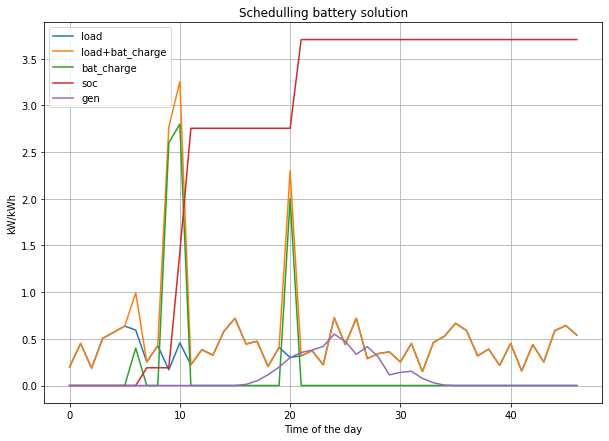

In [38]:
flex.makeplot(48,state_track[:,3],action_track,env.data[:,0],env.data[:,1],env) # O Tempo e o Env não estão a fazer nada
# makeplot(T,soc,sol,gen,load,env): Tempo, SOC, Bat_Charge, Generation, load, env

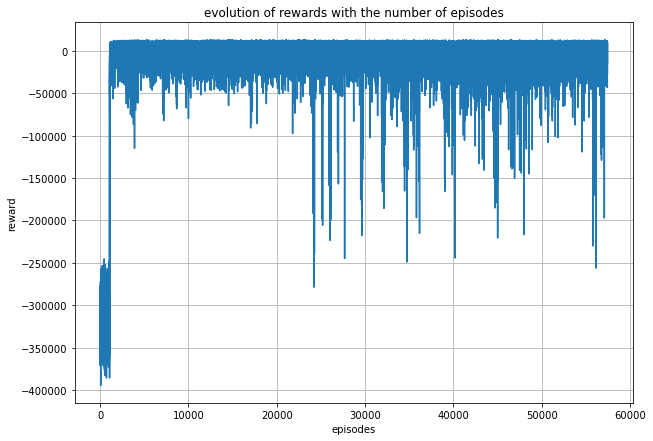

In [39]:
flex.reward_plot(env.R_Total)

In [40]:
evaluate_policy(model,env, n_eval_episodes=10)

/home/acr/anaconda3/lib/python3.9/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002
9582.600000000002


(9582.600011825562, 0.0)

# Studying the battery

In [41]:
SOC = state_track[:,3]
bat_charge = action_track # Bat_charge
gen = env.data[:,0]
load = env.data[:,1]

In [42]:
state_track

array([[ 0.00000000e+00,  0.00000000e+00,  1.97999999e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.00000000e+00,  0.00000000e+00,  4.49999988e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         3.00000000e+02,  0.00000000e+00,  3.00000000e+02],
       [ 2.00000000e+00,  0.00000000e+00,  1.86000004e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         6.00000000e+02,  0.00000000e+00,  3.00000000e+02],
       [ 3.00000000e+00,  0.00000000e+00,  5.04000008e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         9.00000000e+02,  0.00000000e+00,  3.00000000e+02],
       [ 4.00000000e+00,  0.00000000e+00,  5.69999993e-01,
         0.00000000e+00,  0.00000000e+00,  1.70000002e-01,
         1.20000000e+03,  0.00000000e+00,  3.00000000e+02],
       [ 5.00000000e+00,  0.00000000e+00,  6.35999978e-01,
         0.00000000e+00,  0.00000000e+00,  1.700000

In [43]:
def myplot(x):
    plt.figure(figsize=(10,6))
    plt.plot(x)

In [44]:
env.data

array([[0.0, 0.198],
       [0.0, 0.44999999999999996],
       [0.0, 0.186],
       [0.0, 0.504],
       [0.0, 0.5700000000000001],
       [0.0, 0.636],
       [0.0, 0.5940000000000001],
       [0.0, 0.252],
       [0.0, 0.42599999999999993],
       [0.0, 0.168],
       [0.0, 0.45599999999999996],
       [0.0, 0.22199999999999998],
       [0.0, 0.384],
       [0.0, 0.324],
       [0.0, 0.5820000000000001],
       [0.0, 0.72],
       [0.012, 0.44399999999999995],
       [0.05, 0.474],
       [0.115, 0.20400000000000001],
       [0.1975, 0.40800000000000003],
       [0.298, 0.30000000000000004],
       [0.3535, 0.318],
       [0.379, 0.372],
       [0.419, 0.22199999999999998],
       [0.551, 0.726],
       [0.4715, 0.43799999999999994],
       [0.3345, 0.72],
       [0.4165, 0.28800000000000003],
       [0.3045, 0.342],
       [0.1135, 0.36],
       [0.141, 0.252],
       [0.1525, 0.44999999999999996],
       [0.076, 0.15000000000000002],
       [0.029, 0.46199999999999997],
       [0.0

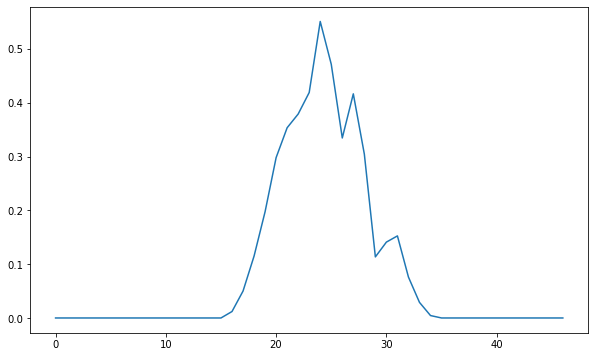

In [45]:
myplot(gen)

In [46]:
gen

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.012, 0.05, 0.115, 0.1975, 0.298, 0.3535, 0.379,
       0.419, 0.551, 0.4715, 0.3345, 0.4165, 0.3045, 0.1135, 0.141,
       0.1525, 0.076, 0.029, 0.0045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0], dtype=object)

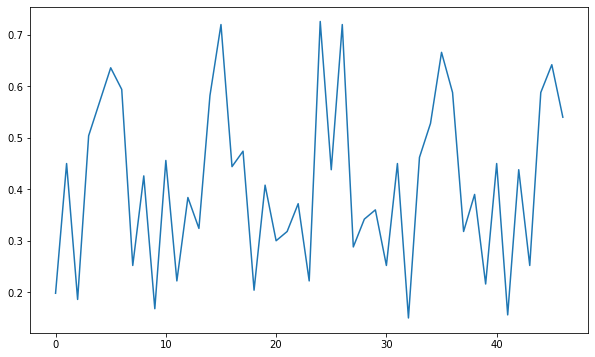

In [47]:
myplot(load)

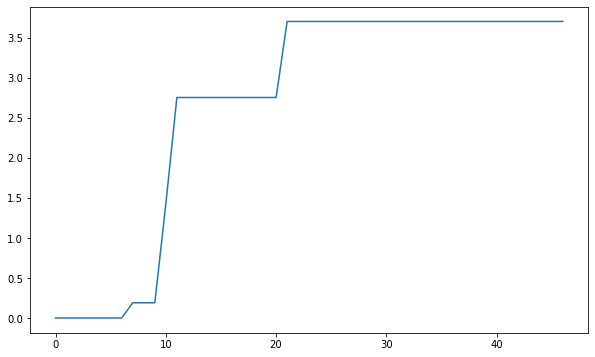

In [48]:
myplot(SOC)

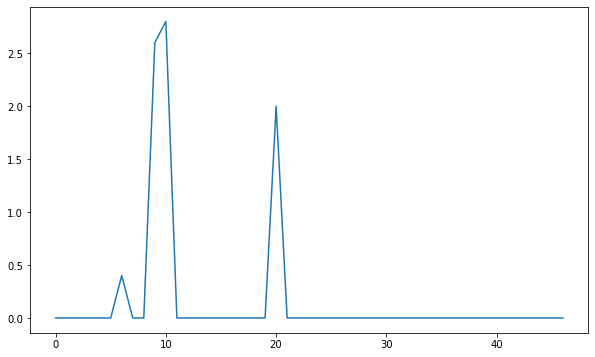

In [49]:
myplot(bat_charge)

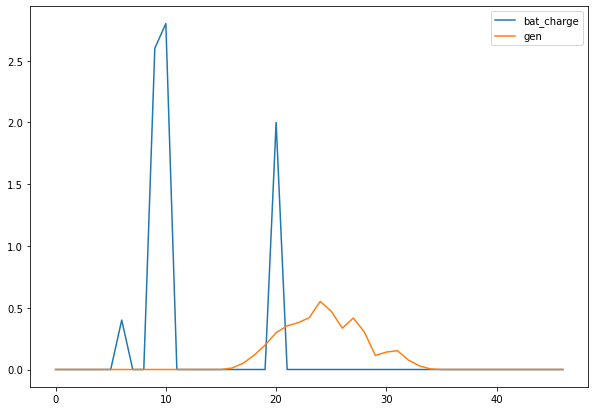

In [50]:
plt.figure(figsize=(10,7))
plt.legend
plt.plot(bat_charge,label='bat_charge')
plt.plot(gen,label='gen')
plt.legend()
plt.show()

In [51]:
eta = 0.95
dh=30*(1/60)

In [52]:
SOC

array([0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.19 , 0.19 ,
       0.19 , 1.425, 2.755, 2.755, 2.755, 2.755, 2.755, 2.755, 2.755,
       2.755, 2.755, 2.755, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705,
       3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705,
       3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705,
       3.705, 3.705], dtype=float32)

In [53]:
gen

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.012, 0.05, 0.115, 0.1975, 0.298, 0.3535, 0.379,
       0.419, 0.551, 0.4715, 0.3345, 0.4165, 0.3045, 0.1135, 0.141,
       0.1525, 0.076, 0.029, 0.0045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0], dtype=object)

In [54]:
C=np.array(bat_charge)*eta*dh
Sum=[]
Sumi = 0
for i in range(len(np.array(bat_charge)*eta*dh)):
    Sumi+= C[i]
    Sum.append(Sumi)
Sum

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.19,
 0.19,
 0.19,
 1.4249999999999998,
 2.755,
 2.755,
 2.755,
 2.755,
 2.755,
 2.755,
 2.755,
 2.755,
 2.755,
 2.755,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705,
 3.705]

In [55]:
SOC

array([0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.19 , 0.19 ,
       0.19 , 1.425, 2.755, 2.755, 2.755, 2.755, 2.755, 2.755, 2.755,
       2.755, 2.755, 2.755, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705,
       3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705,
       3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705, 3.705,
       3.705, 3.705], dtype=float32)

In [56]:
# bat_charge

In [57]:
# self.charge_lim=3
charge_lim=3

charge_steps=np.linspace(0,charge_lim,int((charge_lim/0.2)+1))
charge_steps

array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. , 2.2, 2.4,
       2.6, 2.8, 3. ])